In [2]:
import time
#Importing Libraries!
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

#Utility function!
from utils.utils import *
from data_enrichment import *

# sklearn metrics
from sklearn.preprocessing import normalize, MinMaxScaler, LabelEncoder
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score

#some external boosting libraries!
from xgboost import XGBRegressor 
import lightgbm as lgb

#Sklearn machine learning libraries!
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import StackingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor

# Helper functions!

In [3]:
def convert_log(arr):
    arr= np.log(abs(arr)+0.000001)
    return(arr)

In [4]:
def evaluate(predicted, actual):
    loss1 = mean_squared_error(actual,predicted)
    loss2 = mean_absolute_error(actual,predicted)
    loss3 = r2_score(actual,predicted)
    loss = [loss1,loss2,loss3]
    return(loss)

In [5]:
def plot_error(x, y1, y2):
    plt.figure(figsize=(15, 8))
    plt.plot(x, y1, label = "Predicted")
    plt.plot(x, y2, label = "Actual")
    plt.xlabel('Dates')
    plt.ylabel('Predicted versus Actual Values')
    plt.legend()
    return(plt)

In [6]:

def forecast(model, test_df):
    forecast = model.predict(test_df)
    return(forecast)

In [47]:
def reduce_memory_usage(df):
    df.iloc[:,4:14]=df.iloc[:,4:14].astype('float16')
    df.iloc[:,14:17]=df.iloc[:,14:17].astype('int8')
    df.iloc[:,28:38]=df.iloc[:,28:38].astype('int8')
    df.iloc[:,43:57]=df.iloc[:,43:57].astype('float16')
    df.iloc[:,57]=df.iloc[:,57].astype('int8')
    df.iloc[:,58]=df.iloc[:,58].astype('float16')
    df.iloc[:,59]=df.iloc[:,59].astype('float16')
    return(df)

In [48]:
def split_train_test_ts(df):
    # Splitting the data back to training and testing!
    no_months = 3
    startdate = min(df.date).strftime("%Y-%m-%d")
    endDate = max(df.date).strftime("%Y-%m-%d")
    
    # sorting the index to split the data based on dates
    df["Date"] = df.date
    df = df.set_index("date").sort_index()

    # creating datetime obj
    datetime_obj = datetime.strptime(endDate, "%Y-%m-%d")

    new_year = datetime_obj.year
    new_month = (datetime_obj.month - no_months) % 12
    if no_months >= datetime_obj.month:
        new_year = datetime_obj.year - 1

    # getting the start date for test data
    test_data_startdate = datetime(new_year, new_month, 1).strftime("%Y-%m-%d")

    # splitting
    df = df.rename(columns={"Date": "date"})
    X_train = df.loc[startdate:test_data_startdate, :]
    X_test = df.loc[test_data_startdate:endDate, :]

    return (X_train, X_test)

# Data enrichment!

In [49]:
def data_enricher(df):
    black_friday_data = "blackfriday.csv"
    cyber_monday_data = "cybermonday.csv"
    canada_holidays_data = "CanadaHolidays.csv"

    df_bf = pd.read_csv(black_friday_data, sep="\t")
    df_cm = pd.read_csv(cyber_monday_data, sep="\t")
    df_canh = pd.read_csv(canada_holidays_data)
    # Transforms date column of the data in proper format!
    df_bf = transform_date(df_bf)
    df_cm = transform_date(df_cm)

    # Adding feature for events i.e blackfriday, cybermonday and national holidays!
    df = add_events(df, df_bf)
    df = add_events(df, df_cm)
    df = add_events(df, df_canh)
    df = fix_format(df)
    return(df)

# Feature Engineering - 1 ( Time series )

In [50]:
def datetime_feature_engineering(df):
    df["week"]= df.date.dt.week
    df['month']=df.date.dt.month
    df['year']=df.date.dt.year
    df['day']=df.date.dt.day
    df["dayofyear"]= df.date.dt.dayofyear
    df["weekofyear"]= df.date.dt.weekofyear
    df["weekday"]= df.date.dt.weekday
    df['dayofweek']=df.date.dt.dayofweek
    df["quarter"]= df.date.dt.quarter
    df["days_in_month"]=df.date.dt.days_in_month
    df["is_month_start"]= df.date.dt.is_month_start
    df["is_month_end"] = df.date.dt.is_month_end
    df["is_quarter_end"] = df.date.dt.is_quarter_end
    df["is_year_start"]= df.date.dt.is_year_start
    df["is_leap_year"] = df.date.dt.is_leap_year
    return(df)

# Feature Engineering - 2 (More feature engineering)

In [51]:
def manual_feature_engineering(df):
    province_map={'AB':1,'BC':2,'SK':3}
    df['week_of_year_sin']= np.sin(df.weekofyear*(2.*np.pi/52))
    df['week_of_year_cos']= np.cos(df.weekofyear*(2.*np.pi/52))
    df['day_of_week_sin'] = np.sin(df.dayofweek*(2.*np.pi/7))
    df['day_of_week_cos'] = np.cos(df.dayofweek*(2.*np.pi/7))
    df['month_sin'] = np.sin((df.month-1)*(2.*np.pi/12))
    df['month_cos'] = np.cos((df.month-1)*(2.*np.pi/12))
    df['quarter_sin'] = np.sin((df.quarter-1)*(2.*np.pi/4))
    df['quarter_cos'] = np.cos((df.quarter-1)*(2.*np.pi/4))
    df['totSales_log']= np.log(abs(df.totalSales)+0.0001)
    df['day_sin']= np.sin((df.day-1)*(2.*np.pi/30))
    df['day_cos']= np.cos((df.day-1)*(2.*np.pi/30))
    df['totSales_sqrt'] = np.sqrt(abs(df.totalSales))
    df['totalalSales_inverse']= 1/(df.totalSales+1.534)
    df['province_freq_encoding']= df.province.map(df.province.value_counts())/len(df)
    df['province_label_encoding']=df.province.map(province_map)
    df['city_freq_encoding']= df.city.map(df.city.value_counts())/len(df)
    df['city_name_len']= df.city.apply(lambda x: len(x))
    return(df)

# Pre-processing before modelling!

In [52]:
def preprocess_data(df,include_weather=False):
    y=df.totalQuantity
    date=df.date
    
    if include_weather == True: #Including weather!
        df = df.drop(['date','province','city','department','totalQuantity'],axis=1)
        
    else: # Excluding Weather!
        columns_to_drop=['date','province', 'city','totalQuantity','department',
                         'temperature_min','temperature_max','precipitation',
                         'winddirection', 'windspeed', 'peakgust', 'pressure',
                         ]
        df = df.drop(columns_to_drop,axis=1)
    
    return(df,y,date)  

# Model: XGBoost

In [7]:
#Model: XGBoost!
def model_xgb(X_train,y_train):
    xgb=XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
         colsample_bynode=1, colsample_bytree=0.3, gamma=0,
         importance_type='gain', learning_rate=0.1, max_delta_step=0,
         max_depth=5, min_child_weight=1, missing=None, n_estimators=100,
         n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
         reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
         silent=None, subsample=0.5, verbosity=1)  
    xgb.fit(X_train, y_train)
    return(xgb)

#  Model : LightGBM

In [8]:
#Model: Light GBM model!
def model_lgbm(X_train,y_train,X_test,y_test):
    lgb_train = lgb.Dataset(X_train, y_train)
    lgb_eval = lgb.Dataset(X_test, y_test, reference=lgb_train)
    lightgbm_params = {'boosting_type': 'gbdt', 
         'colsample_bytree': 0.30, 
         'learning_rate': 0.08, 
         'n_estimators': 100, 
         'num_leaves': 2, 
         'reg_alpha': 0.5, 
         'reg_lambda': 0, 
         'subsample': 0.5,
          'max_depth':4}
    lgbm = lgb.train(lightgbm_params,lgb_train,num_boost_round=30,valid_sets=lgb_eval)
    return(lgbm)


# Model : Stacked Model

In [9]:
def StackedModel(X_train,y_train):
    xgb=XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
         colsample_bynode=1, colsample_bytree=0.3, gamma=0,
         importance_type='gain', learning_rate=0.1, max_delta_step=0,
         max_depth=4, min_child_weight=1, missing=None, n_estimators=100,
         n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
         reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
         silent=None, subsample=0.5, verbosity=1) 
    
    estimators = [
      ('rfr', RandomForestRegressor()), 
      ('etr', ExtraTreesRegressor()),
      ('ada', AdaBoostRegressor()),
      ('gbt', GradientBoostingRegressor())
       ]

    st= StackingRegressor(estimators=estimators,
                          final_estimator=xgb)
    st.fit(X_train,y_train)
    return(st)

# Core : Model fitting and evaluation!

In [16]:
# for each city, take one department. measure some threshold. After that model it and save it
def make_city_dept_models(train, test, ModelName, include_weather):
    
    # get cities
    cities_list = train["city"].unique()
    # get department list
    department_list = train["department"].unique()

    all_metrics = []

    for city in cities_list:

        for dept in department_list:
            
            filtered_train_df = train[(train["city"] == city)
                                    & (train["department"] == dept)]
            
            filtered_test_df = test[(test["city"] == city)
                                      & (test["department"] == dept)]
            
            # define a threshold
            if len(filtered_train_df) >= 1000 and len(filtered_test_df) > 10:
                
                # Preprocessing!
                X_train,y_train, dt= preprocess_data(filtered_train_df,include_weather)
                X_test, y_test, dt =preprocess_data(filtered_test_df,include_weather)

                
                # Path to save model!
                filename = city.replace(' ','_')
        
                # Without weather!
                if ModelName=='xgb' and include_weather==False:
                    path='models/department_level/without_weather/xgb/'+filename+"_xgb.pkl"
            
                elif ModelName=='lgbm'  and include_weather==False:
                    path='models/department_level/without_weather/lgbm/'+filename+"_lgbm.pkl"
            
                elif ModelName=='st'  and include_weather==False:
                    path='models/department_level/without_weather/st/'+filename+"_st.pkl"
            
            
                # With Weather!
                elif  ModelName=='xgb' and include_weather==True:
                    path='models/department_level/weather/xgb/'+filename+"_xgb.pkl"
                
                elif  ModelName=='lgbm' and include_weather==True:
                    path='models/department_level/weather/lgbm/'+filename+"_lgbm.pkl"
                
                elif  ModelName=='st' and include_weather==True:
                     path='models/department_level/weather/st/'+filename+"_st.pkl"


                        
                # forecast future
                if(X_test.shape[0]):
                    #to time the model training!
                    start_time = time.time()
            
                    if ModelName=='lgbm':
                        reg = model_lgbm(X_train,y_train,X_test,y_test)  #For LGBM
                    elif ModelName=='xgb':
                        reg = model_xgb(X_train,y_train) 
                    elif ModelName =='st':
                        reg= StackedModel(X_train,y_train)
                
                
                    #Adding time elapsed!
                    end_time=round(time.time() - start_time, 2) 
                    
                    # Saving the Model!    
                    save_model(reg, path)
    
                    # Forecasting on testing set!
                    future = forecast(reg, X_test)
    
                    # evaluate the model performance
                    #List of three losses RMSE, MAE, R2!
                    loss = evaluate(future,y_test) 
                    # Adding City!
                    loss.append(city) 
                    #Adding Department!
                    loss.append(dept)
            
                    loss.append(end_time)
                    all_metrics.append(loss)
            
                    #Printing RMSE with the plot for checking!
                    print("RMSE loss for %s %s= %.3f" % (city, dept,loss[0]))
            
                    # plot performance - predicted versus actual
                    fig = plot_error(dt,future,y_test)
                    fig.show()
            else:
                print("No records to test for %s city %s" %(city,dept))
        
    return(all_metrics)       

# Main : Pipelining!

In [17]:
df = pd.read_csv('department_level.csv')
df = df[df.department!='0.0']
df.date = pd.to_datetime(df.date)
df = data_enricher(df)
df = datetime_feature_engineering(df)
df = manual_feature_engineering(df)
df= reduce_memory_usage(df)
train,test = split_train_test_ts(df)

# Total Quantity - Modeling without weather!

# Model 1: XGBoost

In [ ]:
XGB= make_city_dept_models(train,test,'xgb',False)

In [27]:
columns=['RMSE_xgb','MAE_xgb','R2_xgb','city','department','time_xgb']
df_xgb= pd.DataFrame(XGB,columns=columns)

In [29]:
df_xgb[['RMSE_xgb','MAE_xgb','R2_xgb','time_xgb']].mean()

RMSE_xgb    0.078672
MAE_xgb     0.125914
R2_xgb      0.571281
time_xgb    0.873478
dtype: float64

# Model 2: LightGBM

In [ ]:
LGBM = make_city_dept_models(train,test,'lgbm',False)

In [31]:
columns=['RMSE_lgbm','MAE_lgbm','R2_lgbm','city','department','time_lgbm']
df_lgbm= pd.DataFrame(LGBM,columns=columns)

In [32]:
df_lgbm[['RMSE_lgbm','MAE_lgbm','R2_lgbm','time_lgbm']].mean()

RMSE_lgbm    0.084913
MAE_lgbm     0.134707
R2_lgbm      0.556853
time_lgbm    0.073602
dtype: float64

# Model 3: Stacked Ensemble!

[13:18:01] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for medicine hat department3= 0.077


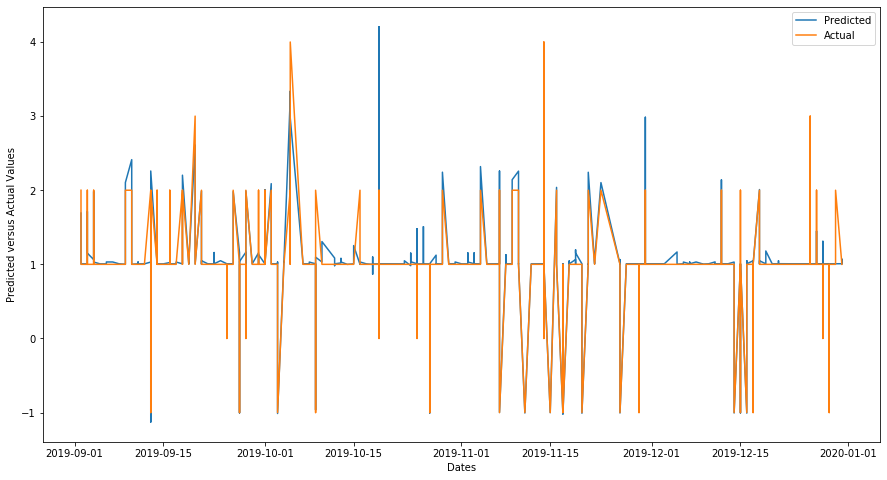

[13:21:05] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for medicine hat department2= 0.130


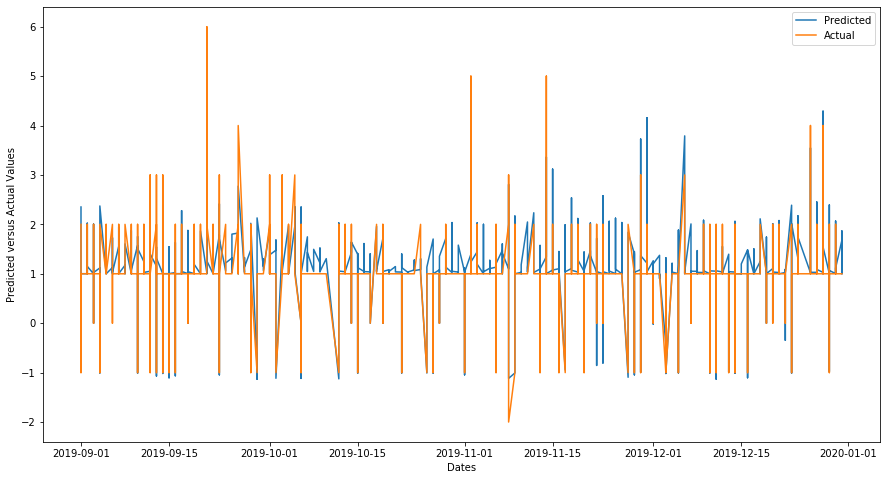

No records to test for medicine hat city department5
[13:21:31] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for medicine hat department4= 0.045


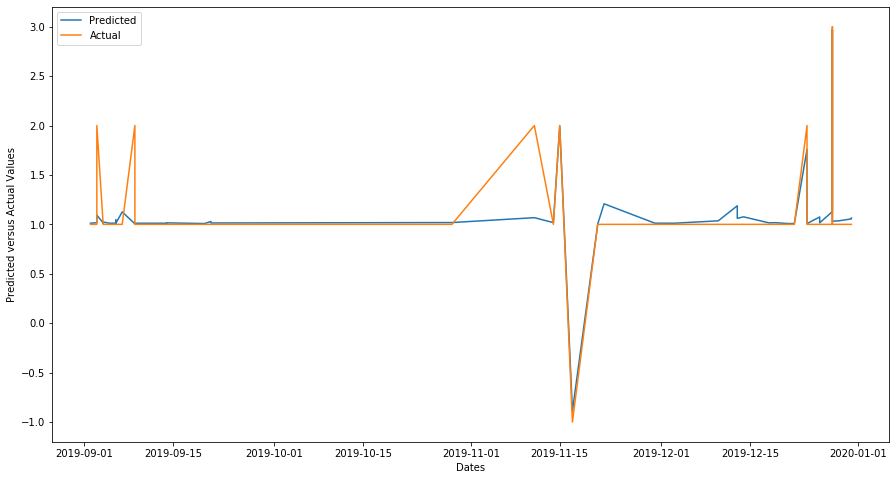

[13:22:09] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for medicine hat department1= 0.054


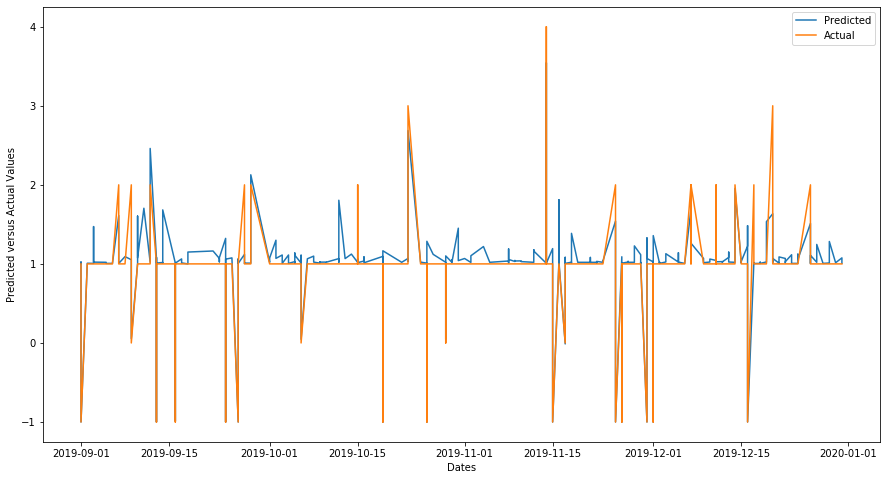

[13:22:24] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for medicine hat department11= 0.192


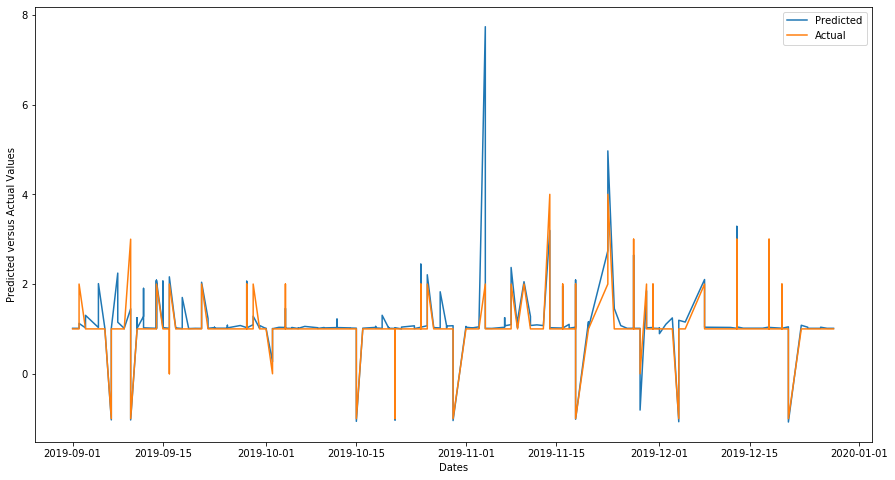

[13:22:43] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for medicine hat department12= 0.015


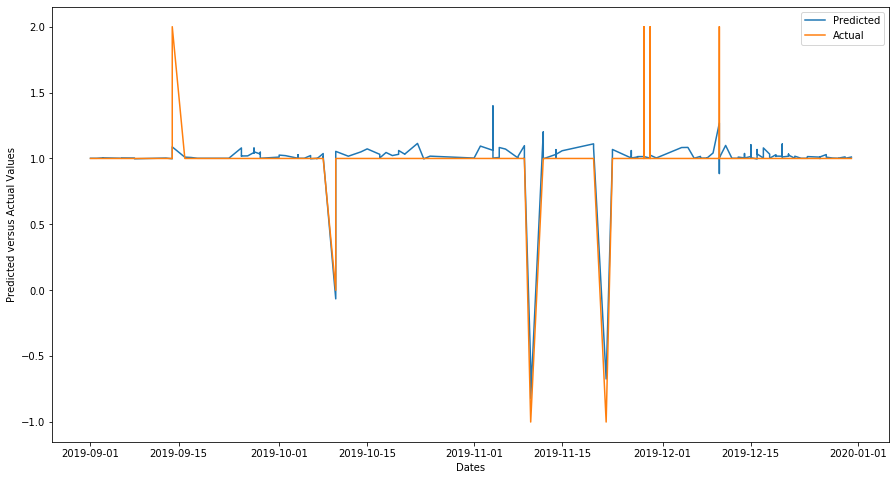

No records to test for medicine hat city department13
No records to test for medicine hat city department7
No records to test for medicine hat city department8
No records to test for medicine hat city department9
No records to test for medicine hat city department10
[13:23:09] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for yorkton department3= 0.048


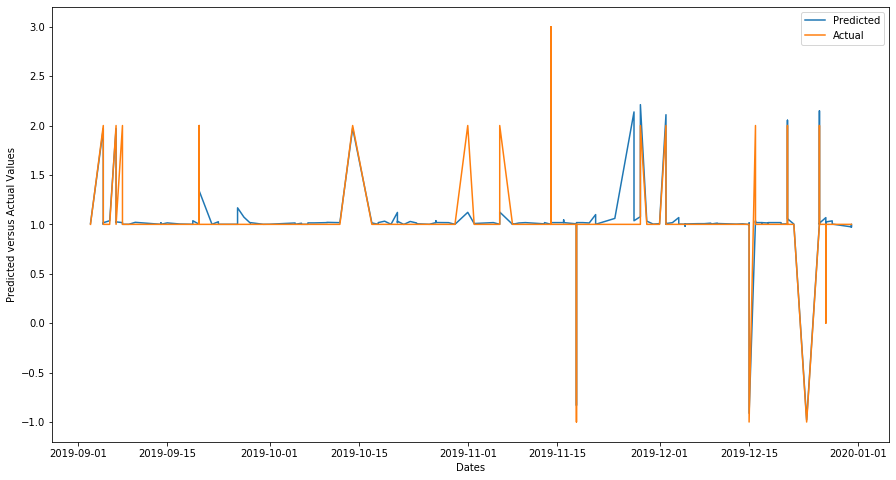

[13:24:39] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for yorkton department2= 0.078


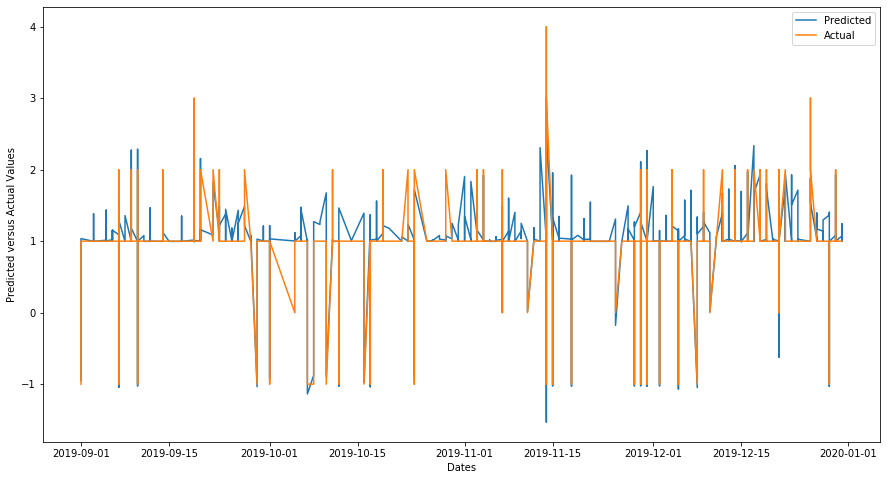

No records to test for yorkton city department5
[13:24:55] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for yorkton department4= 0.097


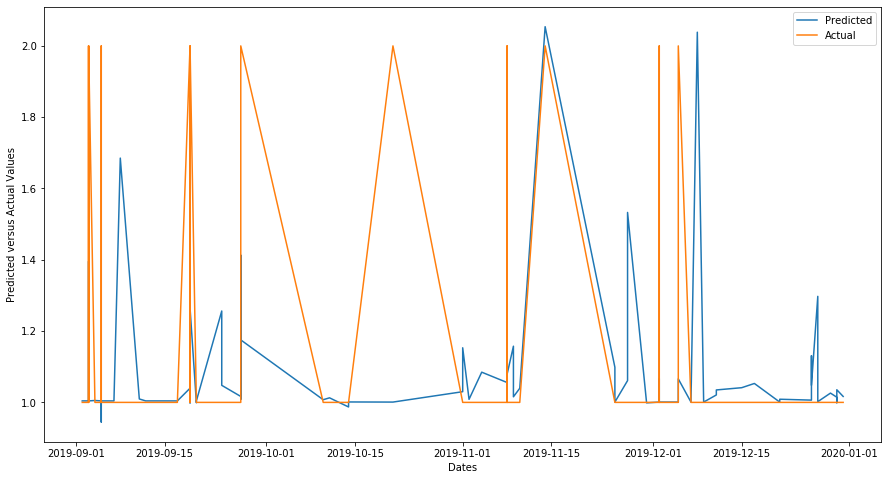

[13:25:13] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for yorkton department1= 0.033


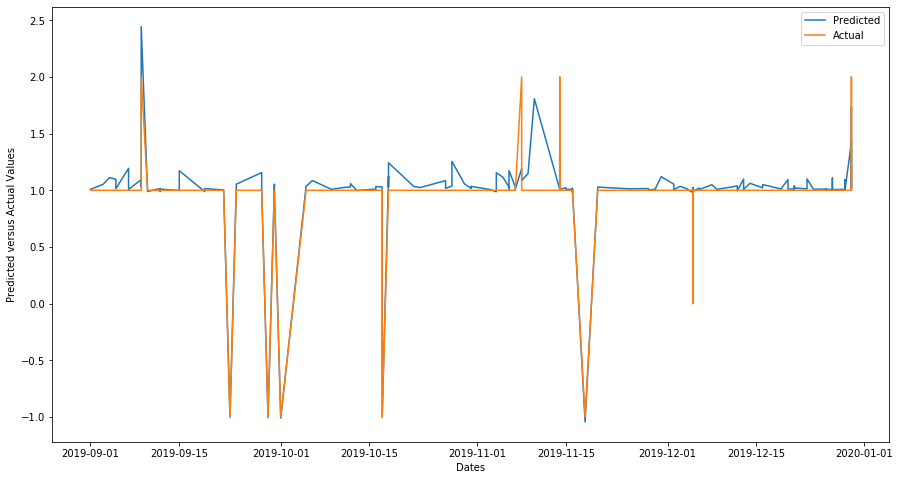

[13:25:23] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for yorkton department11= 0.089


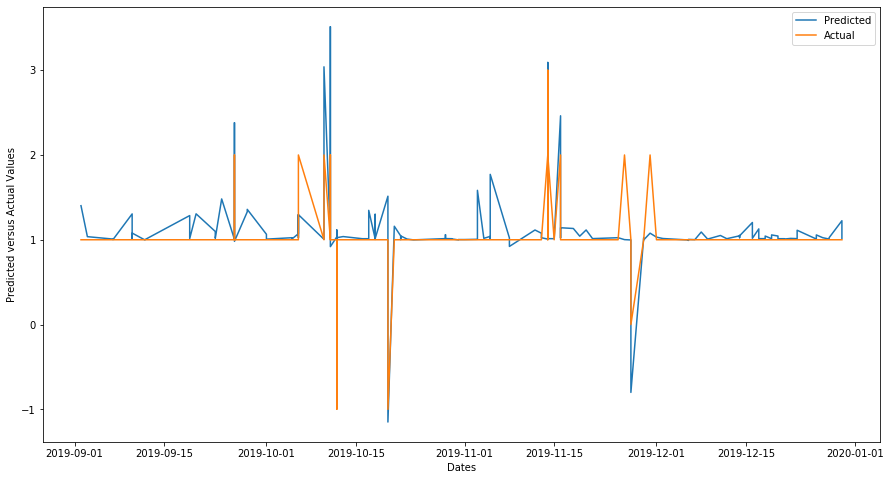

[13:25:33] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for yorkton department12= 0.001


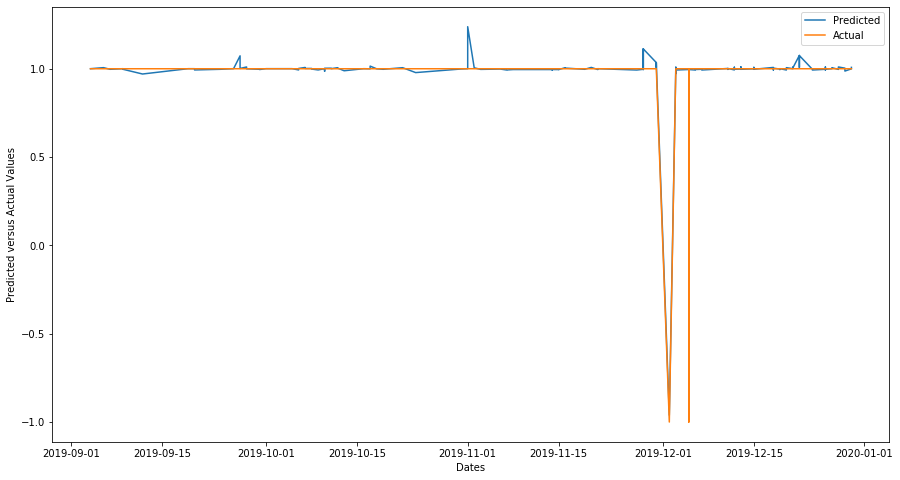

No records to test for yorkton city department13
No records to test for yorkton city department7
No records to test for yorkton city department8
No records to test for yorkton city department9
No records to test for yorkton city department10
[13:27:15] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kamloops department3= 0.095


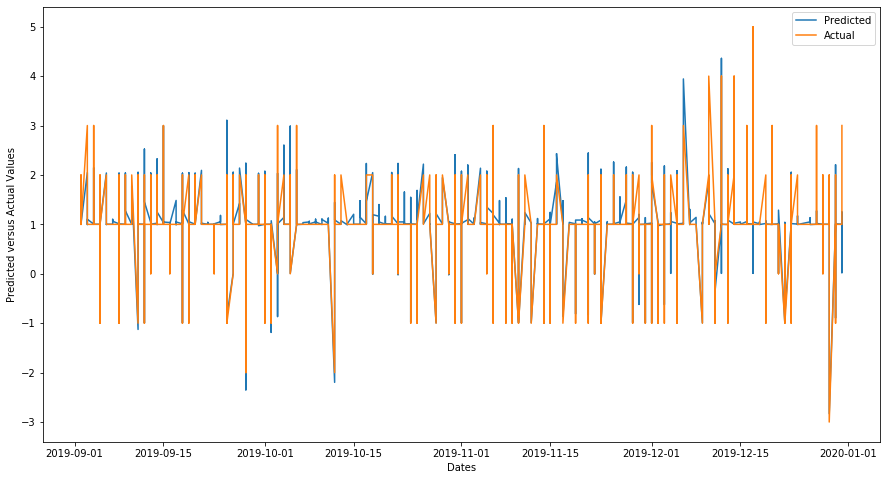

[13:33:23] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kamloops department2= 0.167


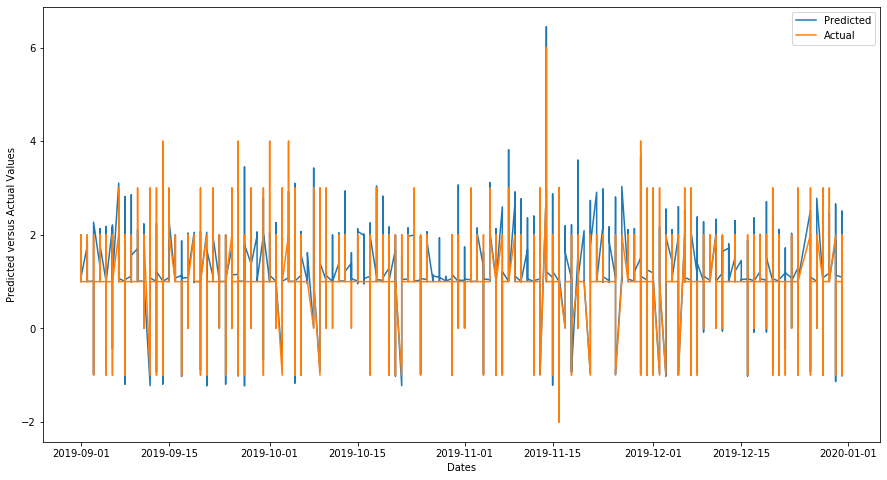

[13:33:31] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kamloops department5= 0.079


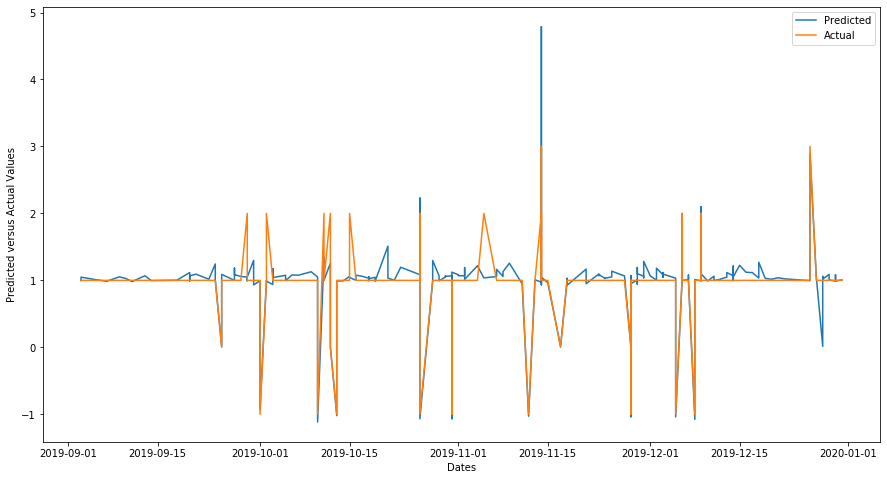

[13:34:15] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kamloops department4= 0.145


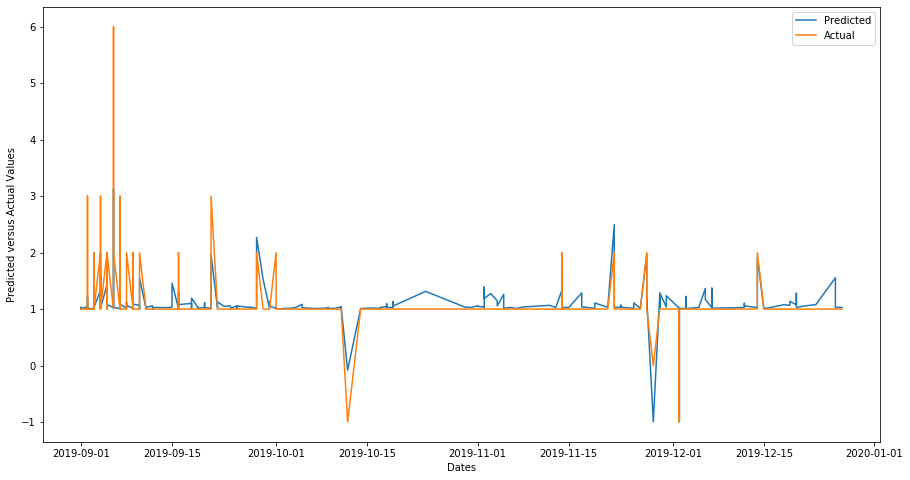

[13:35:20] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kamloops department1= 0.087


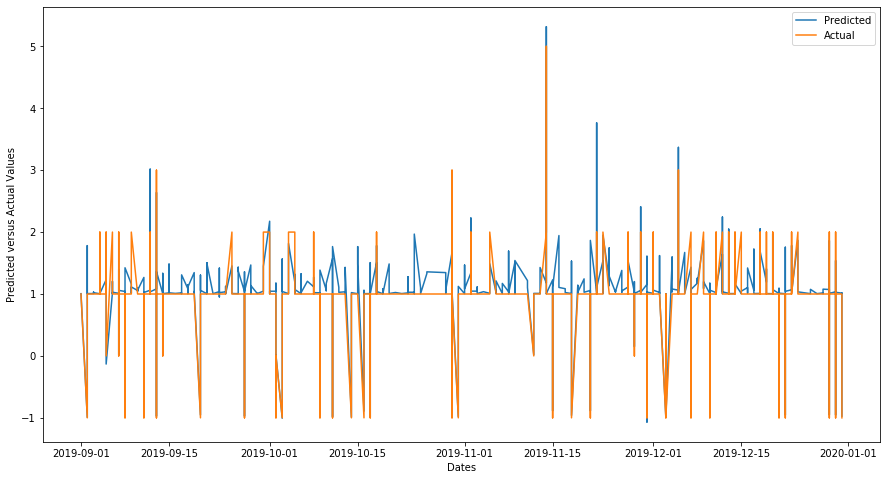

[13:35:51] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kamloops department11= 0.139


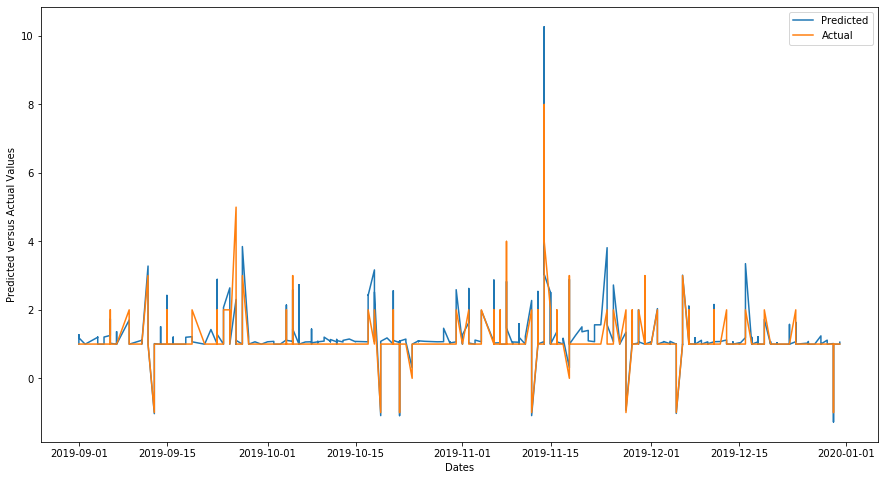

[13:36:36] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kamloops department12= 0.030


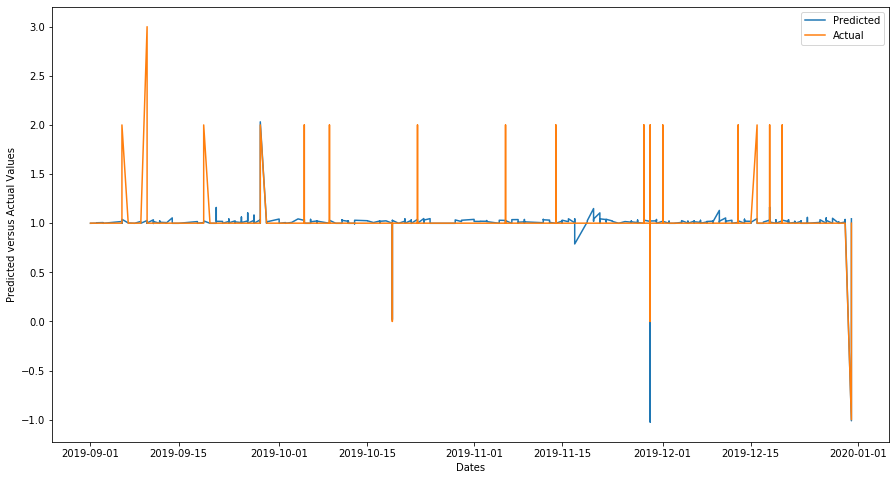

No records to test for kamloops city department13
No records to test for kamloops city department7
No records to test for kamloops city department8
No records to test for kamloops city department9
No records to test for kamloops city department10
[13:37:34] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for lethbridge department3= 0.051


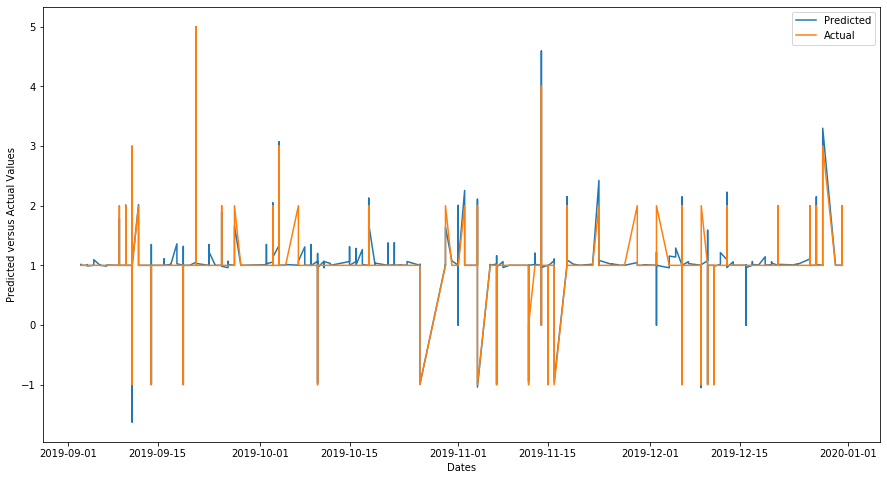

[13:40:39] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for lethbridge department2= 0.126


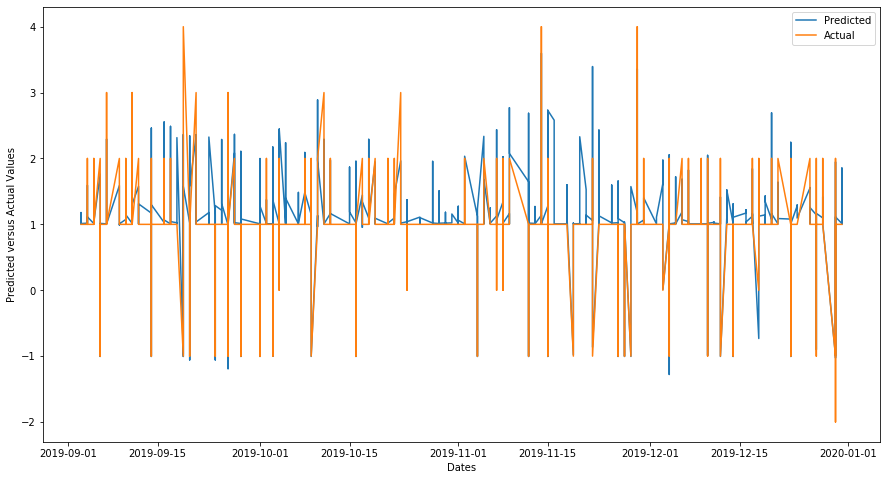

No records to test for lethbridge city department5
[13:41:06] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for lethbridge department4= 0.088


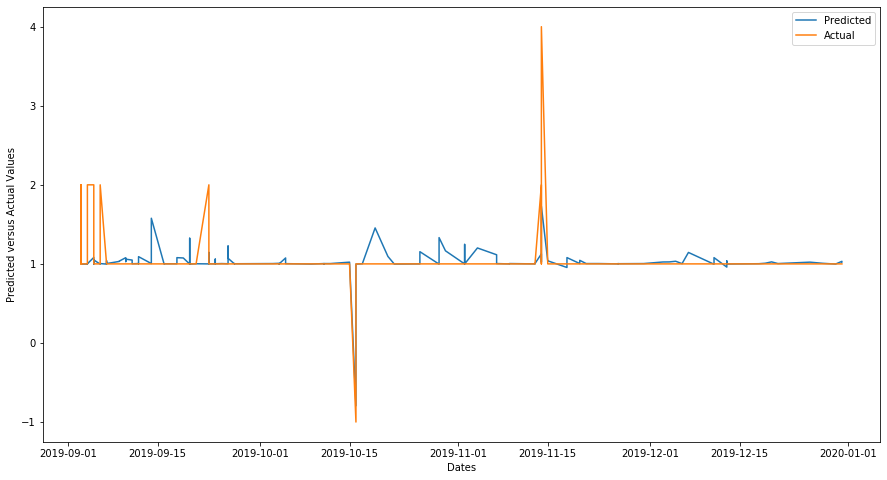

[13:41:44] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for lethbridge department1= 0.047


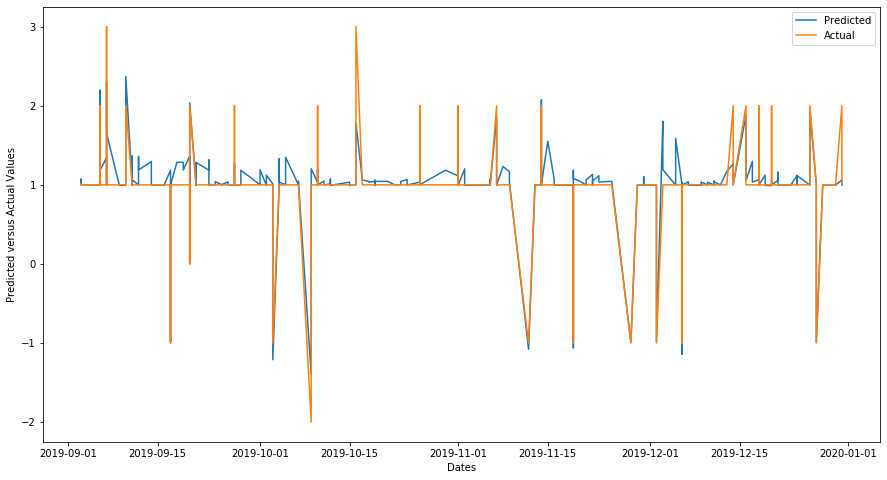

[13:41:58] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for lethbridge department11= 0.101


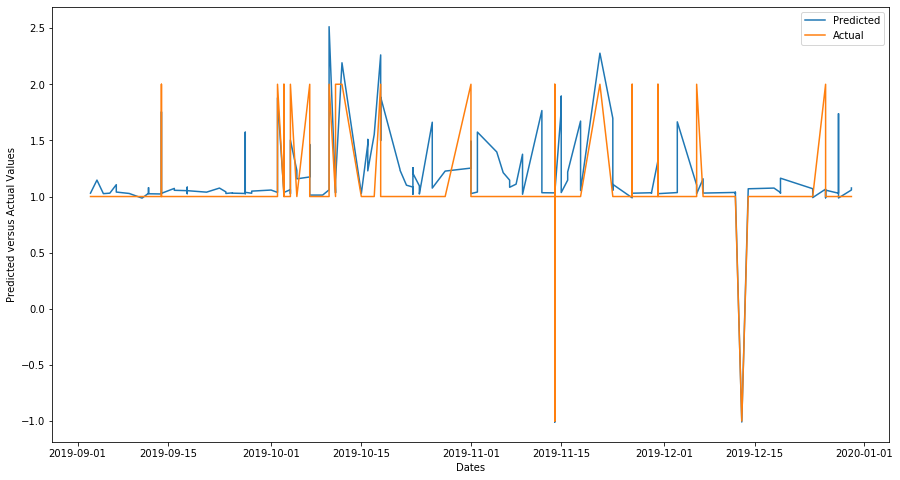

[13:42:19] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for lethbridge department12= 0.022


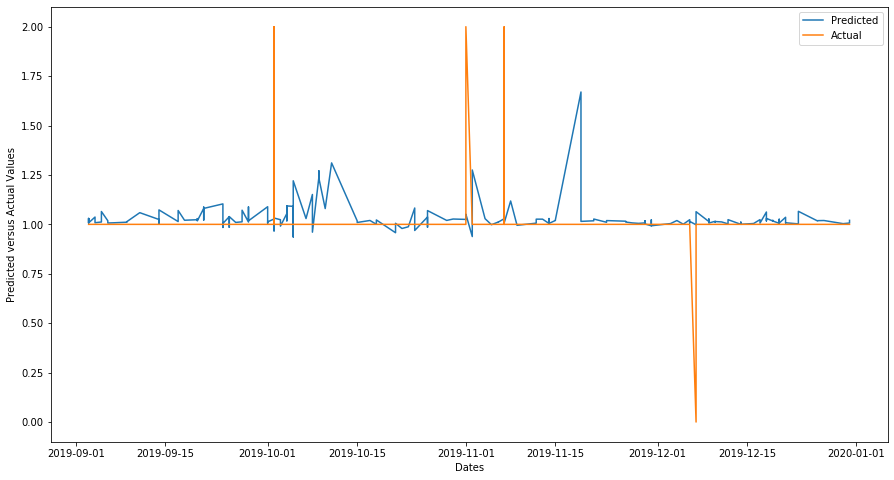

No records to test for lethbridge city department13
No records to test for lethbridge city department7
No records to test for lethbridge city department8
No records to test for lethbridge city department9
No records to test for lethbridge city department10
[13:42:58] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for red deer department3= 0.044


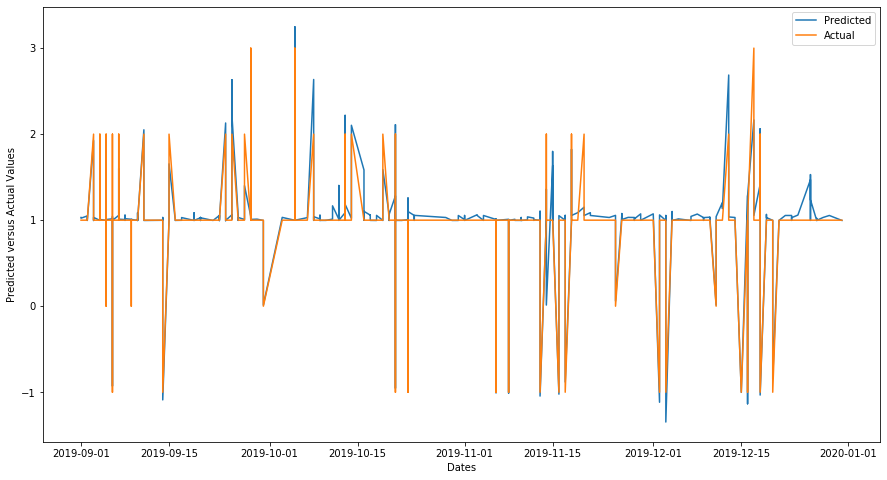

[13:45:23] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for red deer department2= 0.146


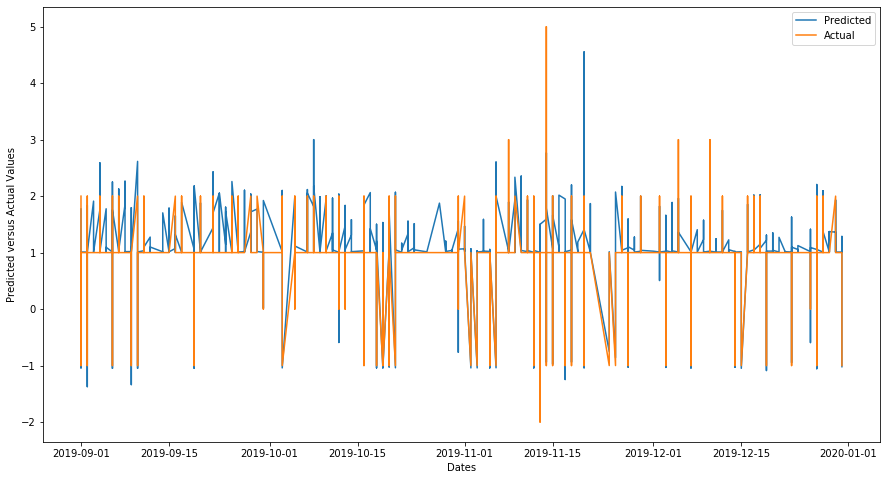

No records to test for red deer city department5
[13:45:46] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for red deer department4= 0.084


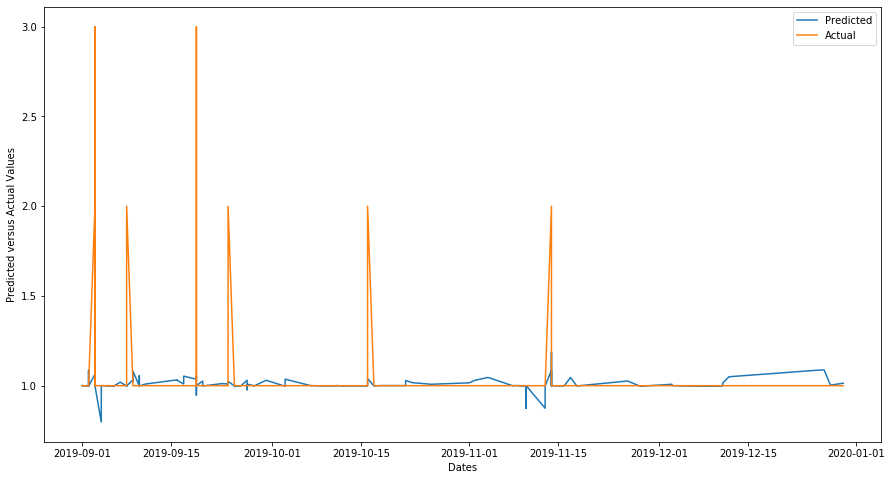

[13:46:14] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for red deer department1= 0.039


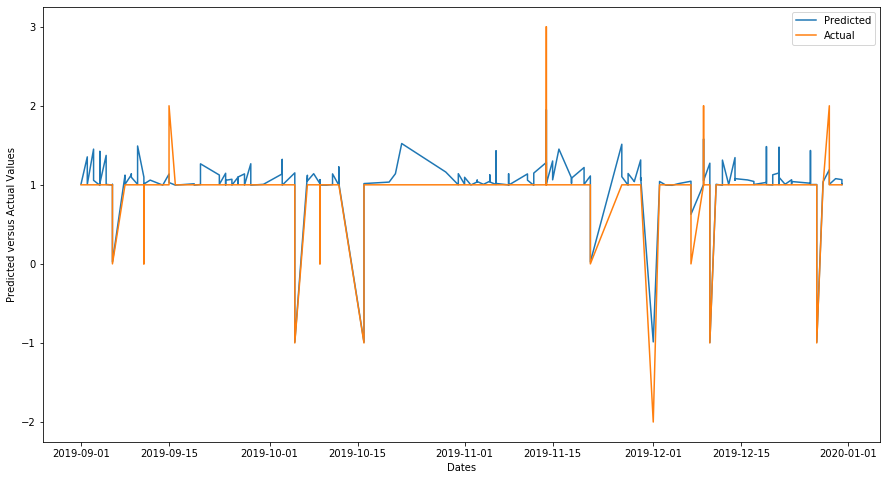

[13:46:25] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for red deer department11= 0.096


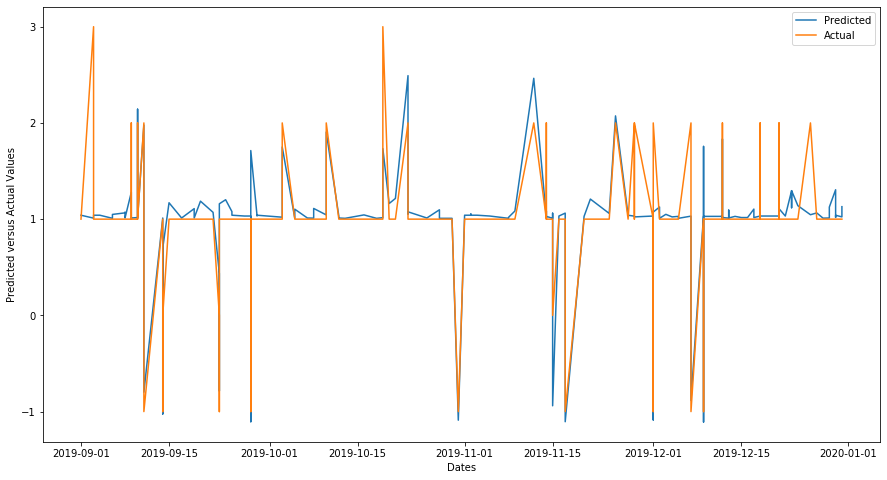

[13:46:38] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for red deer department12= 0.021


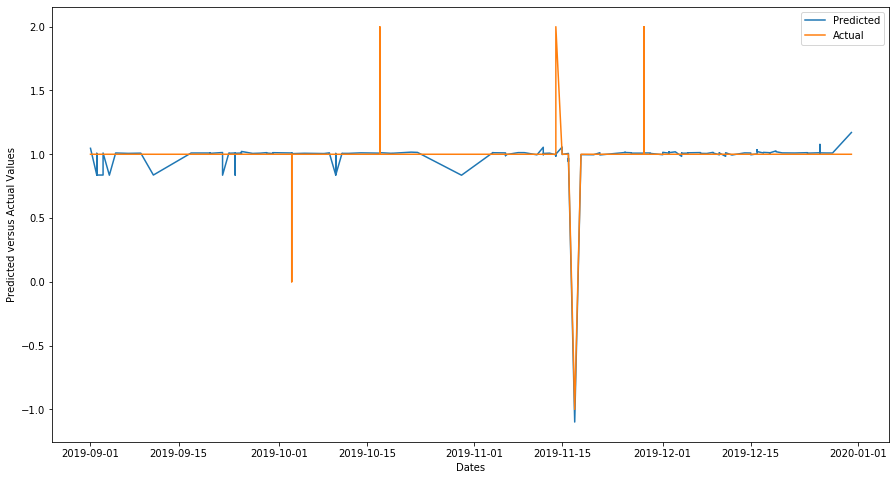

No records to test for red deer city department13
No records to test for red deer city department7
No records to test for red deer city department8
No records to test for red deer city department9
No records to test for red deer city department10
[13:49:49] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for regina department3= 0.109


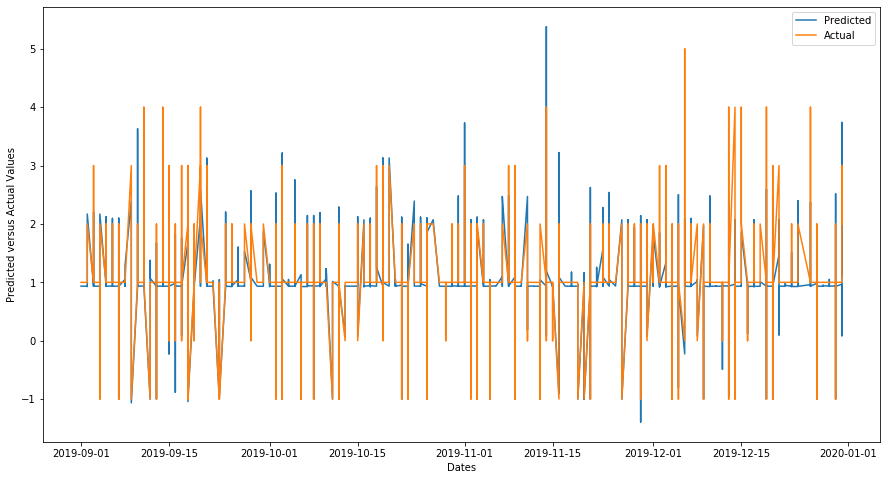

[14:05:20] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for regina department2= 0.163


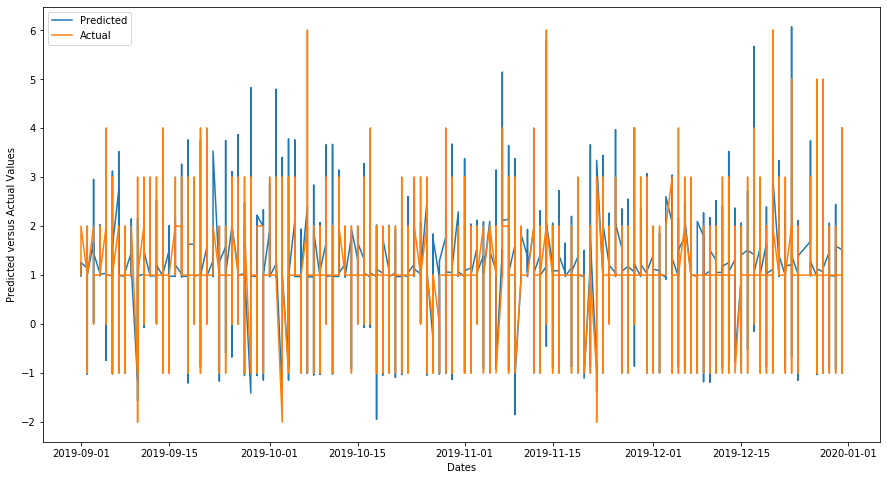

[14:05:41] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for regina department5= 0.076


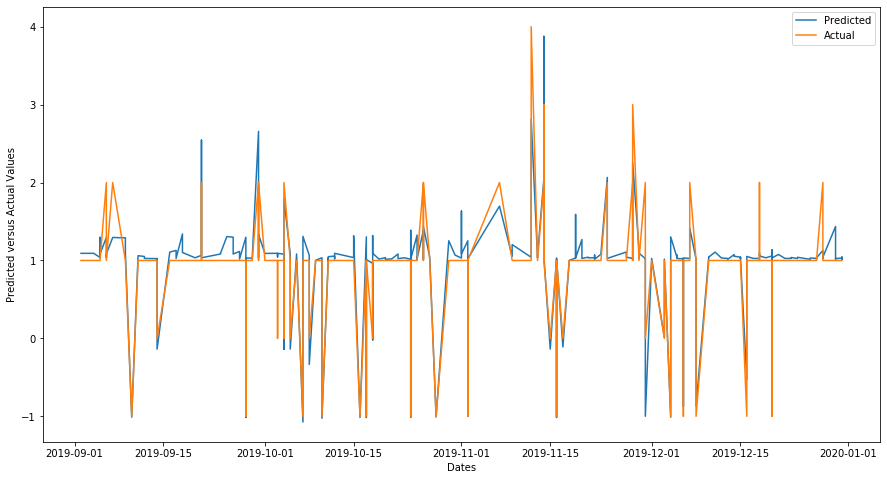

[14:08:08] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for regina department4= 0.111


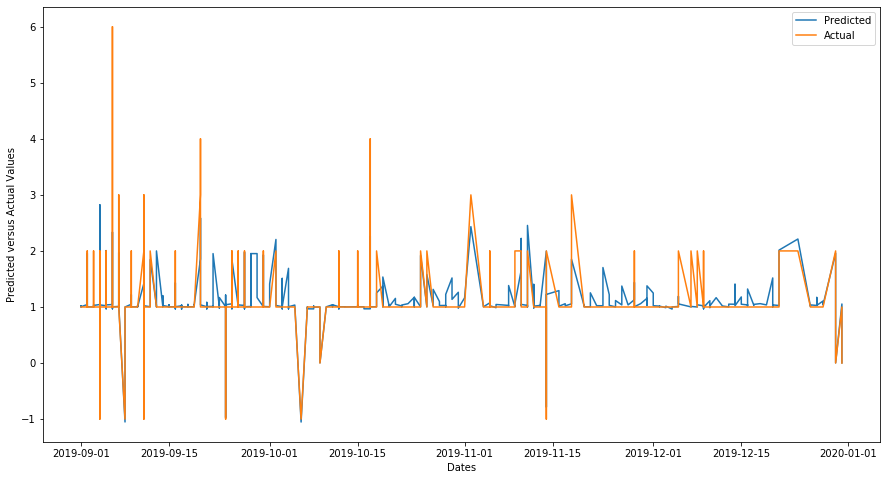

[14:11:28] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for regina department1= 0.116


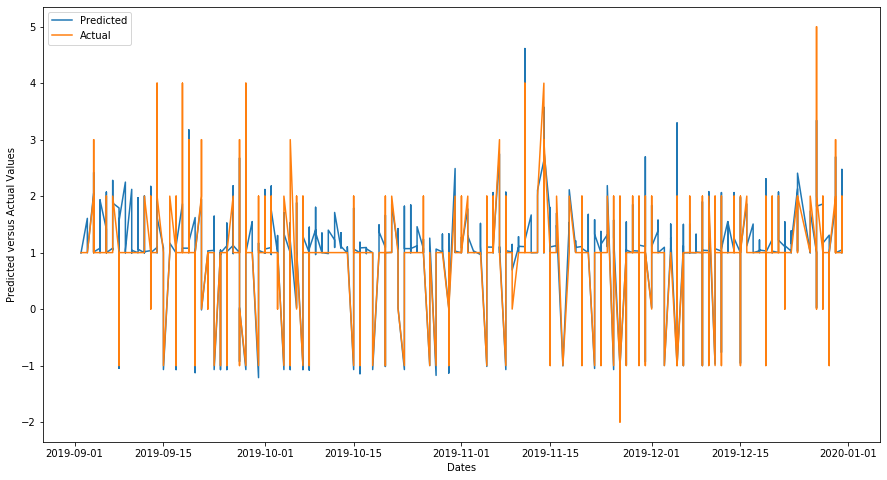

[14:12:52] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for regina department11= 0.169


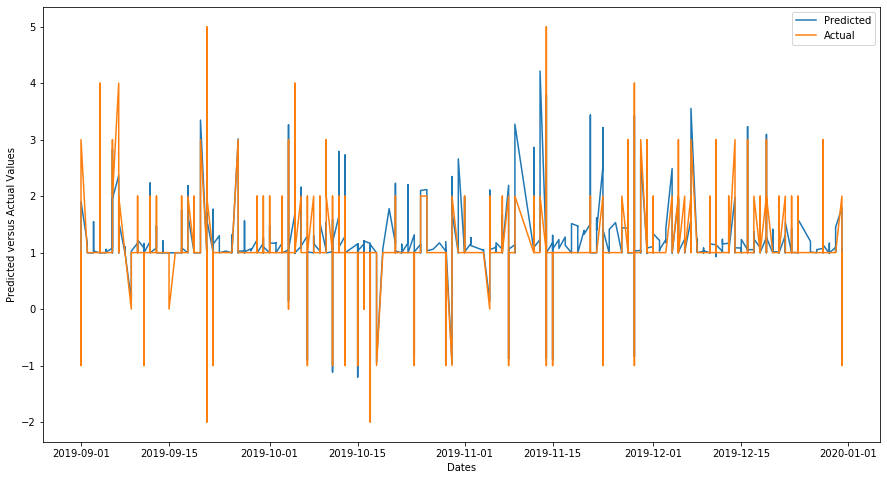

[14:15:14] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for regina department12= 0.015


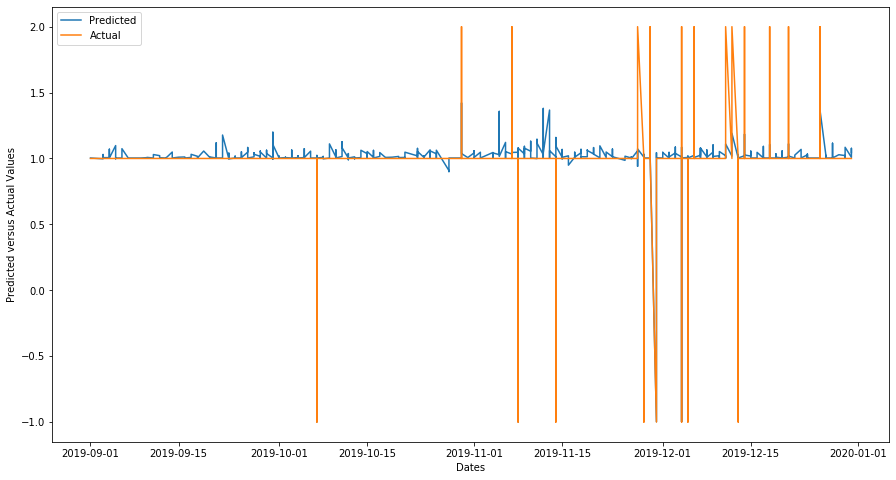

No records to test for regina city department13
No records to test for regina city department7
No records to test for regina city department8
No records to test for regina city department9
No records to test for regina city department10
[14:17:14] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for saskatoon department3= 0.079


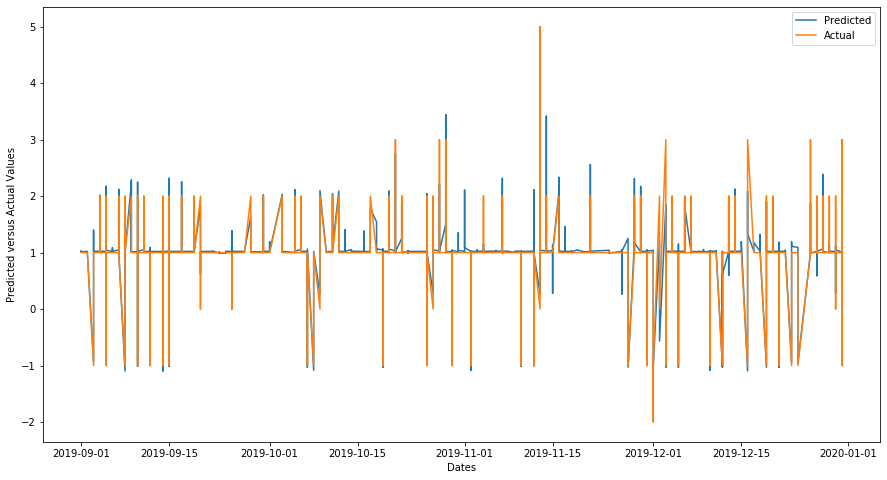

[14:24:52] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for saskatoon department2= 0.145


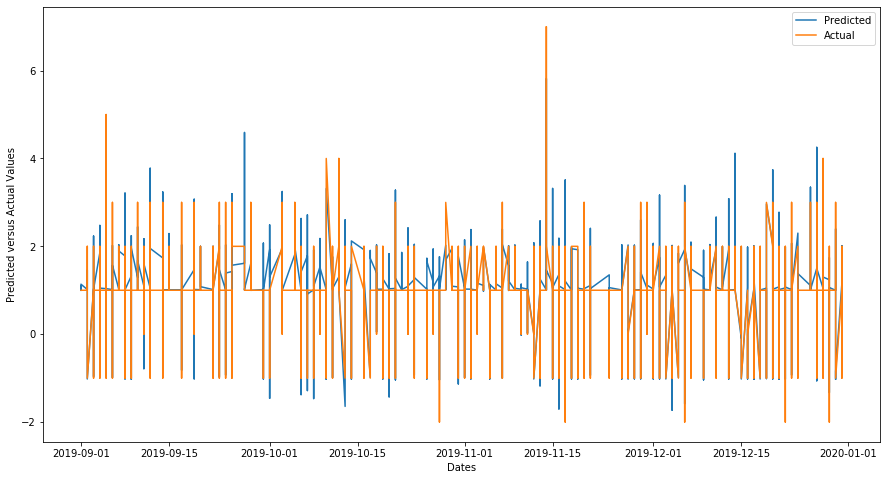

No records to test for saskatoon city department5
[14:26:12] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for saskatoon department4= 0.063


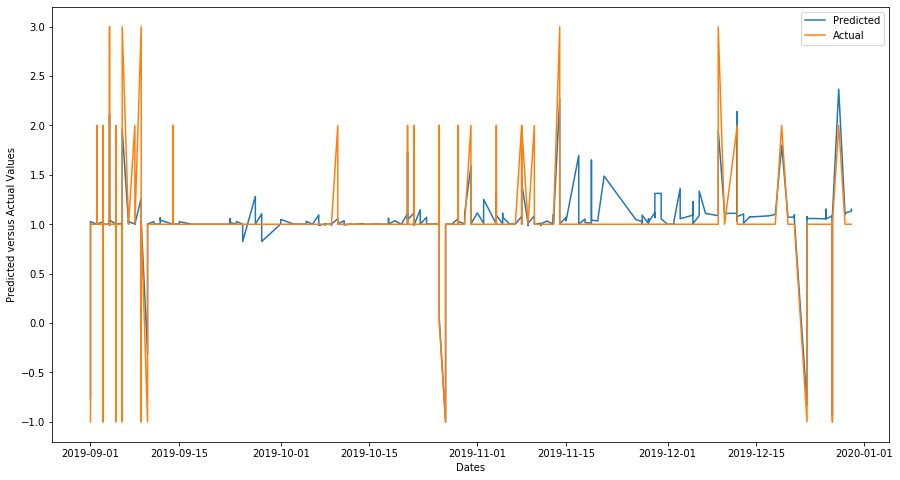

[14:27:14] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for saskatoon department1= 0.066


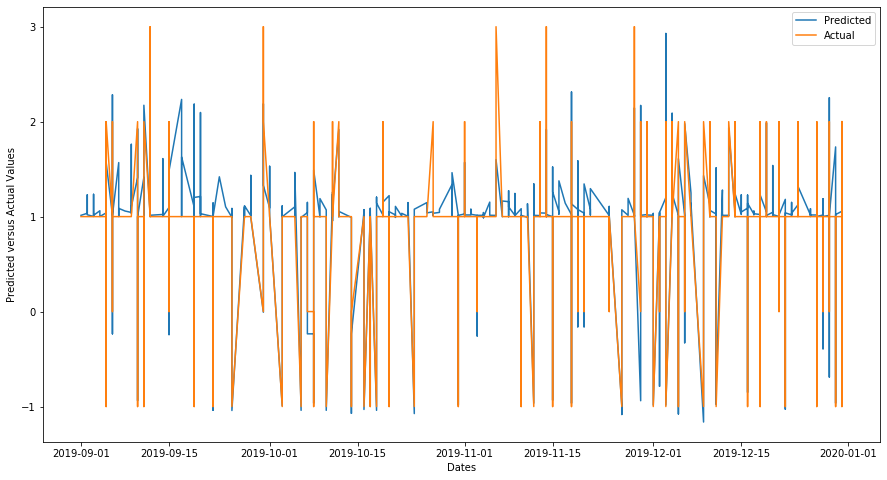

[14:27:39] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for saskatoon department11= 0.121


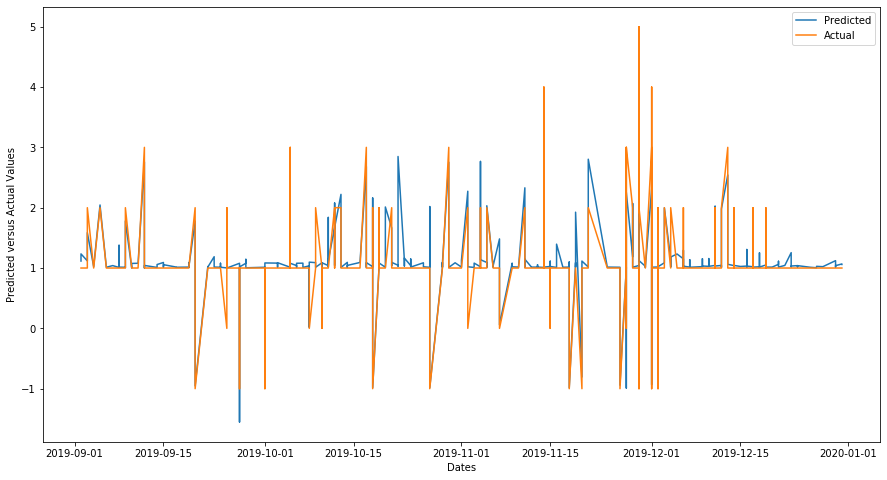

[14:28:06] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for saskatoon department12= 0.015


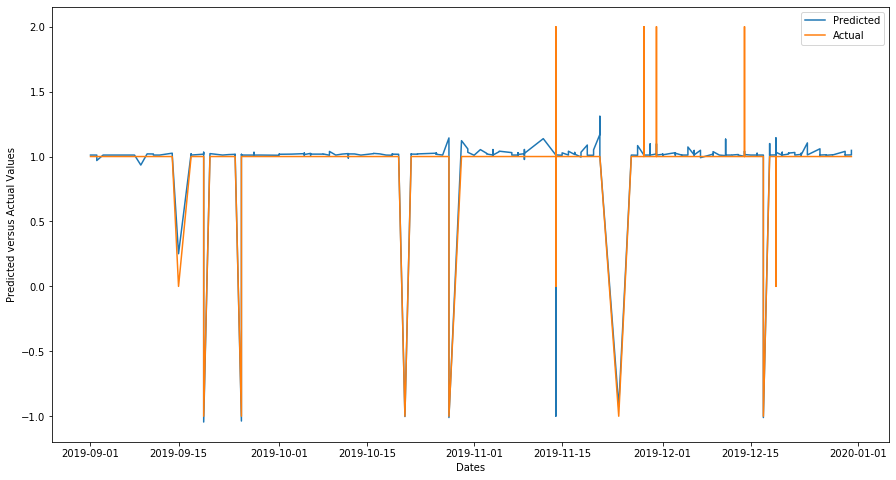

No records to test for saskatoon city department13
No records to test for saskatoon city department7
No records to test for saskatoon city department8
No records to test for saskatoon city department9
No records to test for saskatoon city department10
[14:29:44] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kelowna department3= 0.078


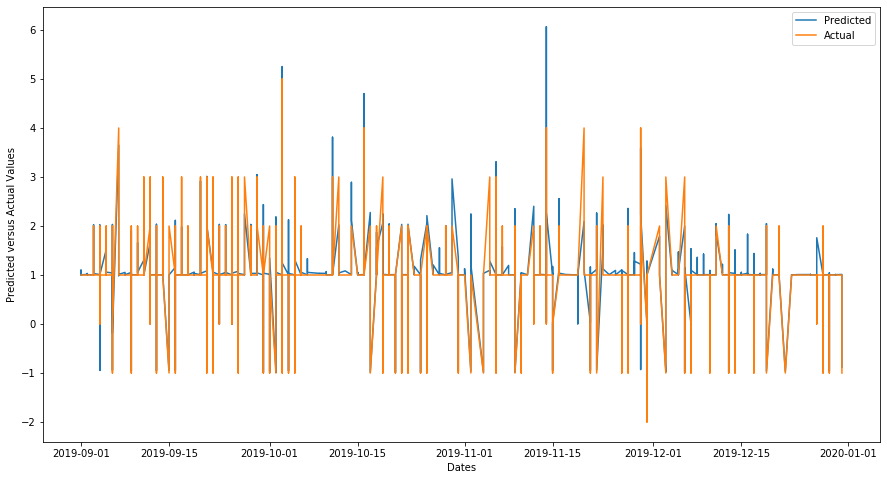

[14:34:46] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kelowna department2= 0.164


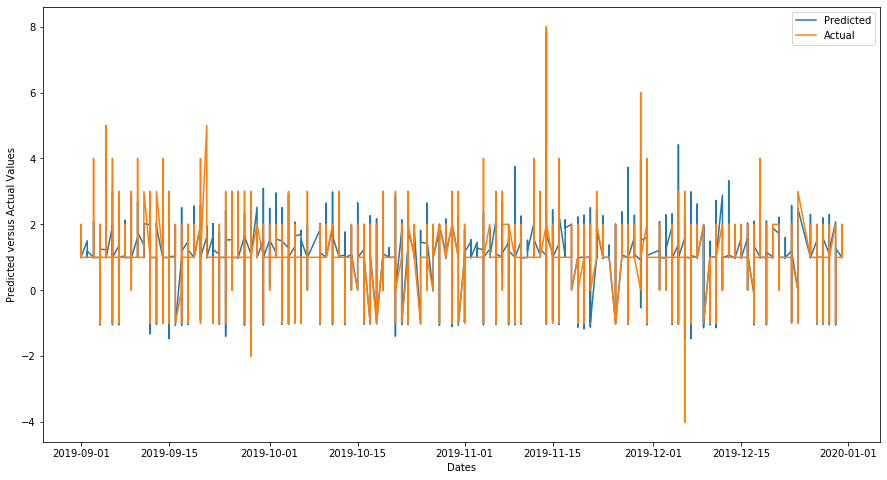

No records to test for kelowna city department5
[14:35:25] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kelowna department4= 0.120


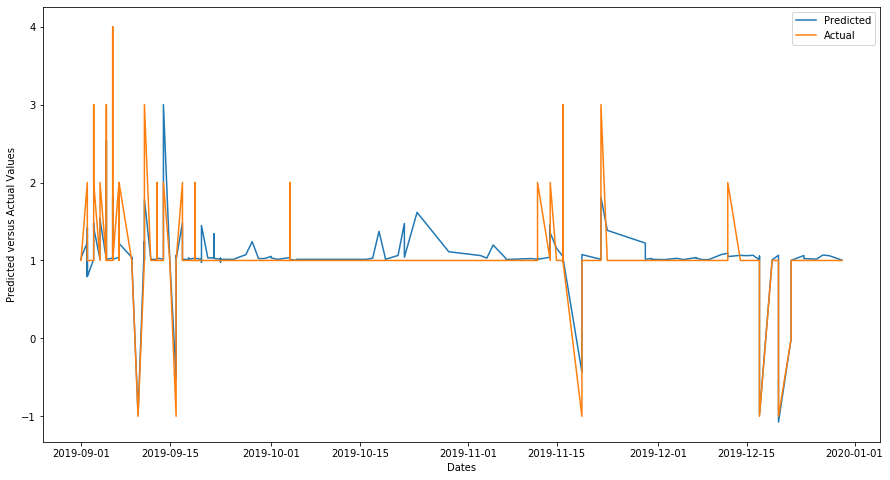

[14:36:25] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kelowna department1= 0.083


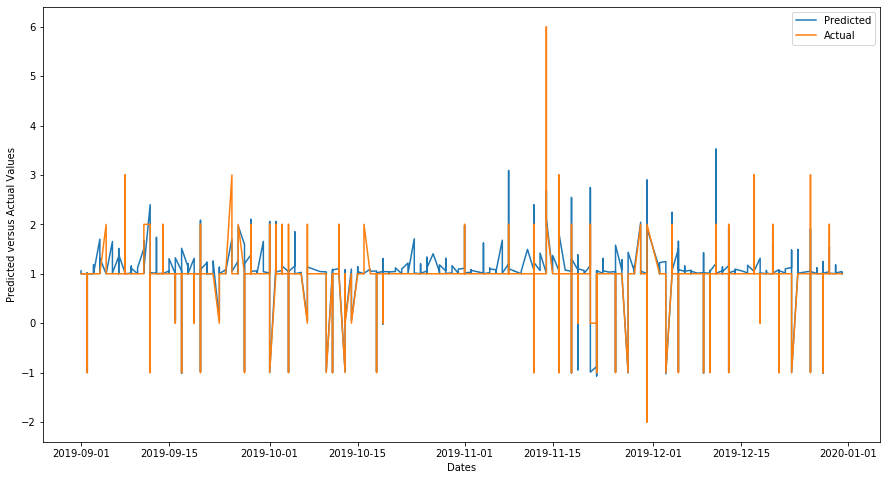

[14:36:47] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kelowna department11= 0.157


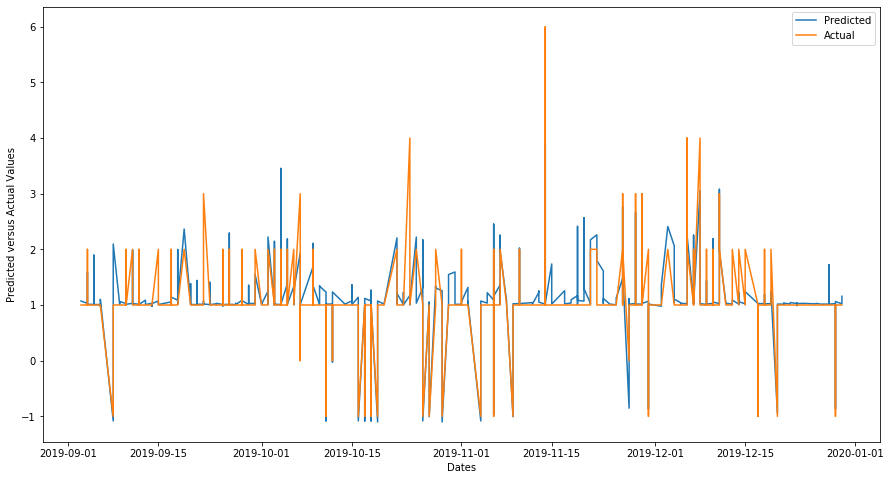

[14:37:21] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kelowna department12= 0.071


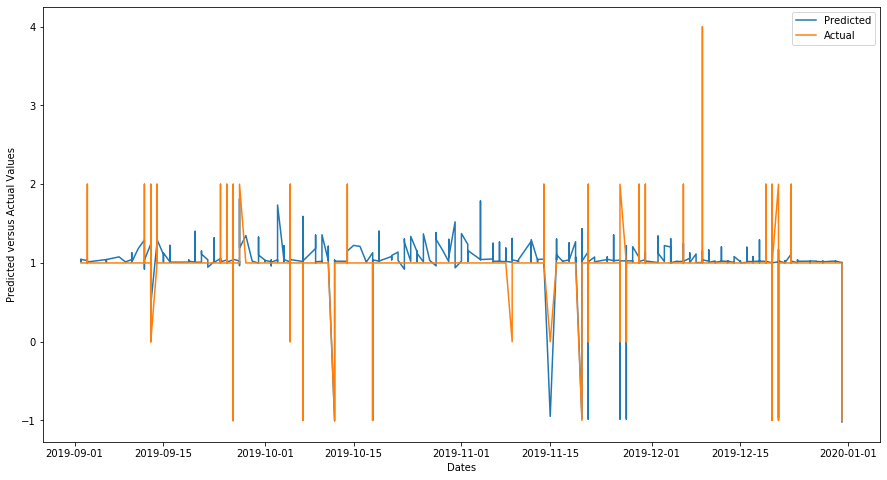

No records to test for kelowna city department13
No records to test for kelowna city department7
No records to test for kelowna city department8
No records to test for kelowna city department9
No records to test for kelowna city department10
[14:39:08] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for stettler department3= 0.093


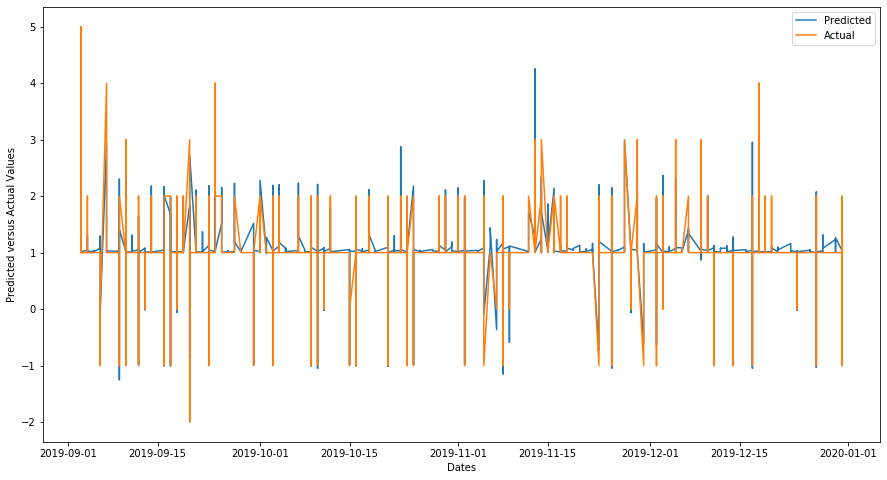

[14:43:43] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for stettler department2= 0.128


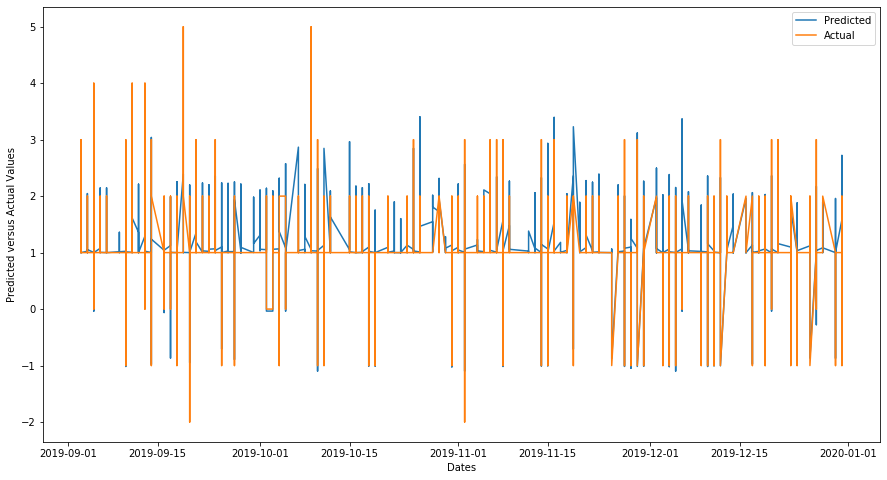

[14:43:50] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for stettler department5= 0.345


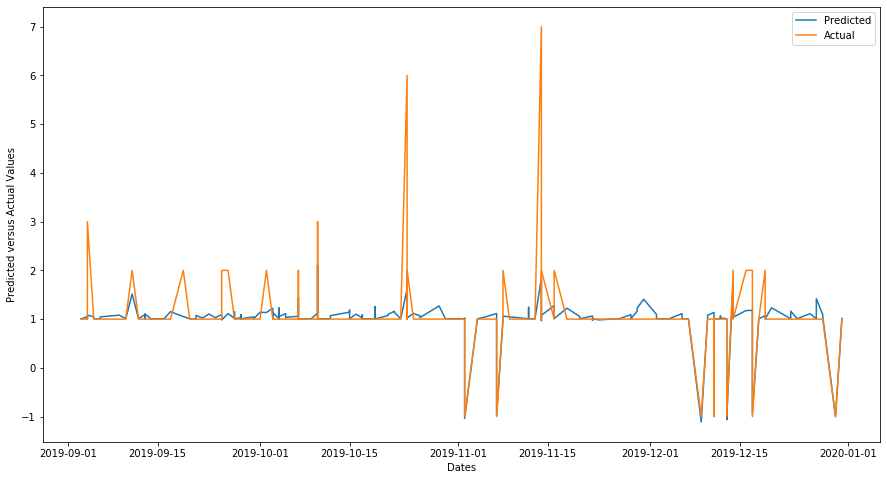

[14:44:17] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for stettler department4= 0.052


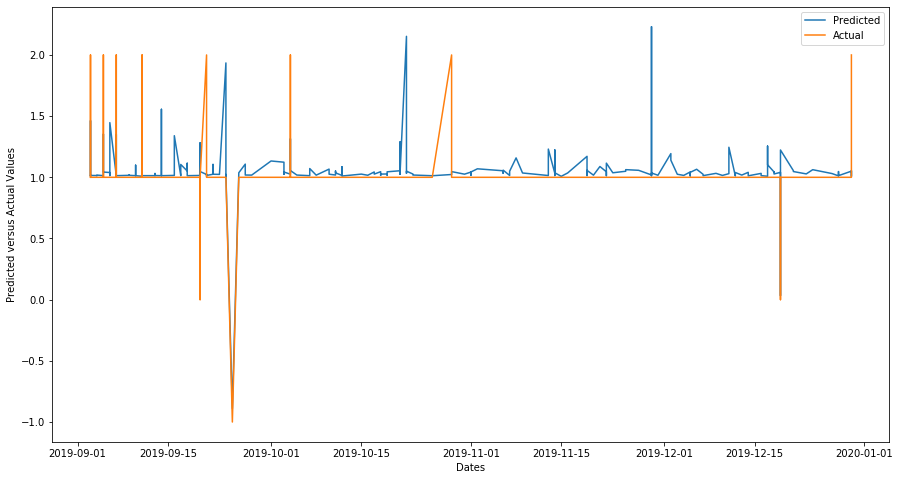

[14:45:32] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for stettler department1= 0.091


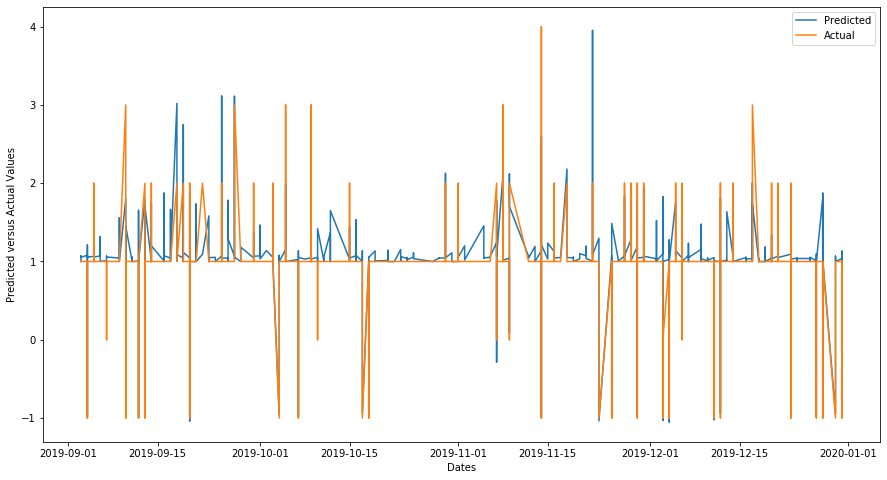

[14:45:48] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for stettler department11= 0.294


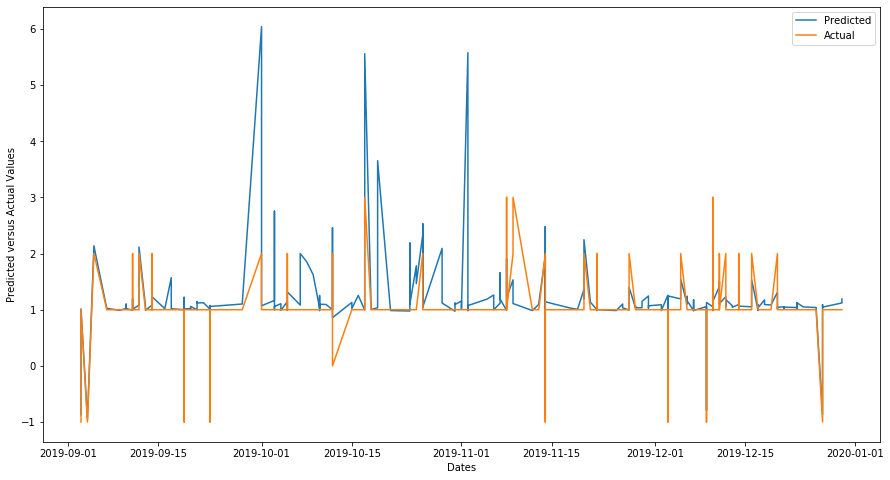

[14:46:09] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for stettler department12= 0.011


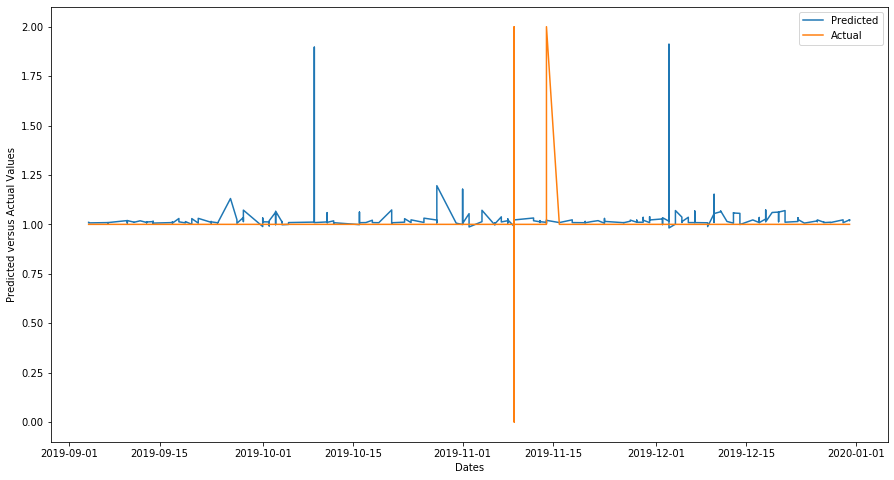

No records to test for stettler city department13
No records to test for stettler city department7
No records to test for stettler city department8
No records to test for stettler city department9
No records to test for stettler city department10
[14:48:40] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for white rock department3= 0.061


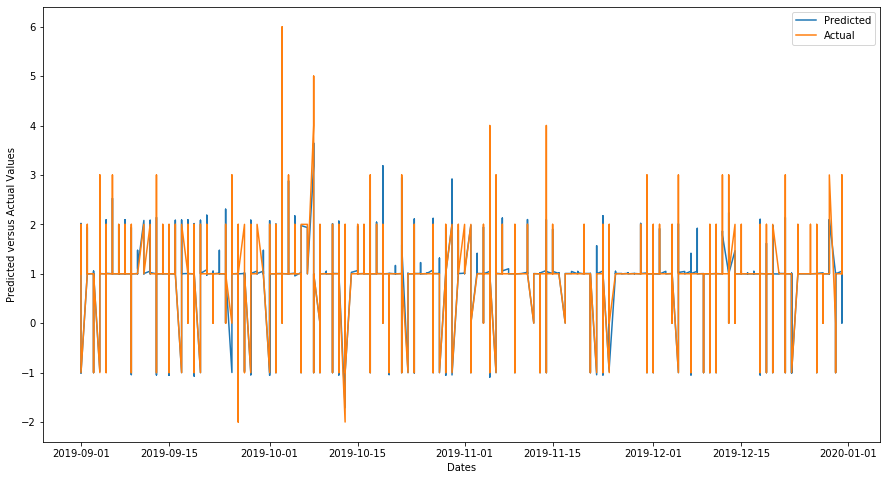

[14:54:32] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for white rock department2= 0.112


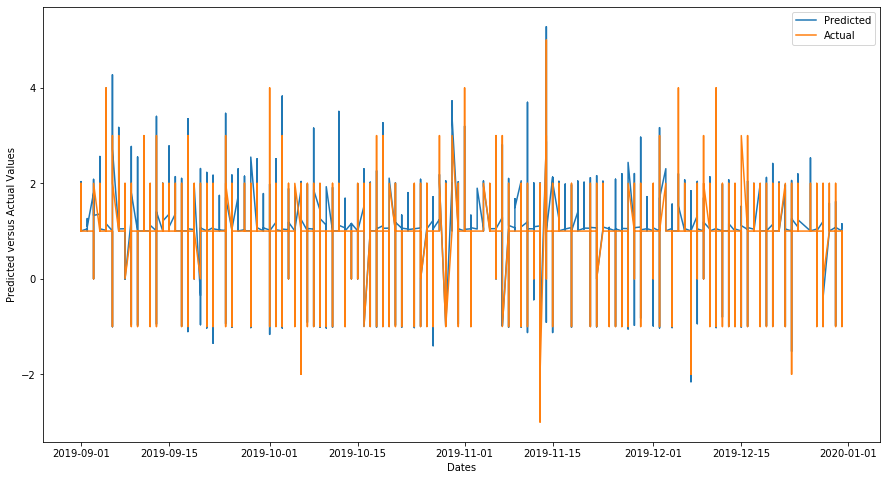

[14:54:40] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for white rock department5= 0.078


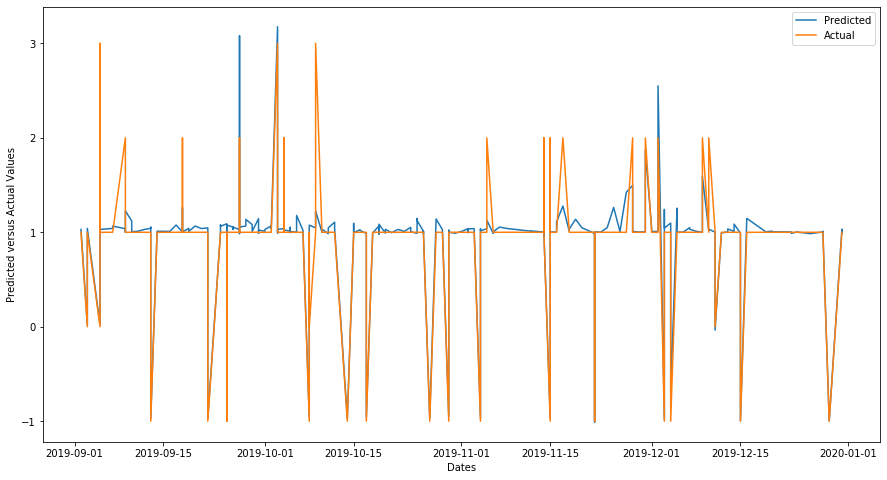

[14:55:14] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for white rock department4= 0.110


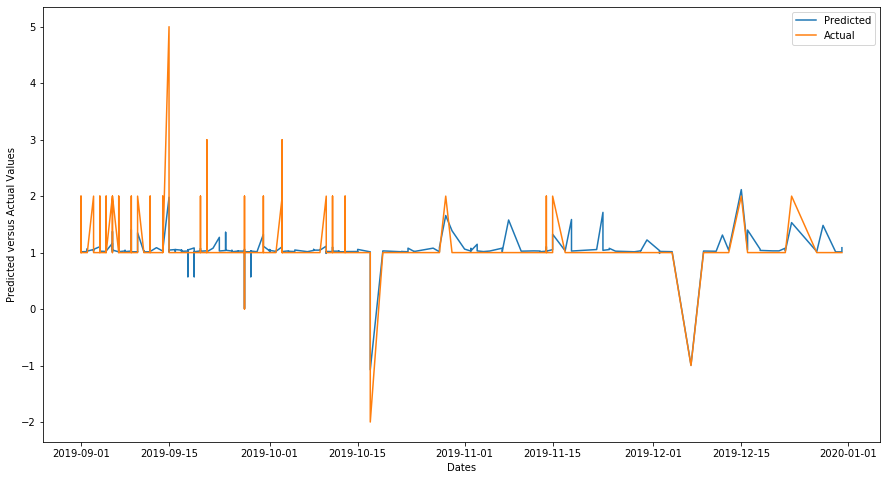

[14:56:41] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for white rock department1= 0.051


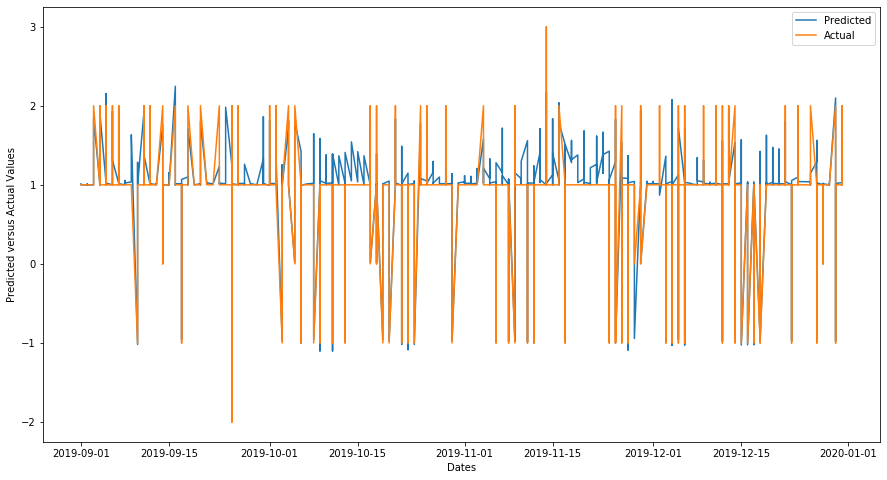

[14:56:58] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for white rock department11= 0.094


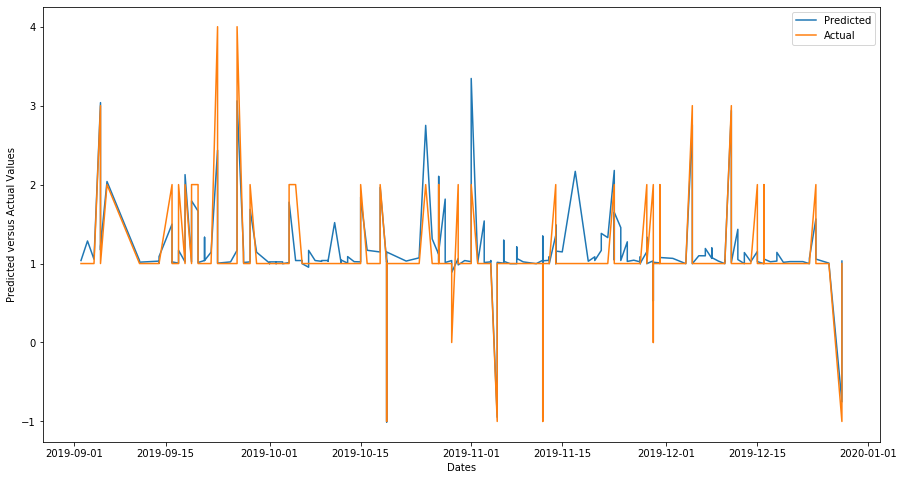

[14:57:18] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for white rock department12= 0.022


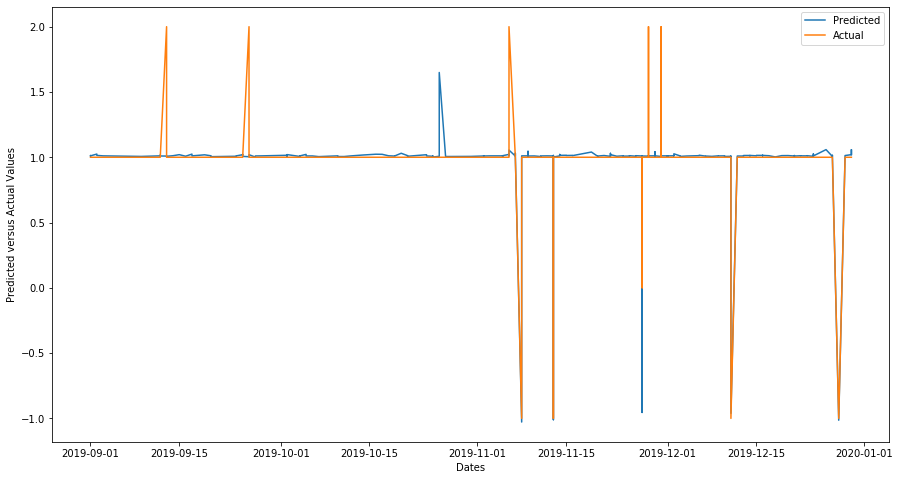

No records to test for white rock city department13
No records to test for white rock city department7
No records to test for white rock city department8
No records to test for white rock city department9
No records to test for white rock city department10
[14:58:03] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for williams lake department3= 0.111


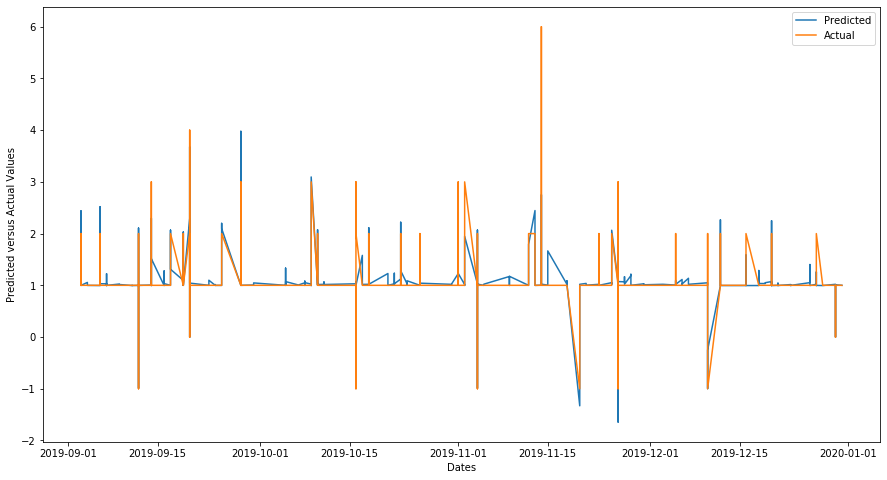

[14:59:56] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for williams lake department2= 0.092


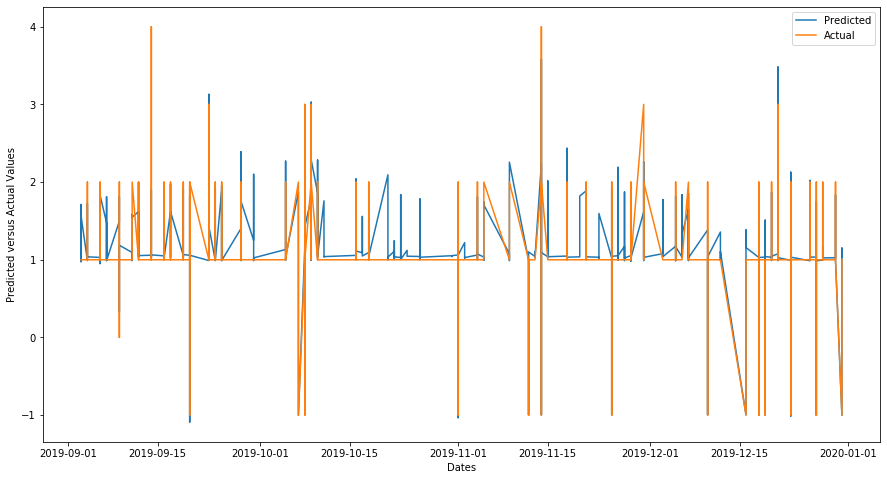

No records to test for williams lake city department5
[15:00:07] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for williams lake department4= 0.130


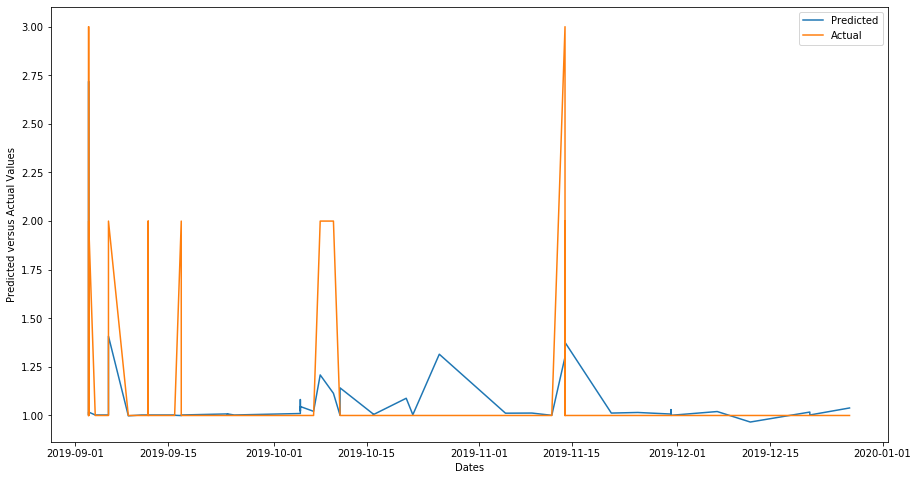

[15:00:31] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for williams lake department1= 0.114


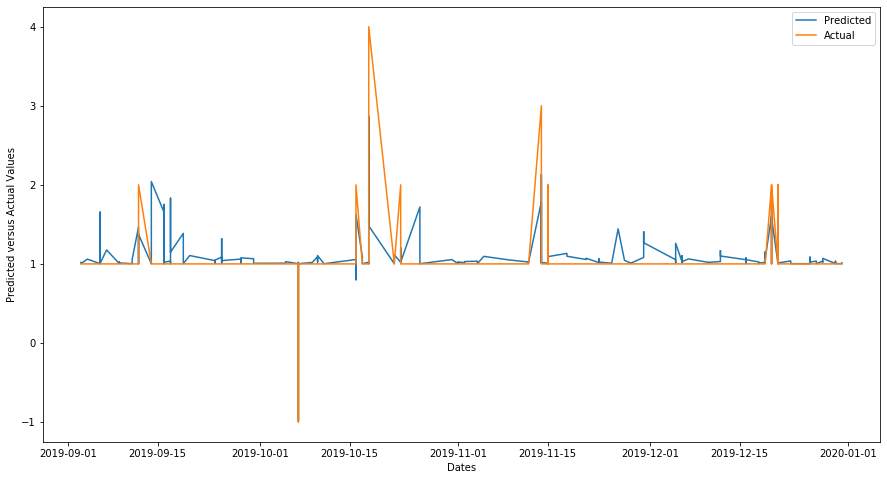

[15:00:41] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for williams lake department11= 0.161


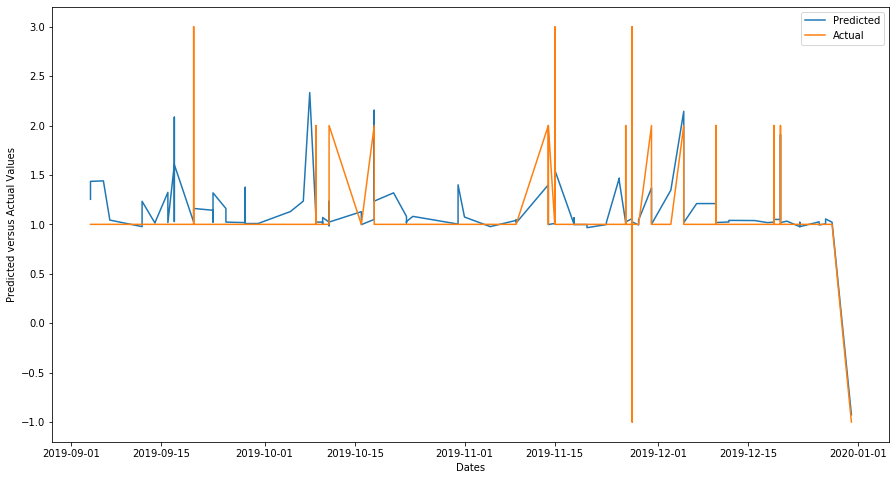

[15:00:53] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for williams lake department12= 0.029


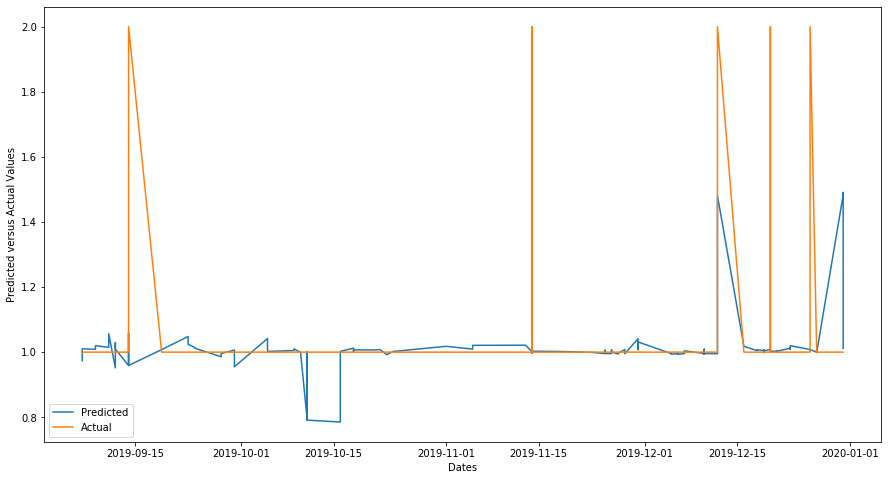

No records to test for williams lake city department13
No records to test for williams lake city department7
No records to test for williams lake city department8
No records to test for williams lake city department9
No records to test for williams lake city department10
[15:01:38] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for wainwright department3= 0.089


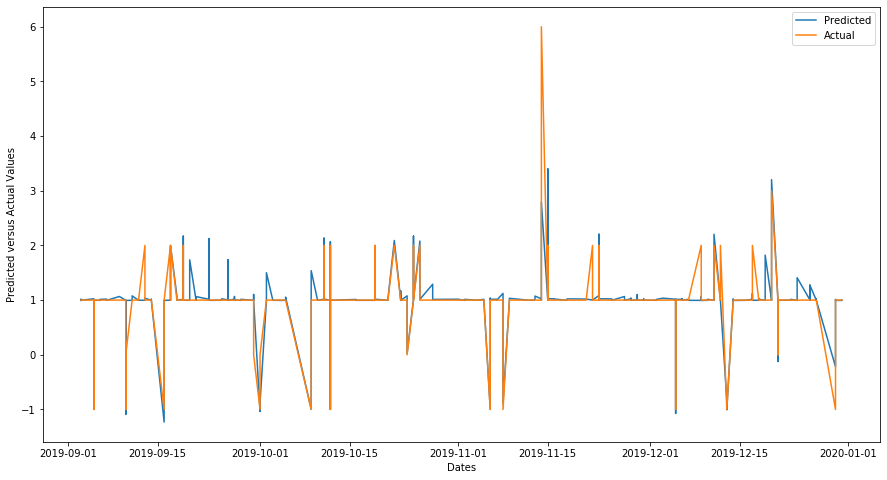

[15:03:53] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for wainwright department2= 0.100


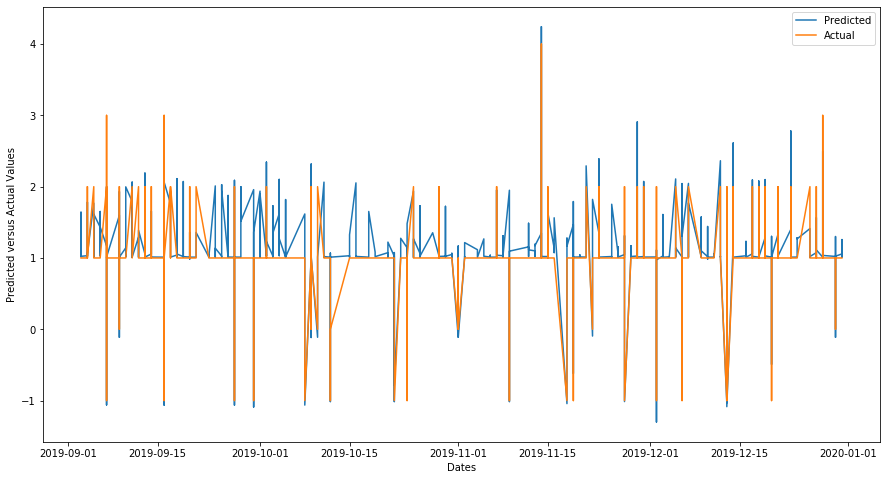

No records to test for wainwright city department5
[15:04:09] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for wainwright department4= 0.056


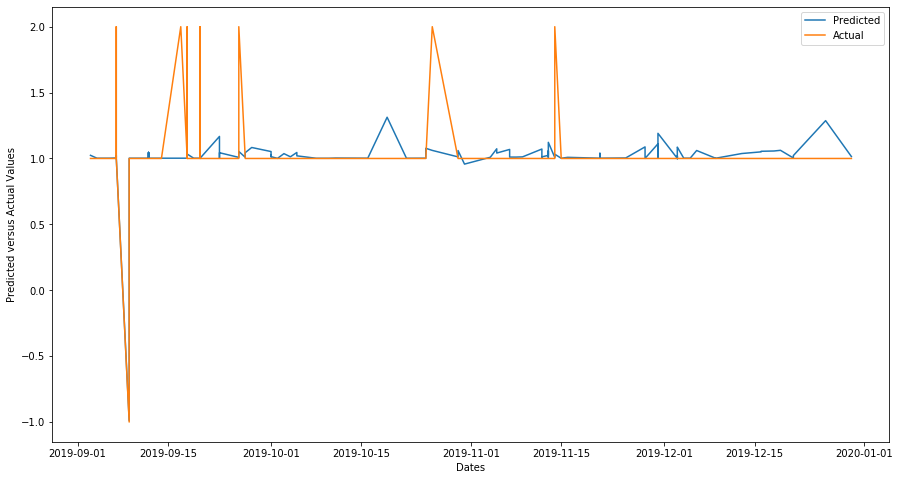

[15:04:37] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for wainwright department1= 0.069


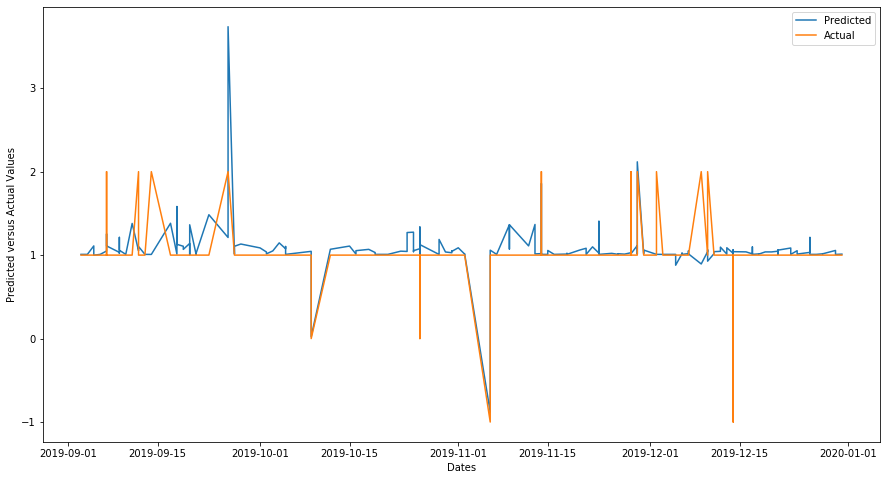

[15:04:48] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for wainwright department11= 0.079


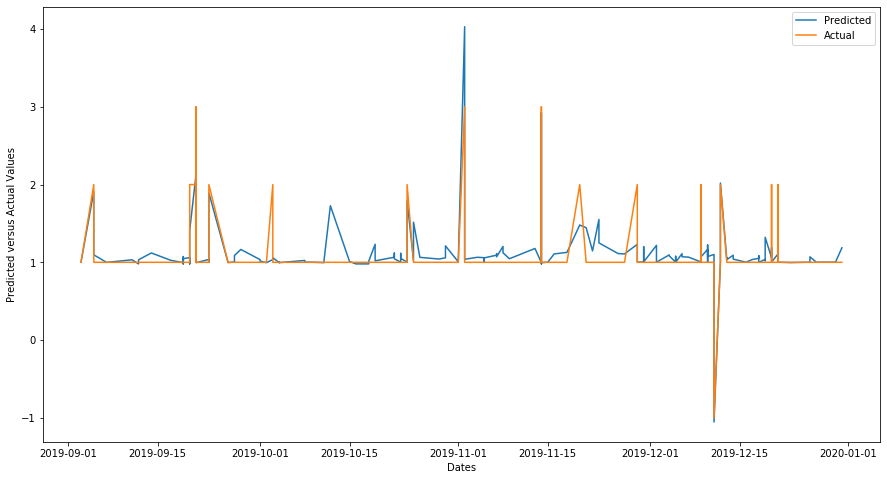

[15:05:06] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for wainwright department12= 0.003


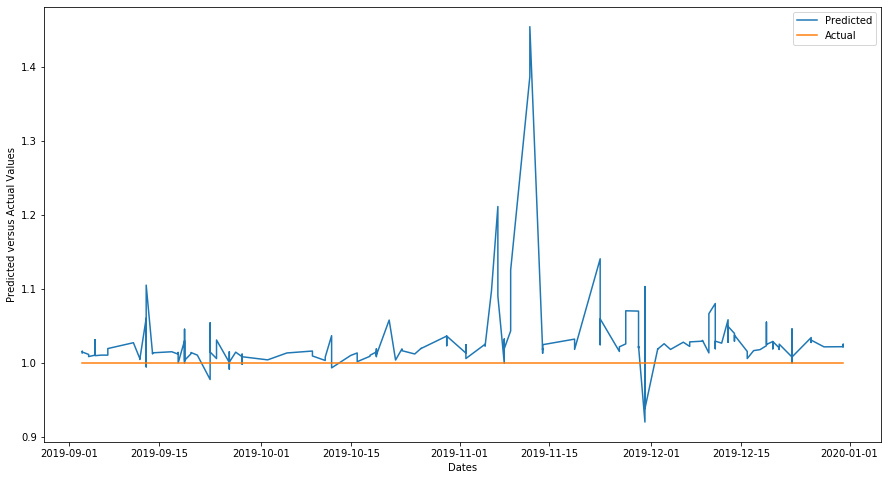

No records to test for wainwright city department13
No records to test for wainwright city department7
No records to test for wainwright city department8
No records to test for wainwright city department9
No records to test for wainwright city department10
[15:06:05] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for cranbrook department3= 0.055


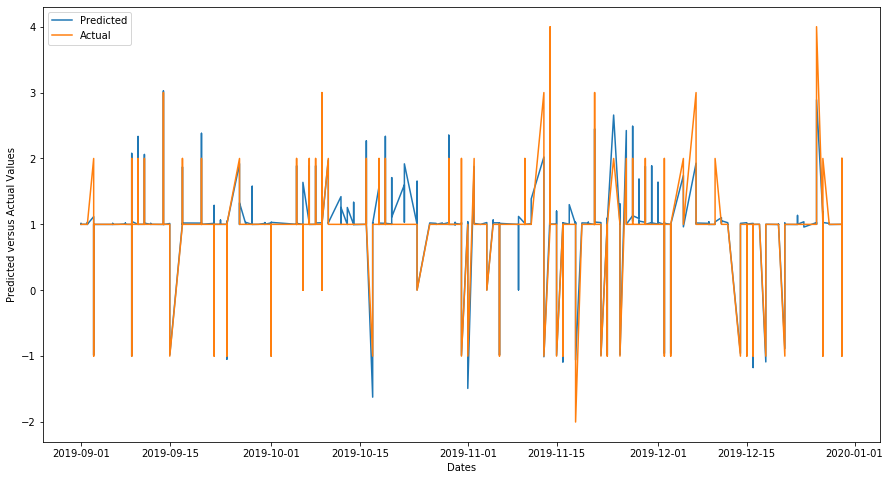

[15:08:16] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for cranbrook department2= 0.100


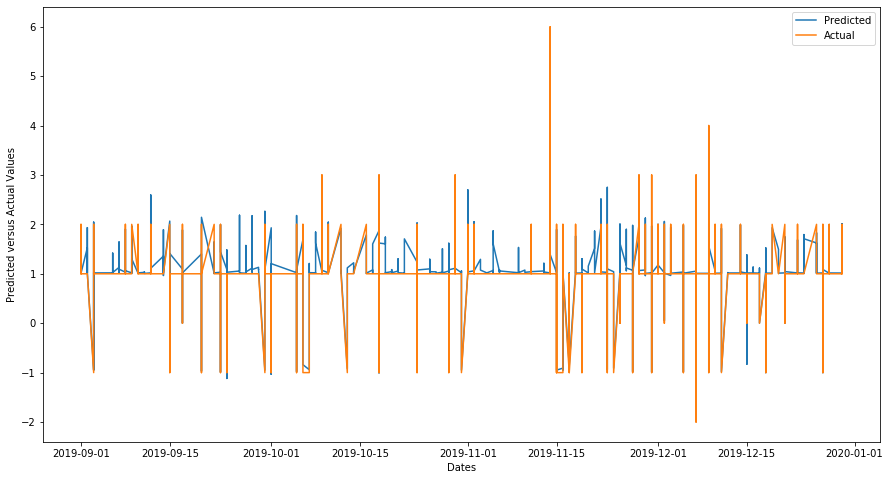

No records to test for cranbrook city department5
[15:08:32] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for cranbrook department4= 0.017


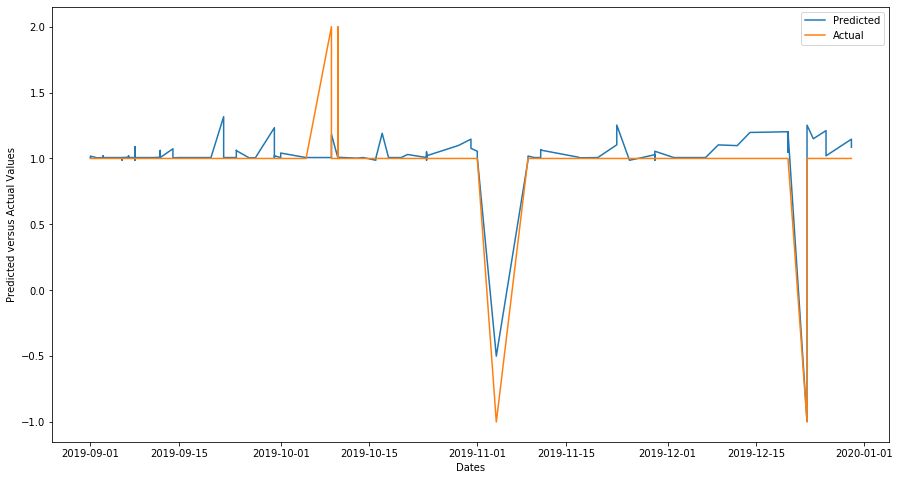

[15:09:01] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for cranbrook department1= 0.057


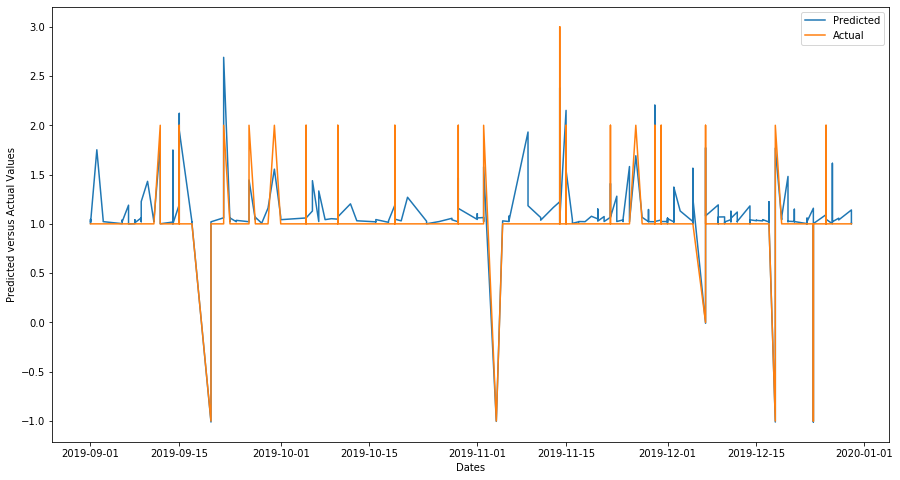

[15:09:10] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for cranbrook department11= 0.088


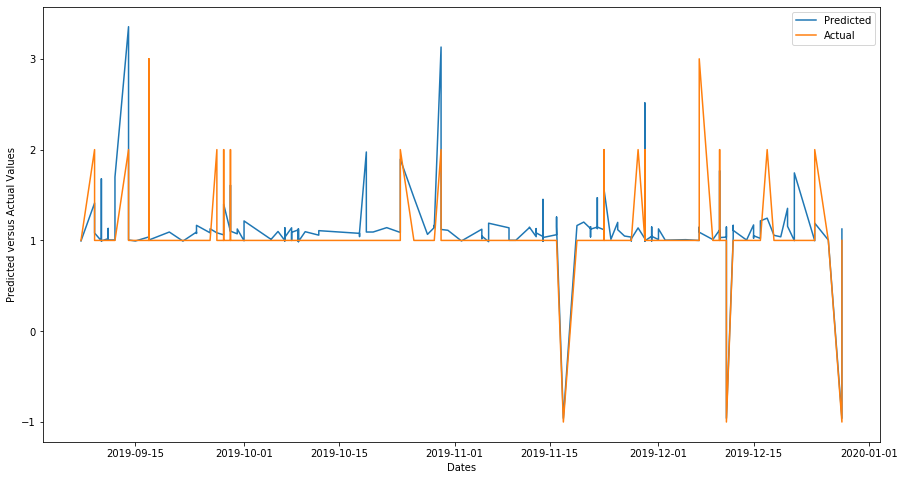

[15:09:21] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for cranbrook department12= 0.034


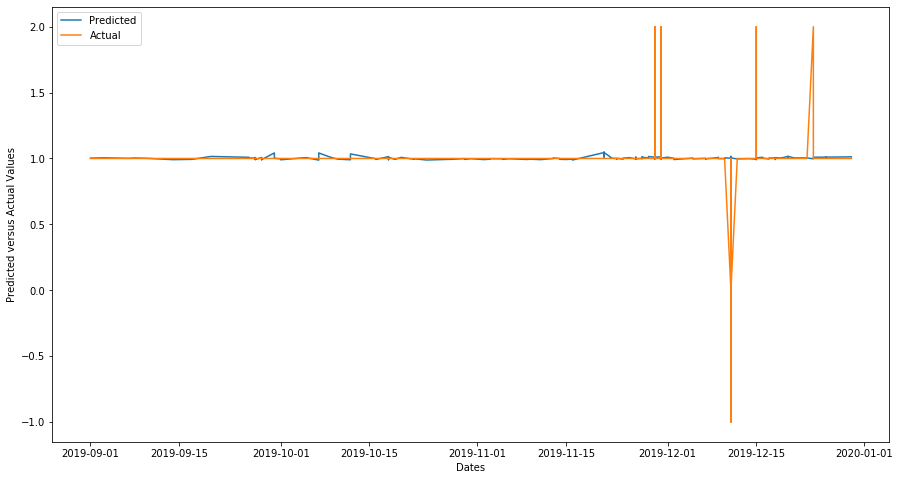

No records to test for cranbrook city department13
No records to test for cranbrook city department7
No records to test for cranbrook city department8
No records to test for cranbrook city department9
No records to test for cranbrook city department10
[15:10:55] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for camrose department3= 0.076


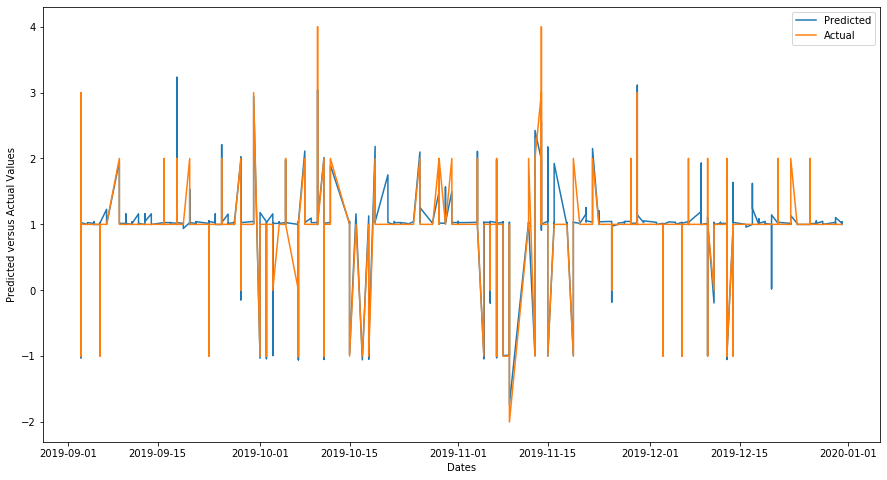

[15:15:11] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for camrose department2= 0.093


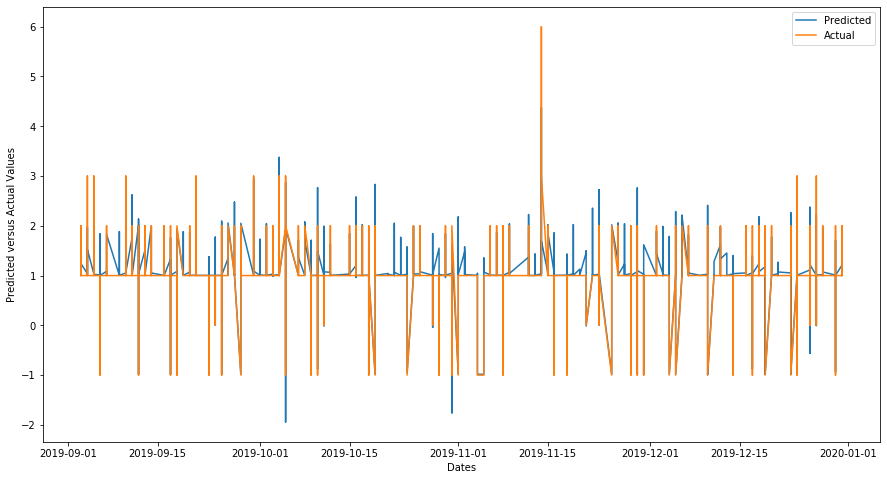

No records to test for camrose city department5
[15:15:36] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for camrose department4= 0.026


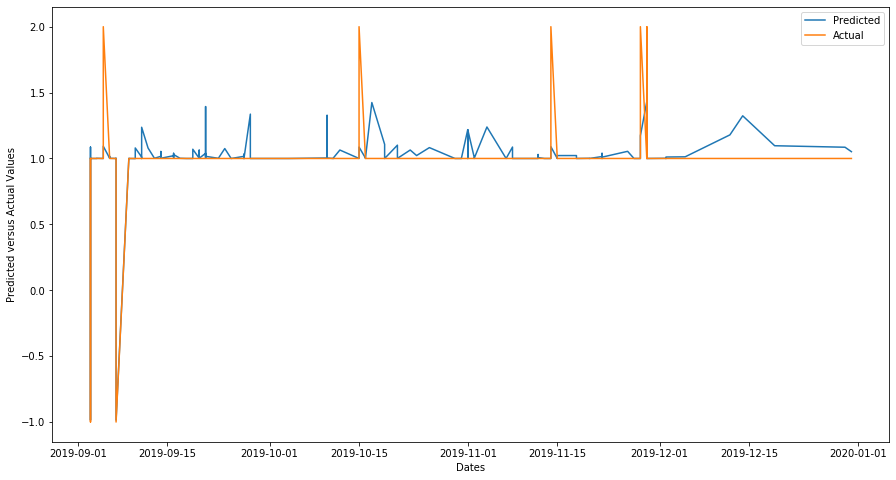

[15:16:36] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for camrose department1= 0.054


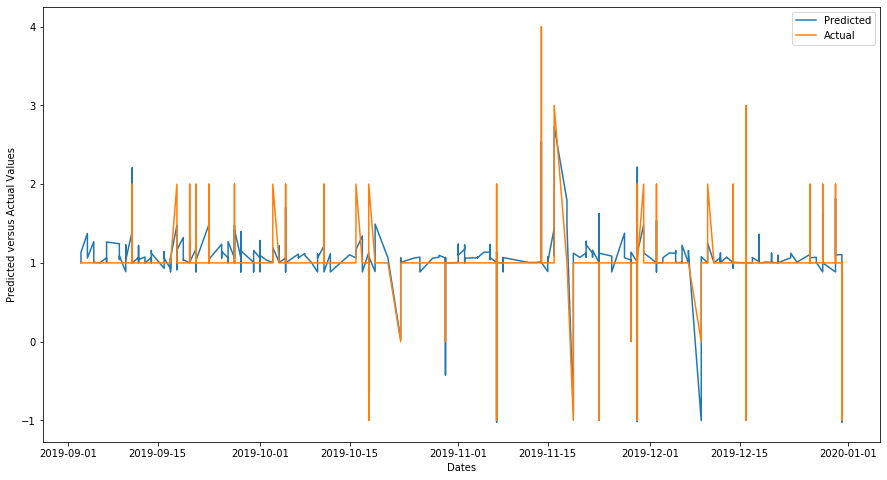

[15:16:51] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for camrose department11= 0.119


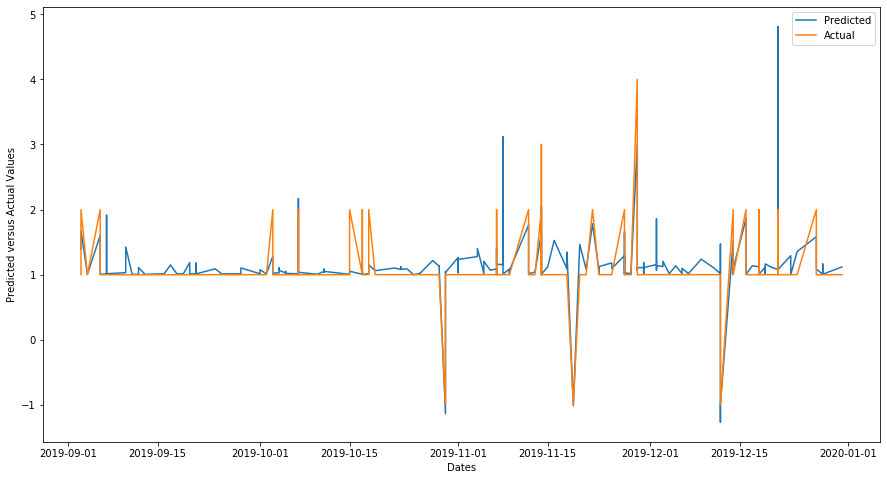

[15:17:12] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for camrose department12= 0.016


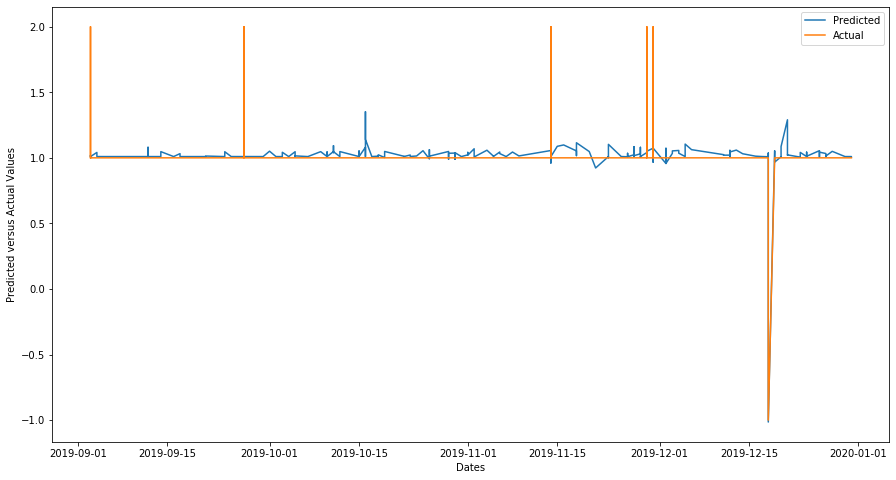

No records to test for camrose city department13
No records to test for camrose city department7
No records to test for camrose city department8
No records to test for camrose city department9
No records to test for camrose city department10
[15:17:41] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for fort st john department3= 0.042


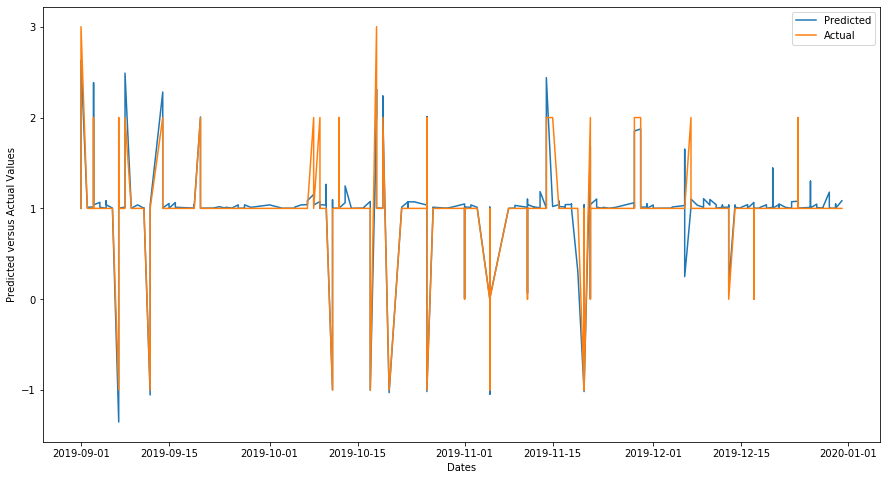

[15:19:14] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for fort st john department2= 0.080


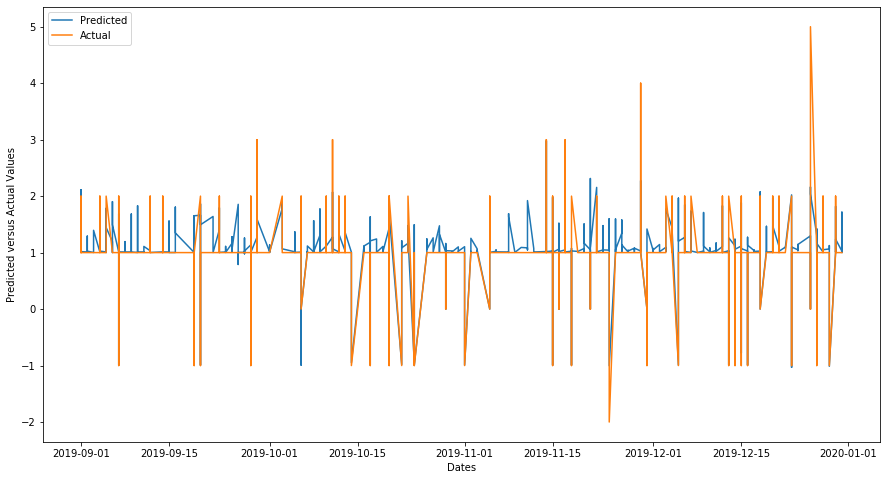

No records to test for fort st john city department5
[15:19:27] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for fort st john department4= 0.055


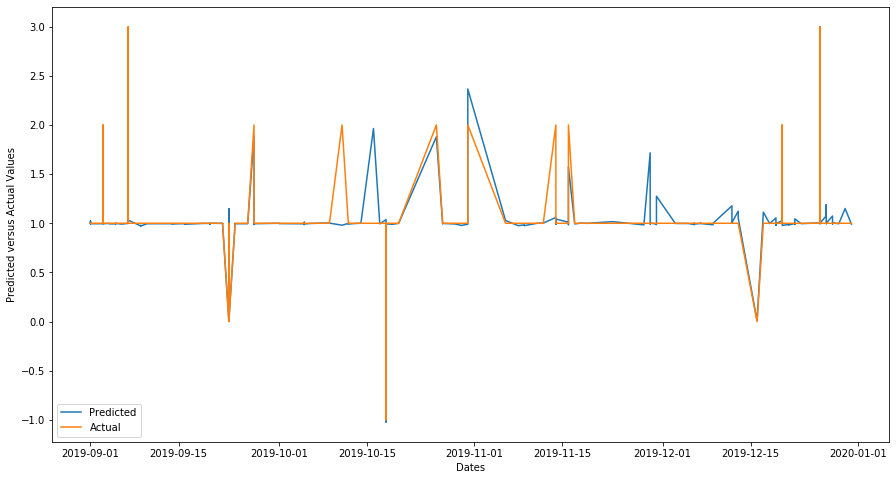

[15:19:50] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for fort st john department1= 0.044


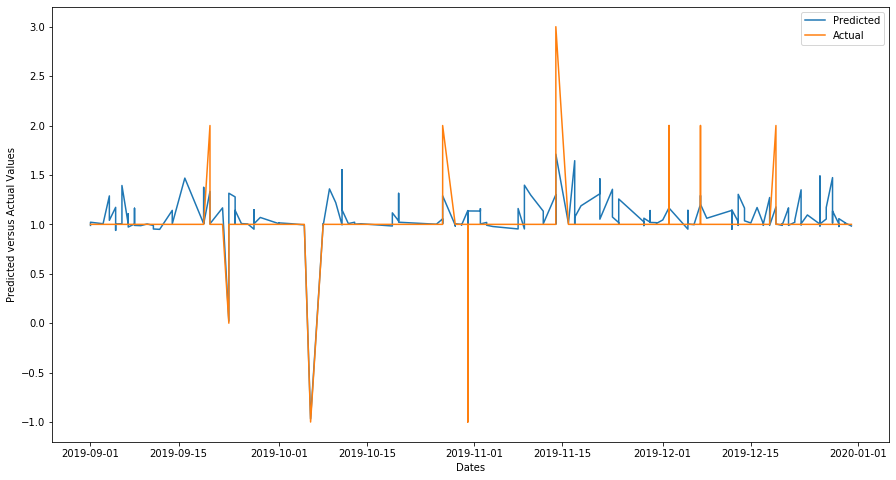

[15:19:59] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for fort st john department11= 0.110


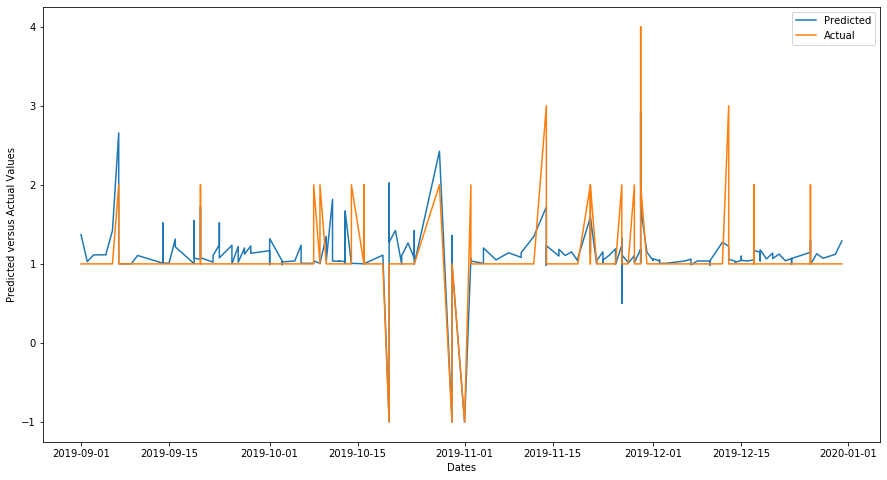

[15:20:12] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for fort st john department12= 0.004


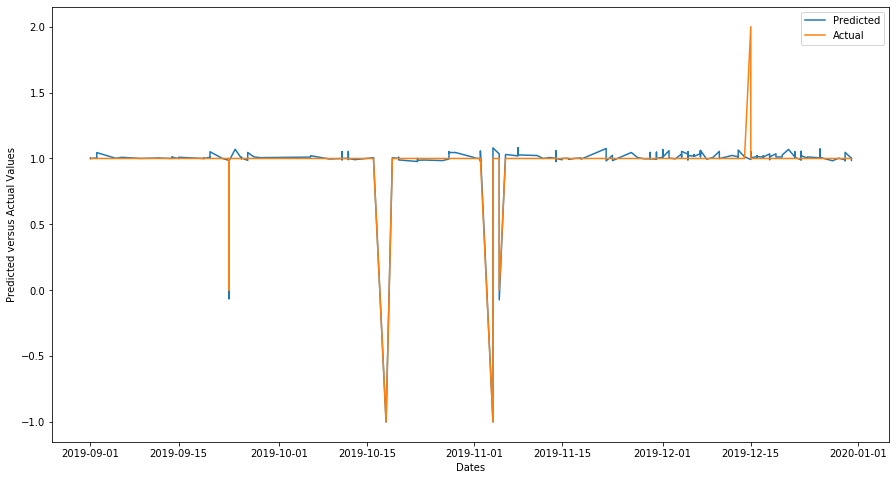

No records to test for fort st john city department13
No records to test for fort st john city department7
No records to test for fort st john city department8
No records to test for fort st john city department9
No records to test for fort st john city department10
[15:21:32] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for salmon arm department3= 0.040


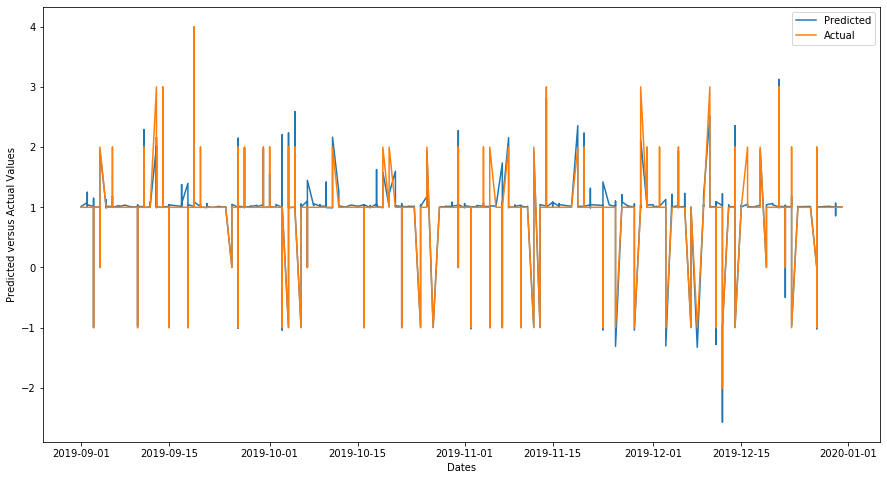

[15:24:49] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for salmon arm department2= 0.112


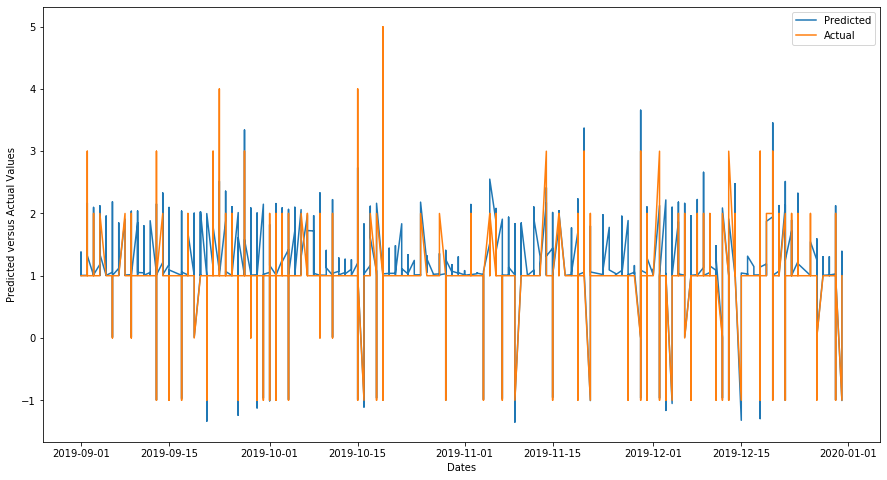

No records to test for salmon arm city department5
[15:25:12] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for salmon arm department4= 0.087


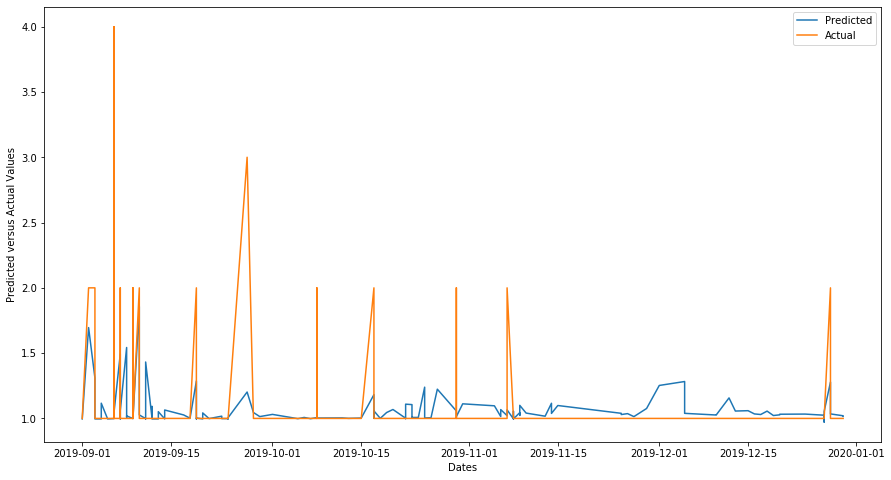

[15:25:52] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for salmon arm department1= 0.041


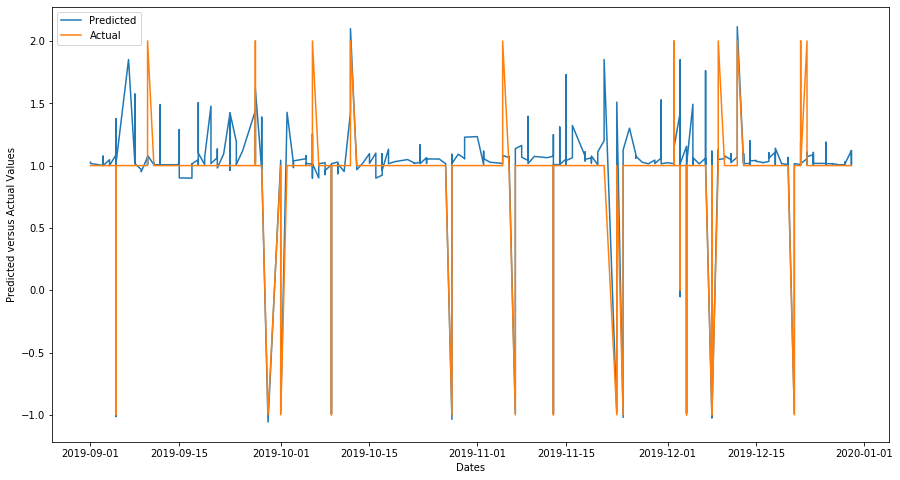

[15:26:06] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for salmon arm department11= 0.079


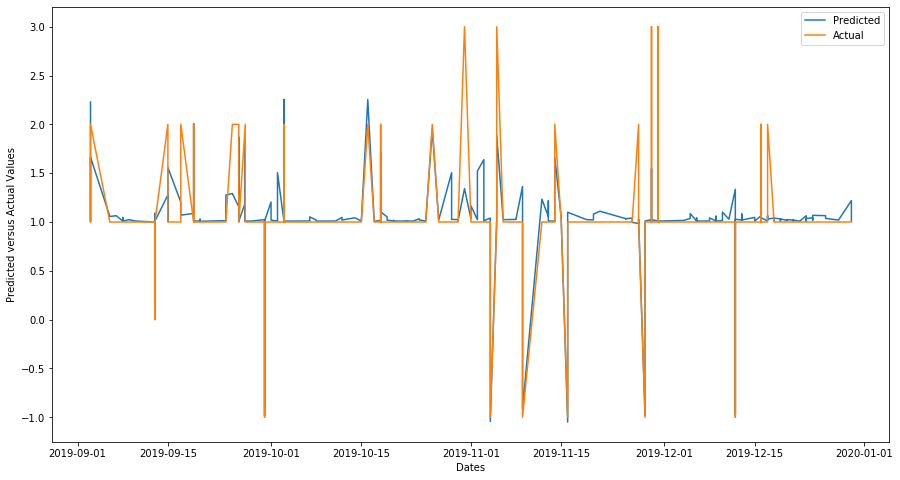

[15:26:26] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for salmon arm department12= 0.011


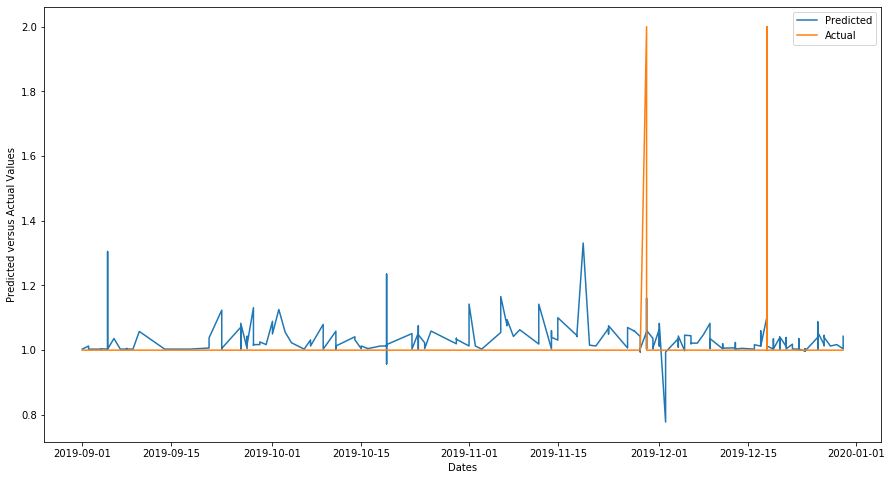

No records to test for salmon arm city department13
No records to test for salmon arm city department7
No records to test for salmon arm city department8
No records to test for salmon arm city department9
No records to test for salmon arm city department10
[15:27:10] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for quesnel department3= 0.070


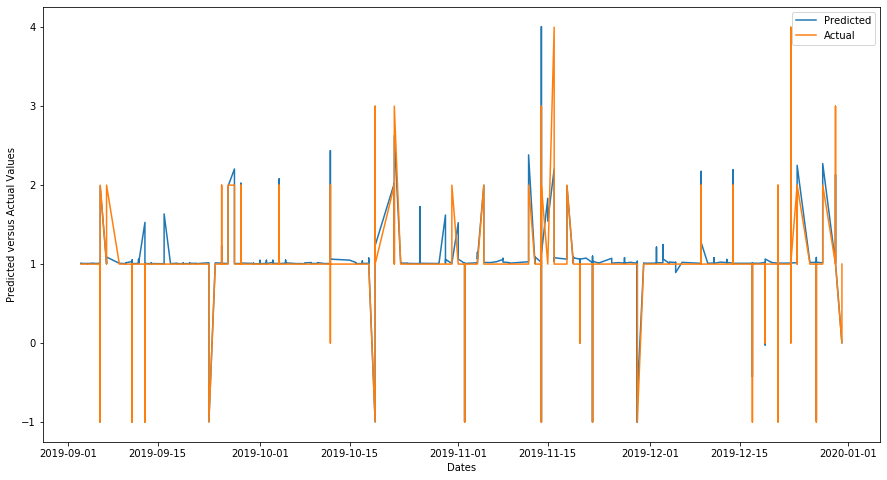

[15:29:14] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for quesnel department2= 0.076


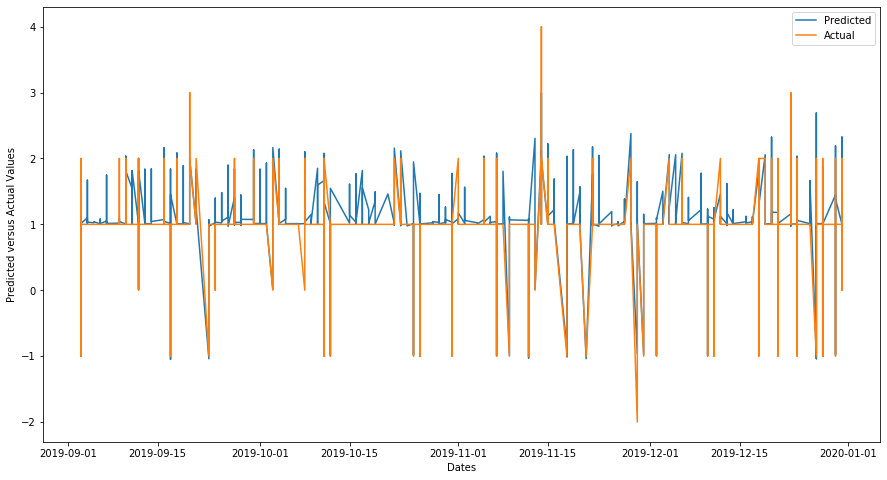

No records to test for quesnel city department5
[15:29:30] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for quesnel department4= 0.020


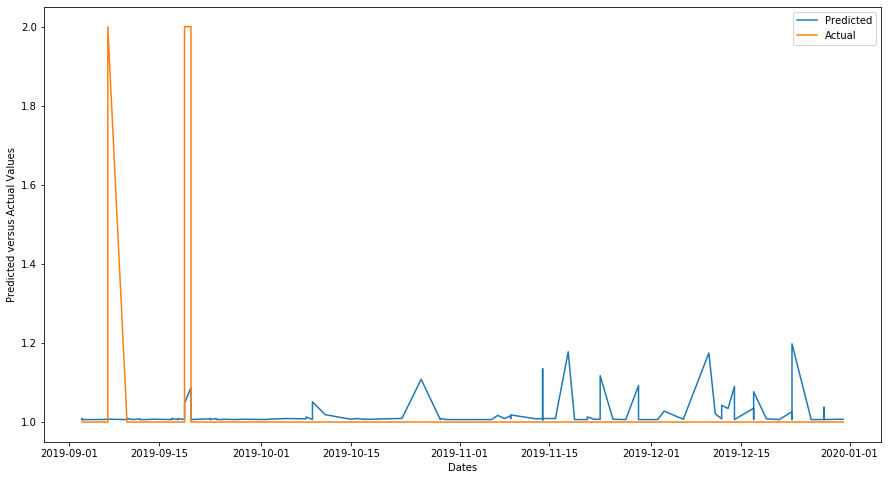

[15:29:55] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for quesnel department1= 0.054


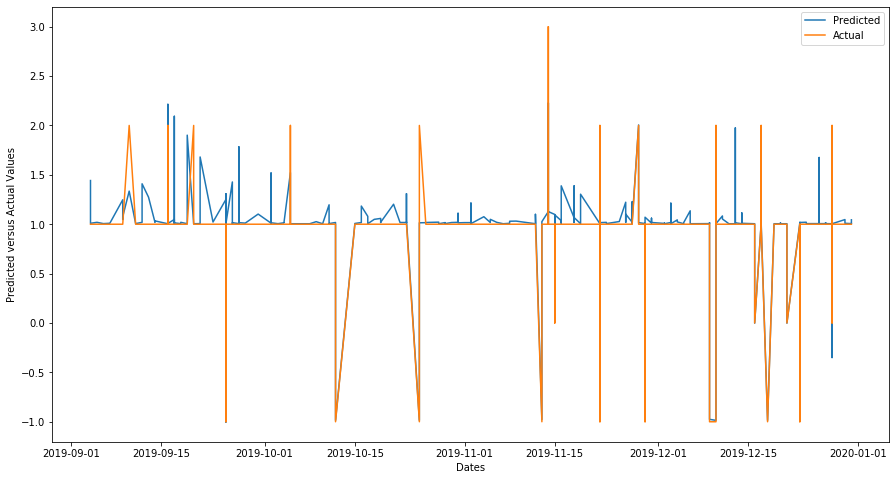

[15:30:07] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for quesnel department11= 0.412


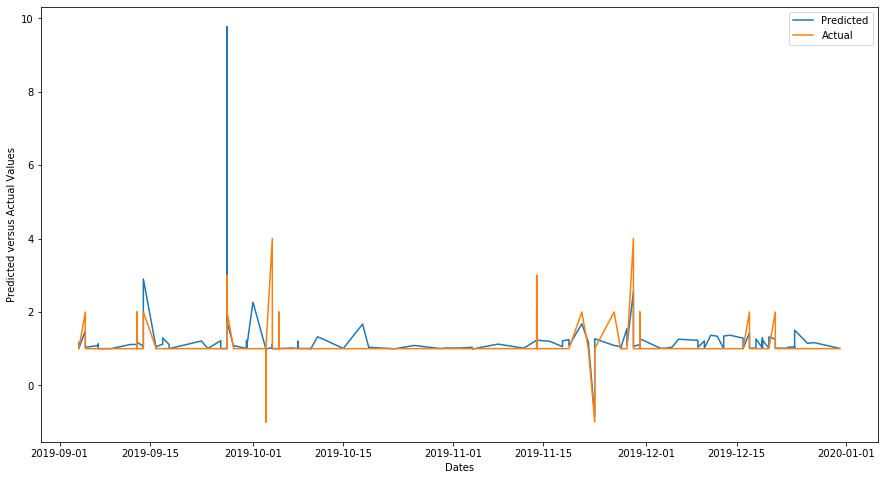

[15:30:24] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for quesnel department12= 0.007


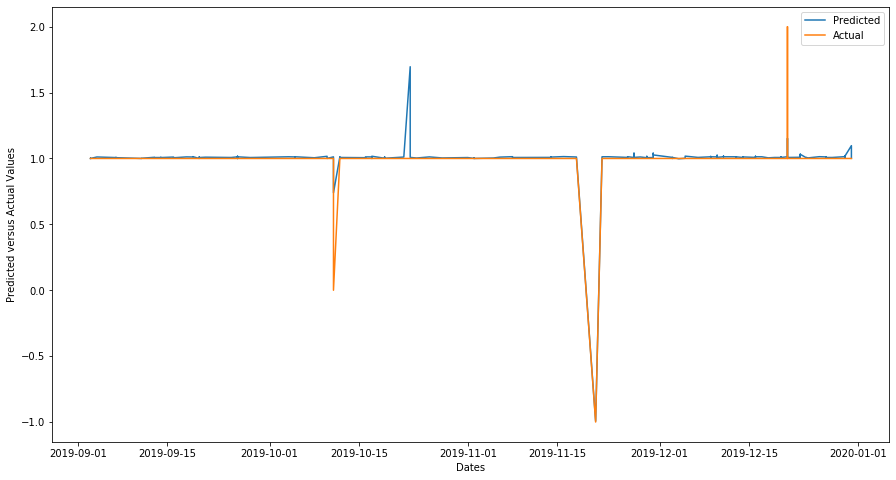

No records to test for quesnel city department13
No records to test for quesnel city department7
No records to test for quesnel city department8
No records to test for quesnel city department9
No records to test for quesnel city department10
[15:31:00] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for edmonton department3= 0.045


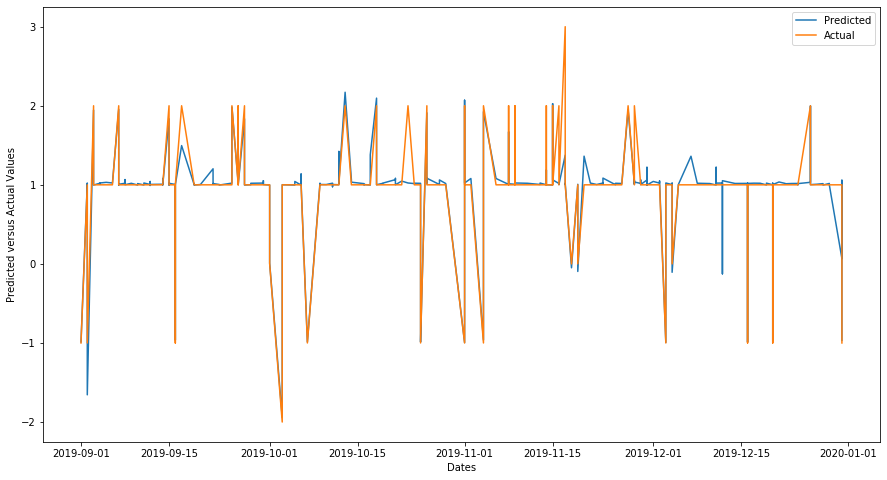

[15:33:13] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for edmonton department2= 0.131


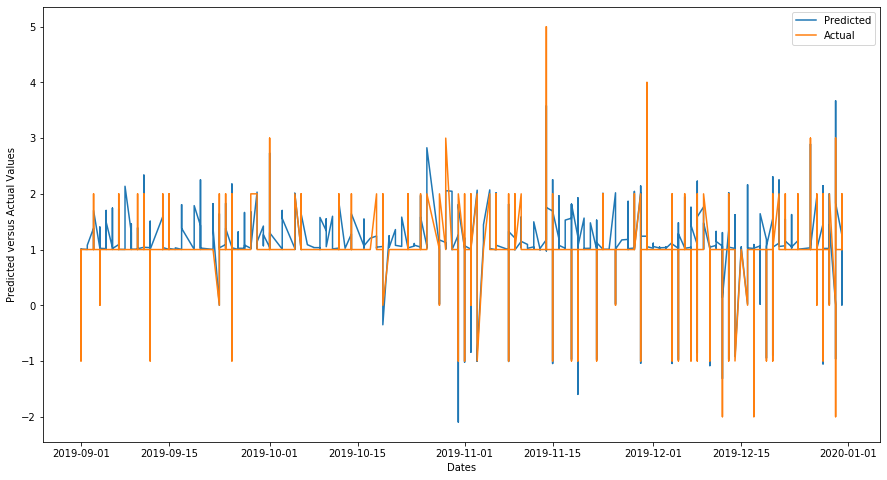

No records to test for edmonton city department5
[15:33:35] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for edmonton department4= 0.140


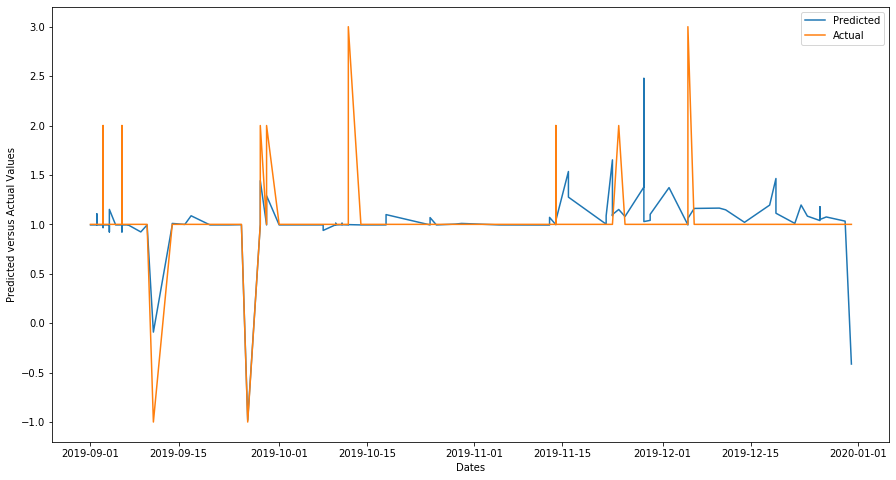

[15:34:01] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for edmonton department1= 0.050


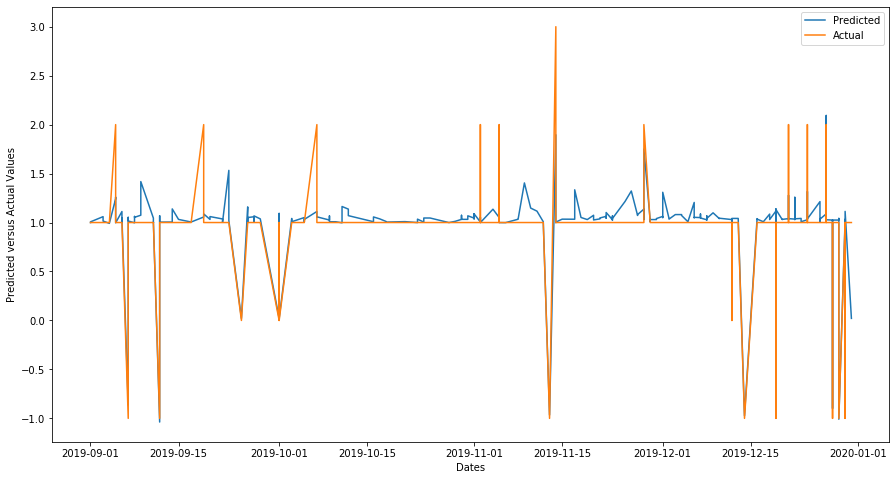

[15:34:11] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for edmonton department11= 0.104


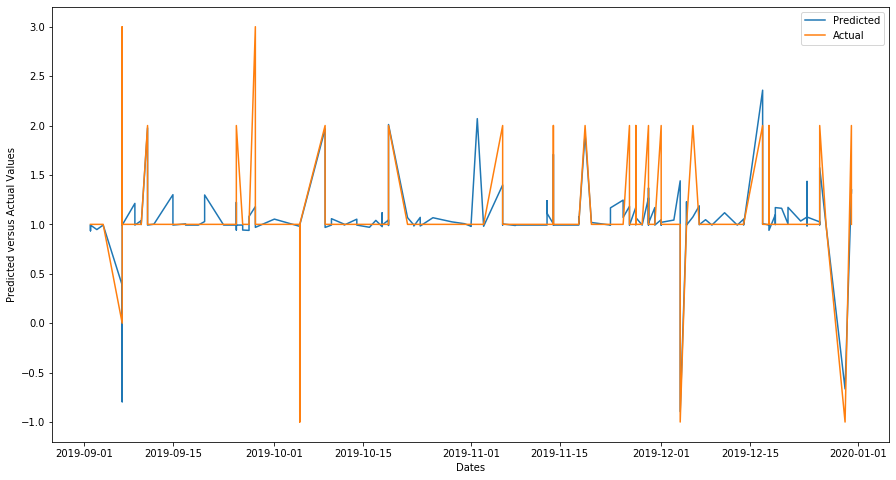

[15:34:26] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for edmonton department12= 0.009


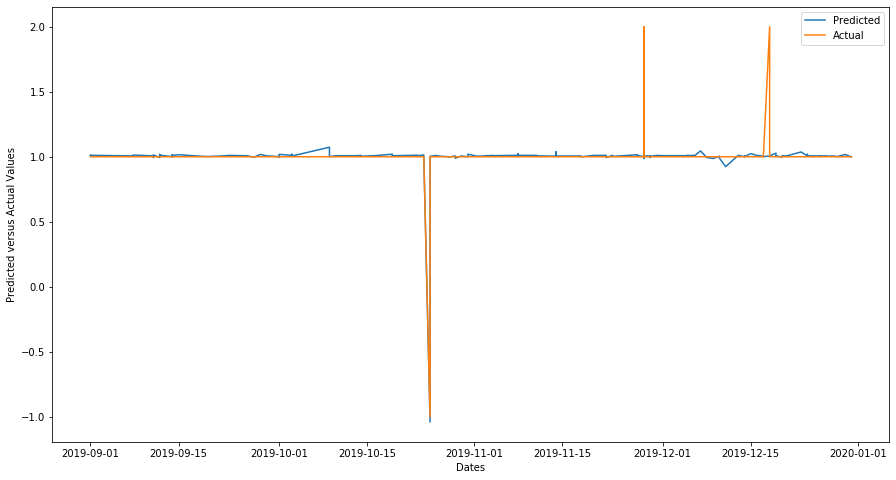

No records to test for edmonton city department13
No records to test for edmonton city department7
No records to test for edmonton city department8
No records to test for edmonton city department9
No records to test for edmonton city department10
[15:35:57] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for port alberni department3= 0.093


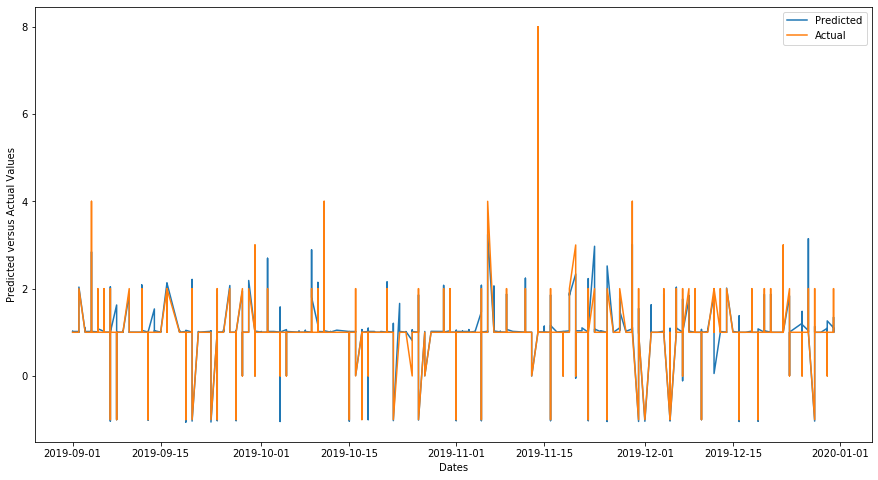

[15:39:34] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for port alberni department2= 0.115


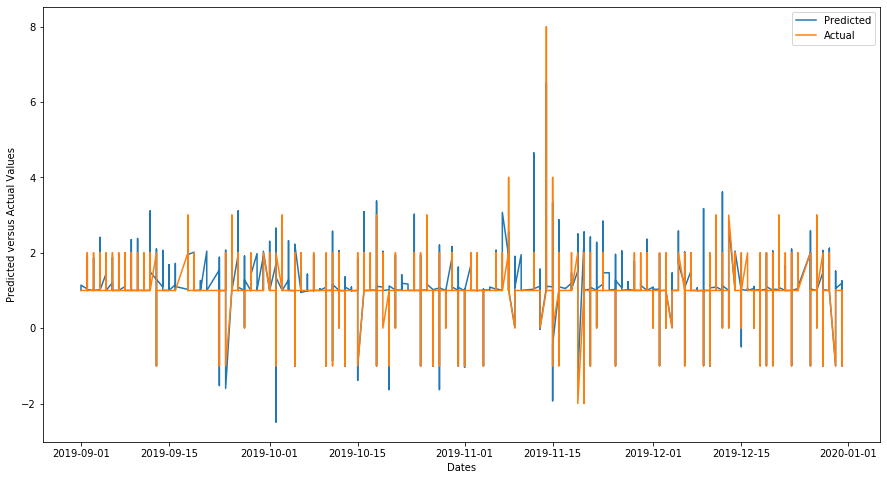

No records to test for port alberni city department5
[15:39:54] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for port alberni department4= 0.043


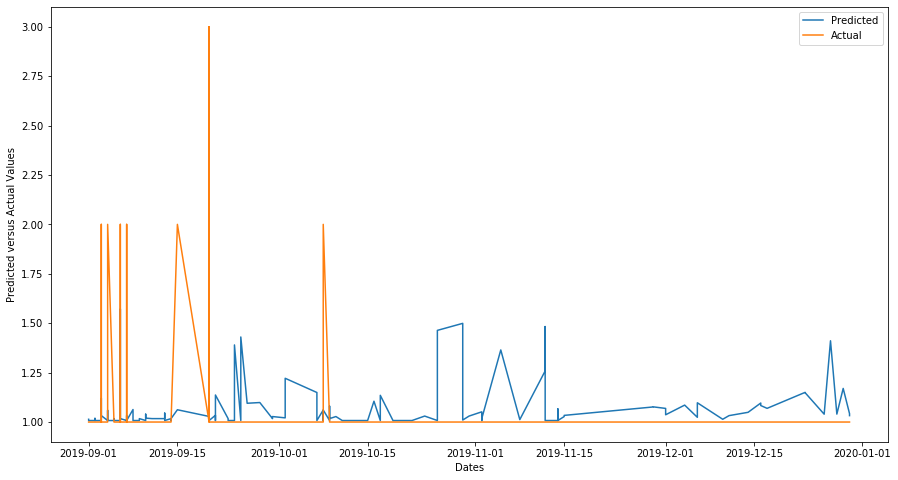

[15:40:45] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for port alberni department1= 0.059


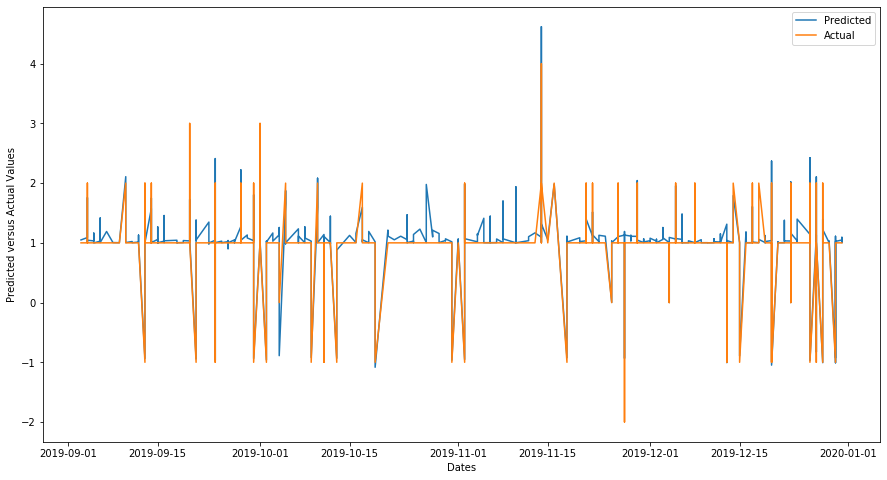

[15:40:58] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for port alberni department11= 0.126


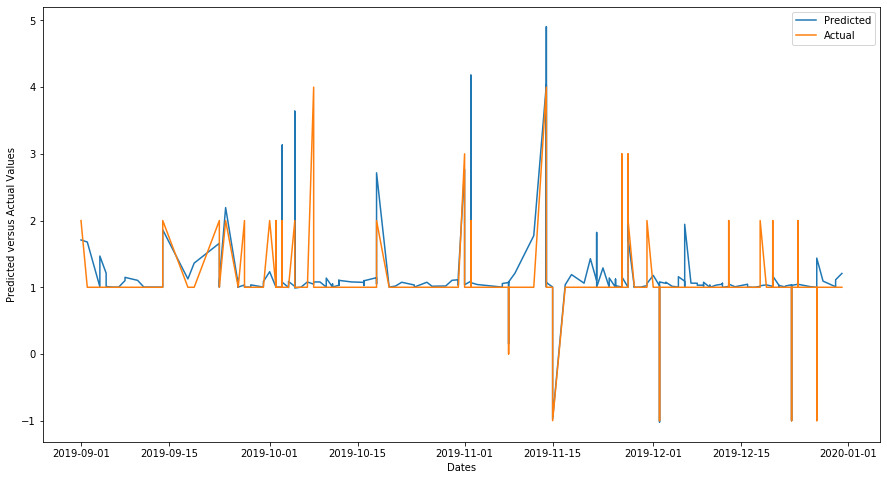

[15:41:23] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for port alberni department12= 0.035


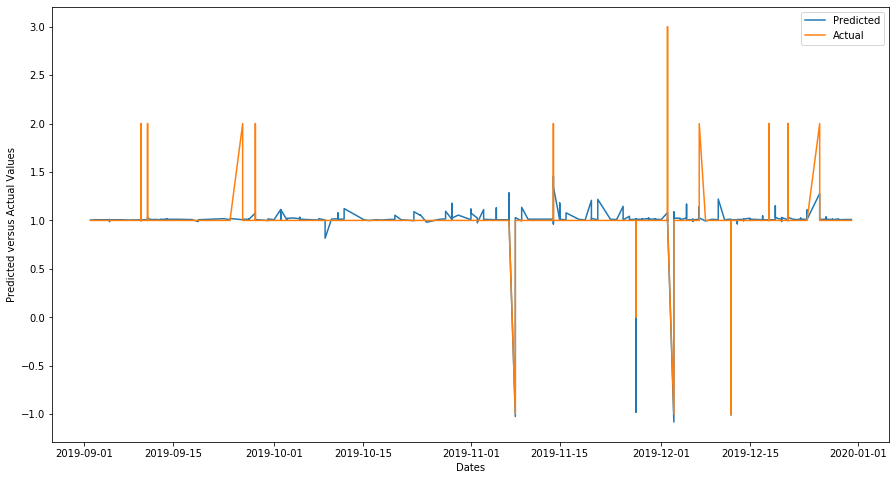

No records to test for port alberni city department13
No records to test for port alberni city department7
No records to test for port alberni city department8
No records to test for port alberni city department9
No records to test for port alberni city department10
[15:43:52] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for calgary department3= 0.127


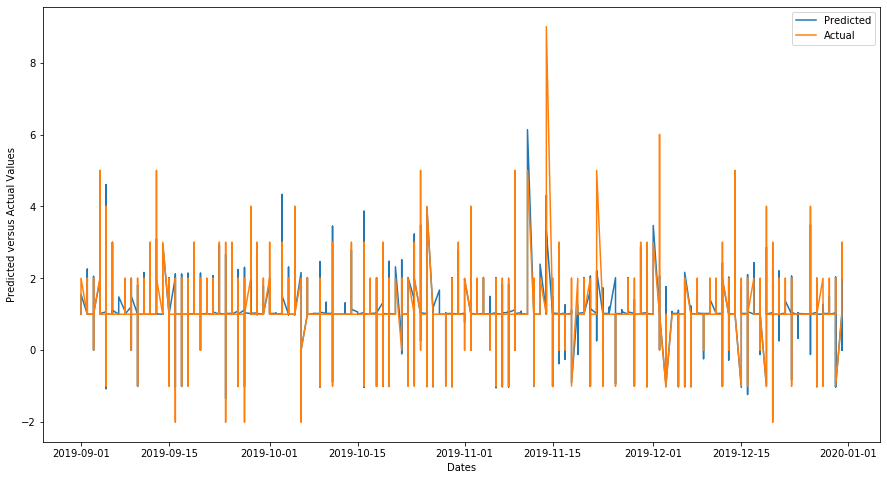

[15:52:27] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for calgary department2= 0.218


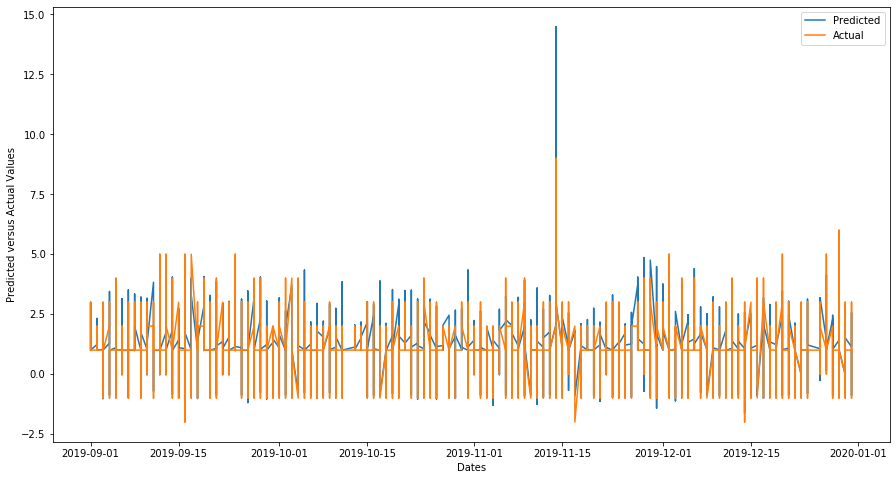

[15:52:38] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for calgary department5= 0.166


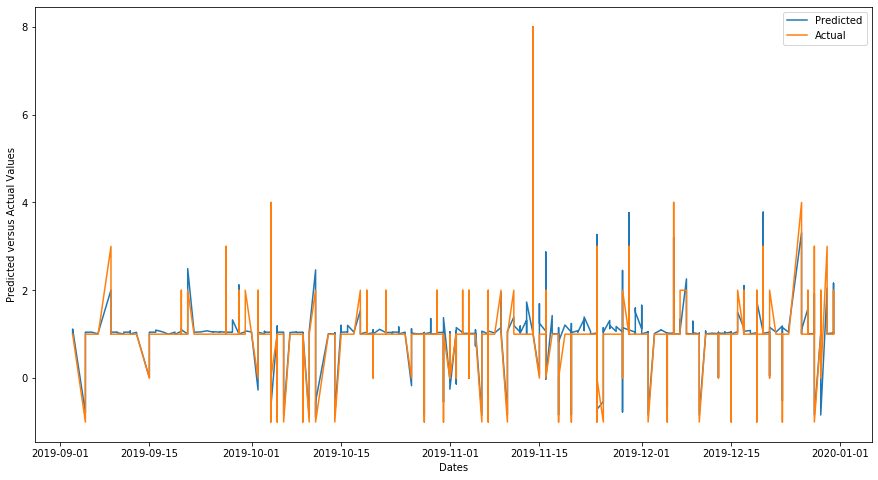

[15:53:57] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for calgary department4= 0.109


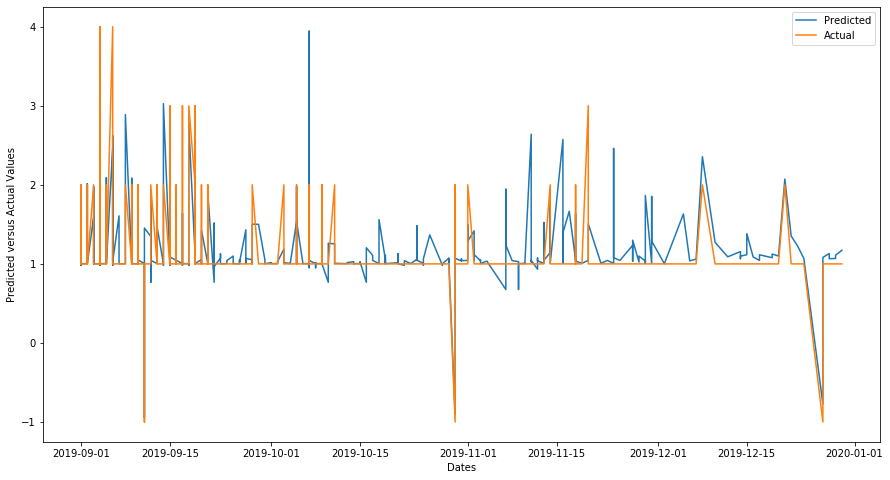

[15:55:59] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for calgary department1= 0.104


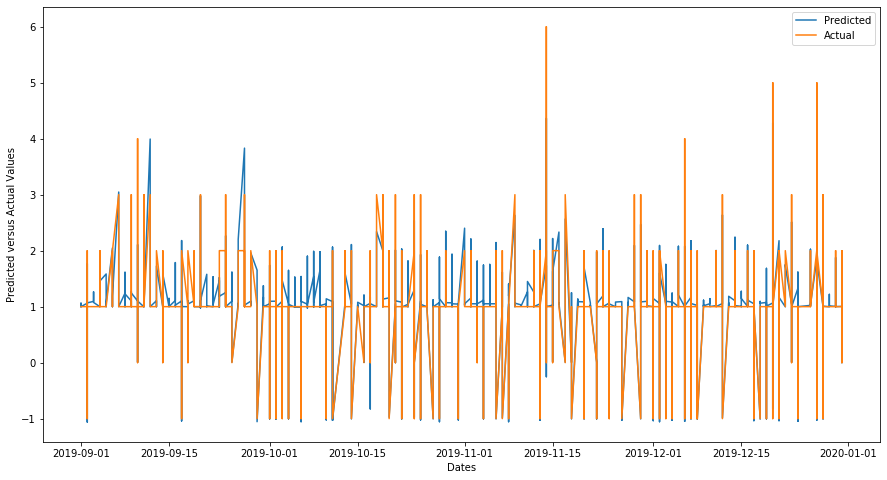

[15:56:41] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for calgary department11= 0.148


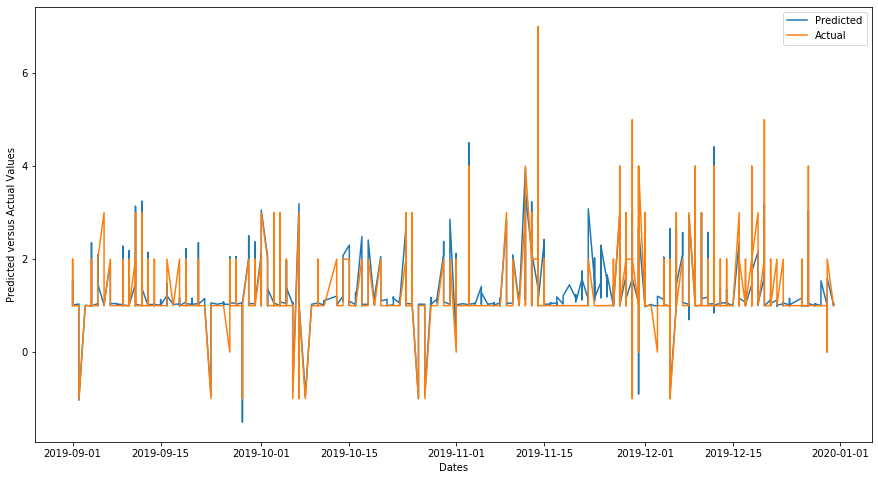

[15:57:39] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for calgary department12= 0.039


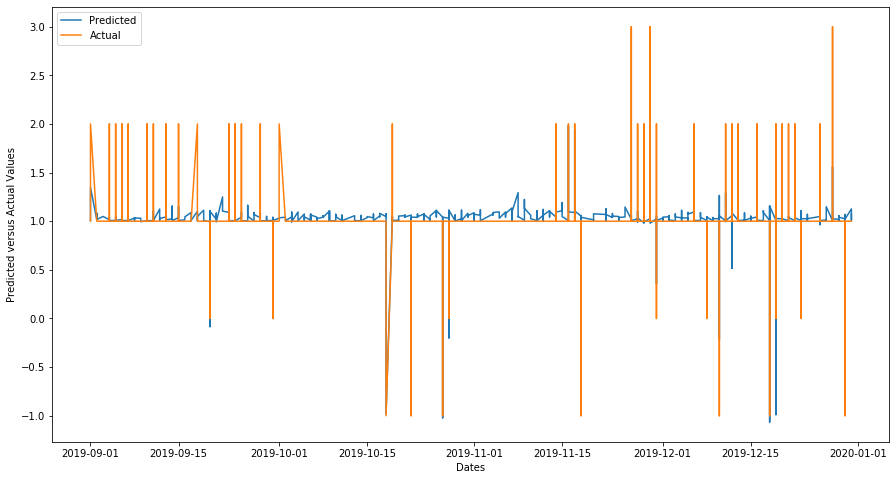

No records to test for calgary city department13
No records to test for calgary city department7
No records to test for calgary city department8
No records to test for calgary city department9
No records to test for calgary city department10
No records to test for nelson city department3
No records to test for nelson city department2
No records to test for nelson city department5
No records to test for nelson city department4
No records to test for nelson city department1
No records to test for nelson city department11
No records to test for nelson city department12
No records to test for nelson city department13
No records to test for nelson city department7
No records to test for nelson city department8
No records to test for nelson city department9
No records to test for nelson city department10
[15:58:29] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for olds department3= 0.049


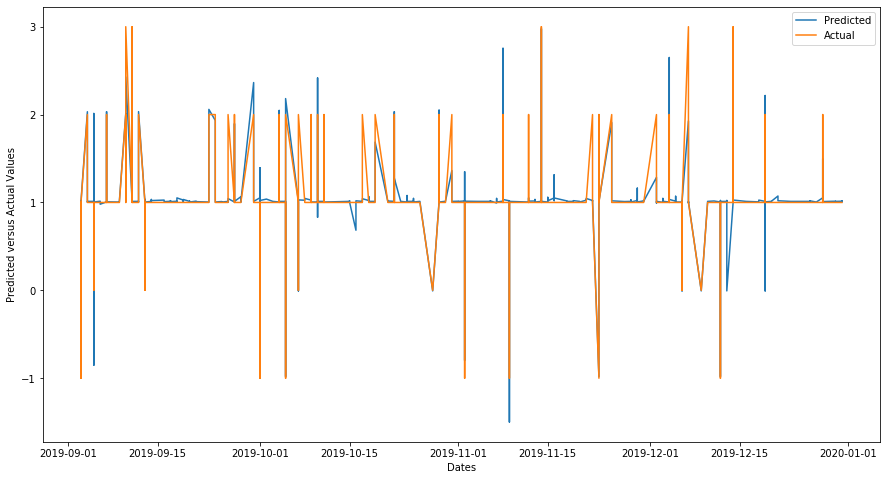

[16:01:09] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for olds department2= 0.112


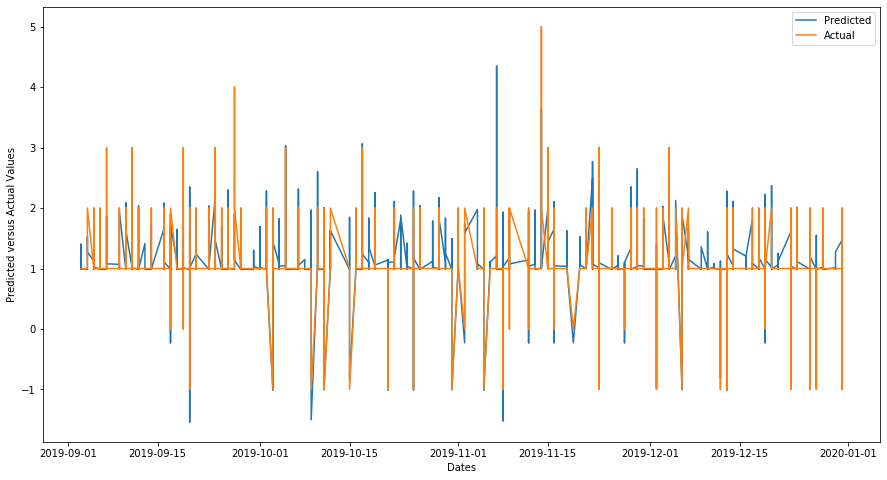

No records to test for olds city department5
[16:01:32] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for olds department4= 0.058


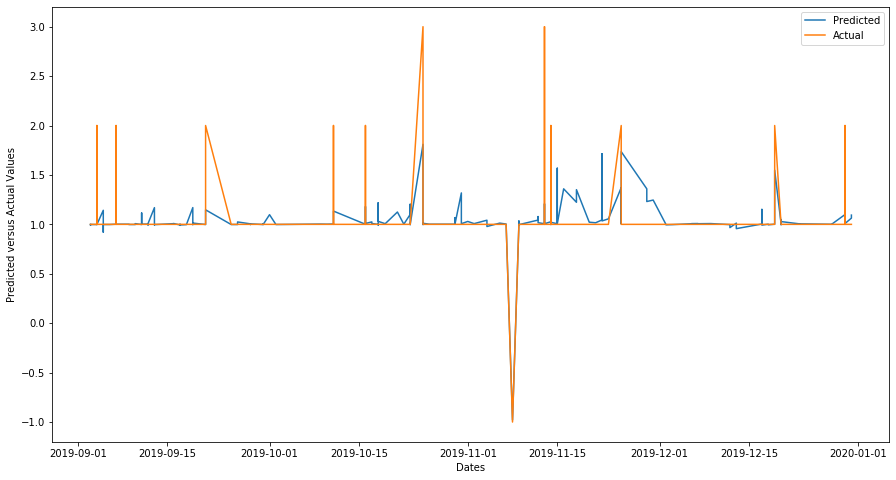

[16:02:06] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for olds department1= 0.071


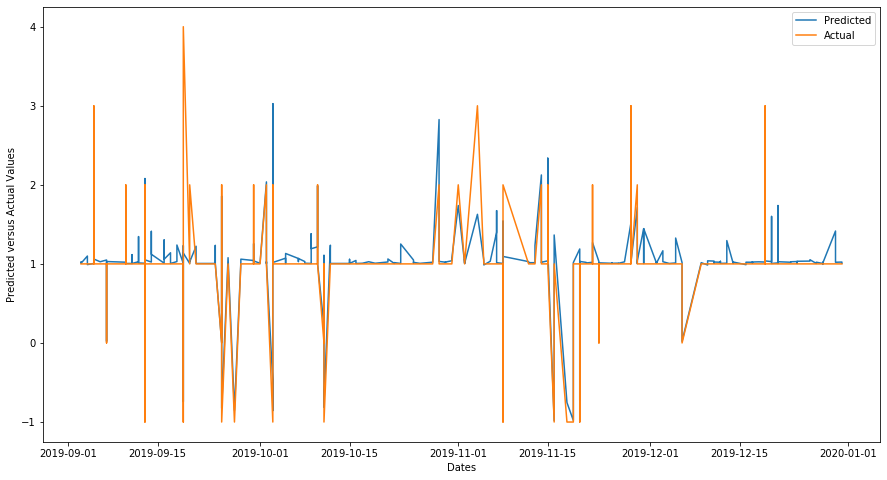

[16:02:19] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for olds department11= 0.184


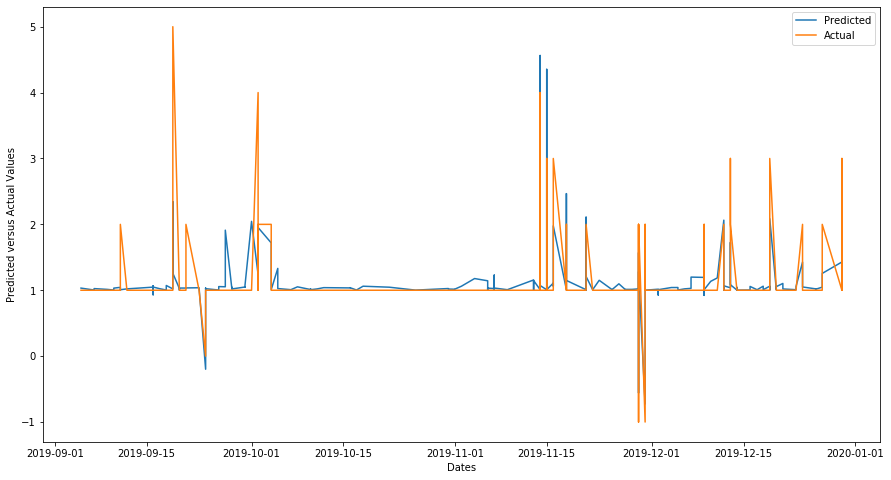

[16:02:38] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for olds department12= 0.034


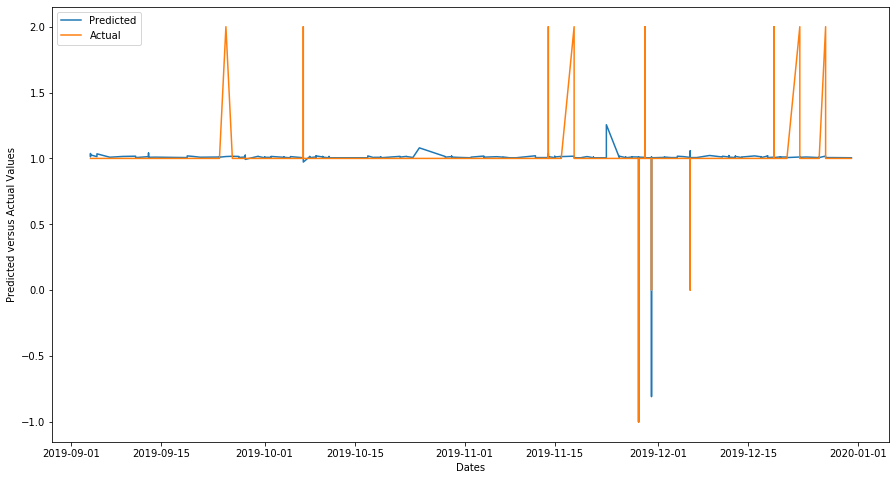

No records to test for olds city department13
No records to test for olds city department7
No records to test for olds city department8
No records to test for olds city department9
No records to test for olds city department10
[16:03:35] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for trail department3= 0.054


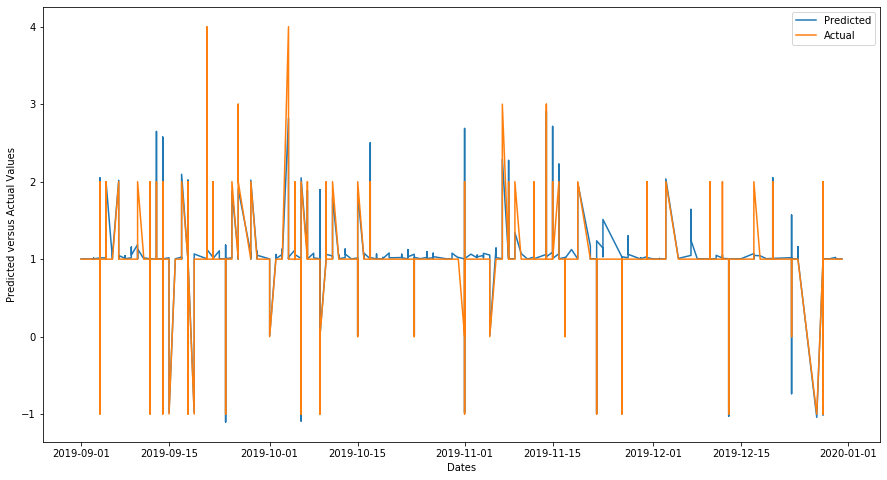

[16:05:47] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for trail department2= 0.093


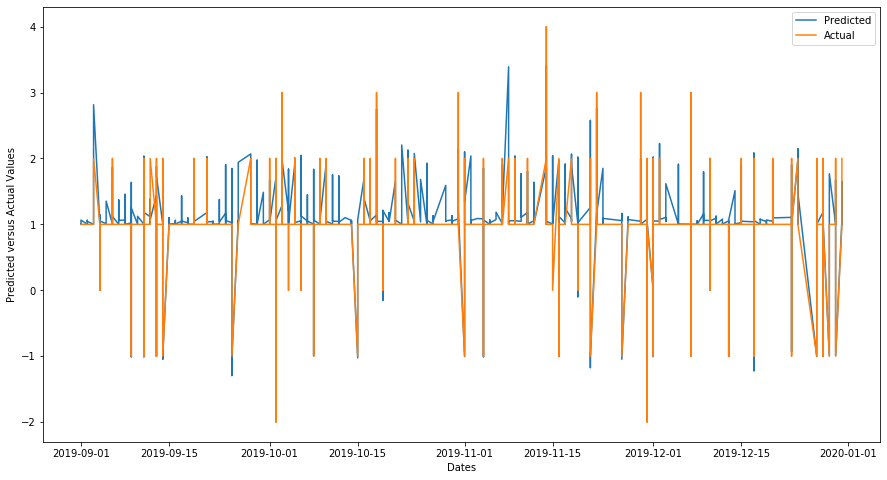

No records to test for trail city department5
[16:06:05] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for trail department4= 0.014


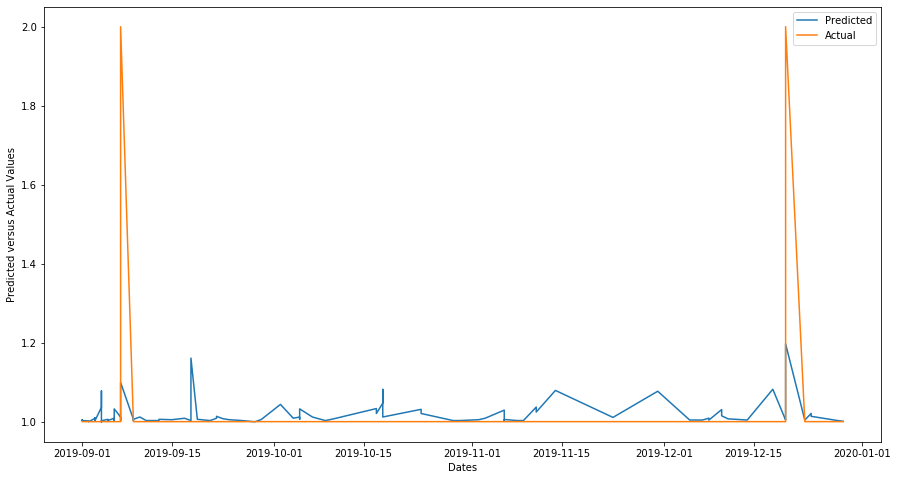

[16:06:35] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for trail department1= 0.084


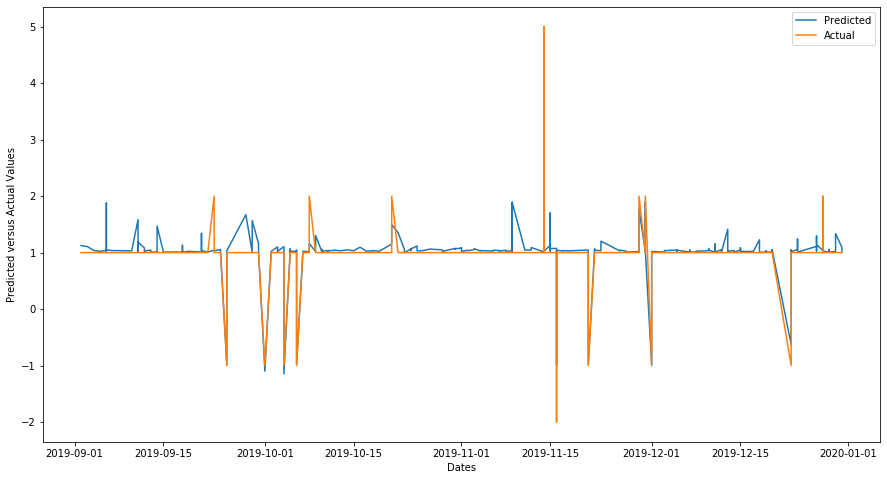

[16:06:45] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for trail department11= 0.213


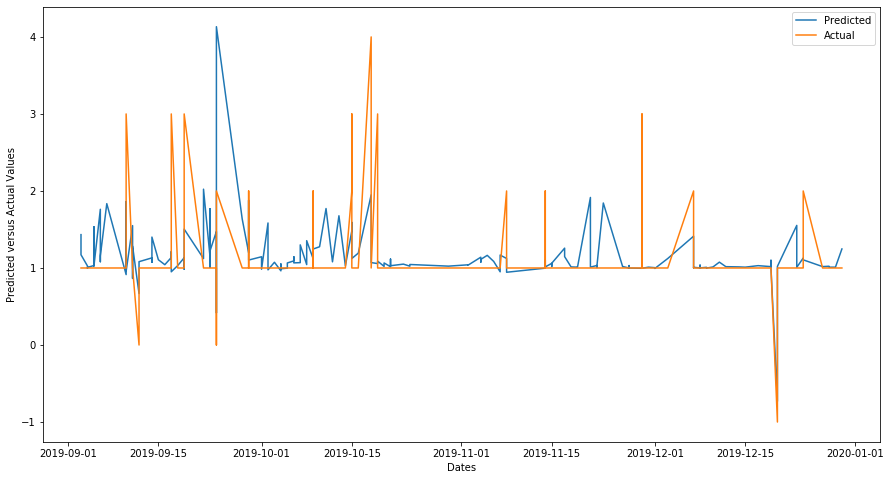

[16:07:01] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for trail department12= 0.011


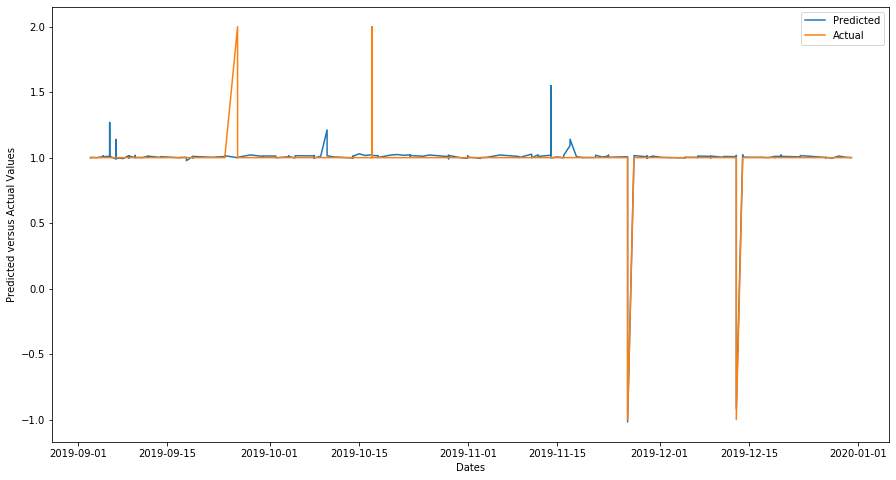

No records to test for trail city department13
No records to test for trail city department7
No records to test for trail city department8
No records to test for trail city department9
No records to test for trail city department10
[16:08:06] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for penticton department3= 0.075


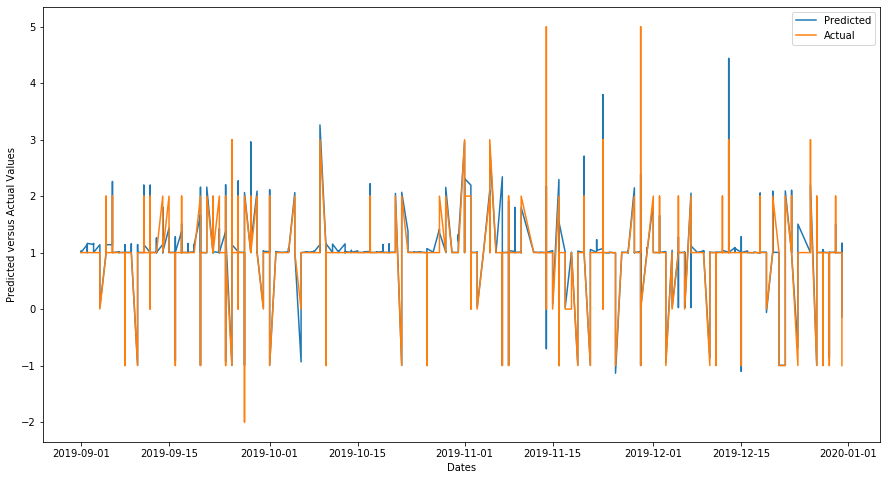

[16:11:16] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for penticton department2= 0.153


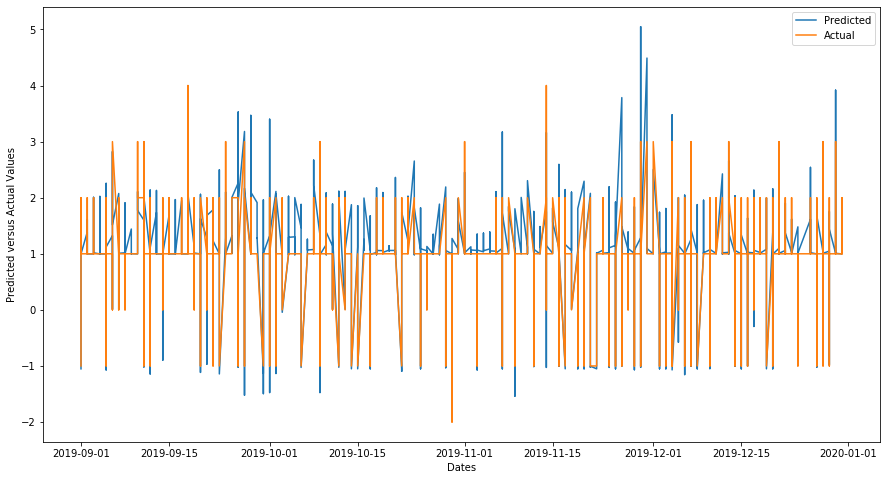

No records to test for penticton city department5
[16:11:49] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for penticton department4= 0.128


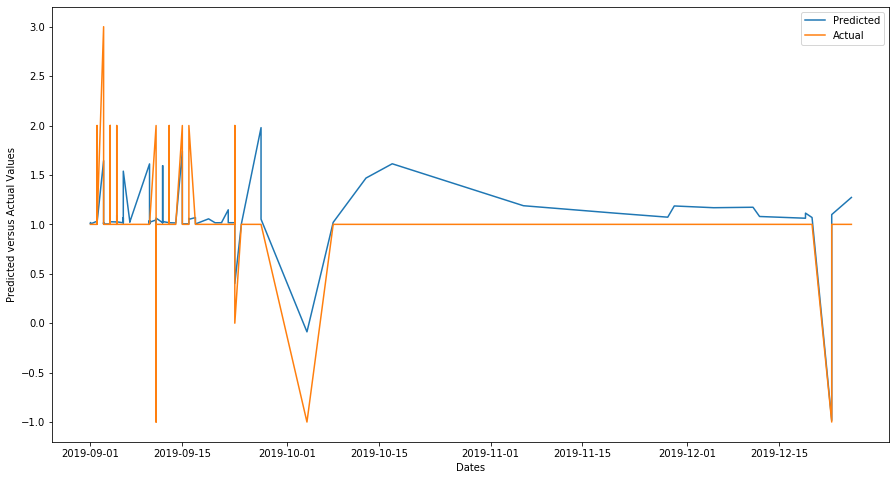

[16:12:24] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for penticton department1= 0.065


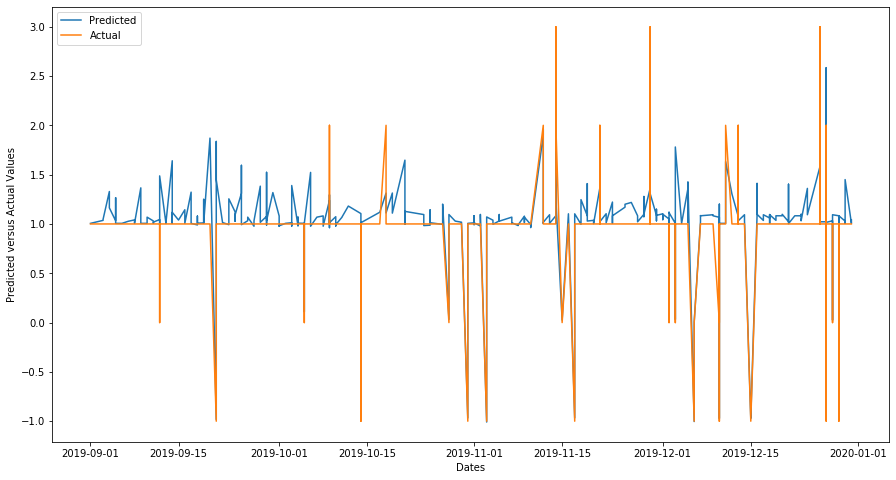

[16:12:42] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for penticton department11= 0.064


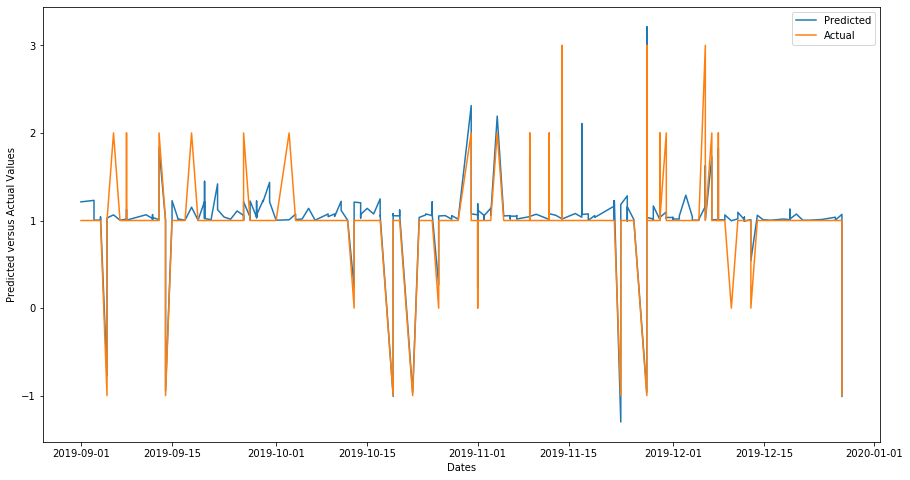

[16:13:04] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for penticton department12= 0.017


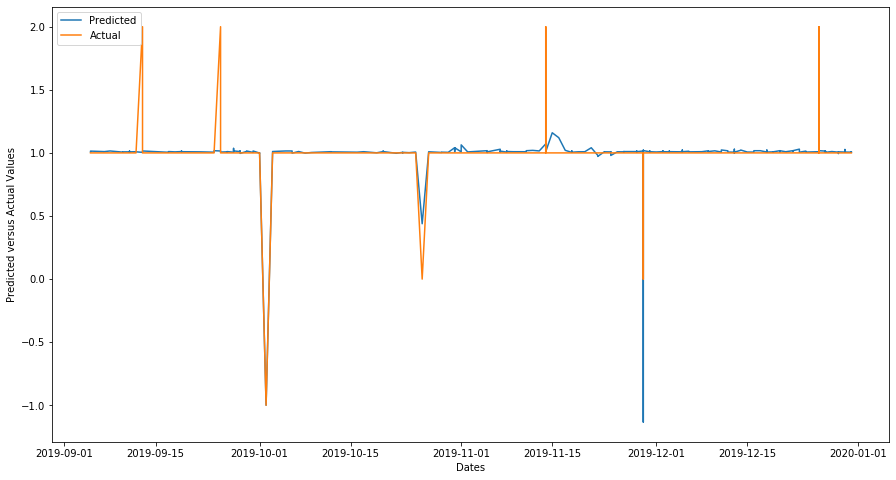

No records to test for penticton city department13
No records to test for penticton city department7
No records to test for penticton city department8
No records to test for penticton city department9
No records to test for penticton city department10
[16:13:36] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for swift current department3= 0.062


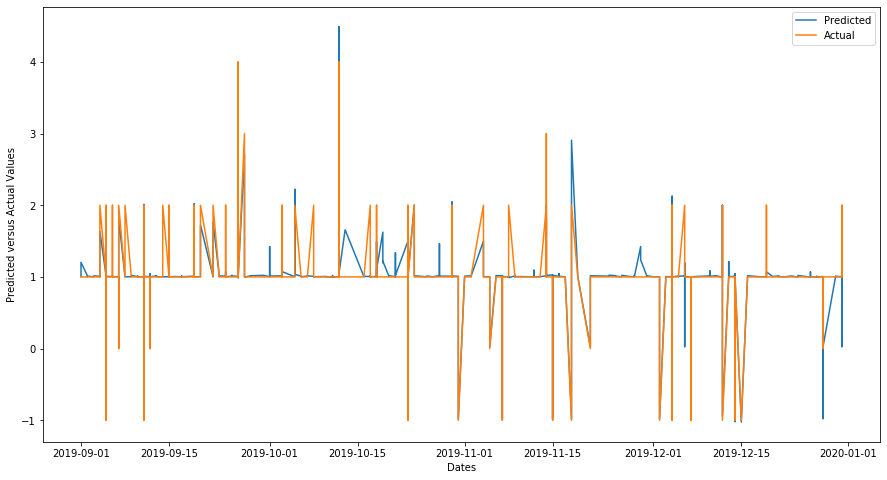

[16:15:20] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for swift current department2= 0.144


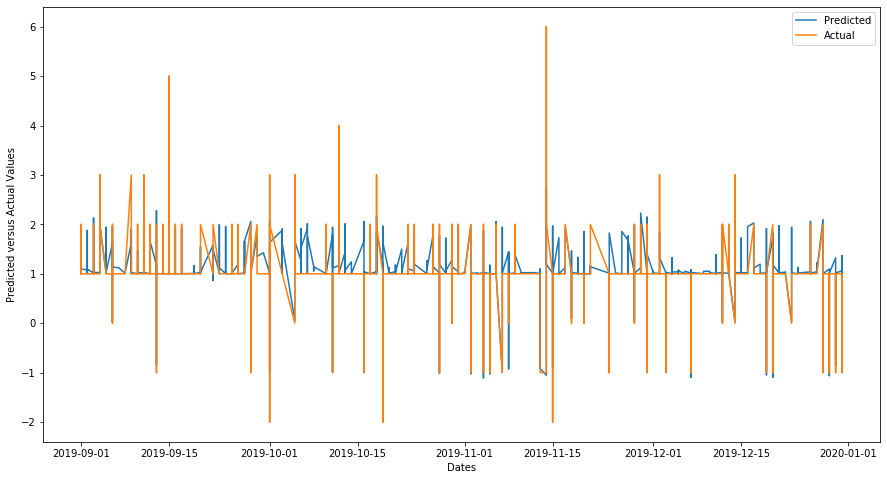

No records to test for swift current city department5
[16:15:34] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for swift current department4= 0.051


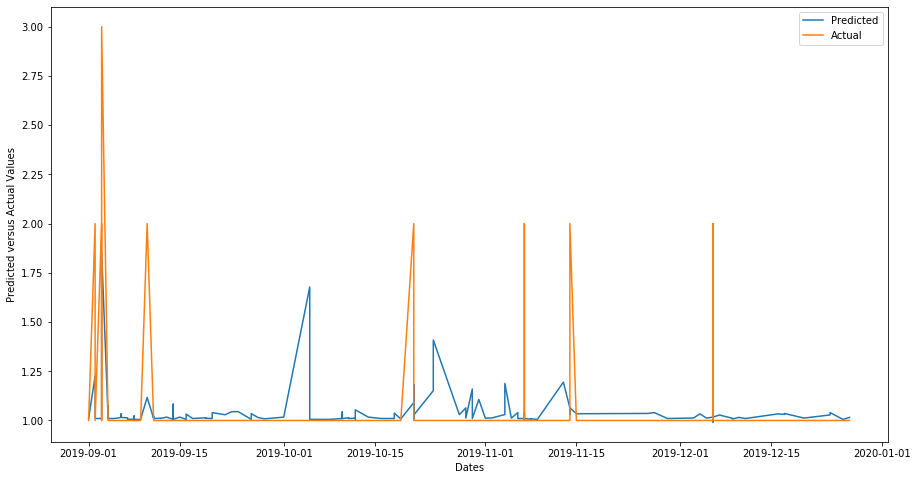

[16:15:55] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for swift current department1= 0.109


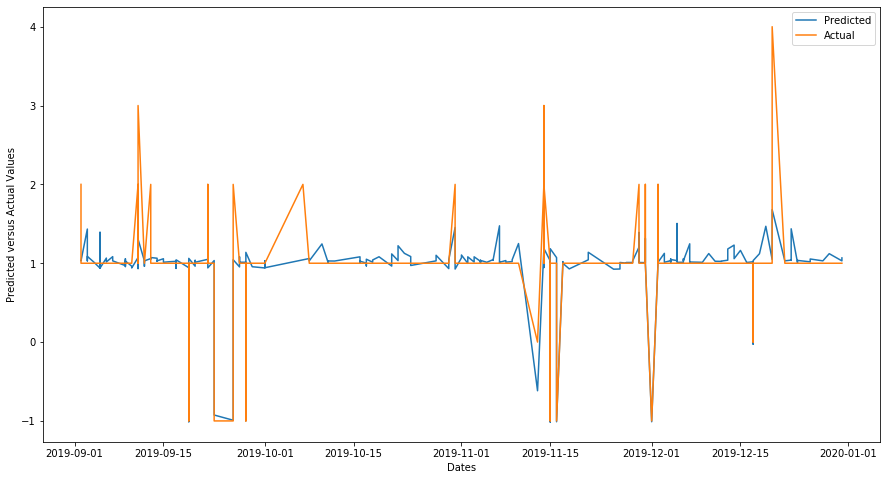

[16:16:10] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for swift current department11= 0.086


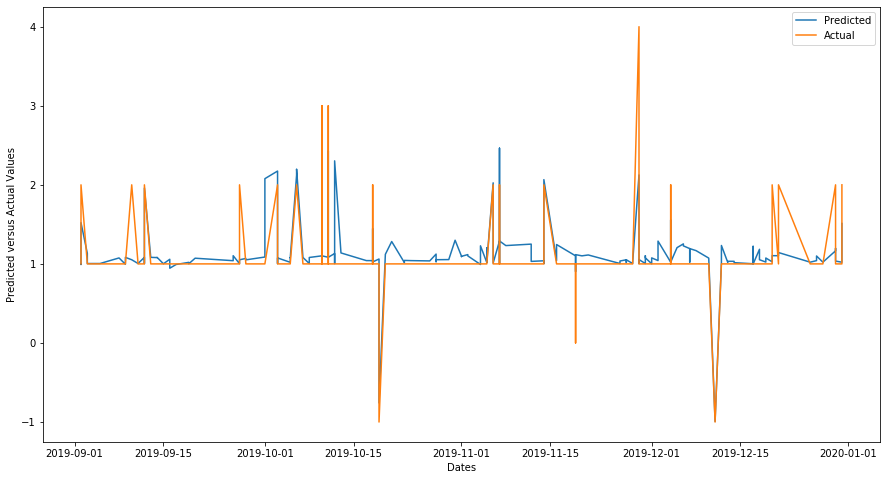

[16:16:30] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for swift current department12= 0.023


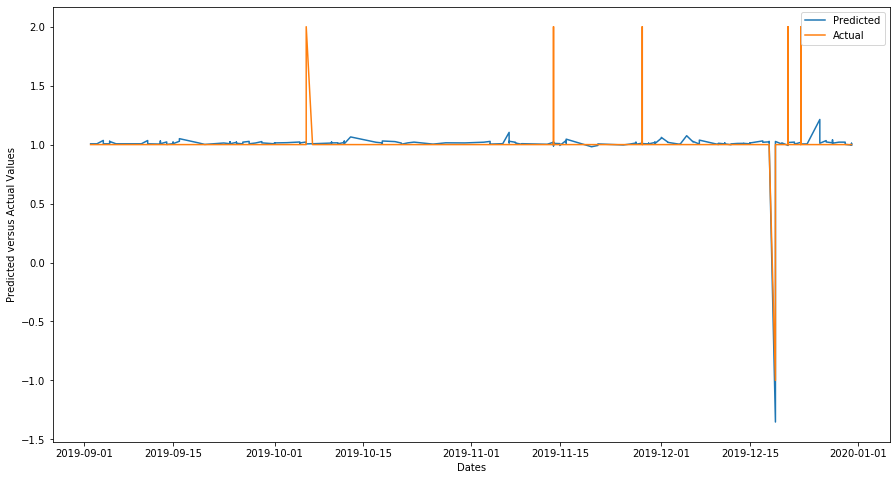

No records to test for swift current city department13
No records to test for swift current city department7
No records to test for swift current city department8
No records to test for swift current city department9
No records to test for swift current city department10
[16:17:59] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for vernon department3= 0.060


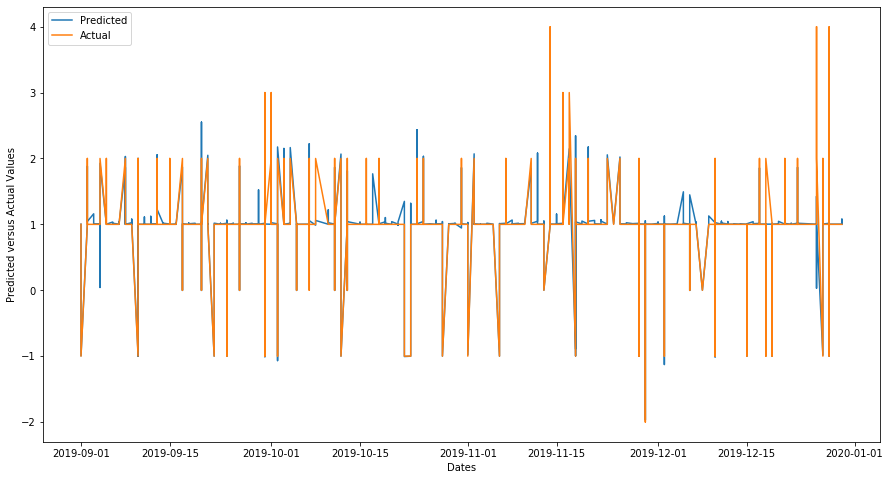

[16:21:47] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for vernon department2= 0.105


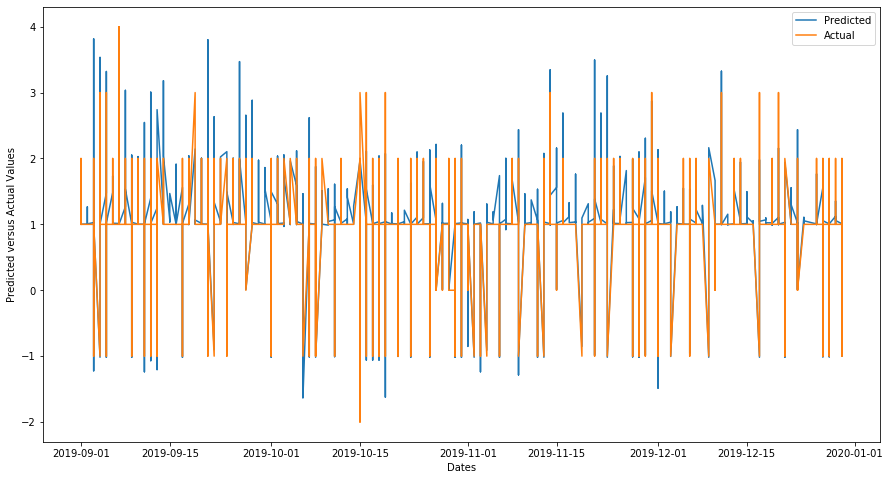

No records to test for vernon city department5
[16:22:16] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for vernon department4= 0.025


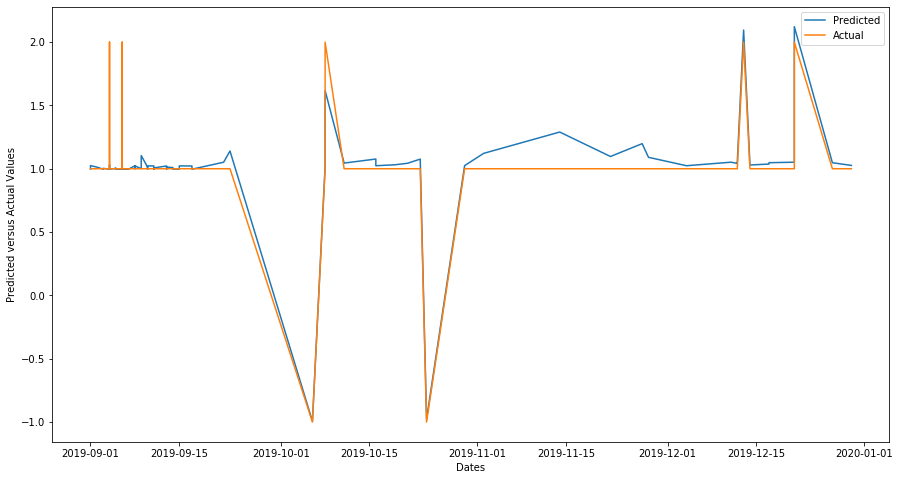

[16:23:03] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for vernon department1= 0.087


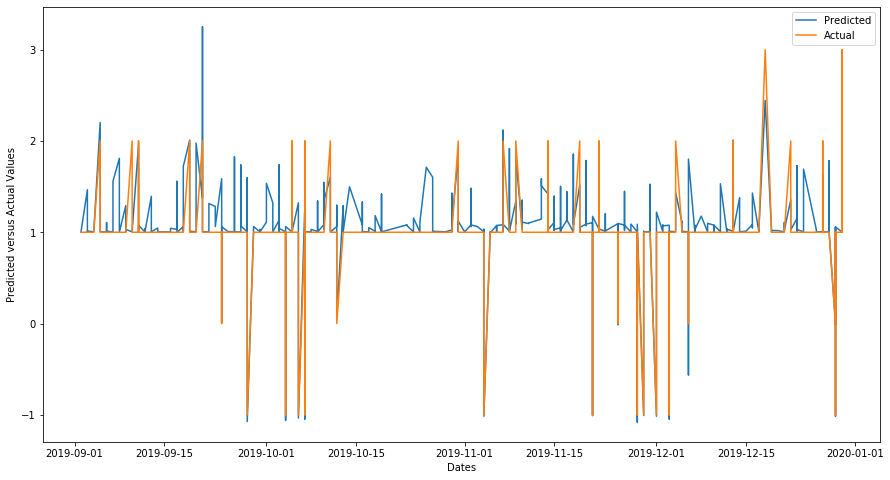

[16:23:21] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for vernon department11= 0.069


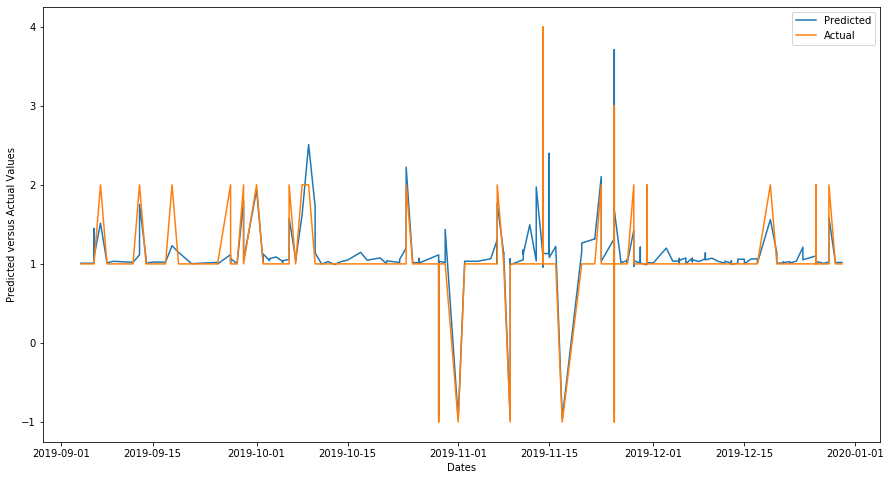

[16:23:43] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for vernon department12= 0.014


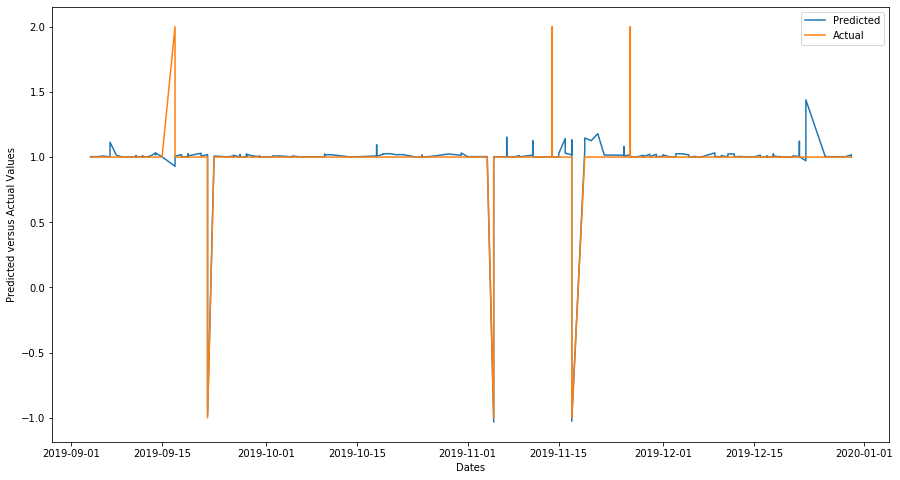

No records to test for vernon city department13
No records to test for vernon city department7
No records to test for vernon city department8
No records to test for vernon city department9
No records to test for vernon city department10
[16:24:00] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for terrace department3= 0.051


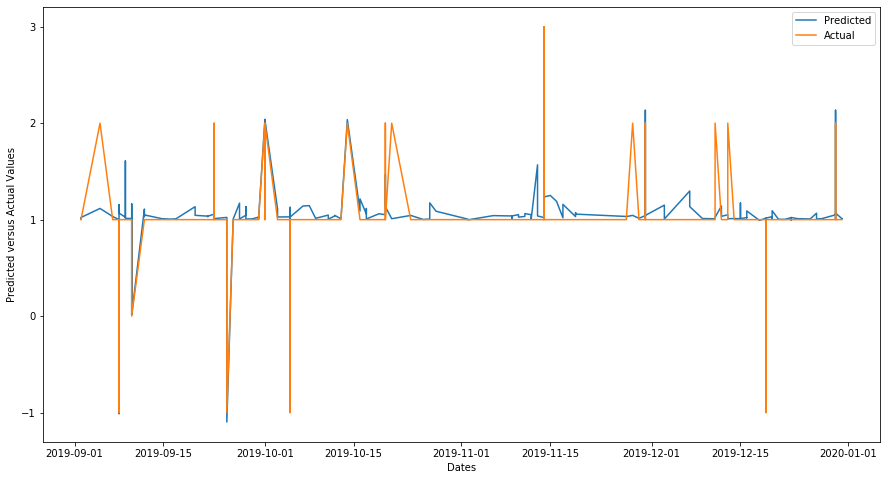

[16:25:04] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for terrace department2= 0.124


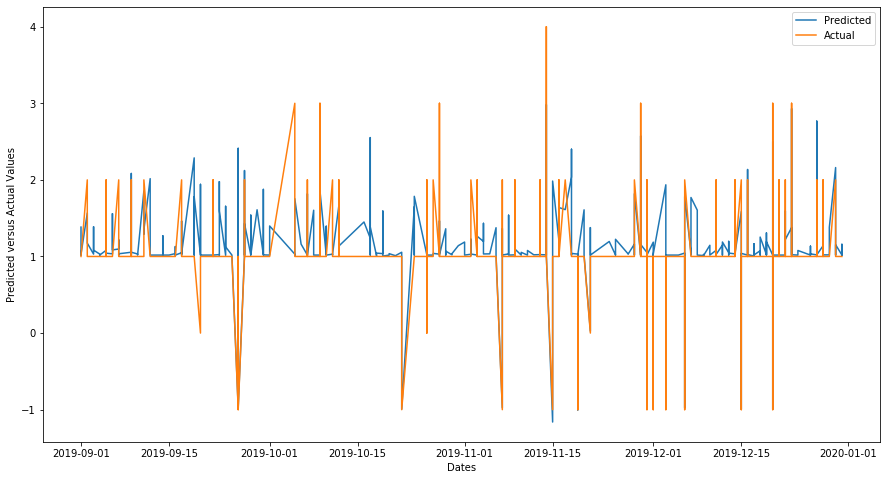

No records to test for terrace city department5
[16:25:17] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for terrace department4= 0.045


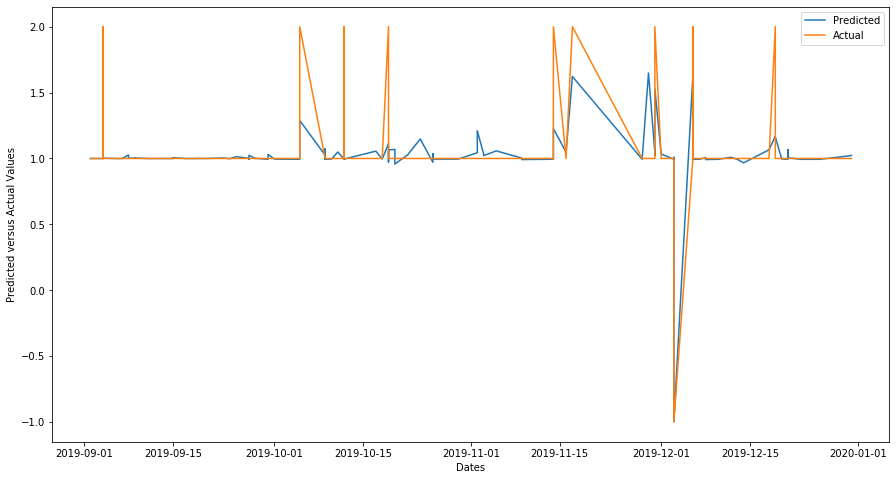

[16:25:29] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for terrace department1= 0.036


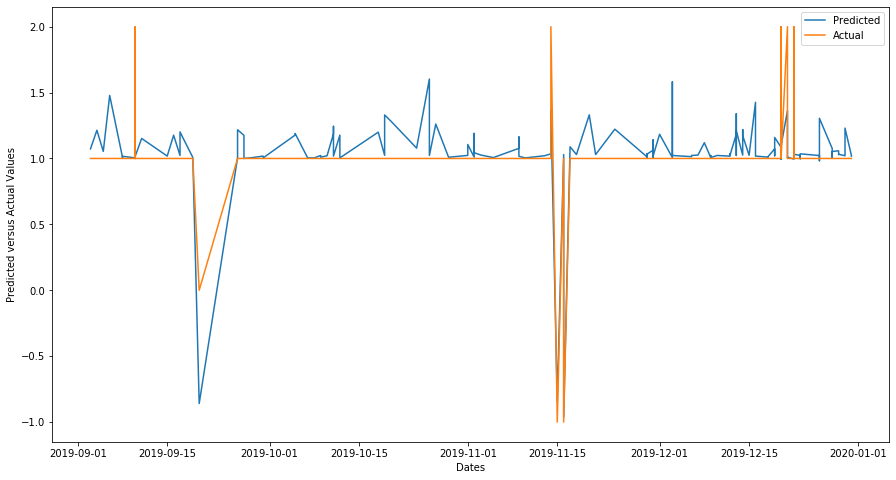

[16:25:36] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for terrace department11= 0.077


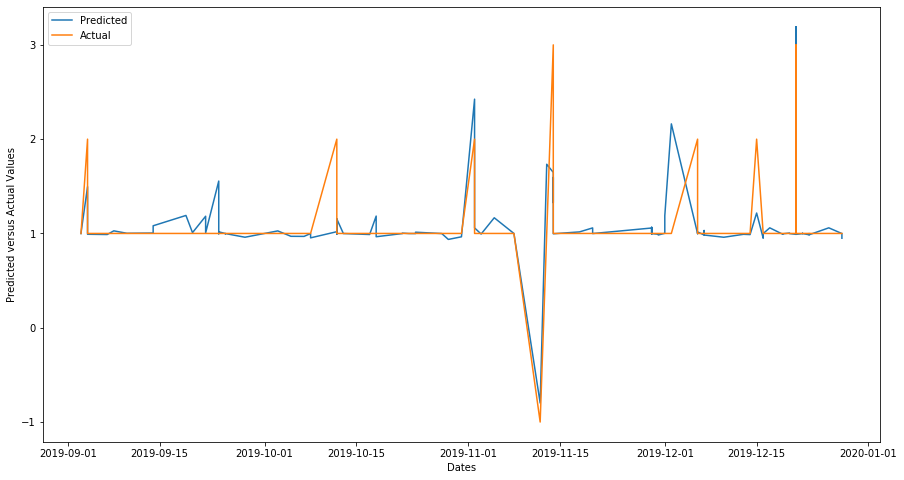

[16:25:43] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for terrace department12= 0.001


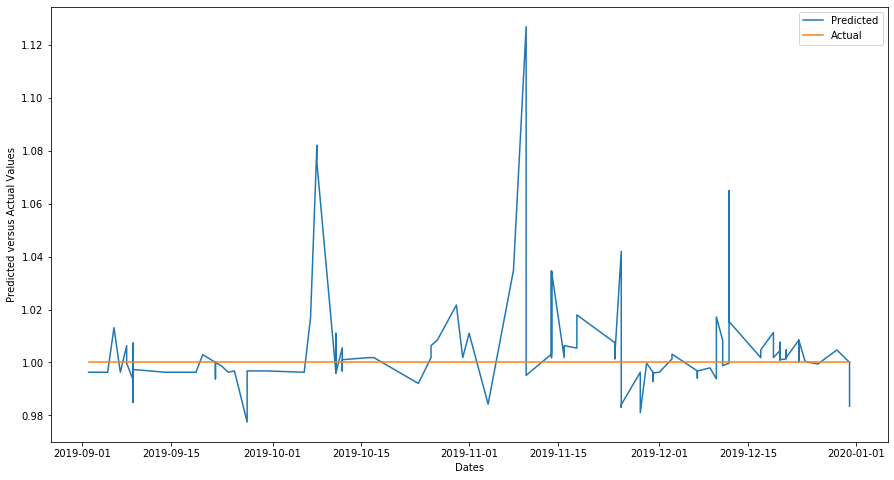

No records to test for terrace city department13
No records to test for terrace city department7
No records to test for terrace city department8
No records to test for terrace city department9
No records to test for terrace city department10


In [33]:
ST = make_city_dept_models(train,test,'st',False)

In [35]:
columns=['RMSE_st','MAE_st','R2_st','city','department','time_st']
df_st= pd.DataFrame(ST,columns=columns)

In [36]:
df_st[['RMSE_st','MAE_st','R2_st','time_st']].mean()

RMSE_st     0.084158
MAE_st      0.118288
R2_st       0.556141
time_st    69.571739
dtype: float64

# TotalQuantity - Modeling with weather

# Model 1: XGBoost

In [ ]:
XGB_W = make_city_dept_models(train,test,'xgb',True)

In [38]:
columns=['RMSE_xgb_w','MAE_xgb_w','R2_xgb_w','city','department','time_xgb_w']
df_xgb_w= pd.DataFrame(XGB_W,columns=columns)

In [39]:
df_xgb_w[['RMSE_xgb_w','MAE_xgb_w','R2_xgb_w','time_xgb_w']].mean()

RMSE_xgb_w    0.079049
MAE_xgb_w     0.128138
R2_xgb_w      0.561796
time_xgb_w    1.067640
dtype: float64

# Model 2: LightGBM

In [ ]:
LGBM_W = make_city_dept_models(train,test,'lgbm',True)

In [41]:
columns=['RMSE_lgbm_w','MAE_lgbm_w','R2_lgbm_w','city','department','time_lgbm_w']
df_lgbm_w= pd.DataFrame(LGBM_W,columns=columns)

In [42]:
df_lgbm_w[['RMSE_lgbm_w','MAE_lgbm_w','R2_lgbm_w','time_lgbm_w']].mean()

RMSE_lgbm_w    0.084956
MAE_lgbm_w     0.135573
R2_lgbm_w      0.556621
time_lgbm_w    0.093975
dtype: float64

# Model 3: Stacked Model

[16:33:39] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for medicine hat department3= 0.080


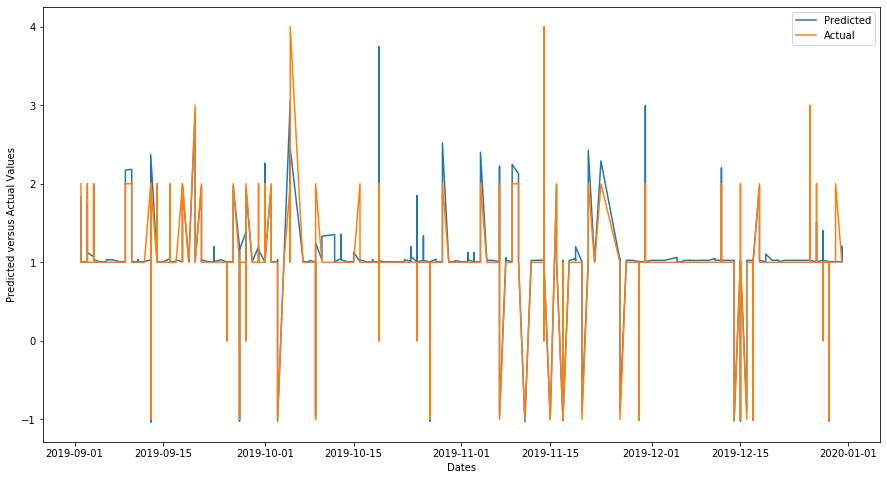

[16:43:31] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for medicine hat department2= 0.124


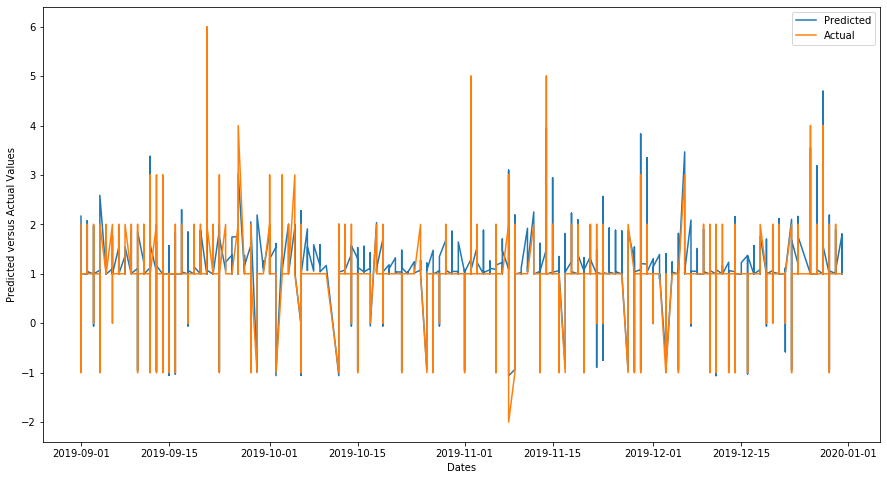

No records to test for medicine hat city department5
[16:44:23] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for medicine hat department4= 0.048


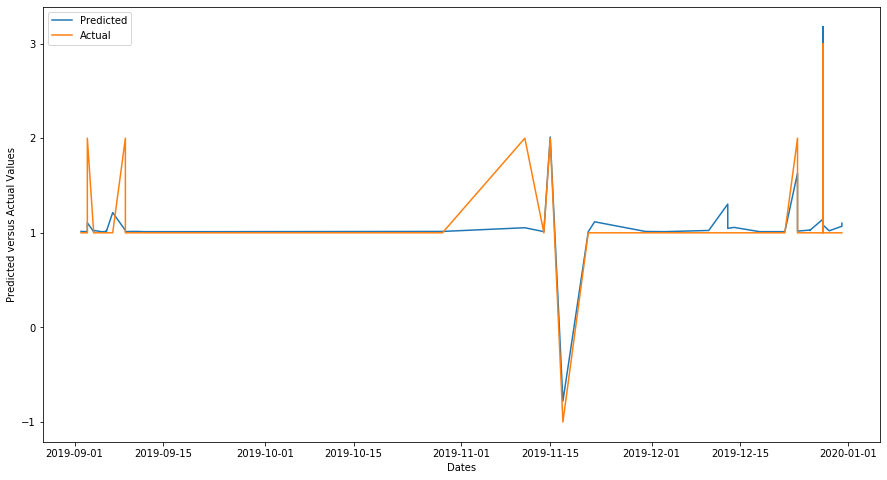

[16:45:37] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for medicine hat department1= 0.063


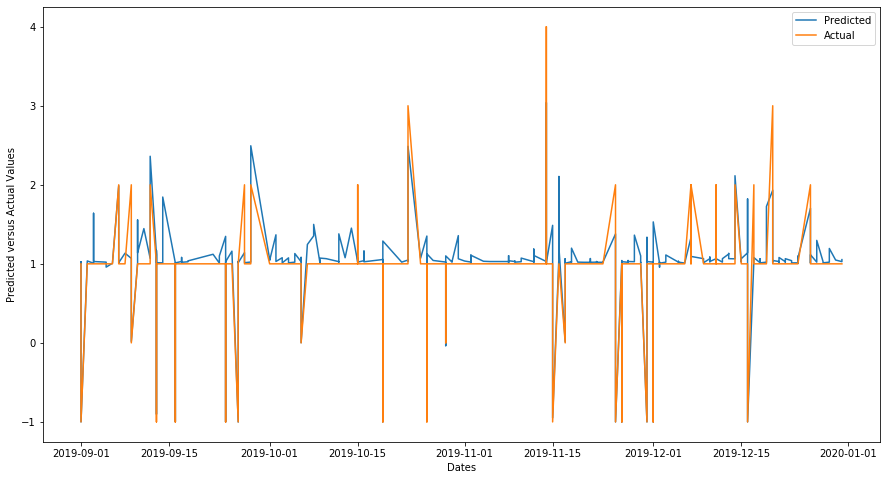

[16:46:05] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for medicine hat department11= 0.188


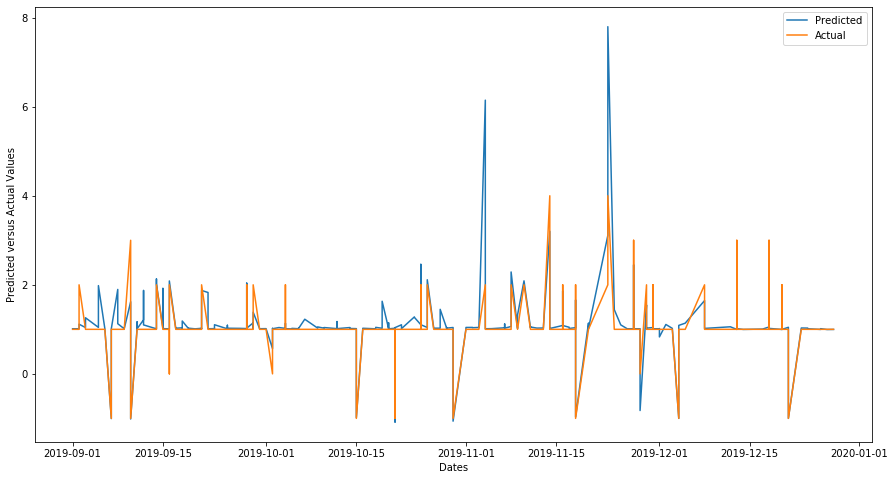

[16:46:45] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for medicine hat department12= 0.012


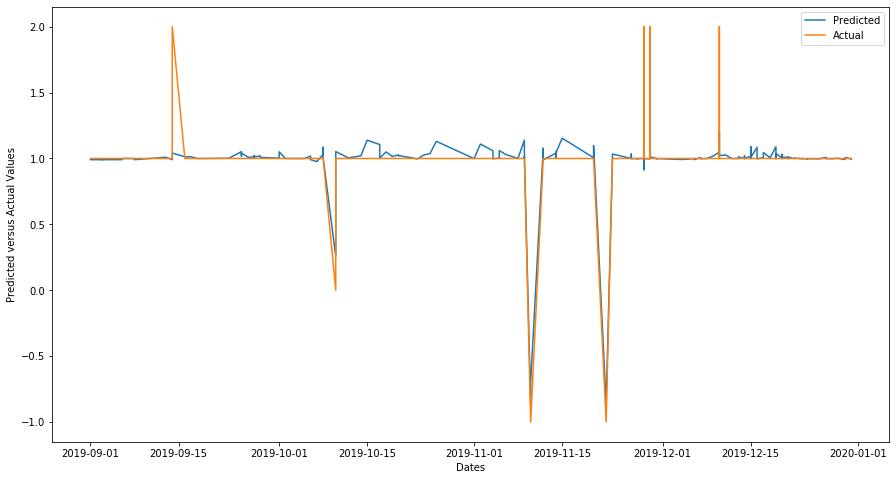

No records to test for medicine hat city department13
No records to test for medicine hat city department7
No records to test for medicine hat city department8
No records to test for medicine hat city department9
No records to test for medicine hat city department10
[16:47:37] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for yorkton department3= 0.050


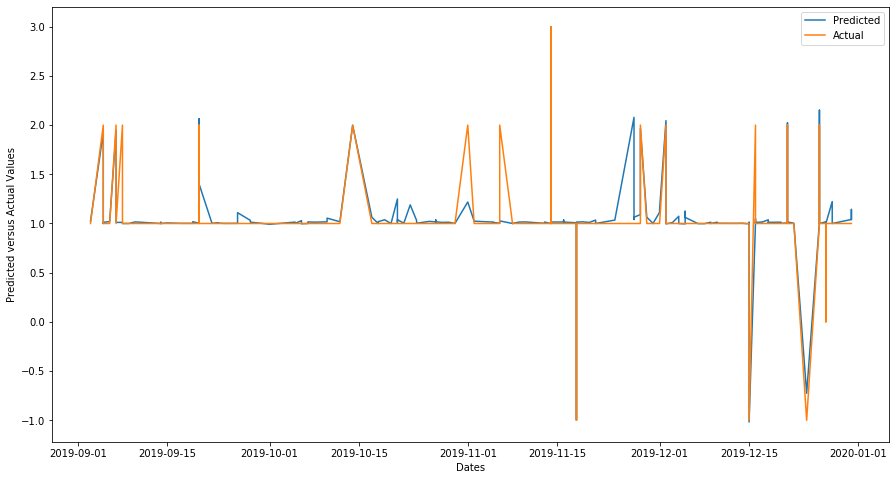

[16:50:29] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for yorkton department2= 0.073


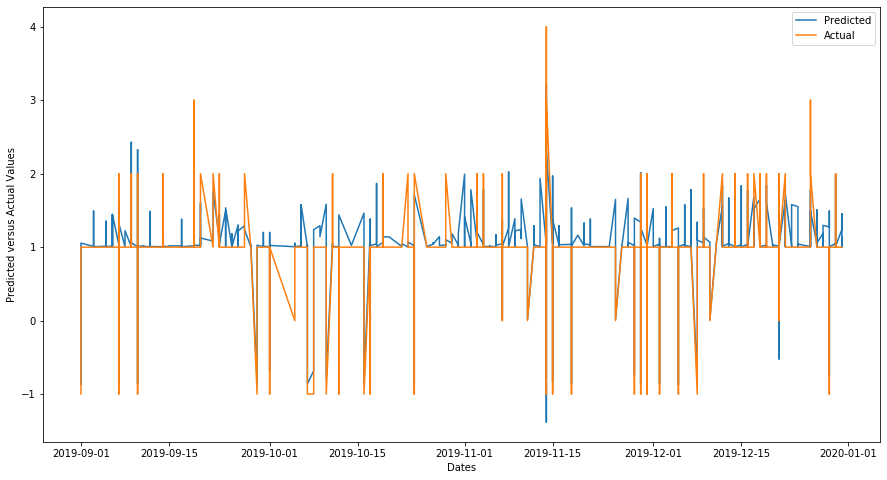

No records to test for yorkton city department5
[16:51:03] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for yorkton department4= 0.110


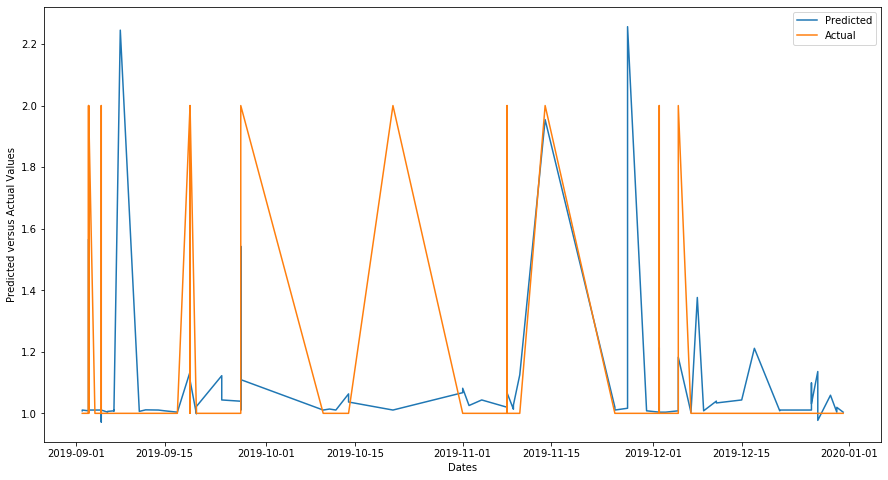

[16:51:40] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for yorkton department1= 0.028


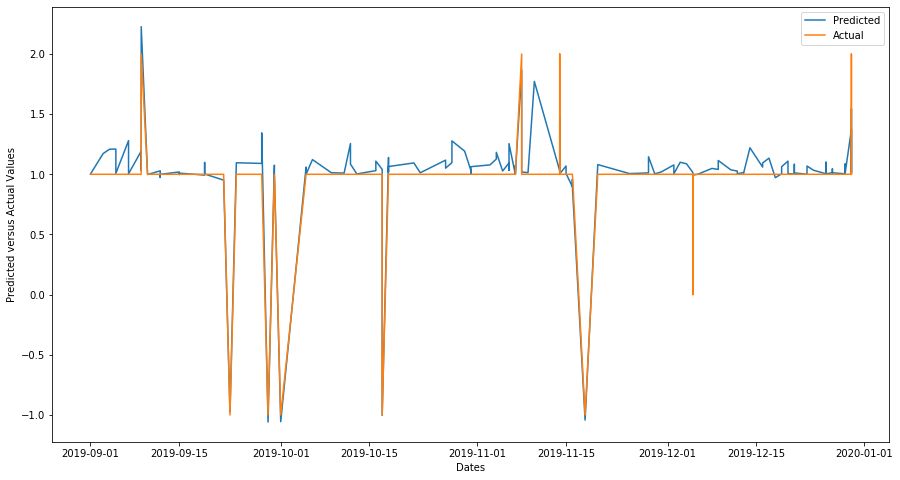

[16:51:59] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for yorkton department11= 0.111


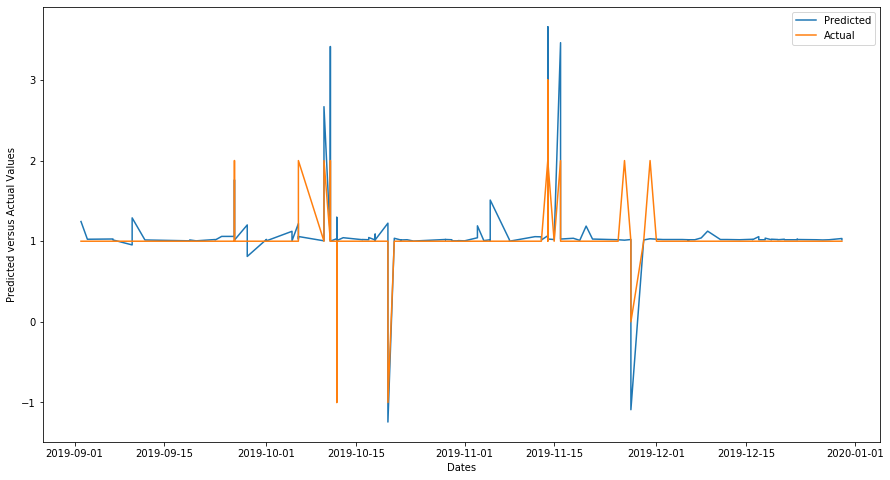

[16:52:16] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for yorkton department12= 0.000


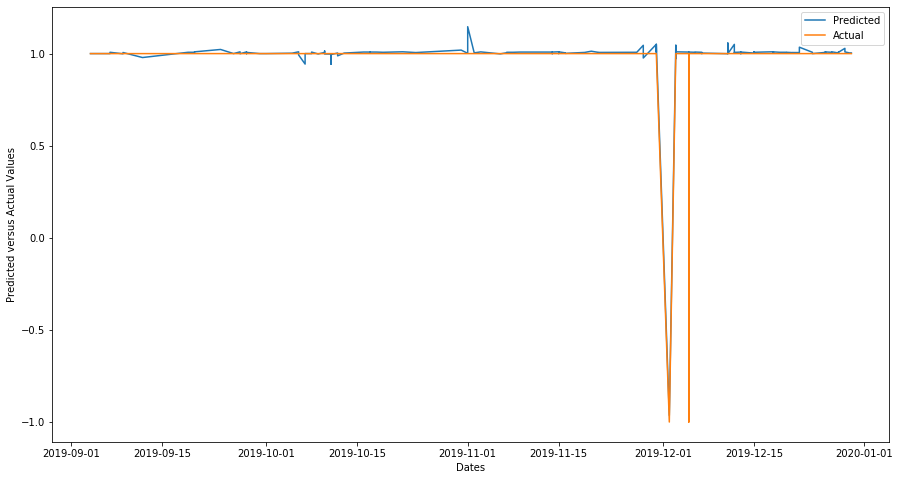

No records to test for yorkton city department13
No records to test for yorkton city department7
No records to test for yorkton city department8
No records to test for yorkton city department9
No records to test for yorkton city department10
[16:55:26] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kamloops department3= 0.100


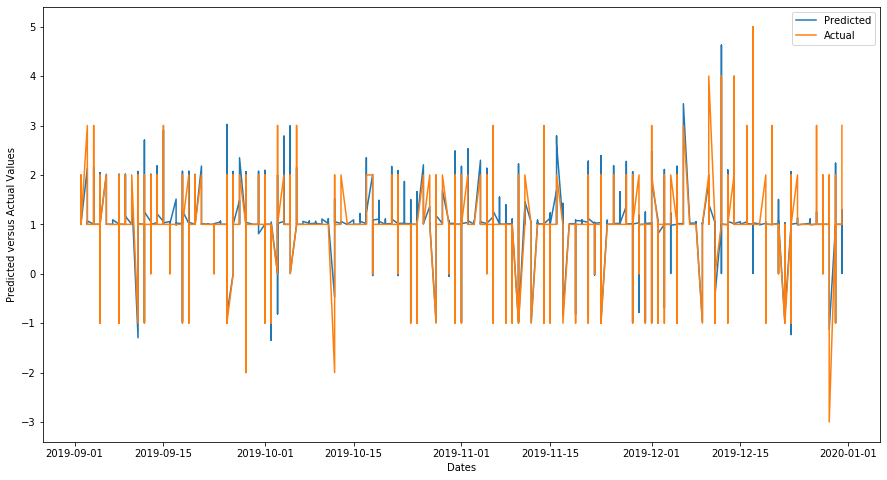

[17:06:51] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kamloops department2= 0.162


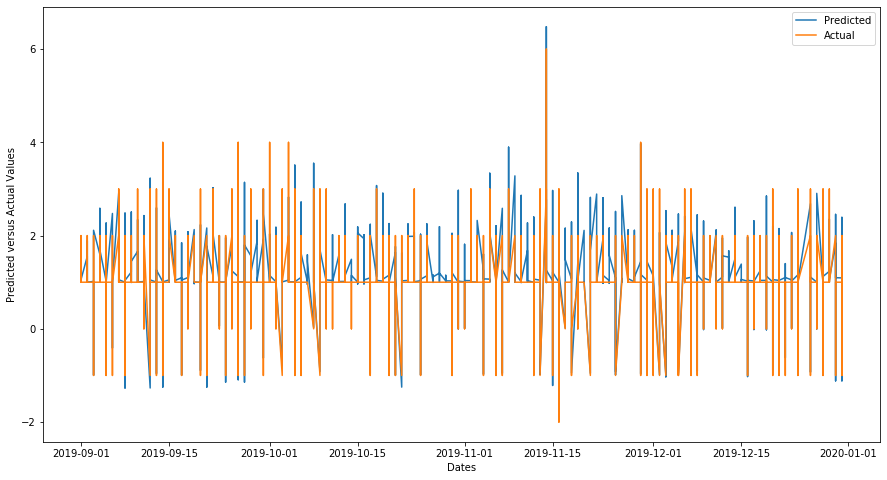

[17:07:02] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kamloops department5= 0.074


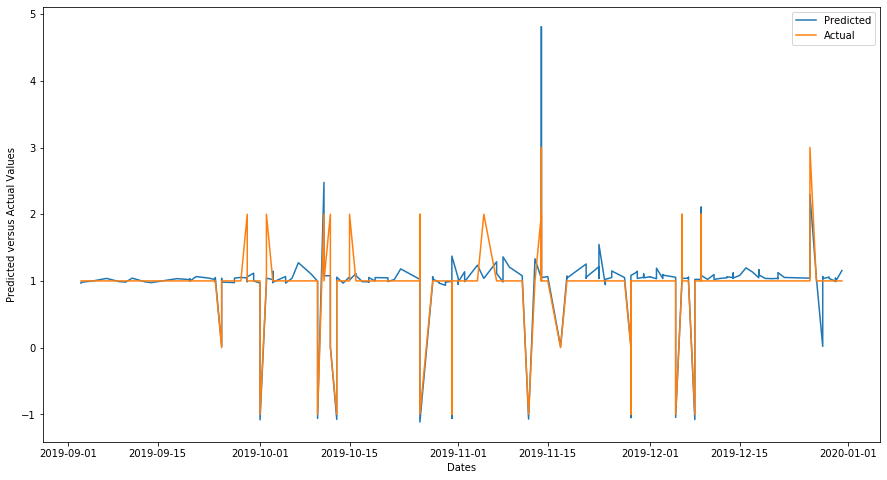

[17:08:18] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kamloops department4= 0.155


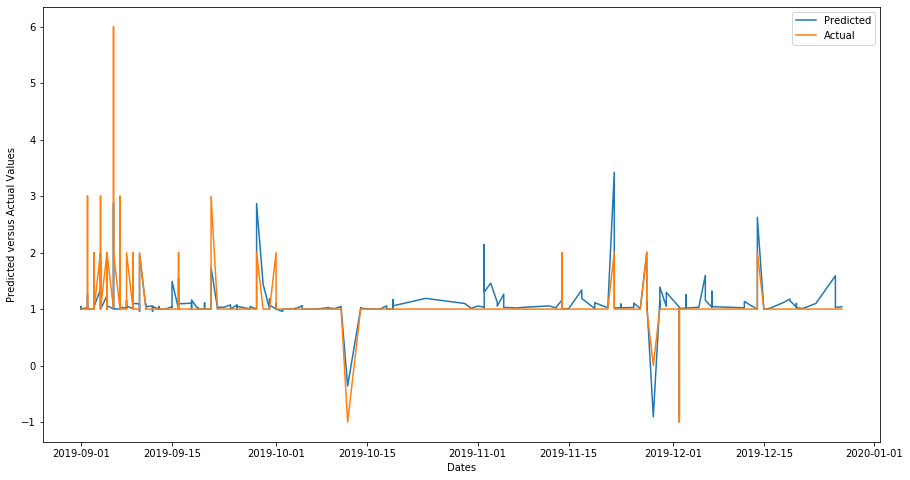

[17:10:18] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kamloops department1= 0.074


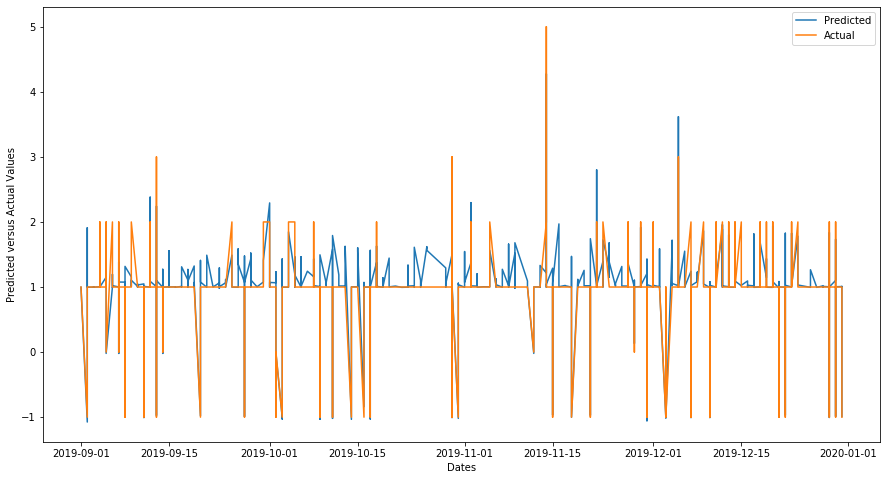

[17:10:57] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kamloops department11= 0.144


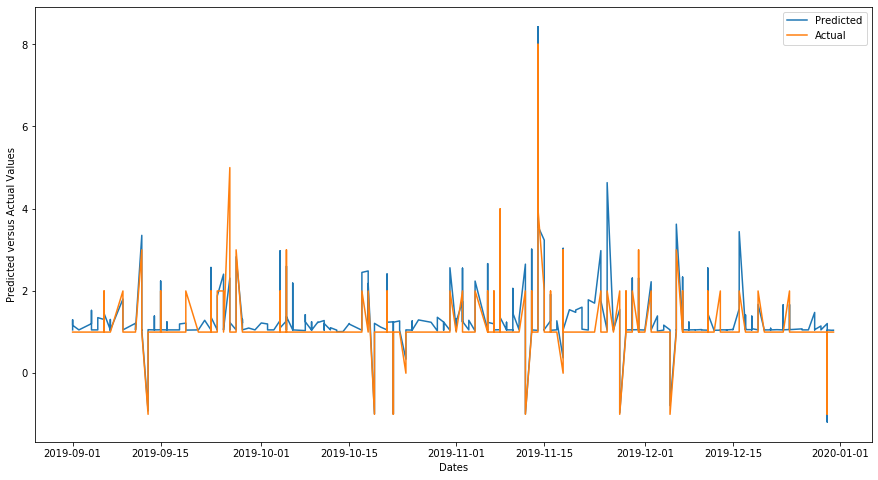

[17:11:52] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kamloops department12= 0.037


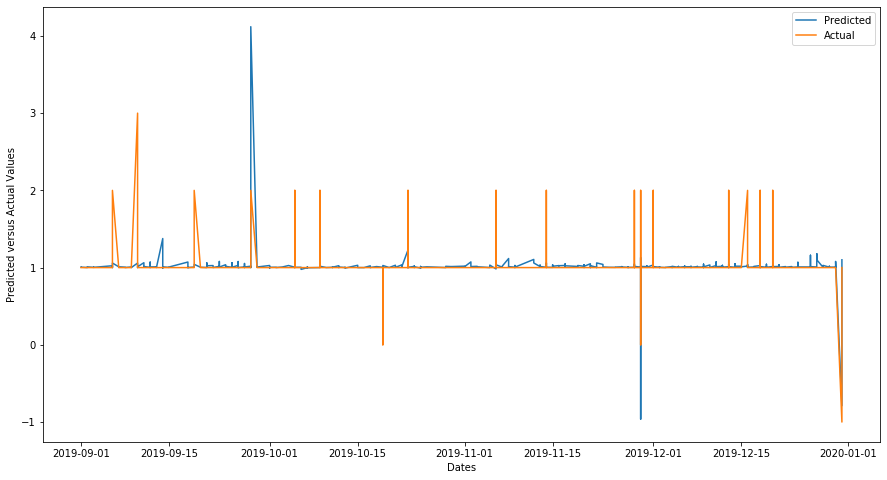

No records to test for kamloops city department13
No records to test for kamloops city department7
No records to test for kamloops city department8
No records to test for kamloops city department9
No records to test for kamloops city department10
[17:13:05] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for lethbridge department3= 0.049


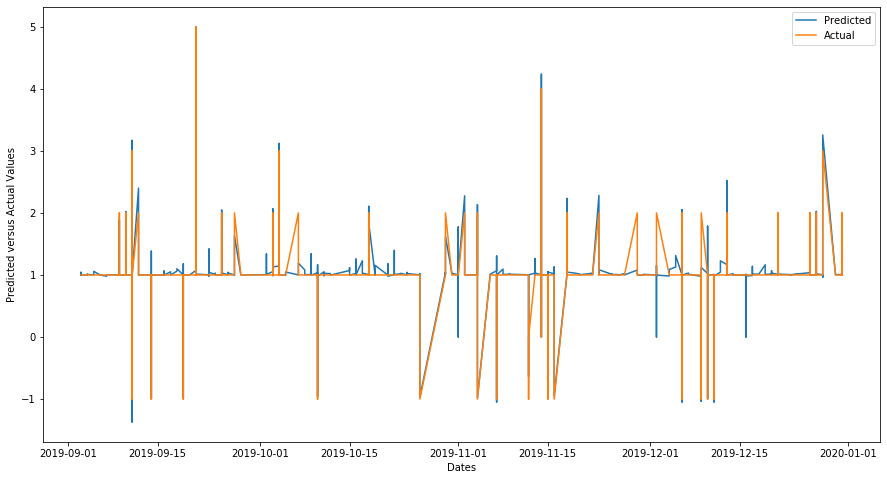

[17:17:12] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for lethbridge department2= 0.141


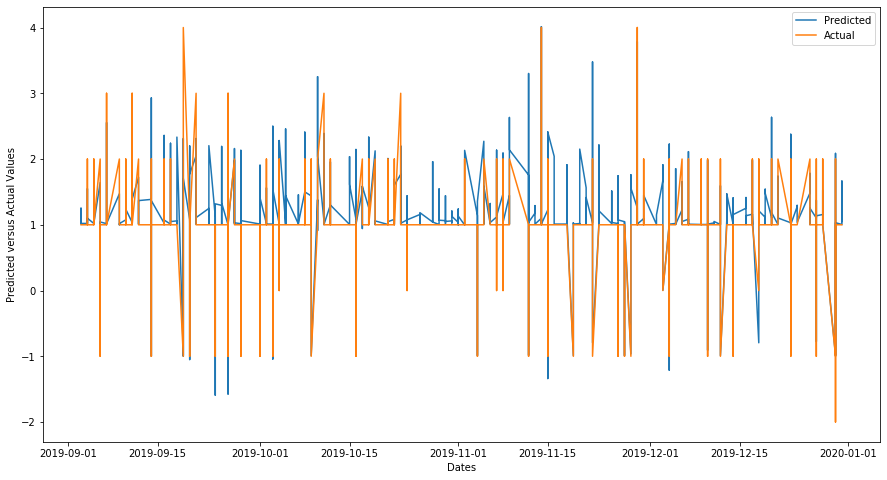

No records to test for lethbridge city department5
[17:17:47] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for lethbridge department4= 0.087


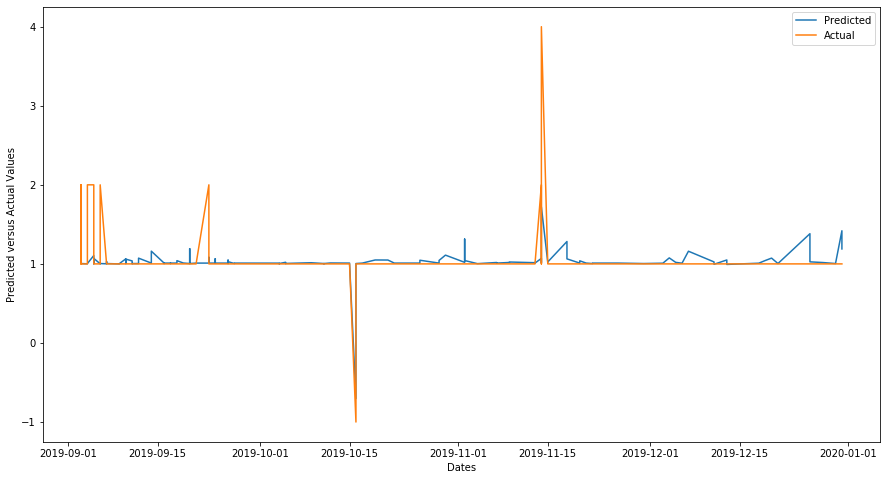

[17:18:37] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for lethbridge department1= 0.045


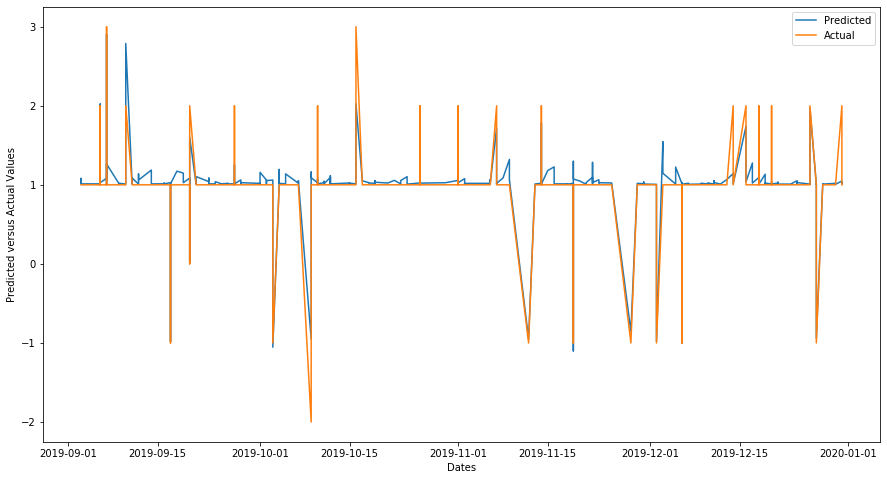

[17:18:56] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for lethbridge department11= 0.090


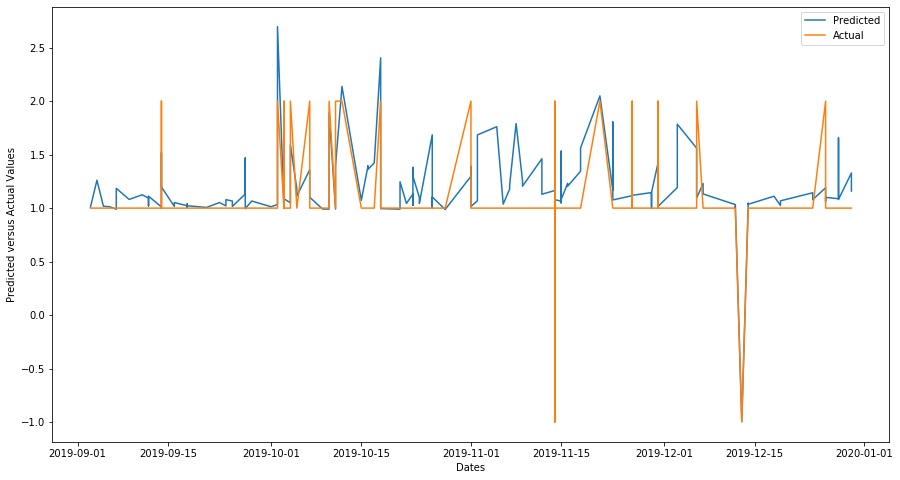

[17:19:22] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for lethbridge department12= 0.020


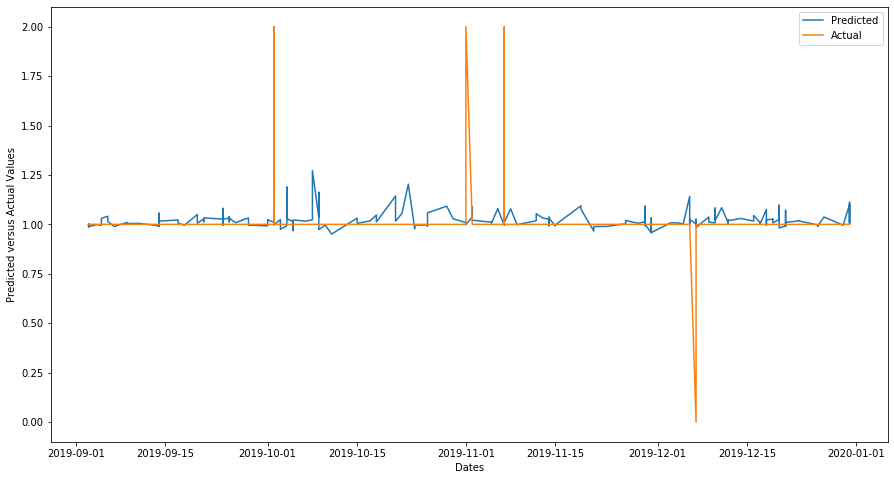

No records to test for lethbridge city department13
No records to test for lethbridge city department7
No records to test for lethbridge city department8
No records to test for lethbridge city department9
No records to test for lethbridge city department10
[17:20:33] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for red deer department3= 0.048


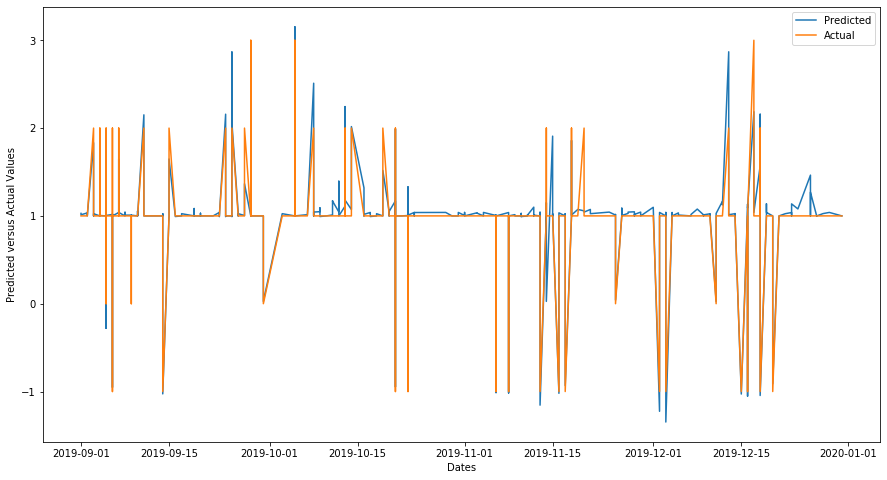

[17:23:48] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for red deer department2= 0.150


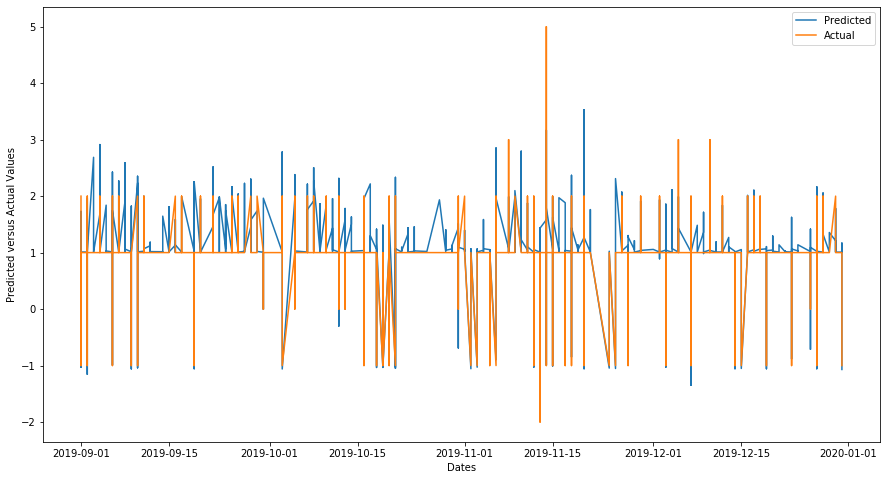

No records to test for red deer city department5
[17:24:16] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for red deer department4= 0.083


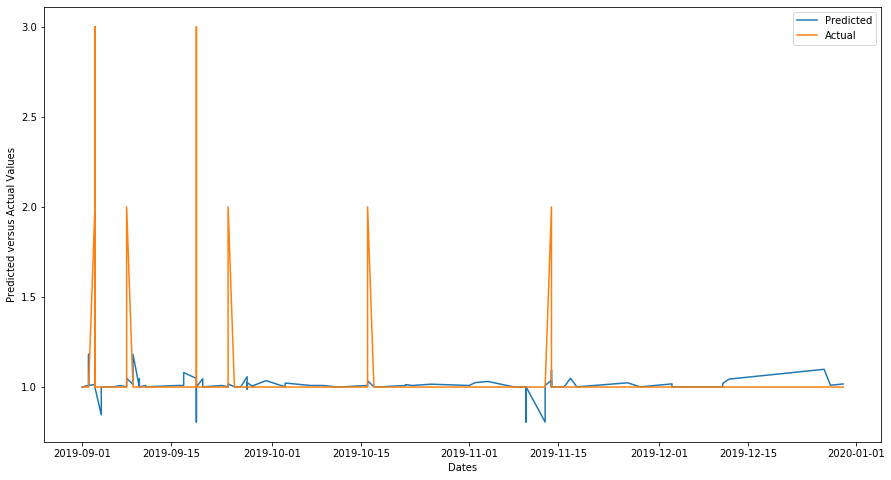

[17:24:49] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for red deer department1= 0.038


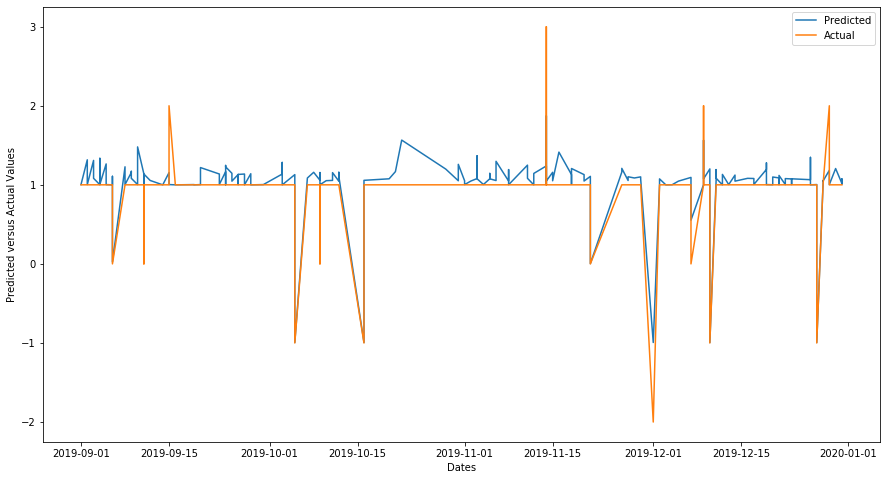

[17:25:03] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for red deer department11= 0.084


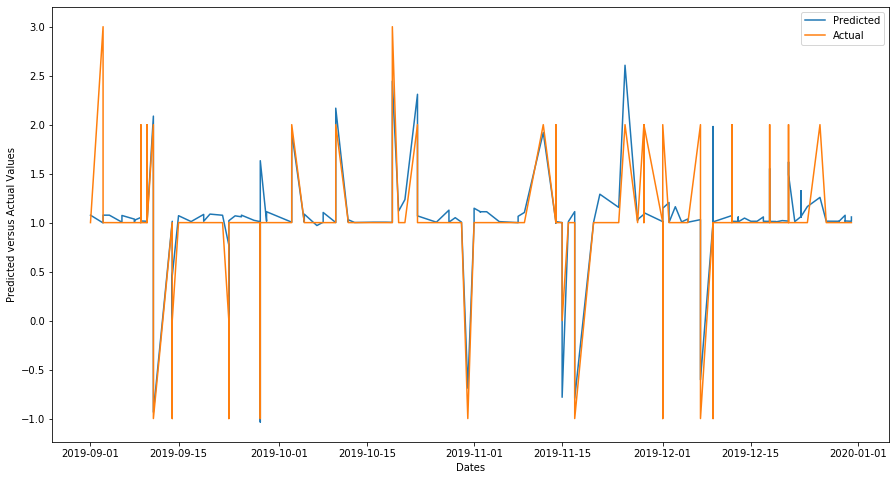

[17:25:20] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for red deer department12= 0.019


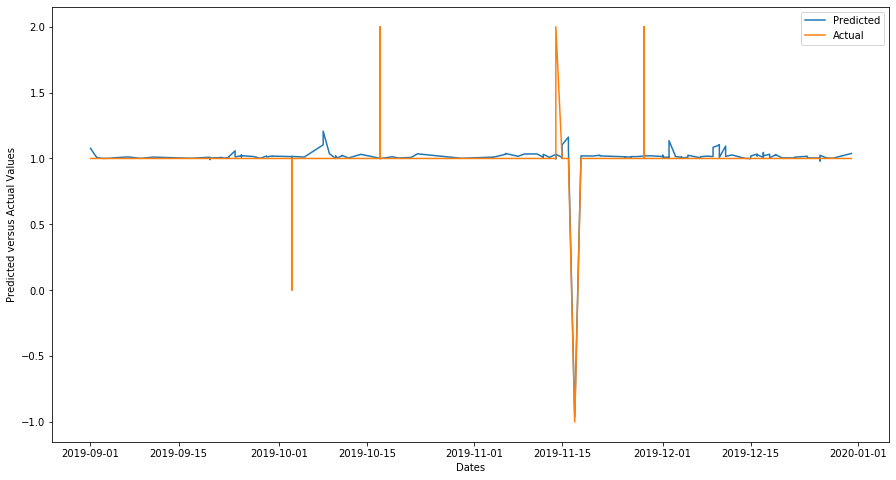

No records to test for red deer city department13
No records to test for red deer city department7
No records to test for red deer city department8
No records to test for red deer city department9
No records to test for red deer city department10
[17:29:10] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for regina department3= 0.104


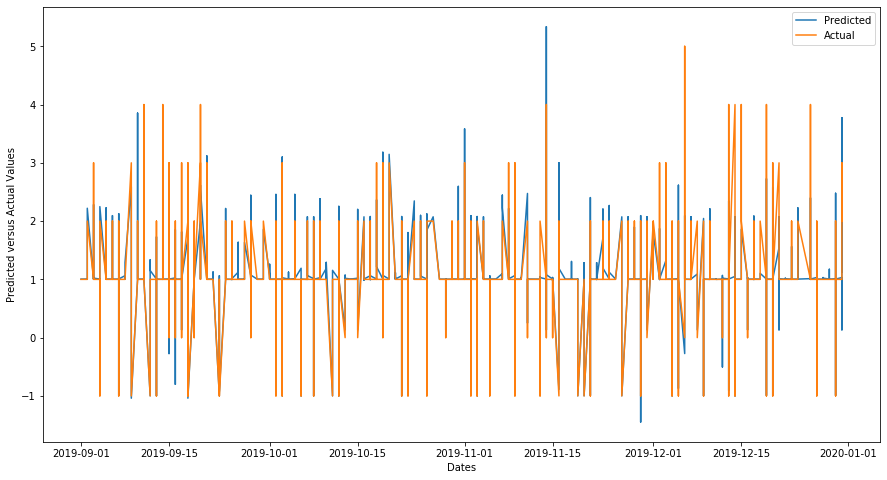

[17:43:49] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for regina department2= 0.158


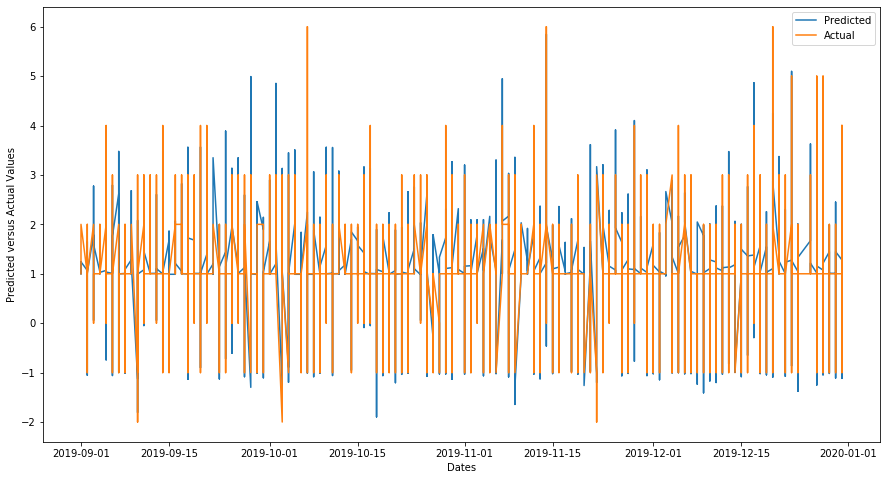

[17:44:03] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for regina department5= 0.100


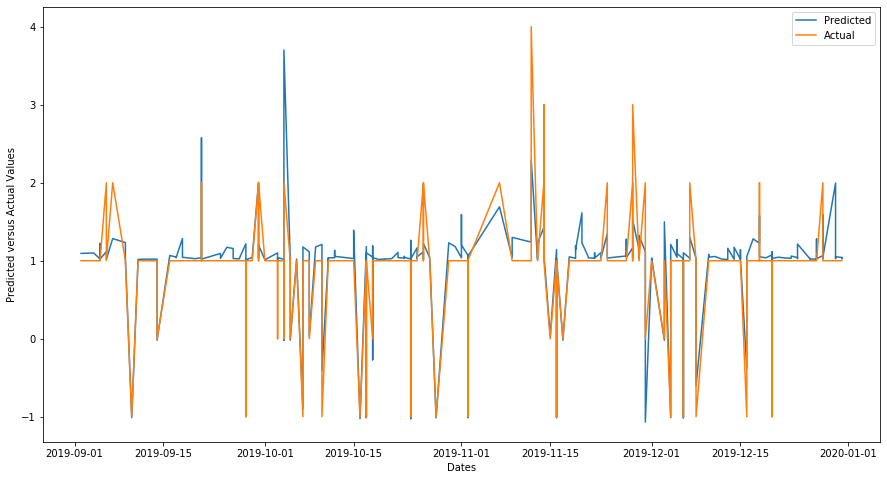

[17:46:10] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for regina department4= 0.114


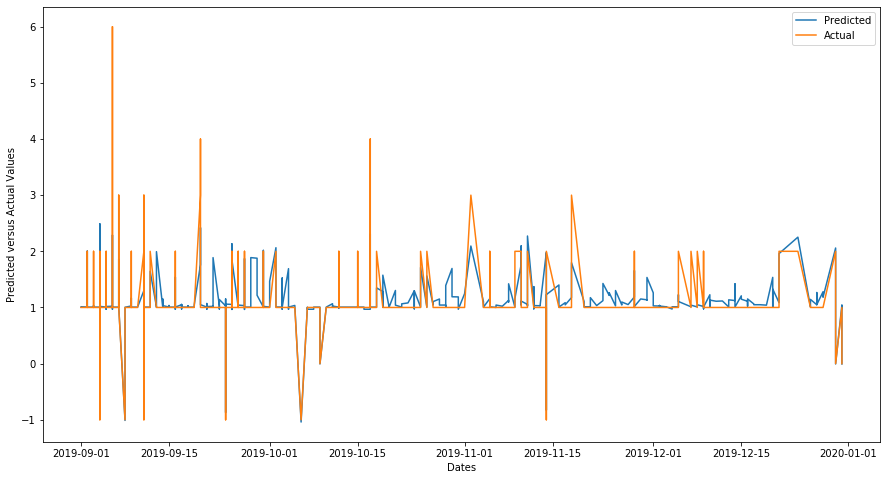

[17:49:15] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for regina department1= 0.104


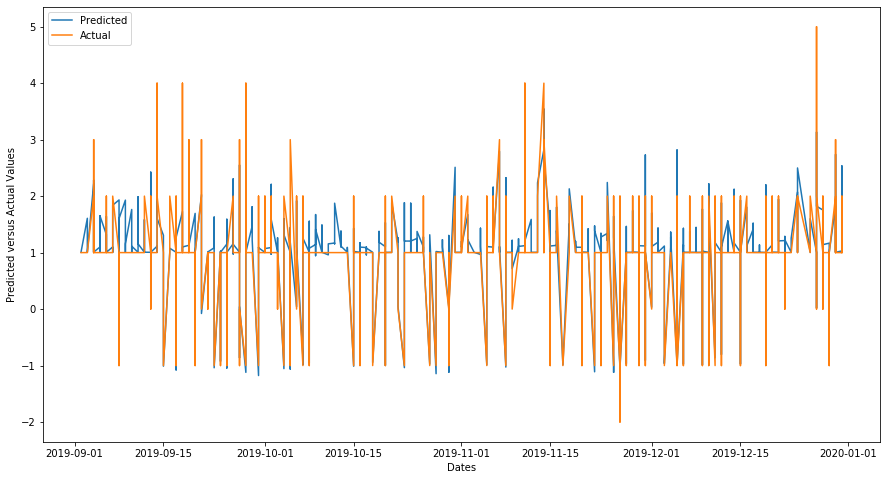

[17:50:30] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for regina department11= 0.311


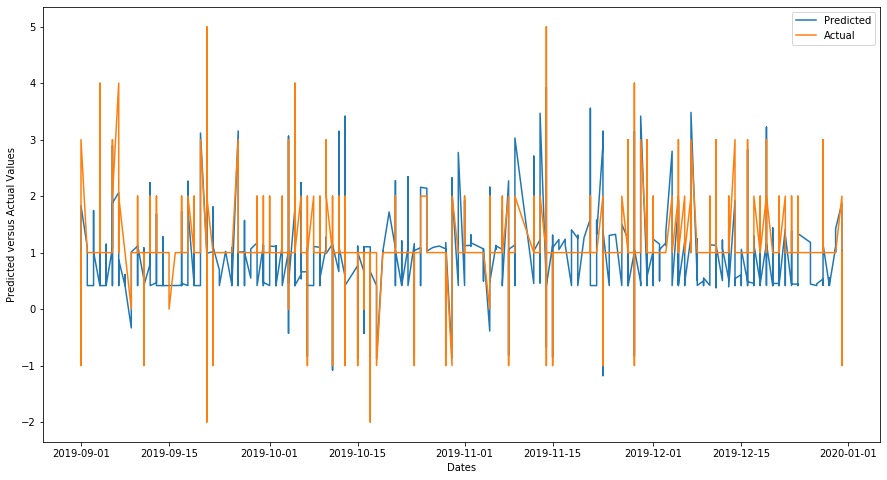

[17:52:26] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for regina department12= 0.013


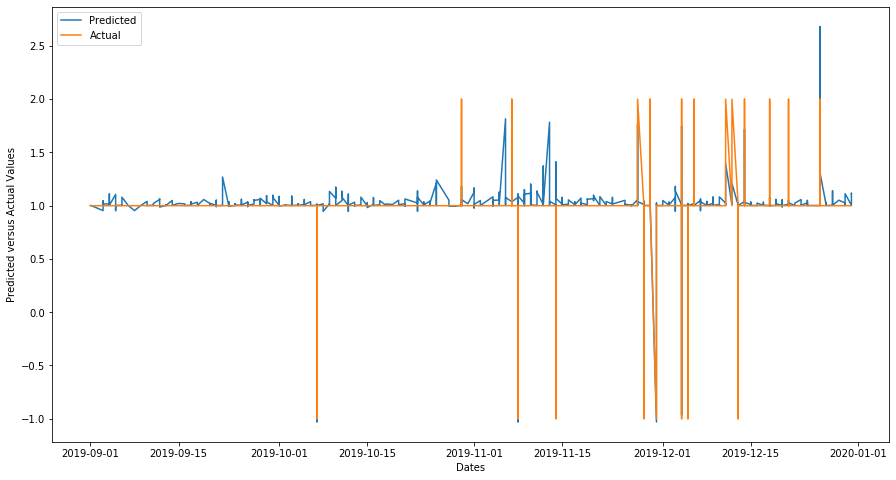

No records to test for regina city department13
No records to test for regina city department7
No records to test for regina city department8
No records to test for regina city department9
No records to test for regina city department10
[17:54:05] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for saskatoon department3= 0.079


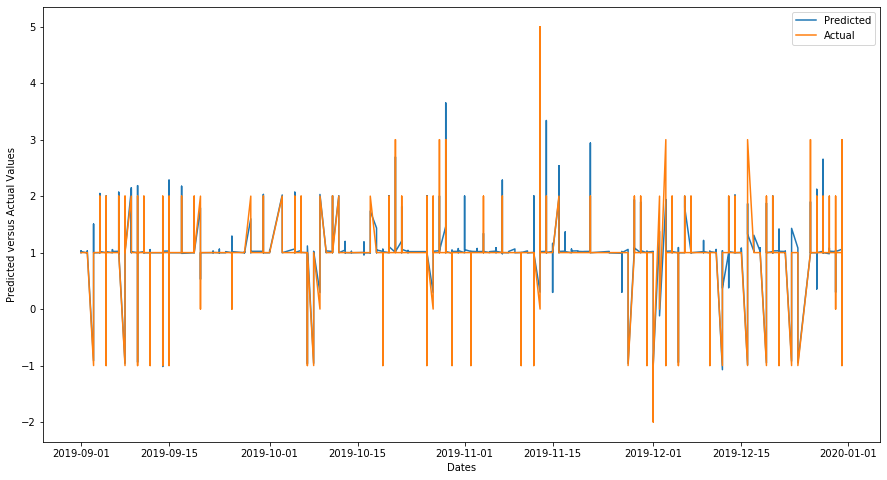

[18:00:31] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for saskatoon department2= 0.136


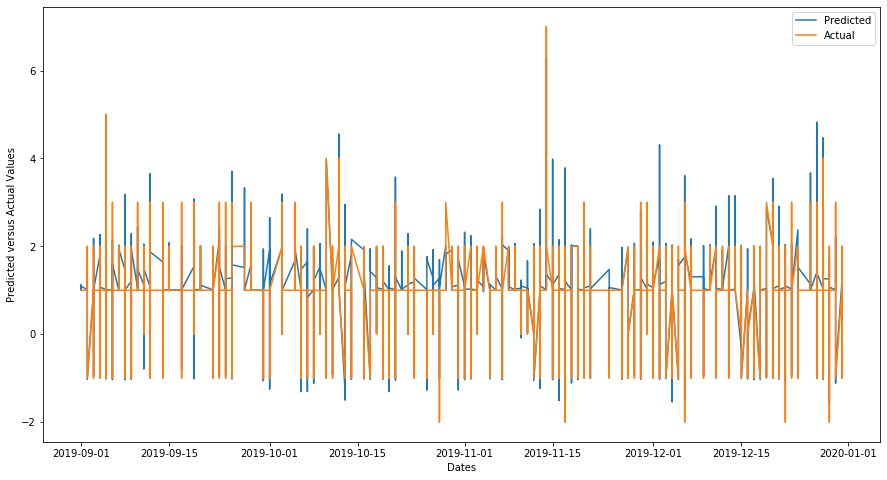

No records to test for saskatoon city department5
[18:01:35] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for saskatoon department4= 0.060


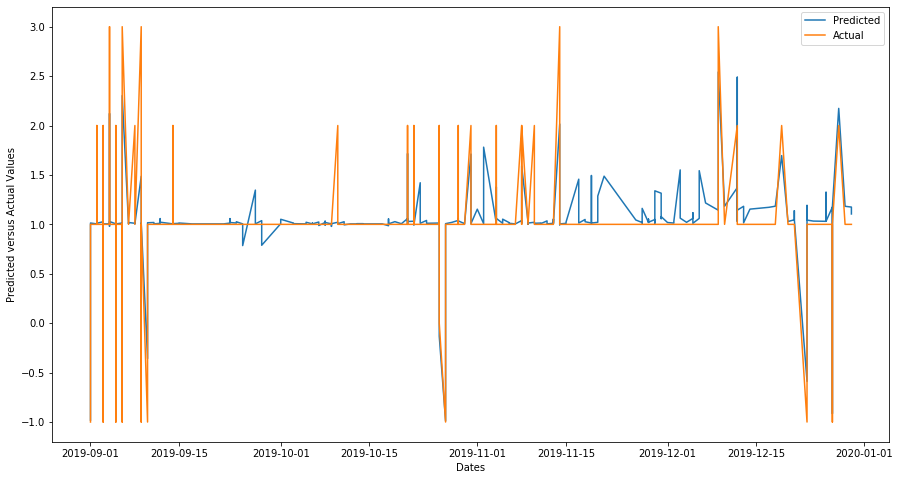

[18:02:53] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for saskatoon department1= 0.064


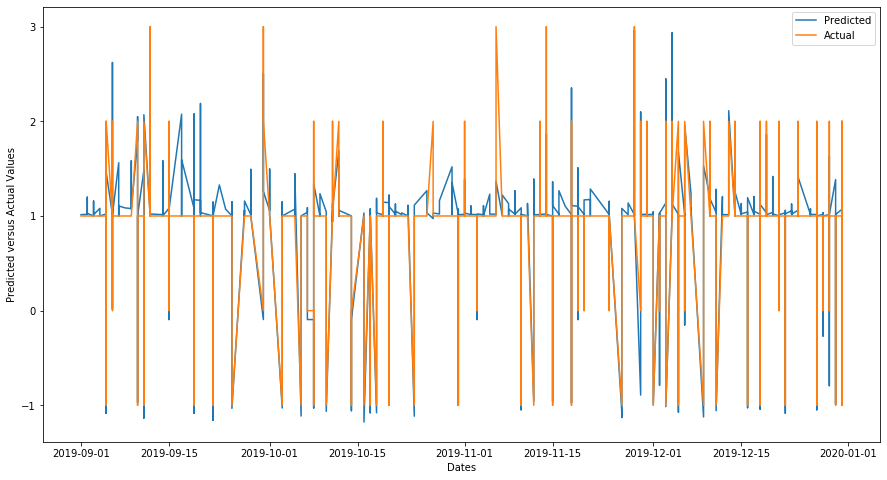

[18:03:24] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for saskatoon department11= 0.127


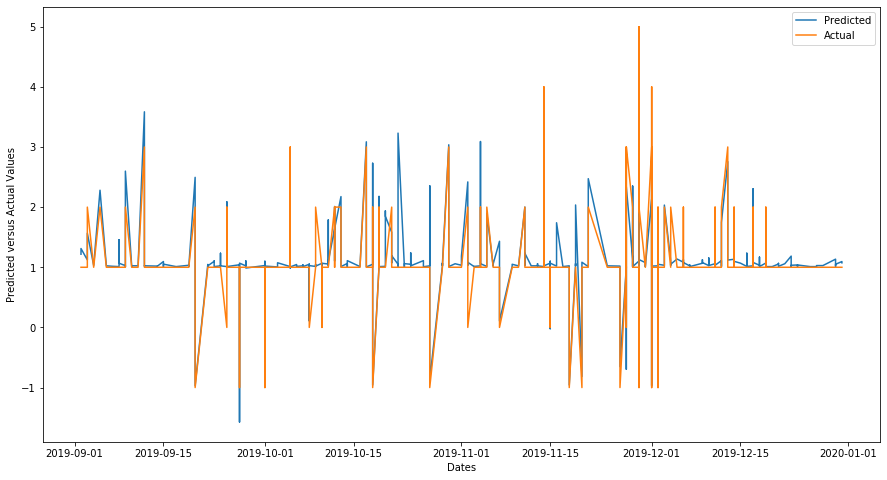

[18:03:59] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for saskatoon department12= 0.018


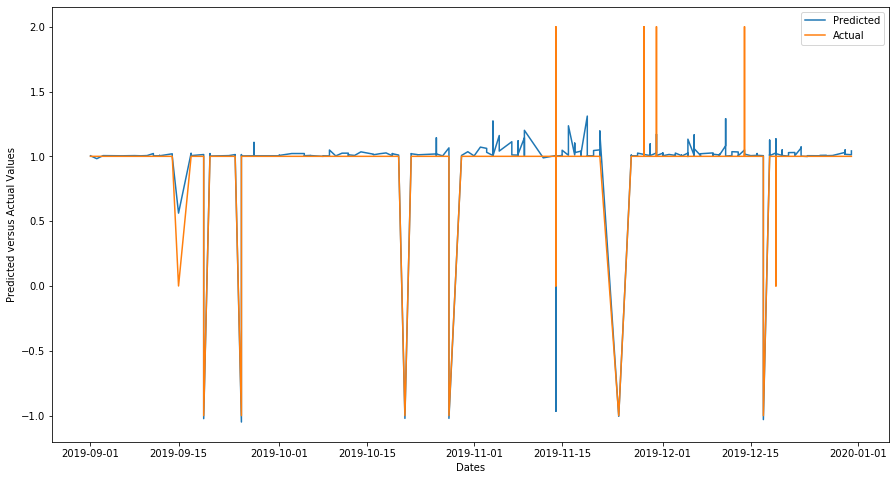

No records to test for saskatoon city department13
No records to test for saskatoon city department7
No records to test for saskatoon city department8
No records to test for saskatoon city department9
No records to test for saskatoon city department10
[18:06:03] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kelowna department3= 0.074


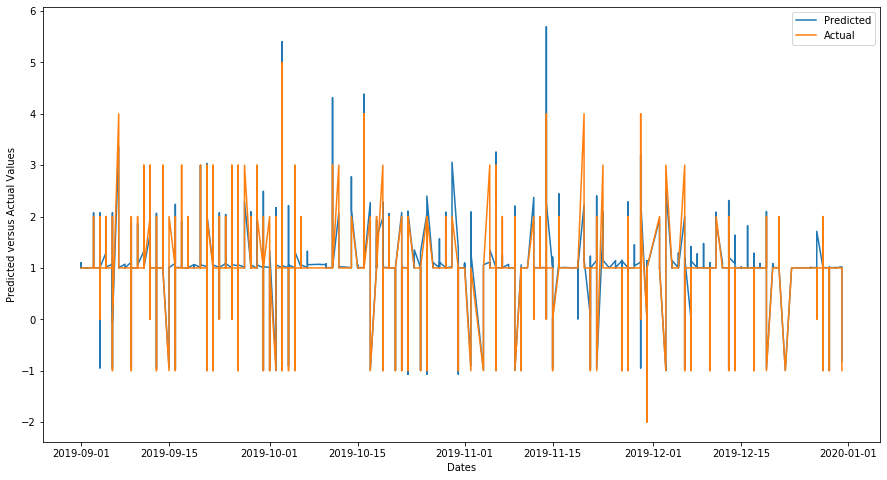

[18:12:32] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kelowna department2= 0.184


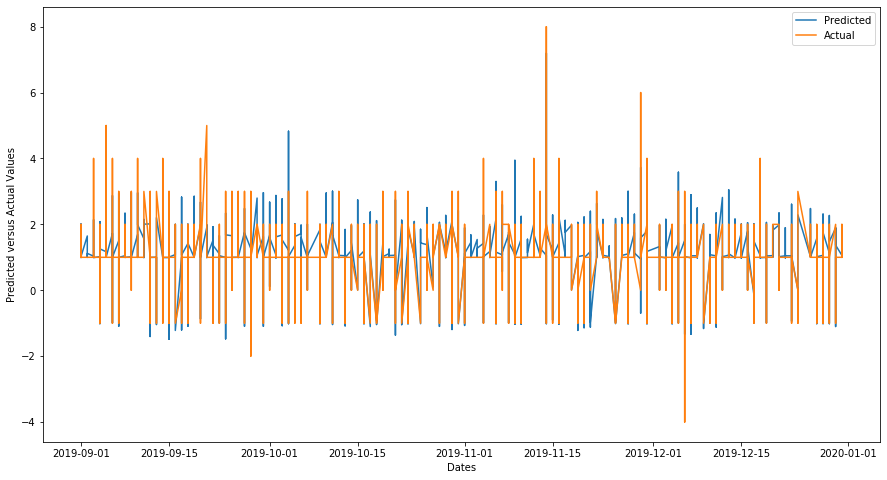

No records to test for kelowna city department5
[18:13:23] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kelowna department4= 0.115


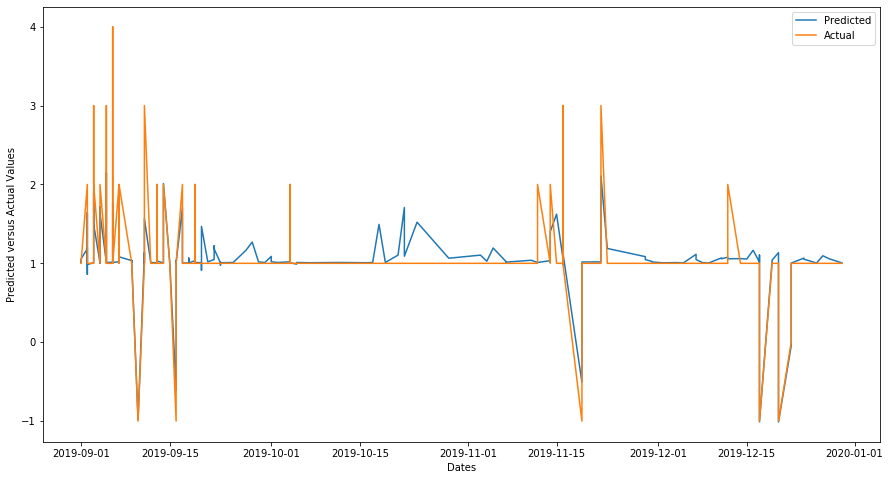

[18:14:39] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kelowna department1= 0.078


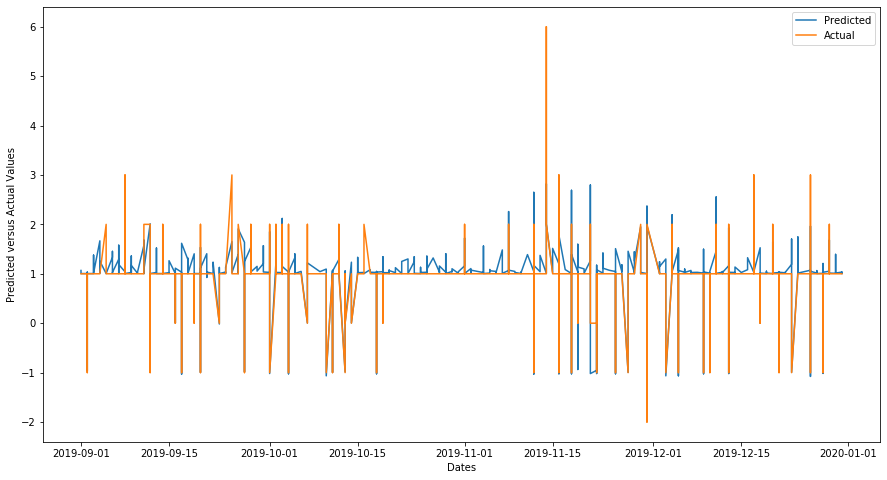

[18:15:06] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kelowna department11= 0.159


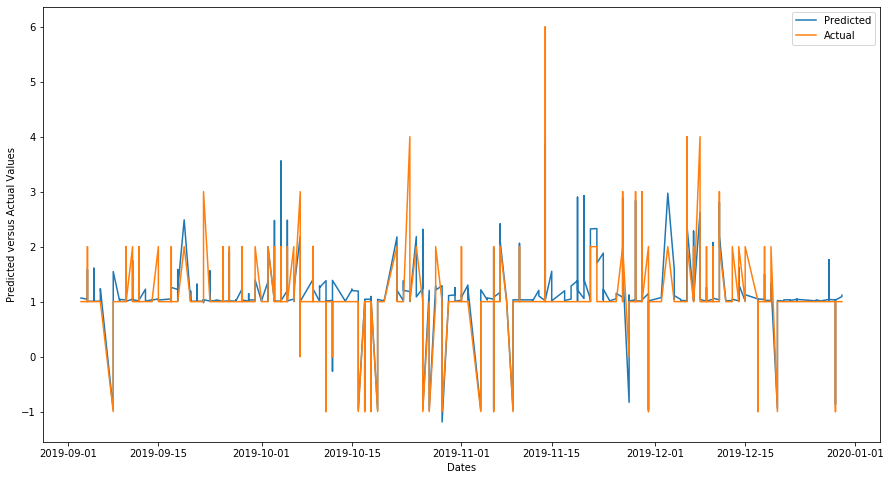

[18:15:50] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for kelowna department12= 0.068


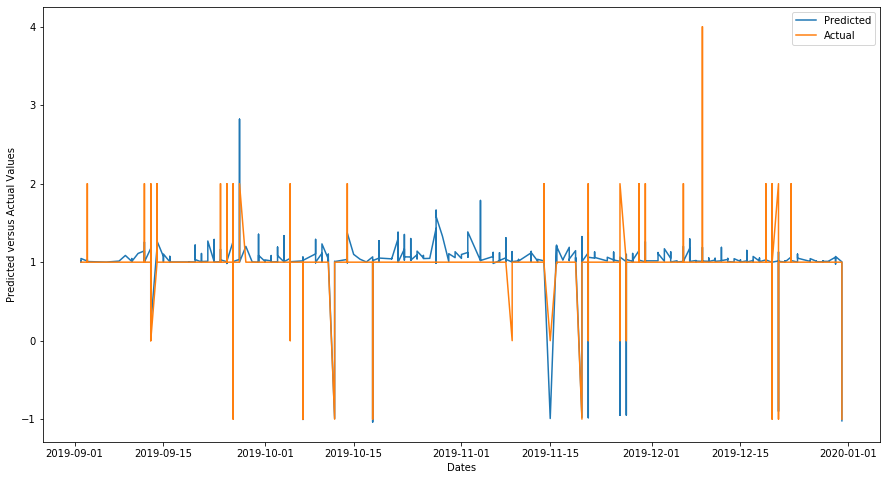

No records to test for kelowna city department13
No records to test for kelowna city department7
No records to test for kelowna city department8
No records to test for kelowna city department9
No records to test for kelowna city department10
[18:18:12] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for stettler department3= 0.094


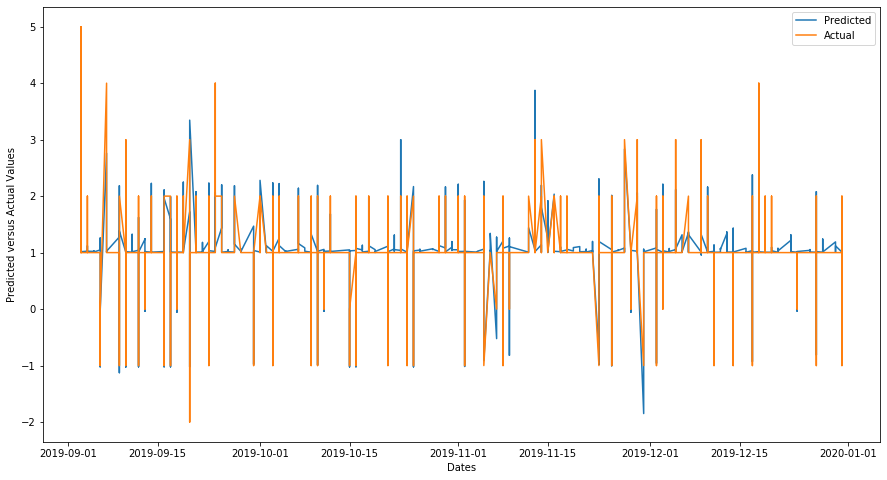

[18:24:36] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for stettler department2= 0.126


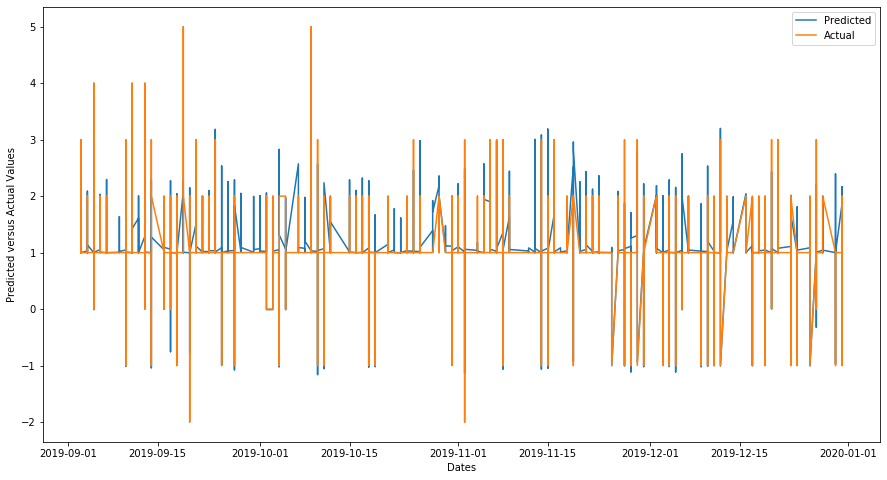

[18:24:45] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for stettler department5= 0.306


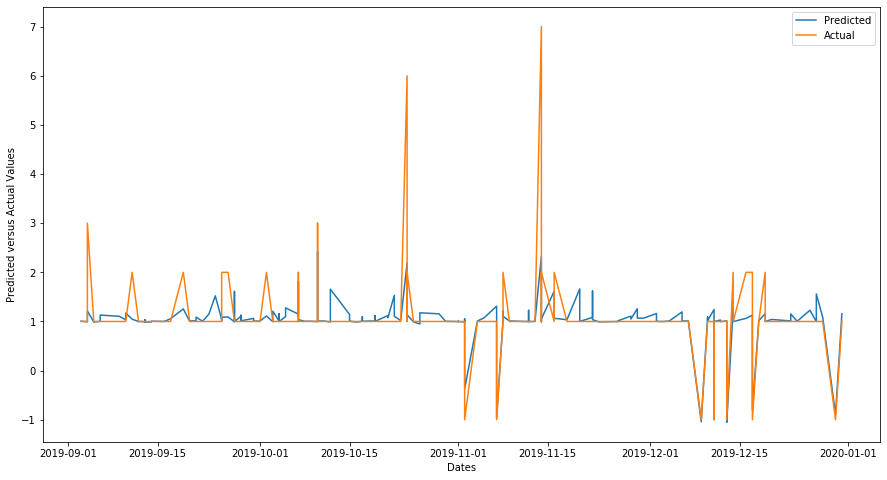

[18:25:23] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for stettler department4= 0.044


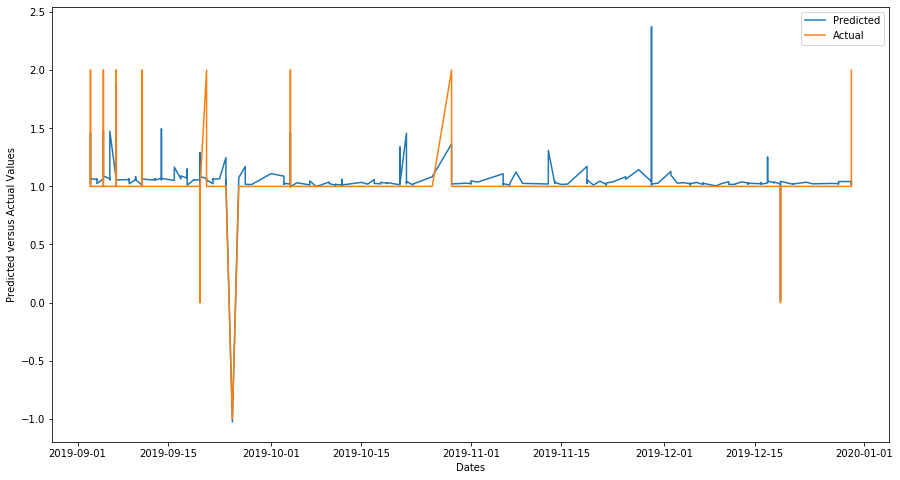

[18:26:58] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for stettler department1= 0.088


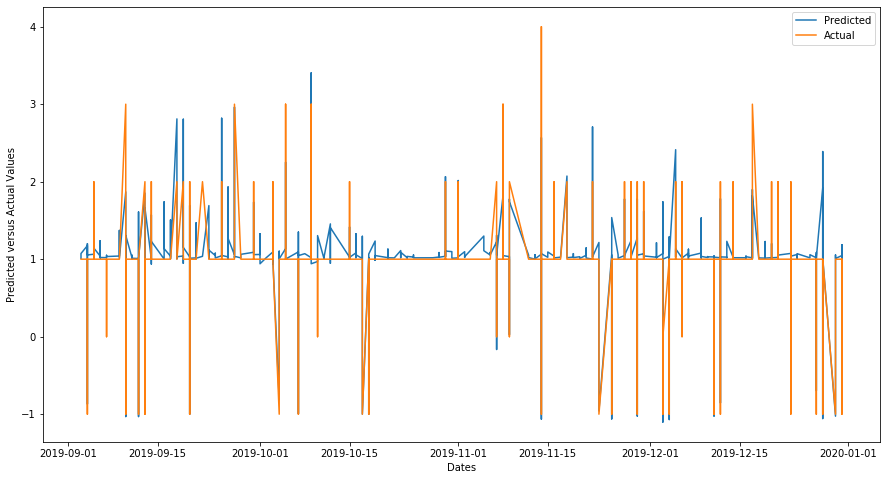

[18:27:17] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for stettler department11= 0.231


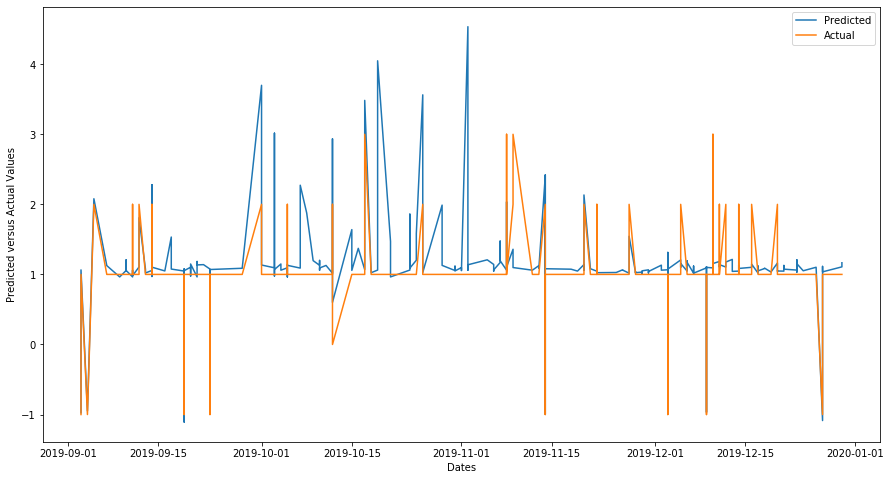

[18:27:44] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for stettler department12= 0.022


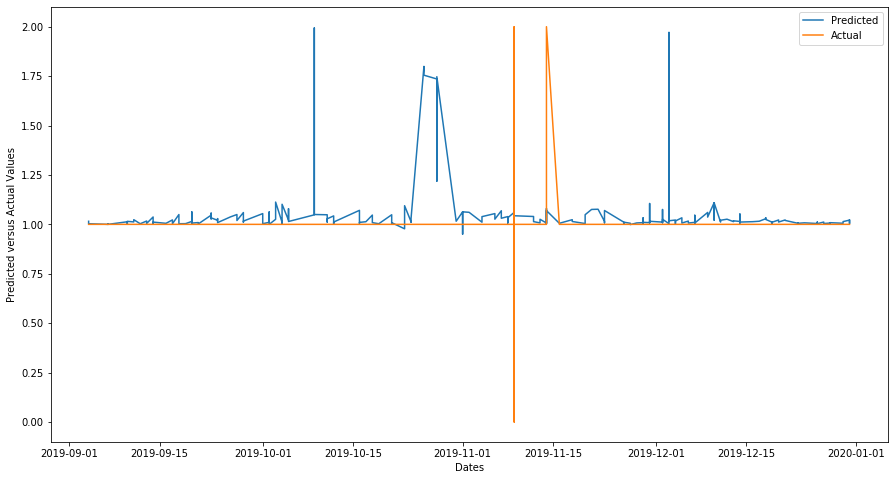

No records to test for stettler city department13
No records to test for stettler city department7
No records to test for stettler city department8
No records to test for stettler city department9
No records to test for stettler city department10
[18:30:59] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for white rock department3= 0.060


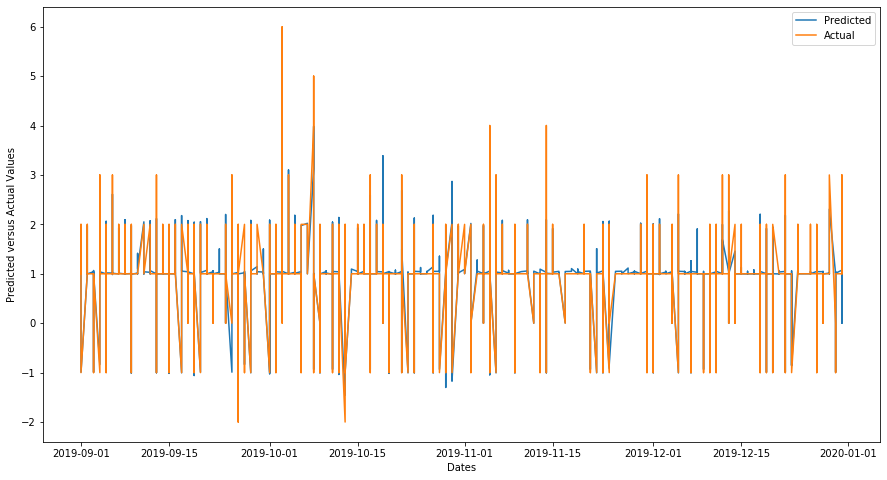

[18:38:41] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for white rock department2= 0.123


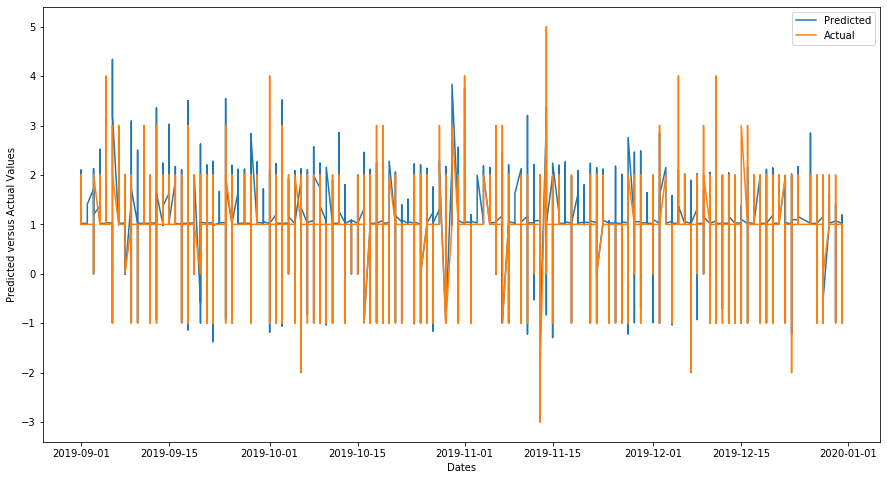

[18:38:49] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for white rock department5= 0.084


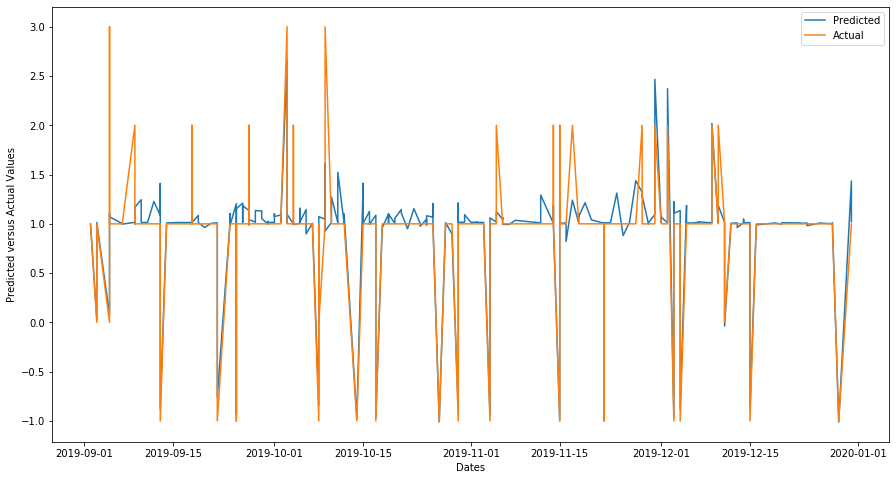

[18:39:29] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for white rock department4= 0.118


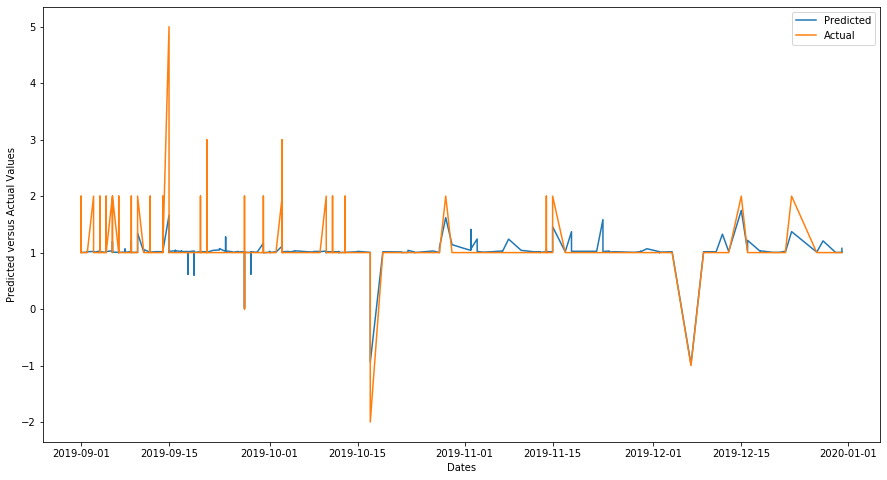

[18:41:17] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for white rock department1= 0.046


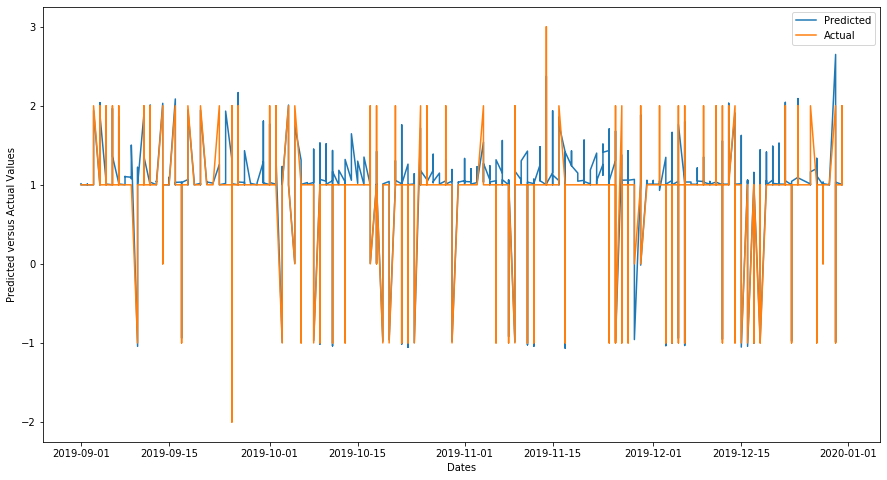

[18:41:38] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for white rock department11= 0.097


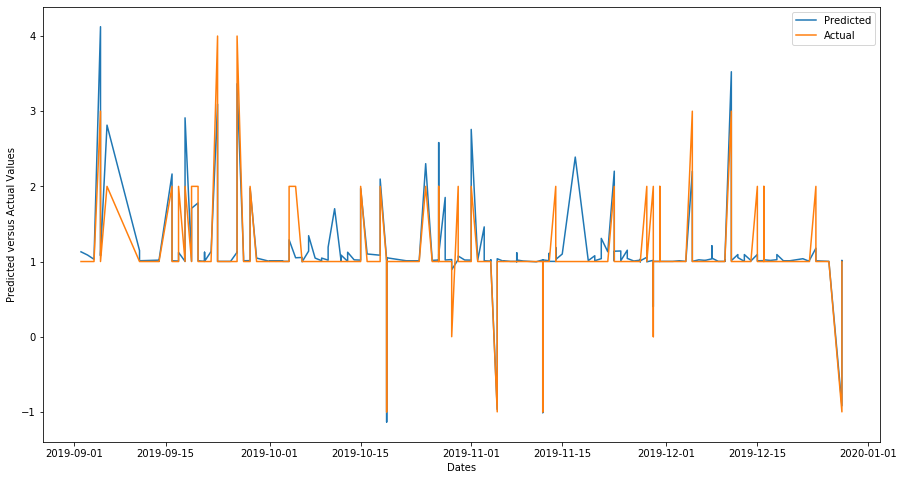

[18:42:03] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for white rock department12= 0.020


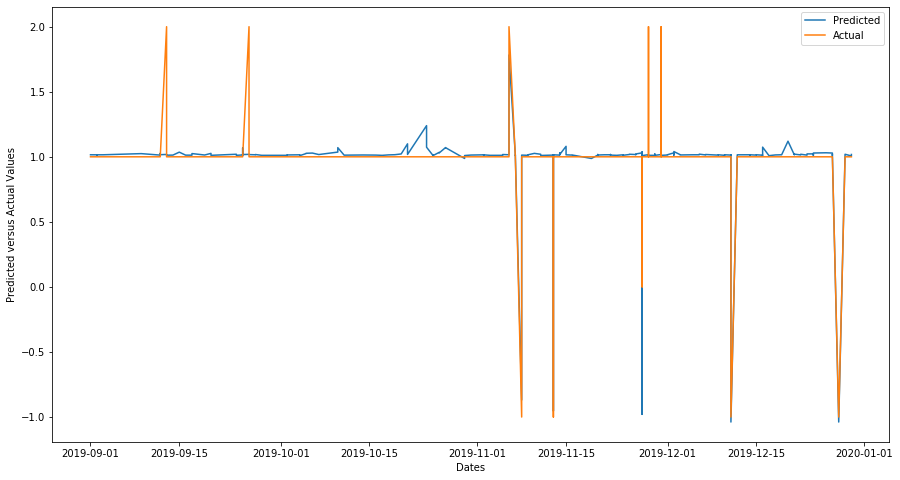

No records to test for white rock city department13
No records to test for white rock city department7
No records to test for white rock city department8
No records to test for white rock city department9
No records to test for white rock city department10
[18:42:55] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for williams lake department3= 0.122


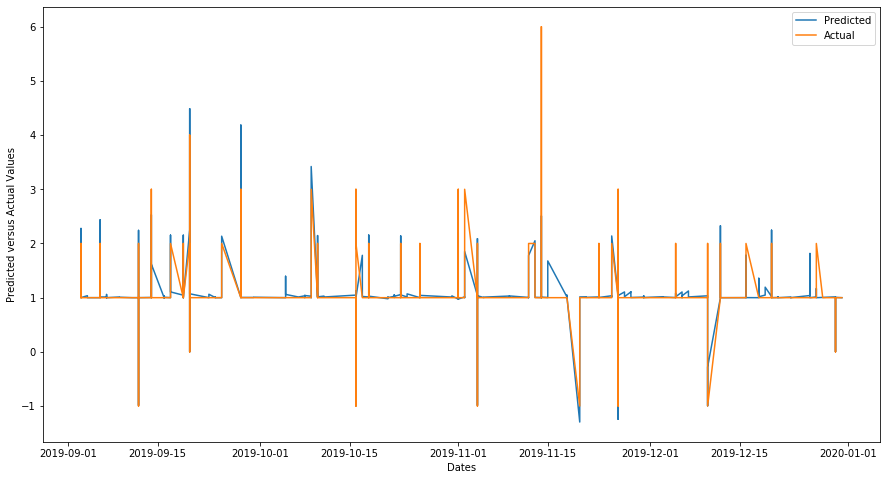

[18:45:15] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for williams lake department2= 0.092


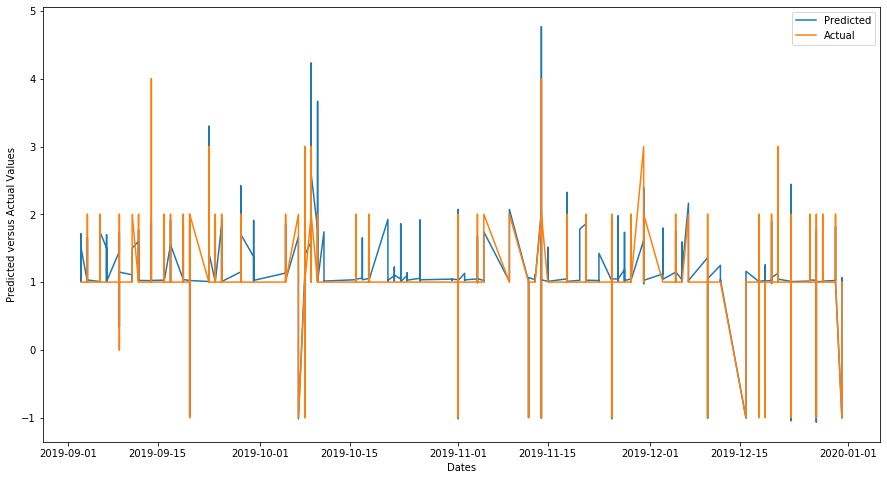

No records to test for williams lake city department5
[18:45:29] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for williams lake department4= 0.158


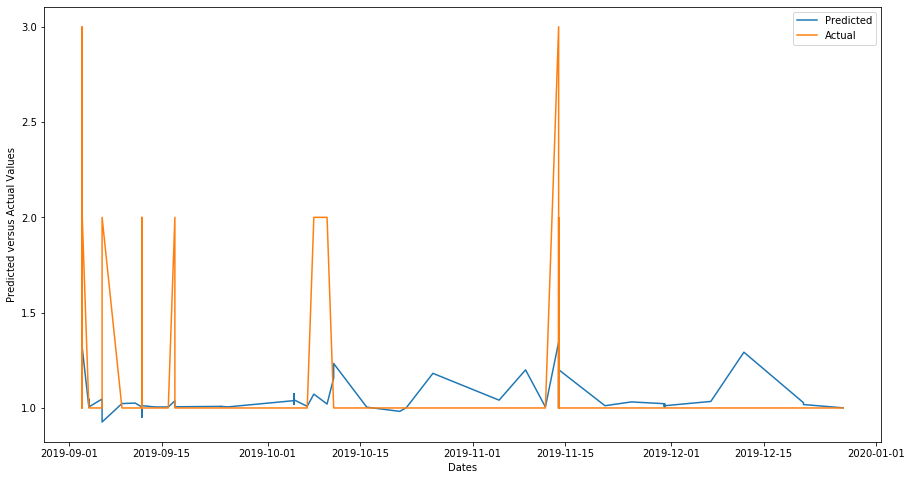

[18:45:57] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for williams lake department1= 0.113


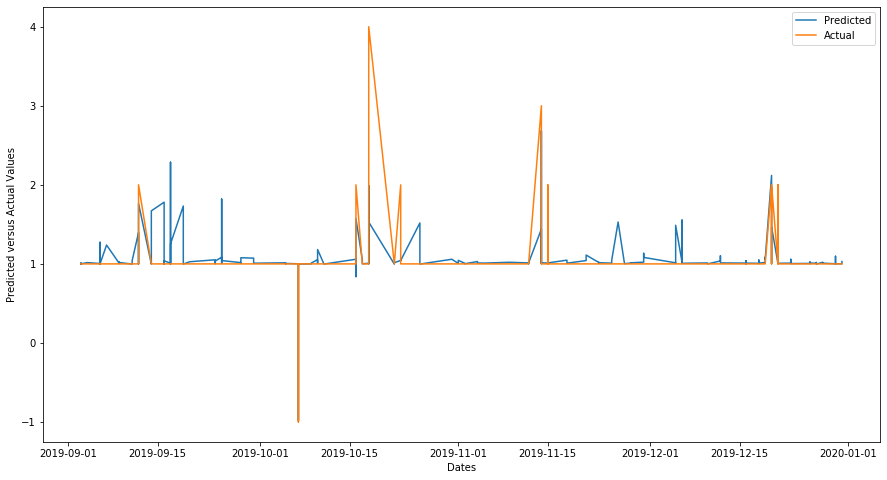

[18:46:08] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for williams lake department11= 0.183


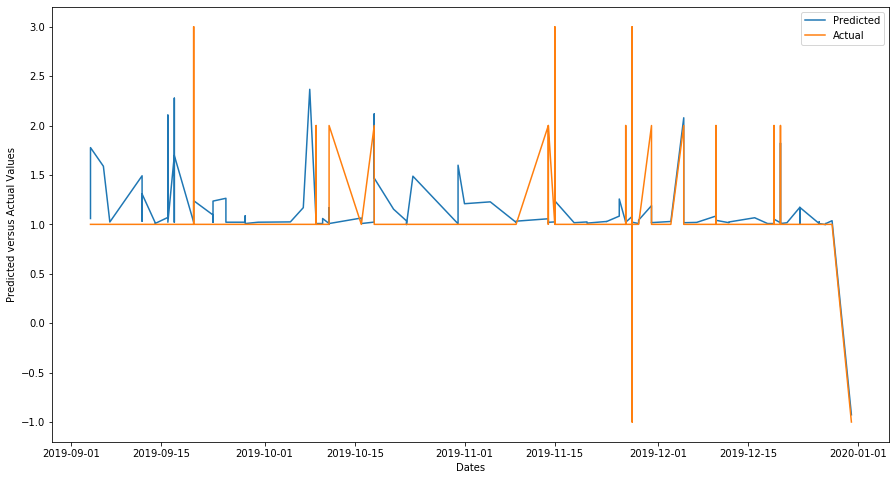

[18:46:26] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for williams lake department12= 0.024


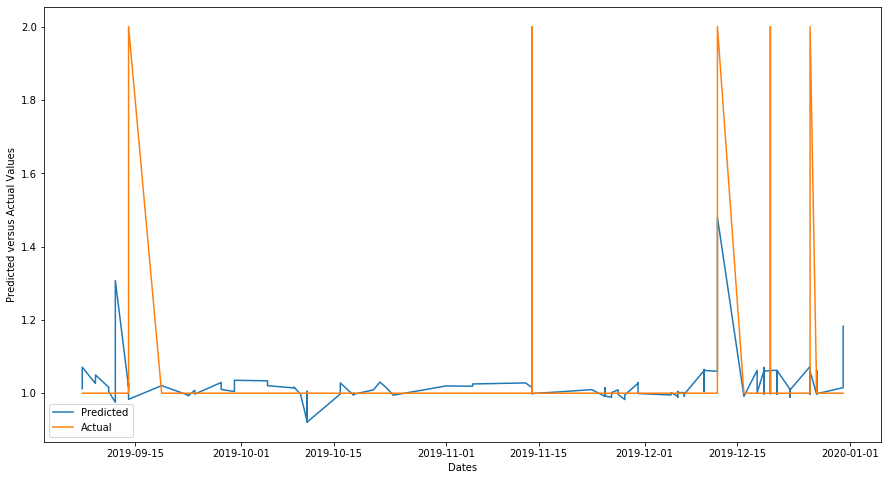

No records to test for williams lake city department13
No records to test for williams lake city department7
No records to test for williams lake city department8
No records to test for williams lake city department9
No records to test for williams lake city department10
[18:47:38] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for wainwright department3= 0.091


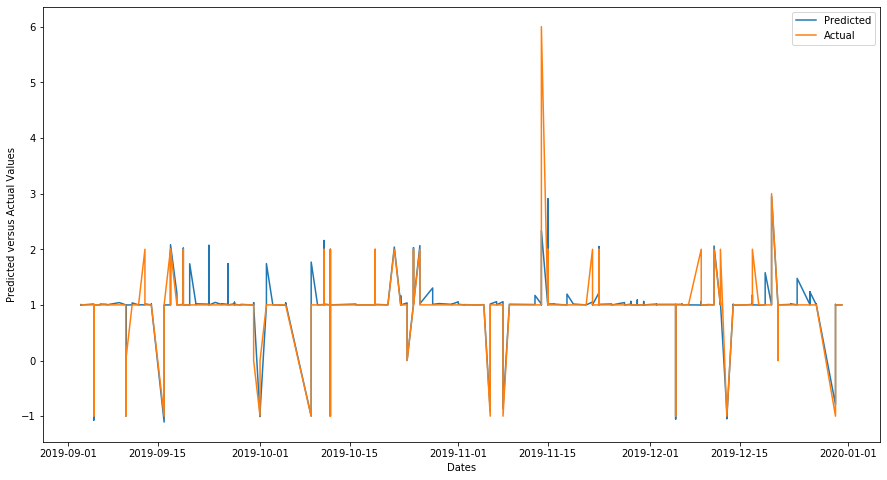

[18:52:30] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for wainwright department2= 0.111


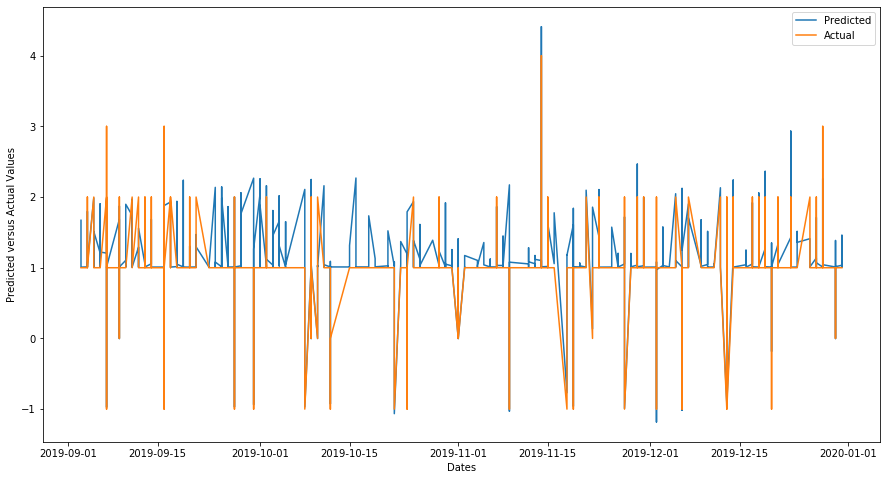

No records to test for wainwright city department5
[18:53:02] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for wainwright department4= 0.058


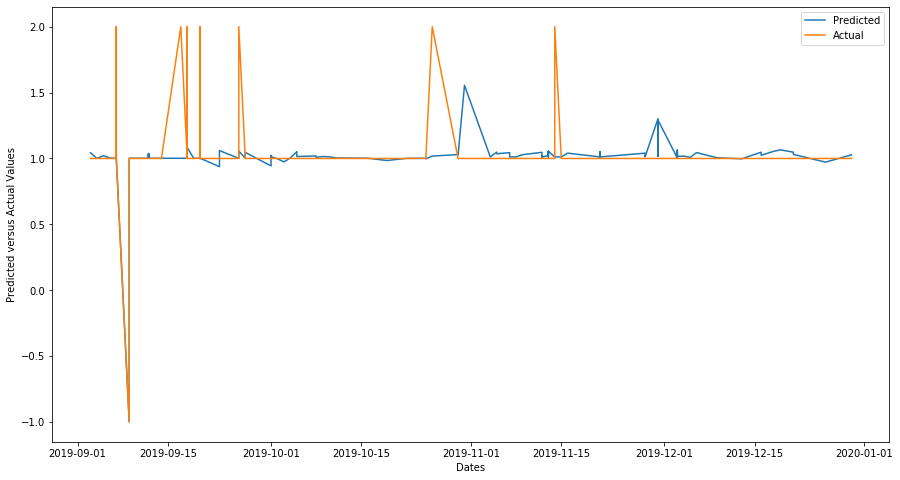

[18:54:13] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for wainwright department1= 0.061


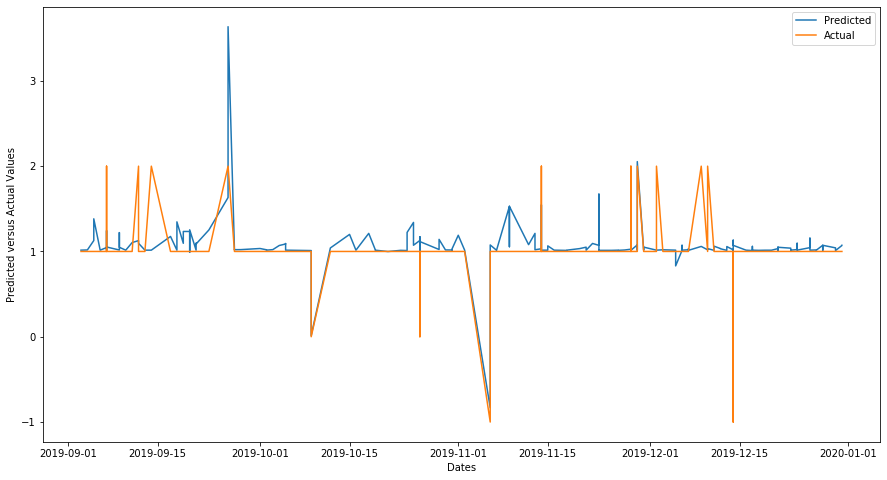

[18:54:40] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for wainwright department11= 0.088


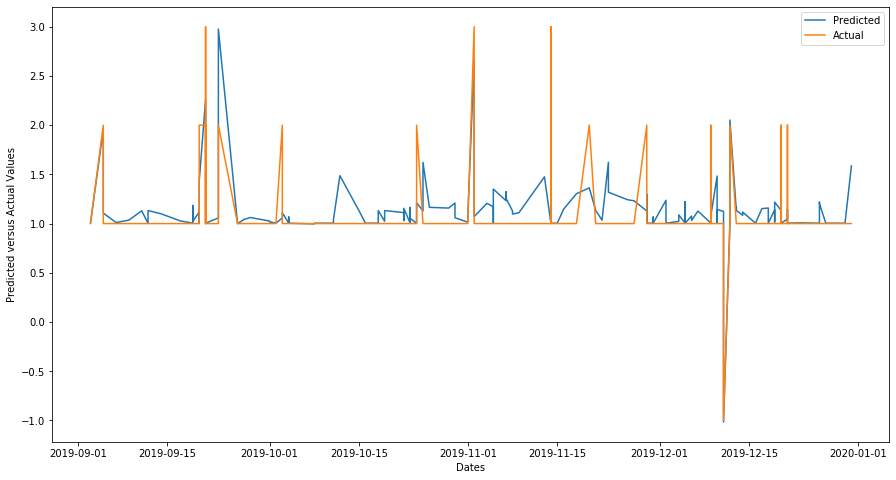

[18:55:28] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for wainwright department12= 0.001


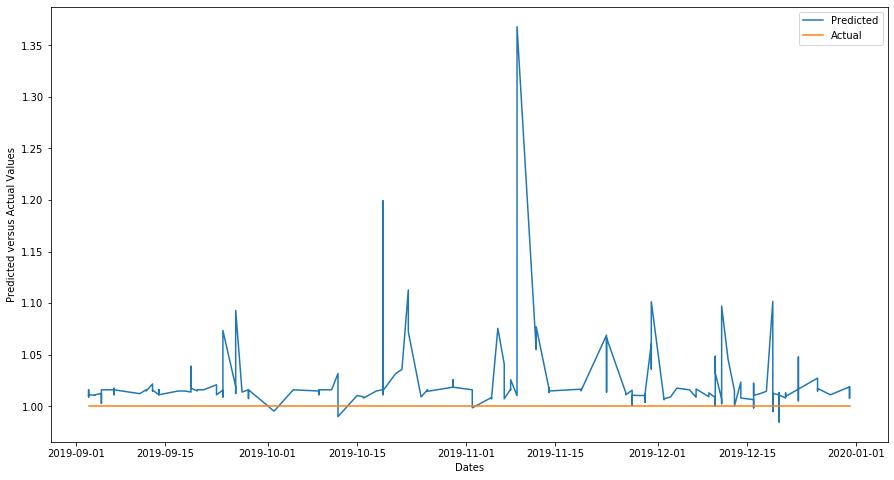

No records to test for wainwright city department13
No records to test for wainwright city department7
No records to test for wainwright city department8
No records to test for wainwright city department9
No records to test for wainwright city department10
[18:58:03] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for cranbrook department3= 0.054


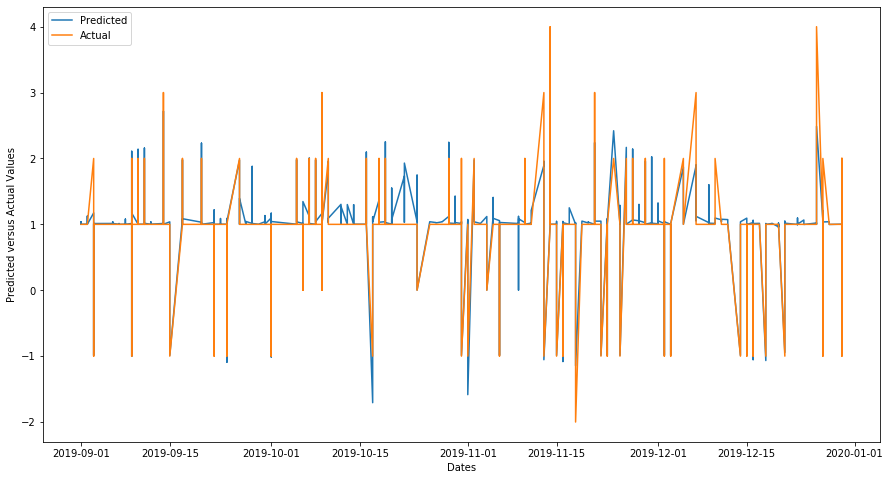

[19:04:00] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for cranbrook department2= 0.097


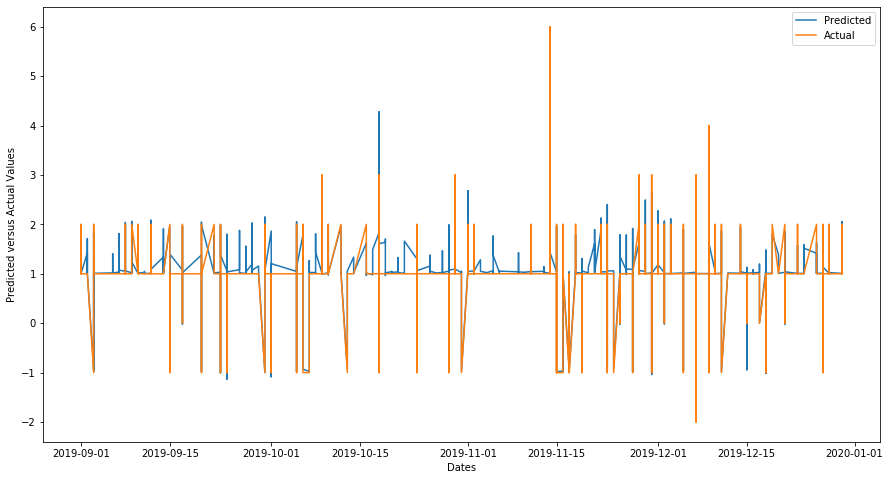

No records to test for cranbrook city department5
[19:04:46] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for cranbrook department4= 0.015


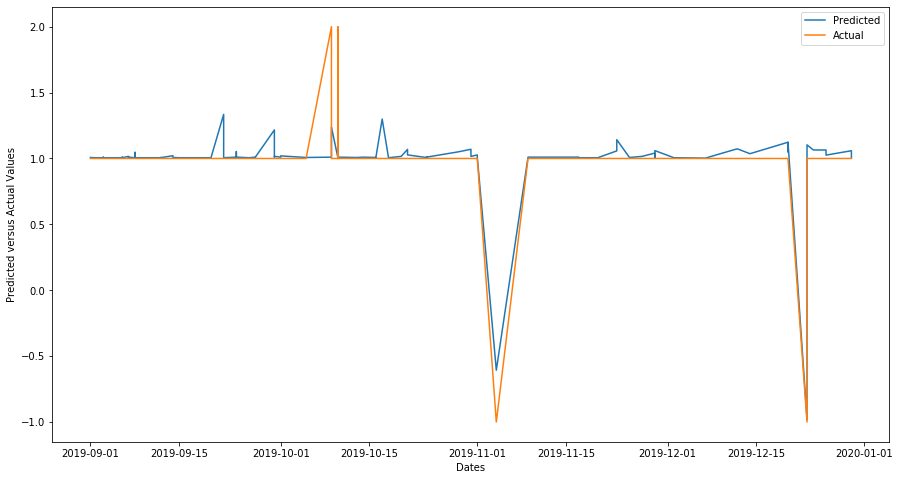

[19:05:58] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for cranbrook department1= 0.060


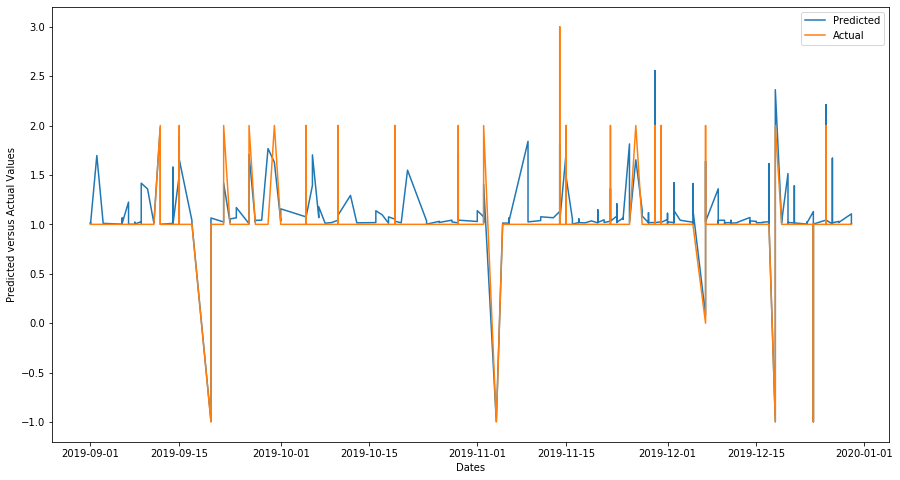

[19:06:25] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for cranbrook department11= 0.098


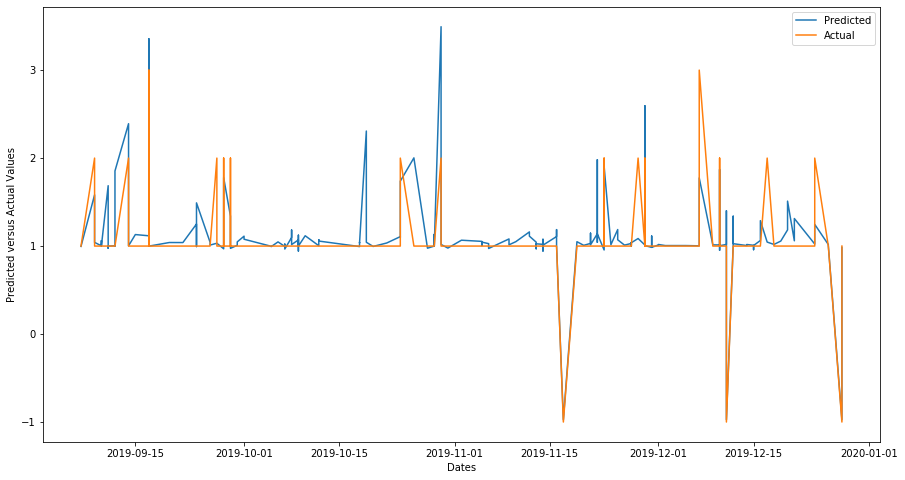

[19:06:55] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for cranbrook department12= 0.032


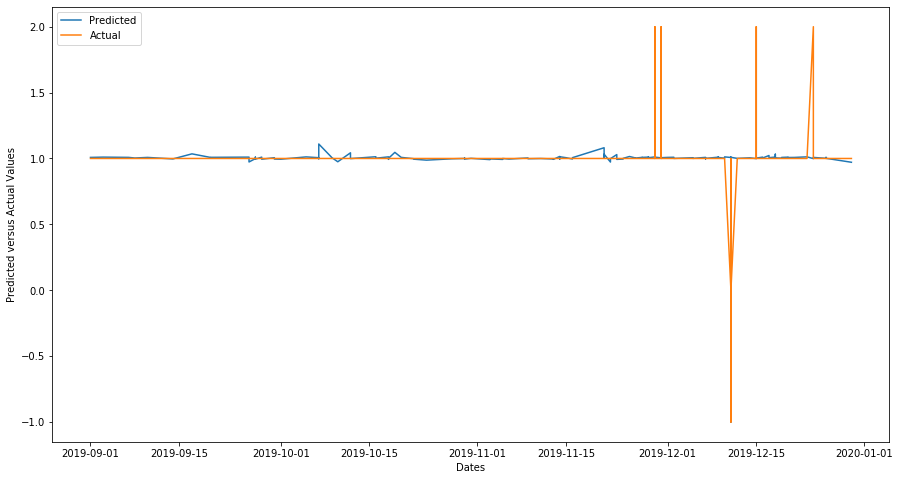

No records to test for cranbrook city department13
No records to test for cranbrook city department7
No records to test for cranbrook city department8
No records to test for cranbrook city department9
No records to test for cranbrook city department10
[19:10:46] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for camrose department3= 0.079


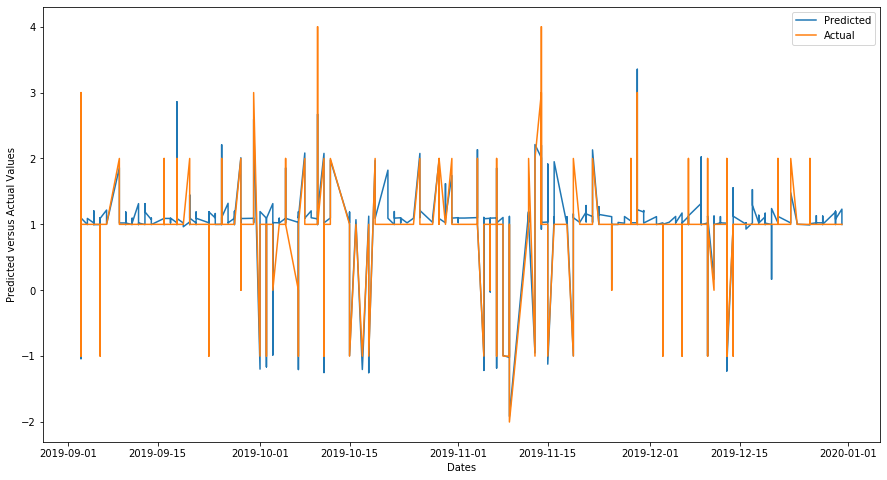

[19:18:59] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for camrose department2= 0.094


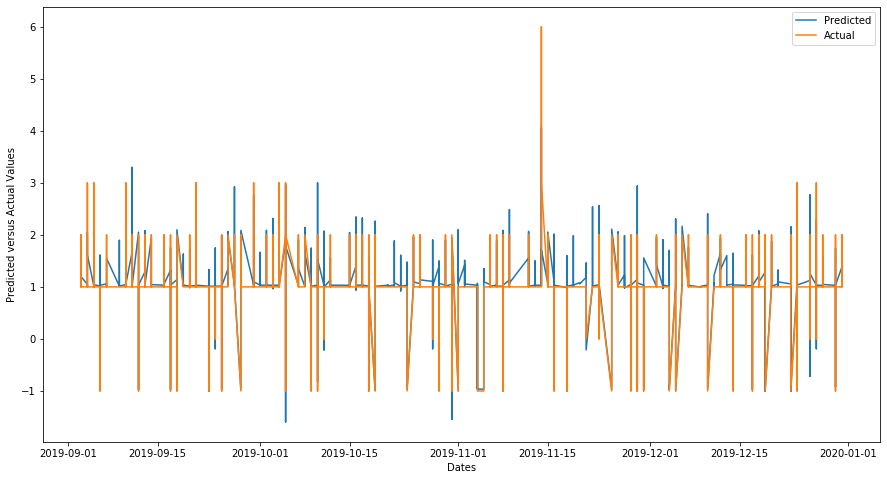

No records to test for camrose city department5
[19:19:55] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for camrose department4= 0.030


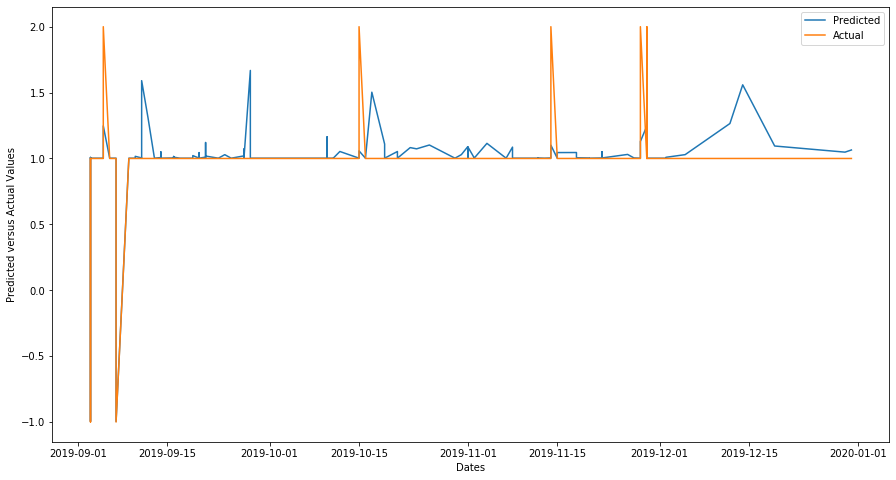

[19:21:40] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for camrose department1= 0.042


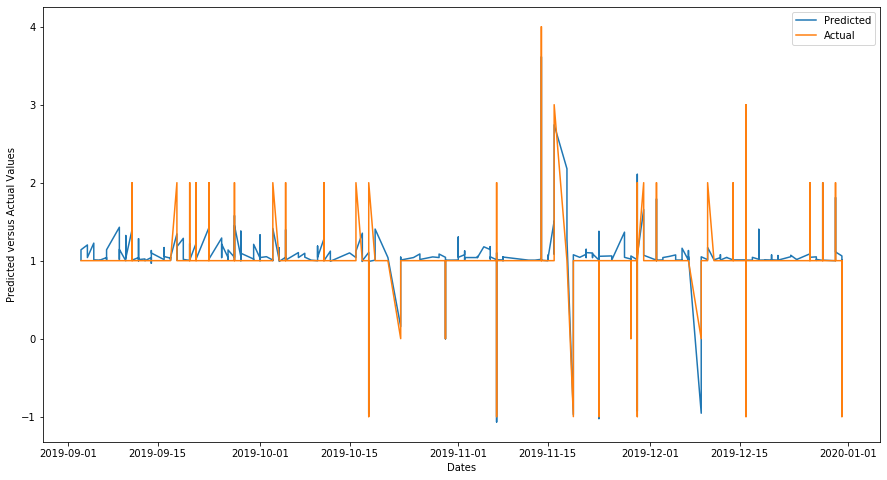

[19:22:01] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for camrose department11= 0.199


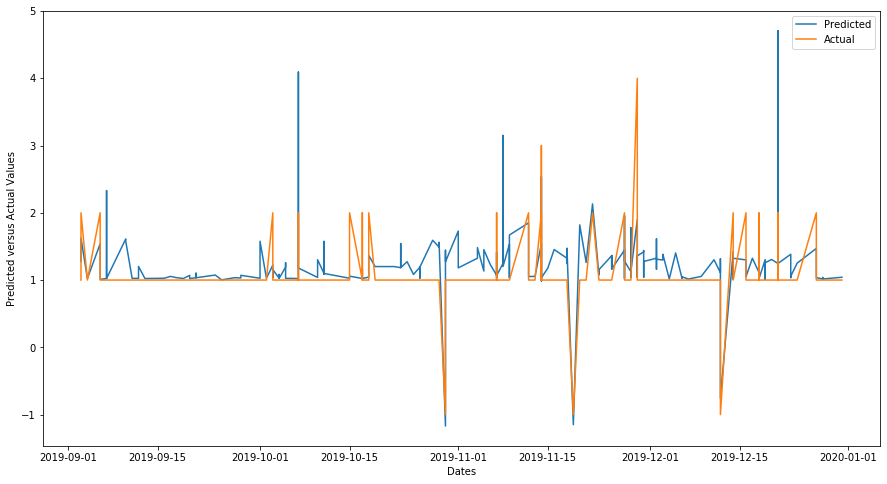

[19:22:31] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for camrose department12= 0.014


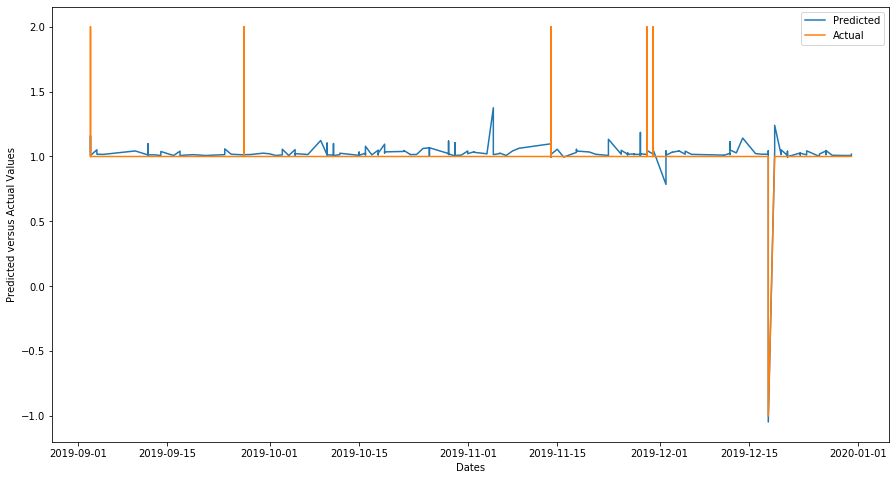

No records to test for camrose city department13
No records to test for camrose city department7
No records to test for camrose city department8
No records to test for camrose city department9
No records to test for camrose city department10
[19:23:28] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for fort st john department3= 0.039


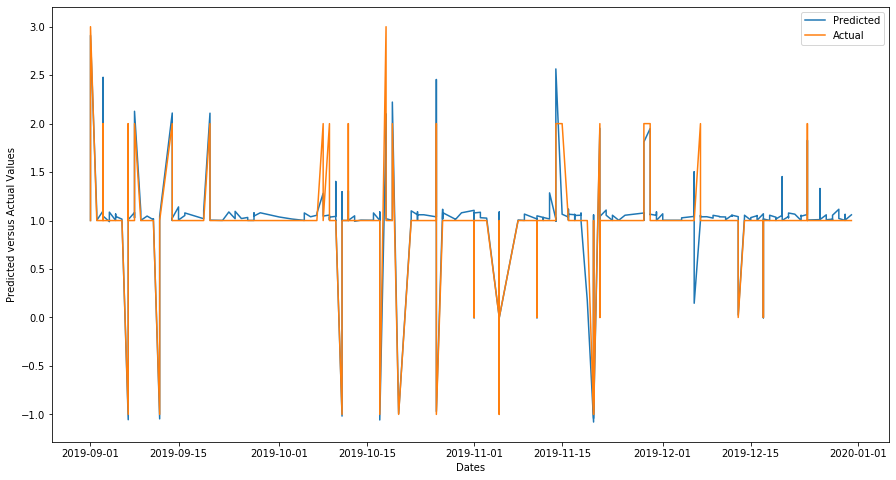

[19:26:28] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for fort st john department2= 0.084


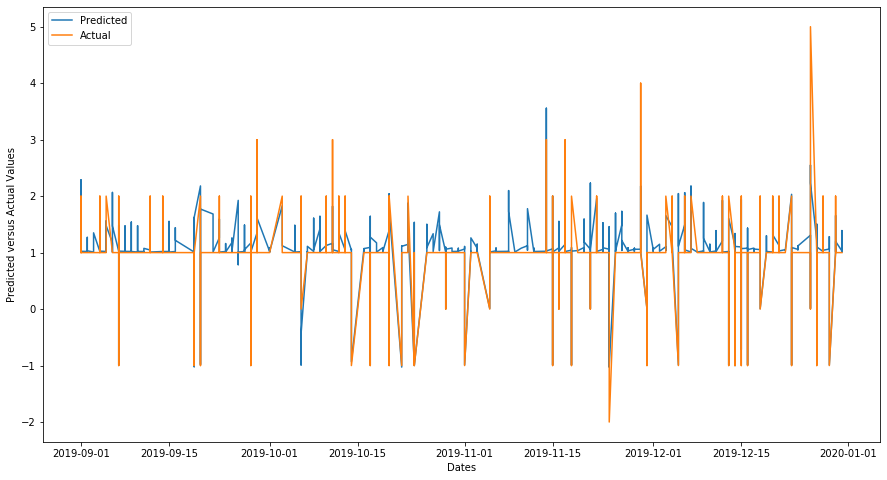

No records to test for fort st john city department5
[19:26:46] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for fort st john department4= 0.073


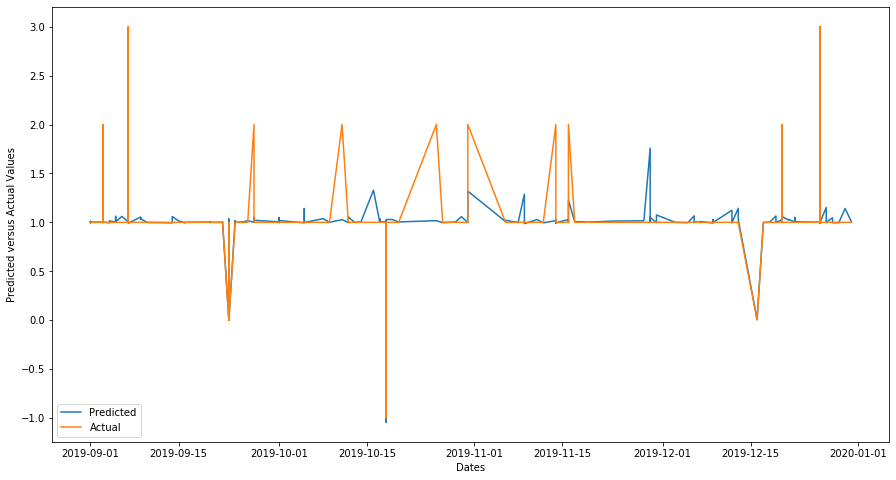

[19:27:17] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for fort st john department1= 0.042


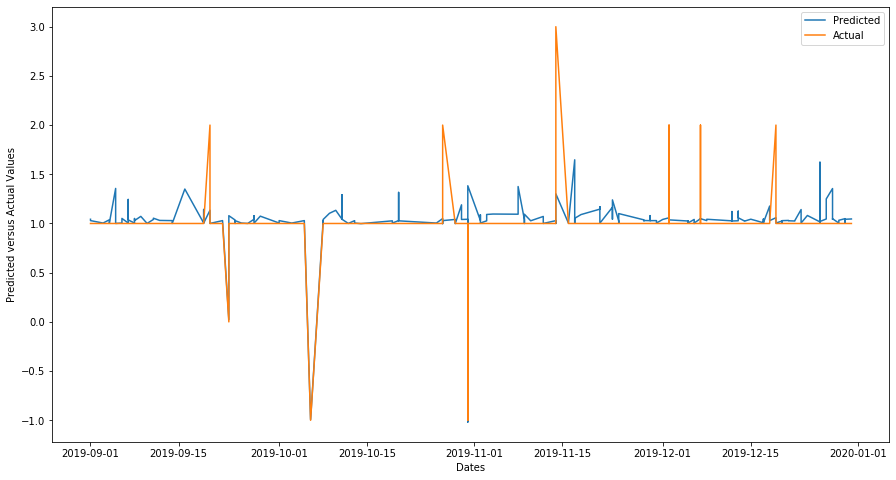

[19:27:28] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for fort st john department11= 0.090


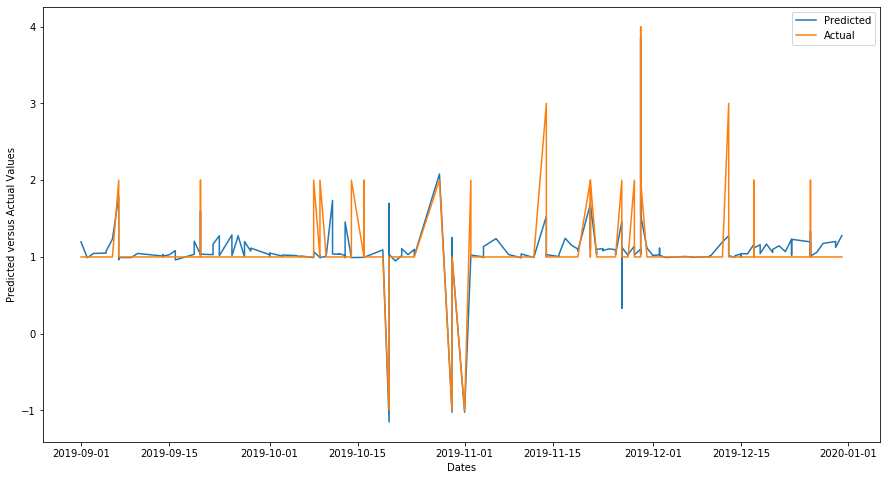

[19:27:44] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for fort st john department12= 0.005


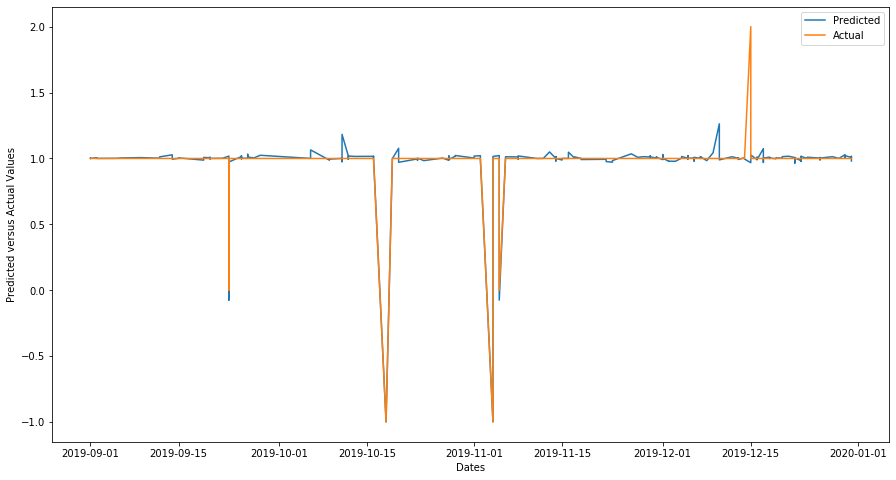

No records to test for fort st john city department13
No records to test for fort st john city department7
No records to test for fort st john city department8
No records to test for fort st john city department9
No records to test for fort st john city department10
[19:29:26] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for salmon arm department3= 0.040


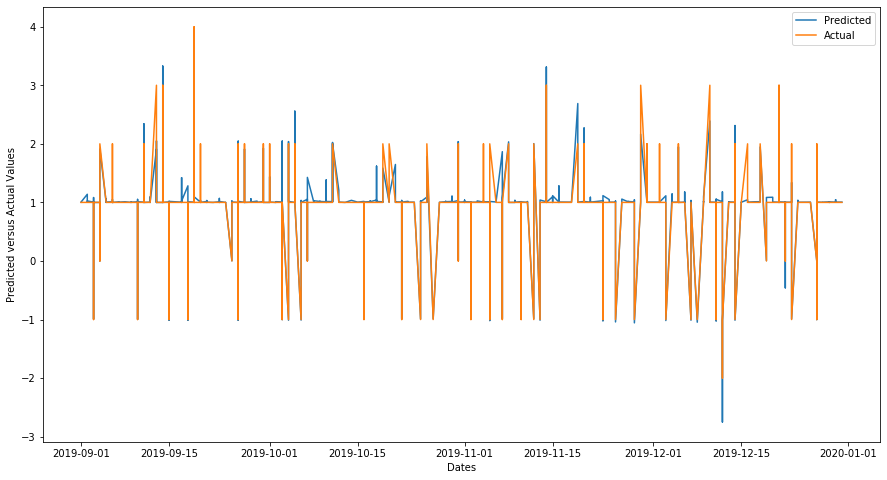

[19:33:52] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for salmon arm department2= 0.118


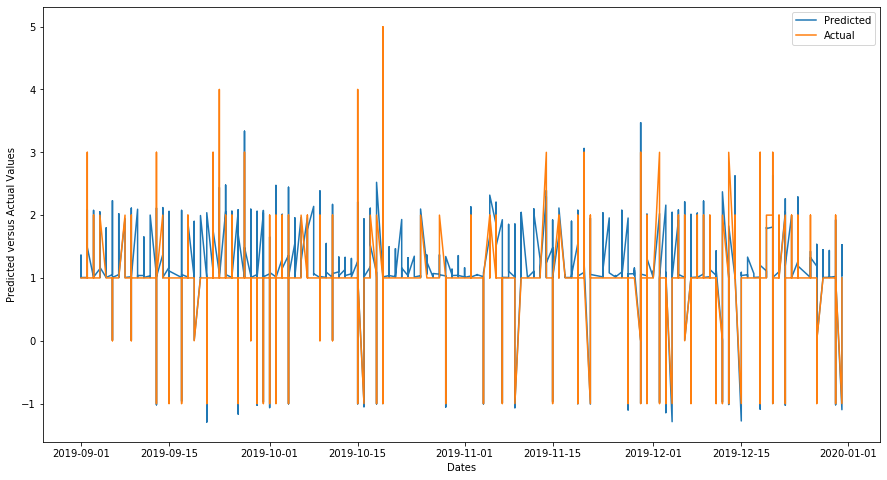

No records to test for salmon arm city department5
[19:34:22] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for salmon arm department4= 0.098


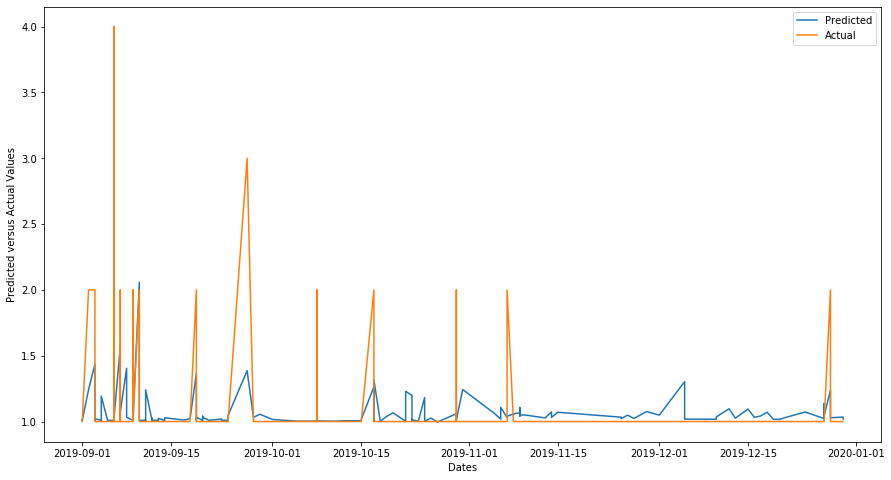

[19:35:16] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for salmon arm department1= 0.058


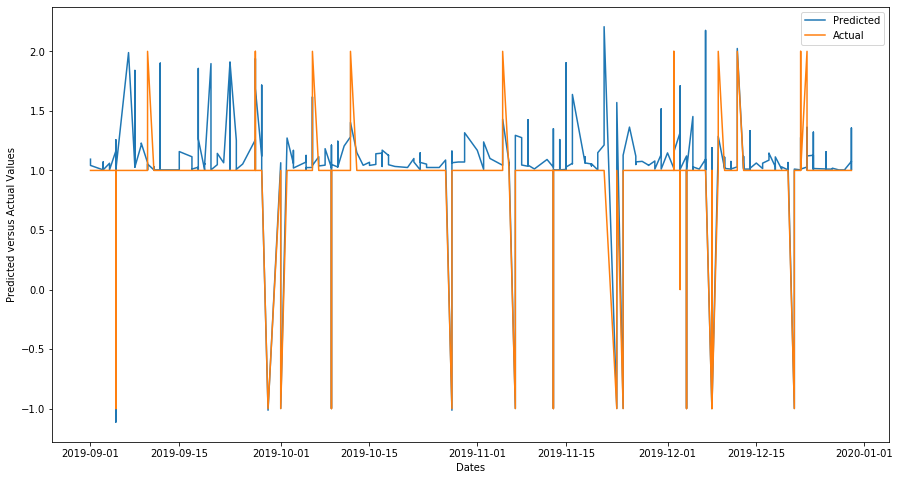

[19:35:35] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for salmon arm department11= 0.065


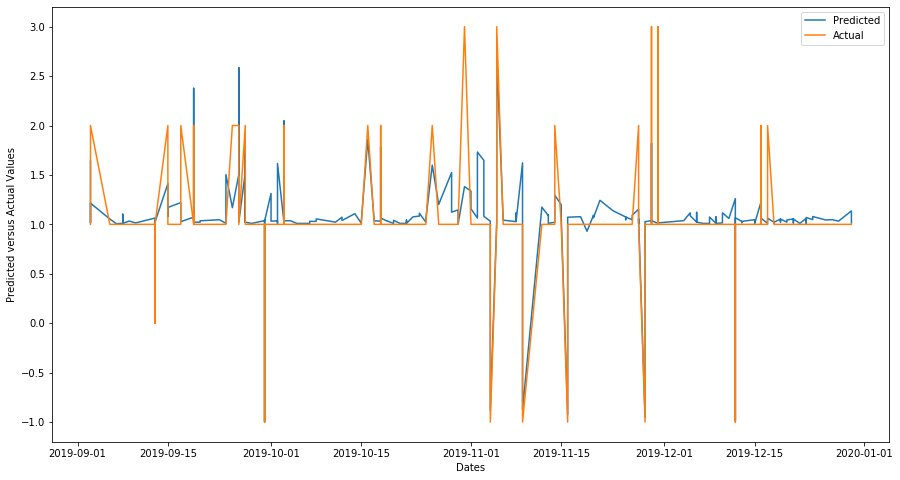

[19:36:01] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for salmon arm department12= 0.011


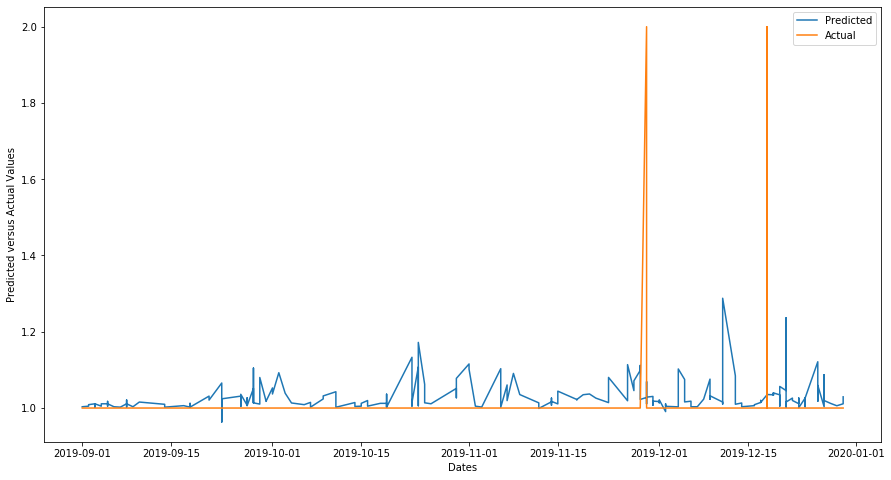

No records to test for salmon arm city department13
No records to test for salmon arm city department7
No records to test for salmon arm city department8
No records to test for salmon arm city department9
No records to test for salmon arm city department10
[19:36:57] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for quesnel department3= 0.080


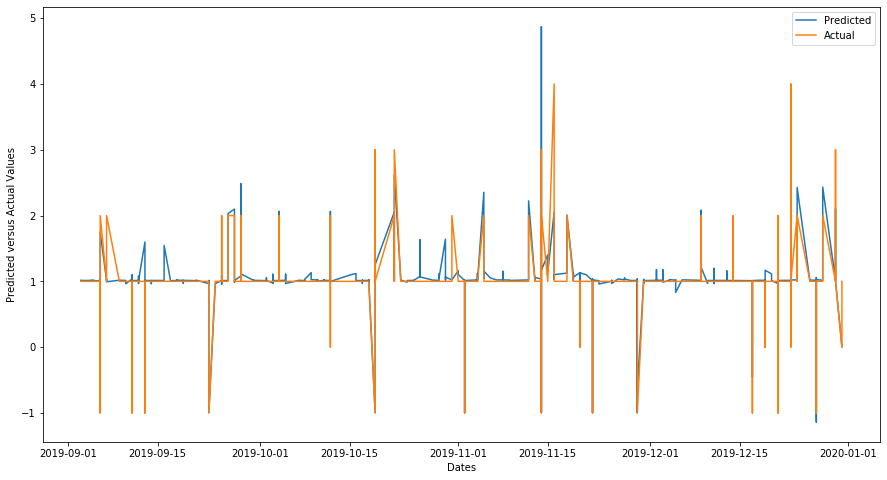

[19:39:28] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for quesnel department2= 0.079


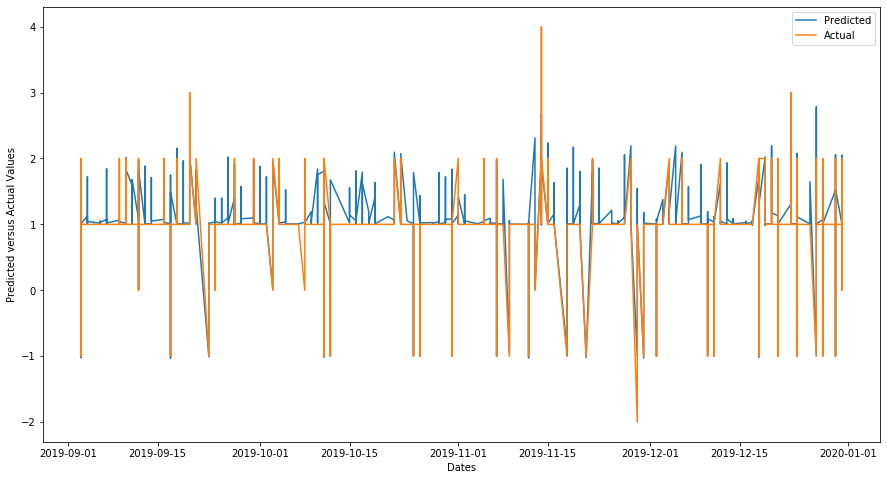

No records to test for quesnel city department5
[19:39:48] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for quesnel department4= 0.018


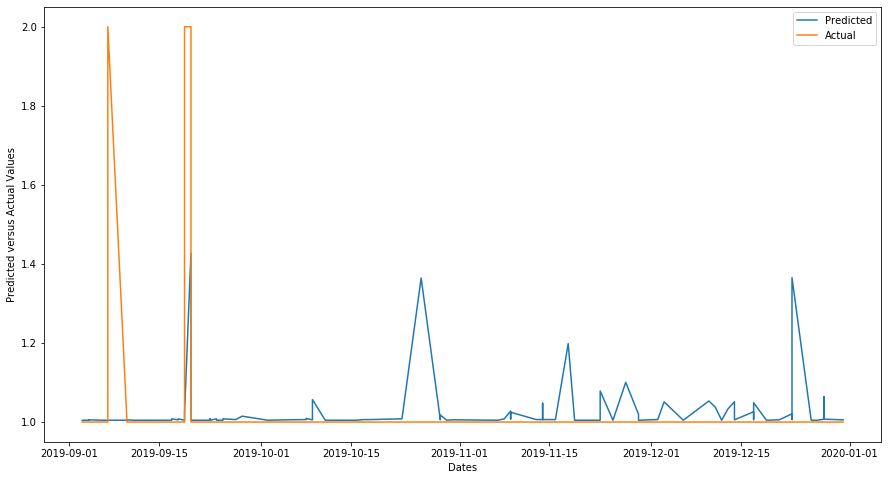

[19:40:19] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for quesnel department1= 0.039


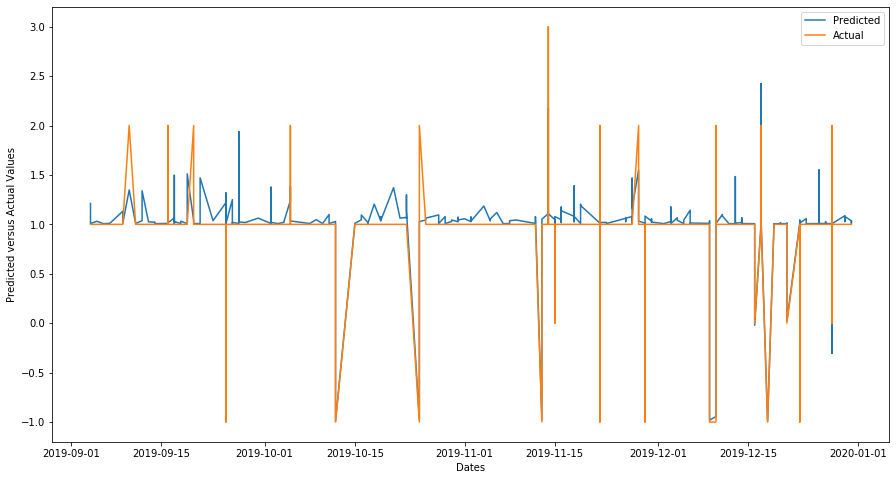

[19:40:33] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for quesnel department11= 0.330


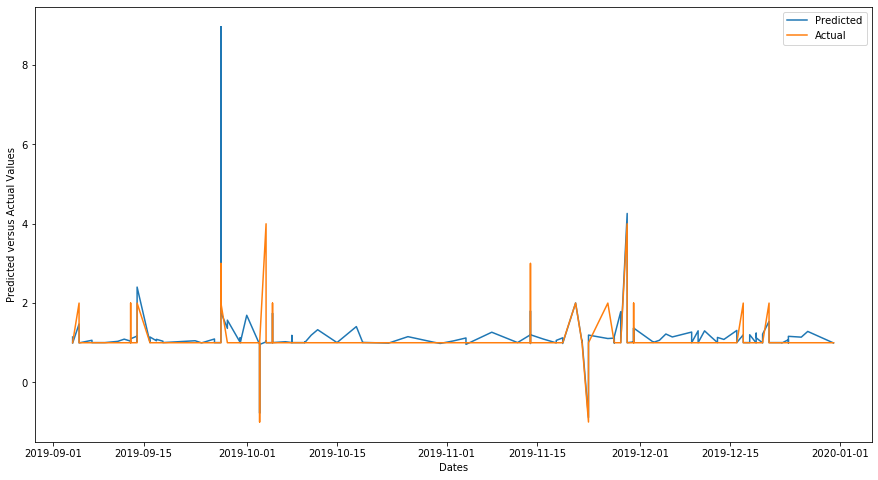

[19:40:53] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for quesnel department12= 0.009


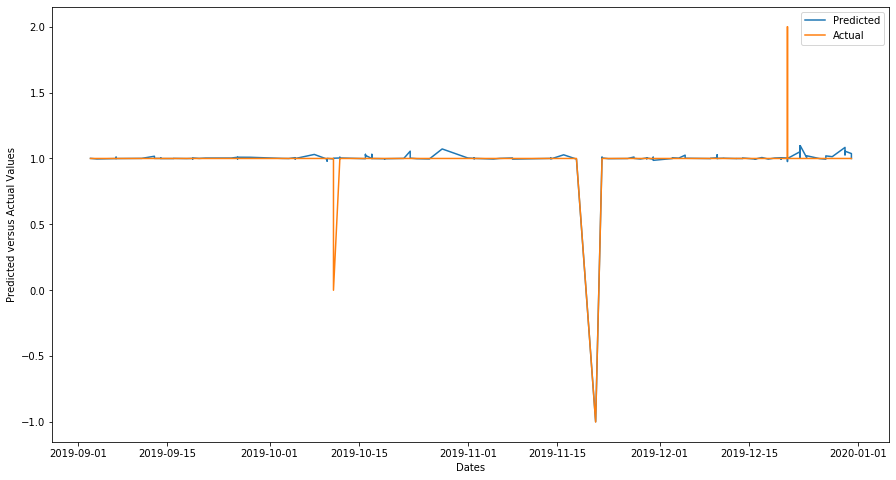

No records to test for quesnel city department13
No records to test for quesnel city department7
No records to test for quesnel city department8
No records to test for quesnel city department9
No records to test for quesnel city department10
[19:41:38] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for edmonton department3= 0.042


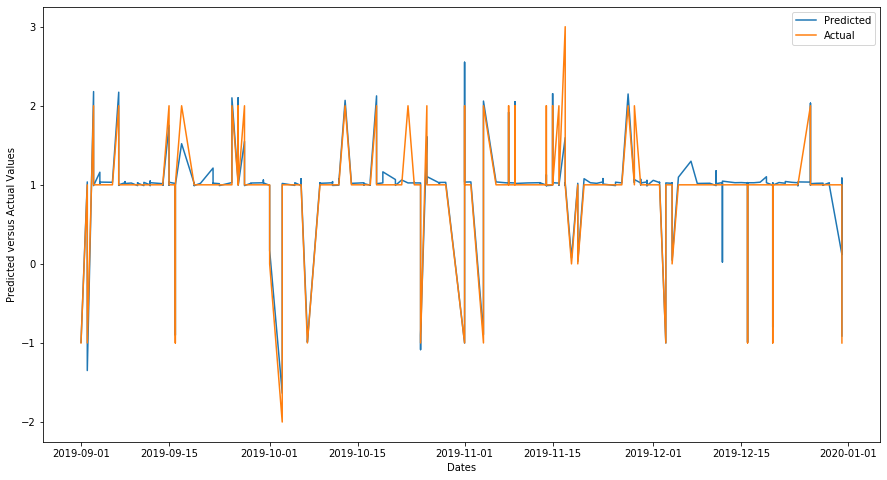

[19:44:20] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for edmonton department2= 0.145


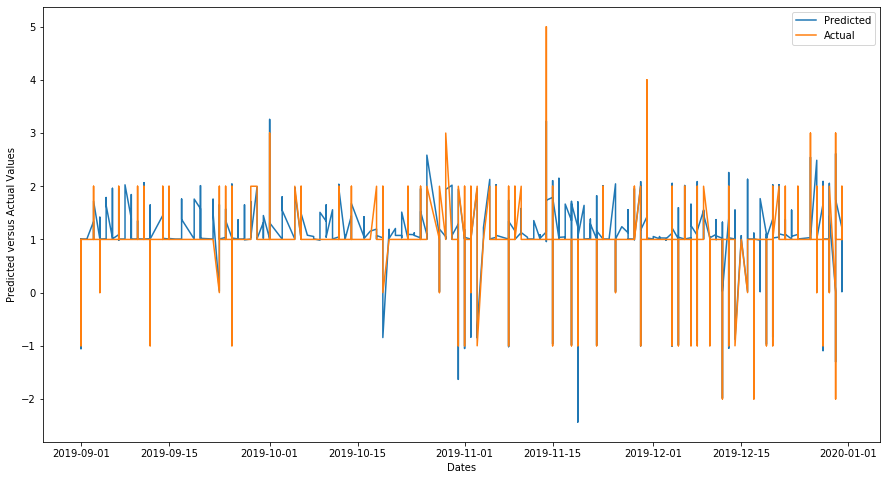

No records to test for edmonton city department5
[19:44:47] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for edmonton department4= 0.113


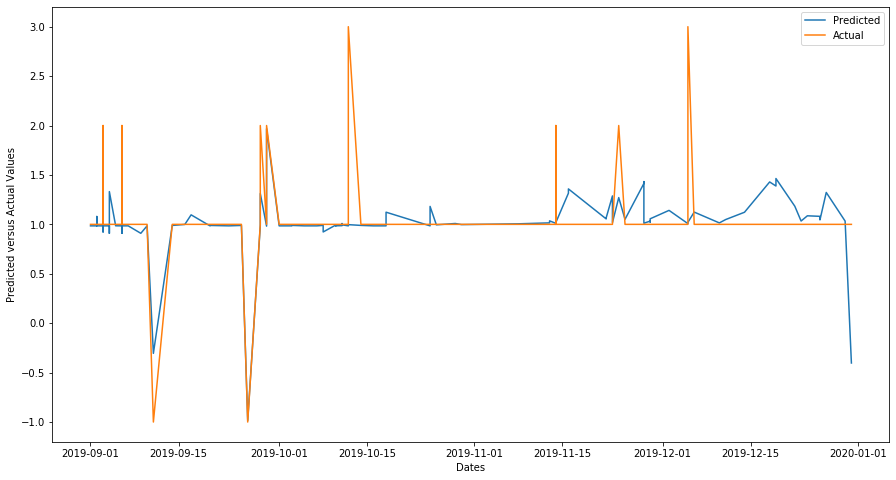

[19:45:28] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for edmonton department1= 0.047


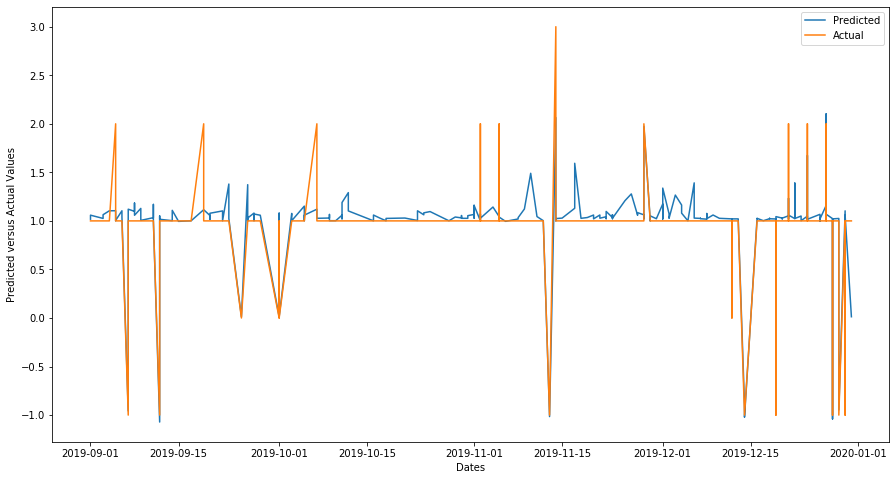

[19:45:45] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for edmonton department11= 0.120


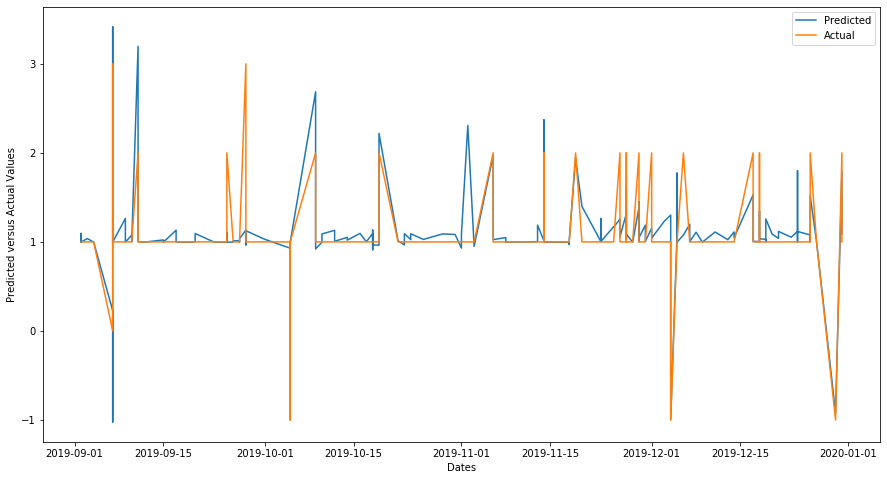

[19:46:14] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for edmonton department12= 0.010


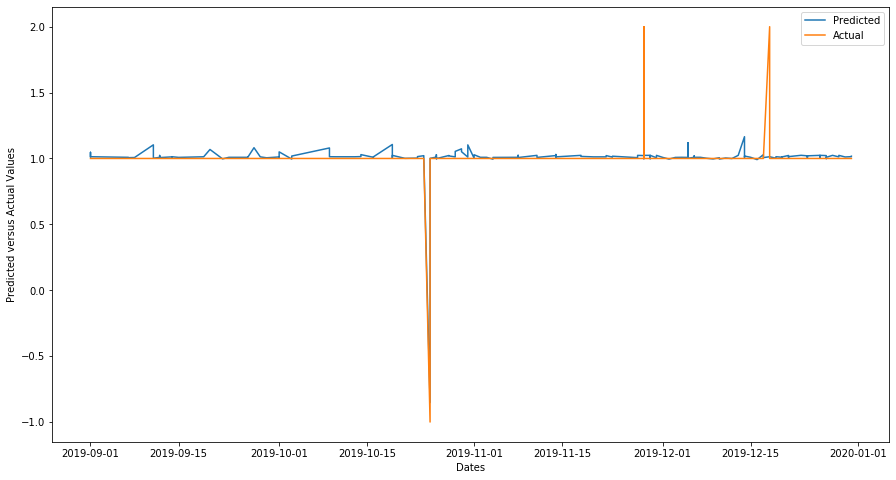

No records to test for edmonton city department13
No records to test for edmonton city department7
No records to test for edmonton city department8
No records to test for edmonton city department9
No records to test for edmonton city department10
[19:48:49] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for port alberni department3= 0.097


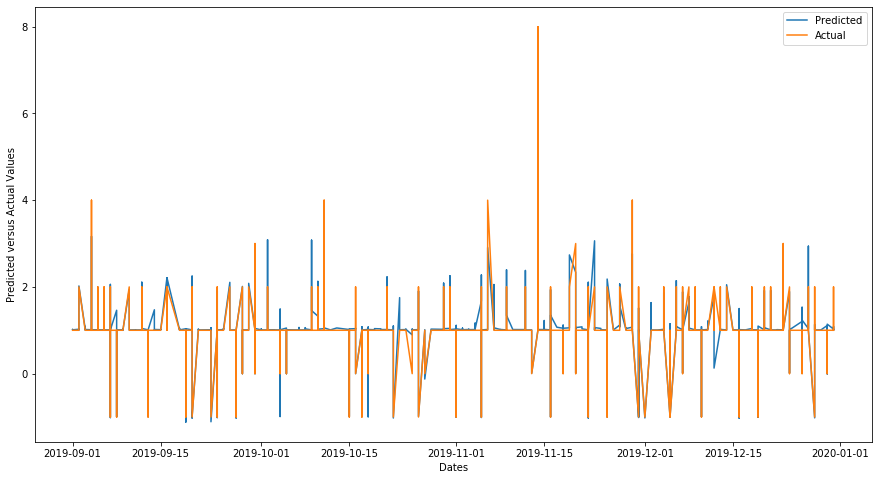

[19:56:14] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for port alberni department2= 0.117


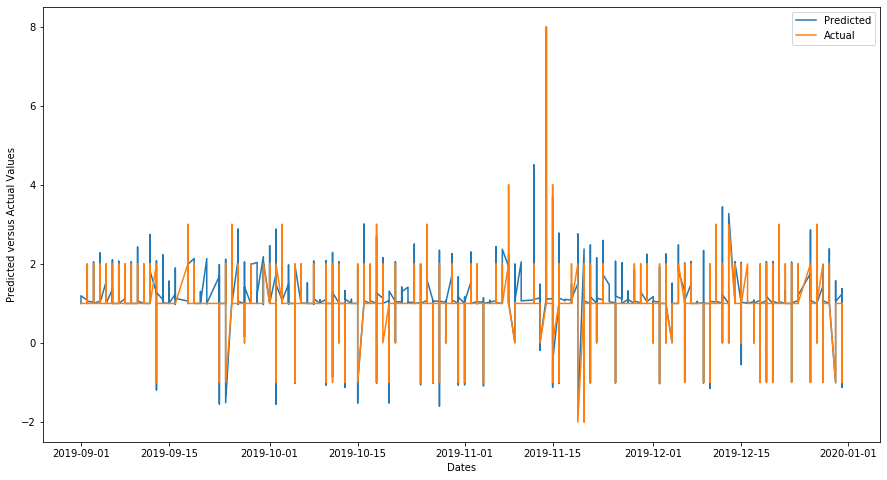

No records to test for port alberni city department5
[19:57:01] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for port alberni department4= 0.050


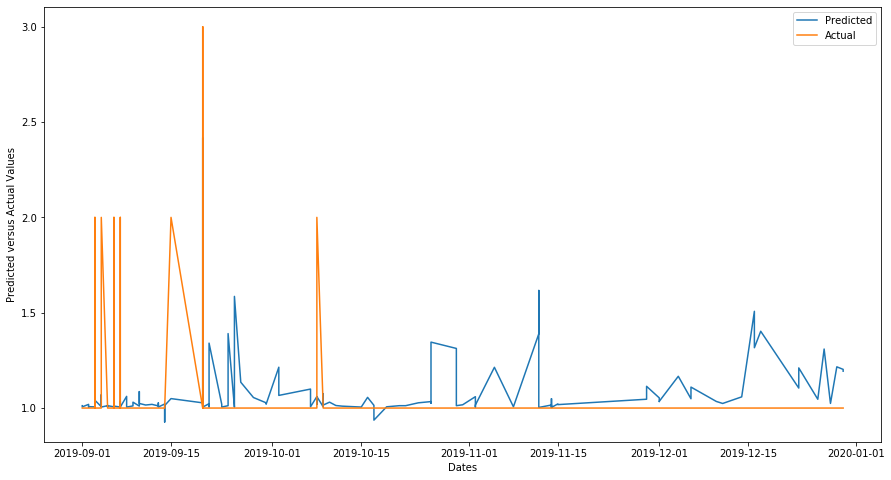

[19:58:43] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for port alberni department1= 0.080


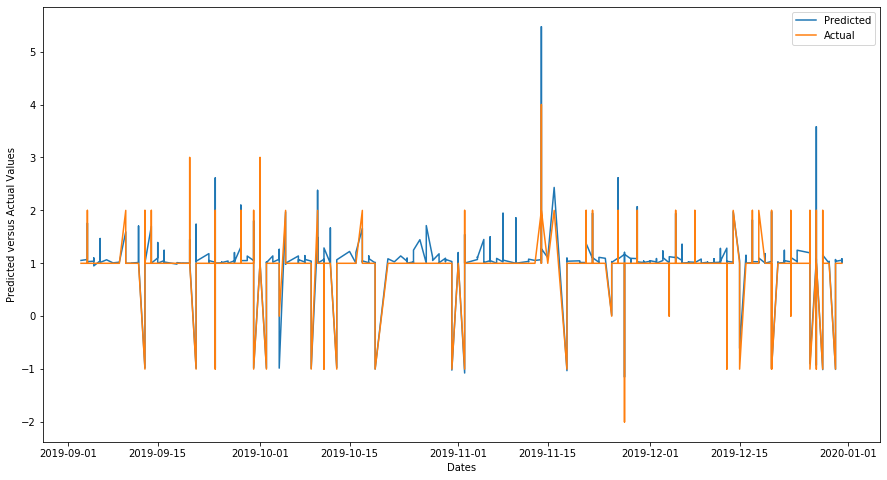

[19:59:10] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for port alberni department11= 0.169


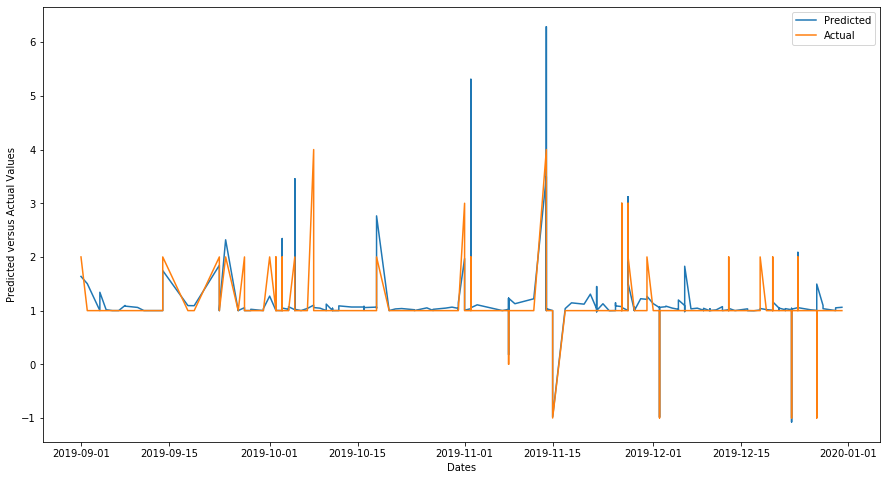

[19:59:52] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for port alberni department12= 0.041


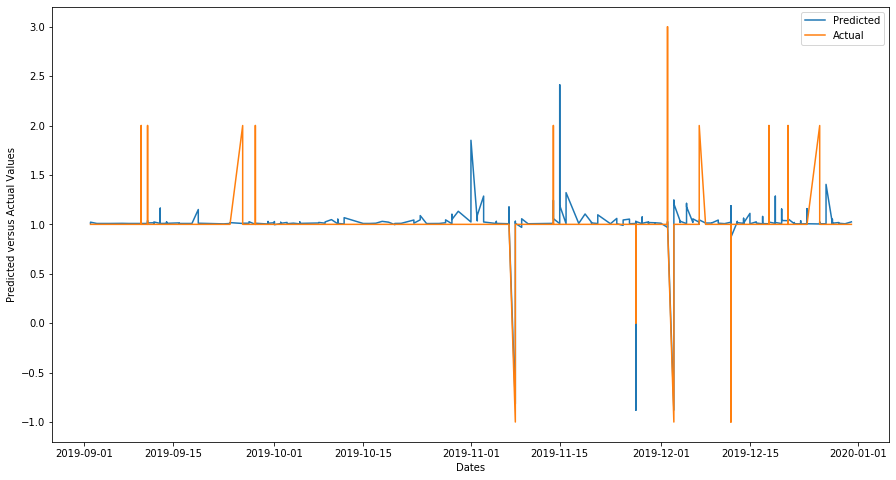

No records to test for port alberni city department13
No records to test for port alberni city department7
No records to test for port alberni city department8
No records to test for port alberni city department9
No records to test for port alberni city department10
[20:04:34] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for calgary department3= 0.127


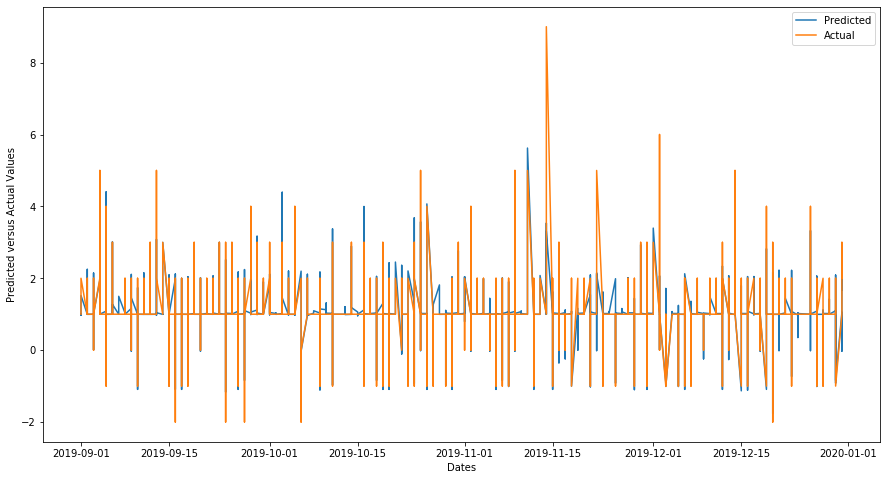

[20:20:10] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for calgary department2= 0.201


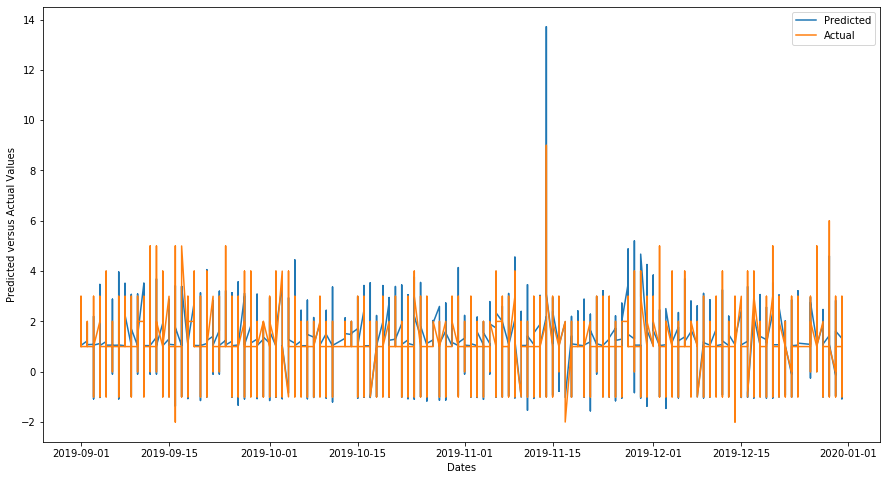

[20:20:23] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for calgary department5= 0.161


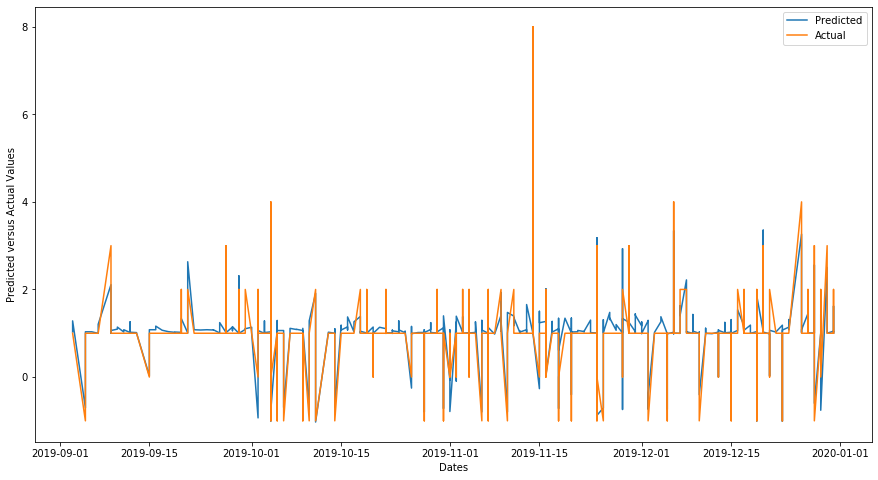

[20:22:05] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for calgary department4= 0.105


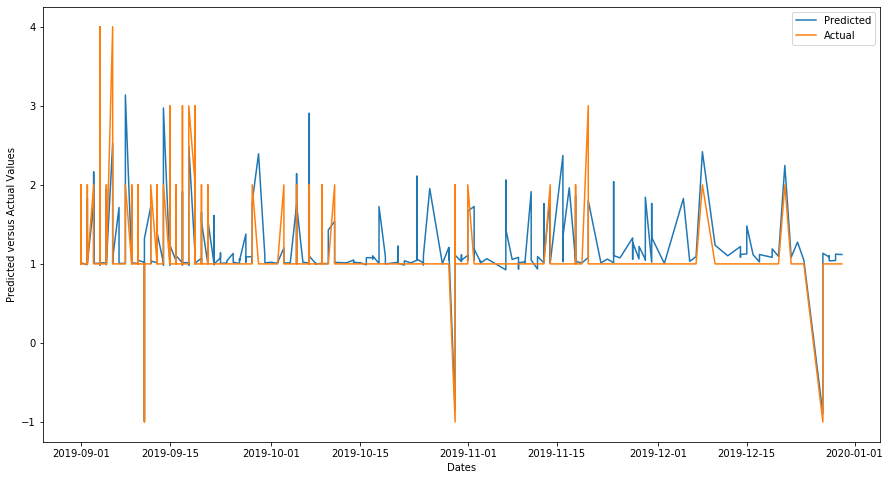

[20:24:38] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for calgary department1= 0.103


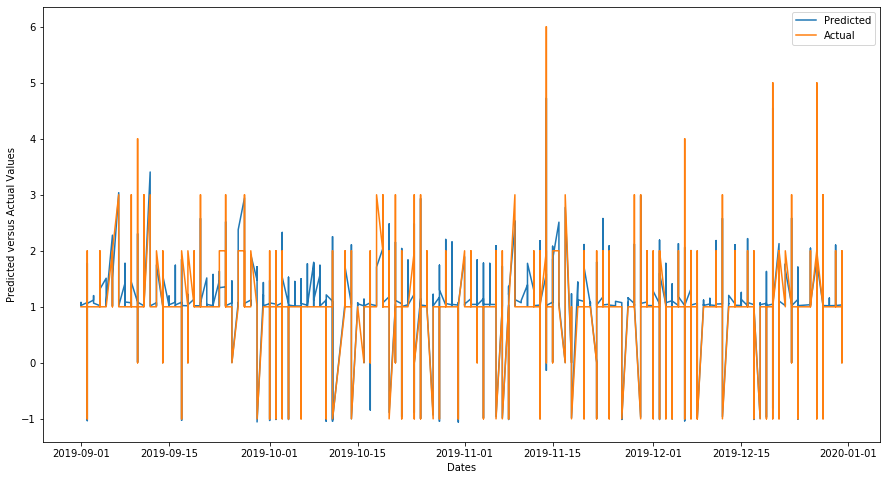

[20:25:32] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for calgary department11= 0.149


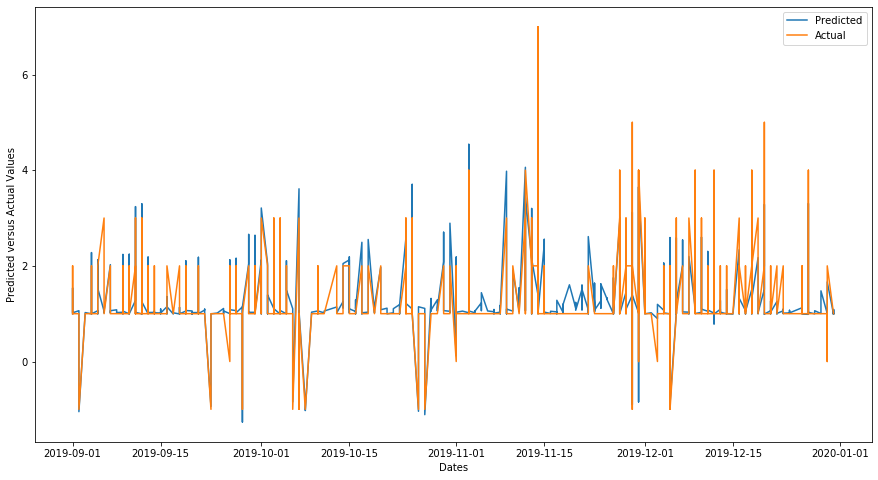

[20:26:46] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for calgary department12= 0.043


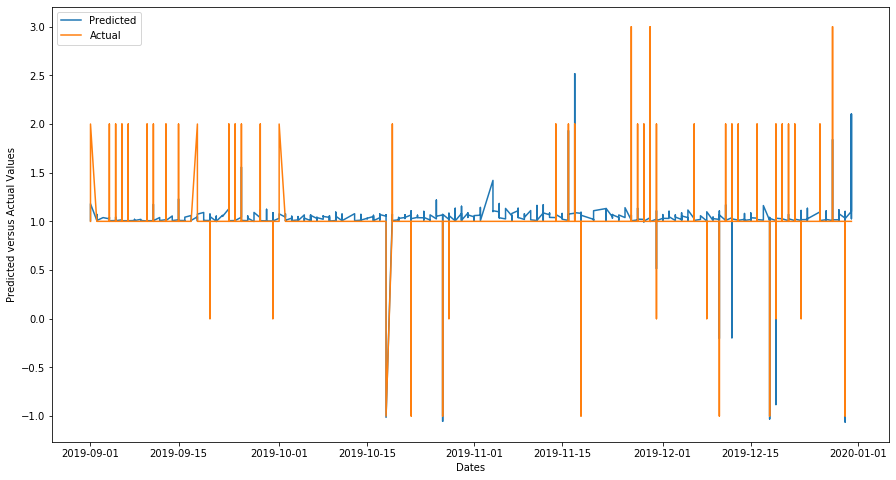

No records to test for calgary city department13
No records to test for calgary city department7
No records to test for calgary city department8
No records to test for calgary city department9
No records to test for calgary city department10
No records to test for nelson city department3
No records to test for nelson city department2
No records to test for nelson city department5
No records to test for nelson city department4
No records to test for nelson city department1
No records to test for nelson city department11
No records to test for nelson city department12
No records to test for nelson city department13
No records to test for nelson city department7
No records to test for nelson city department8
No records to test for nelson city department9
No records to test for nelson city department10
[20:27:51] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for olds department3= 0.046


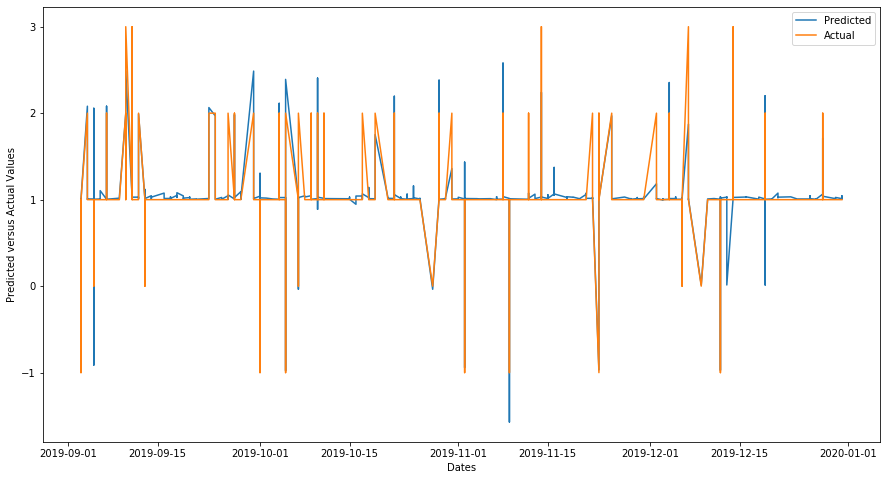

[20:31:06] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for olds department2= 0.117


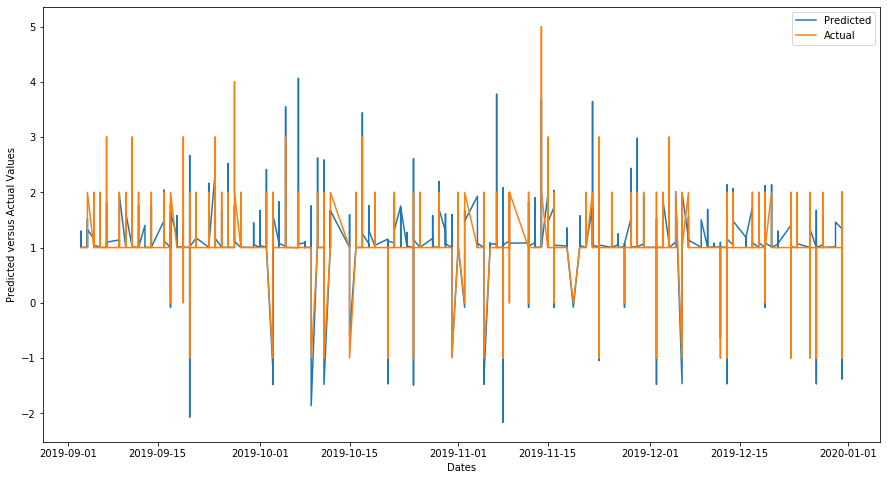

No records to test for olds city department5
[20:31:34] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for olds department4= 0.057


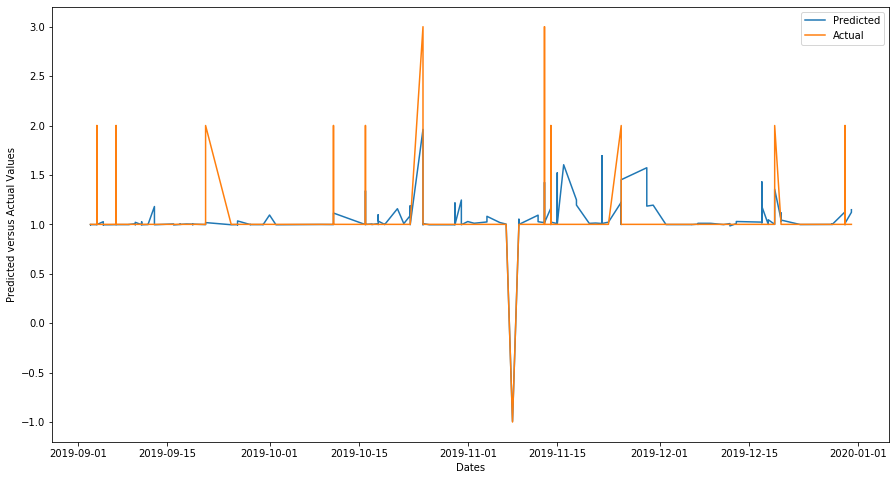

[20:32:19] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for olds department1= 0.074


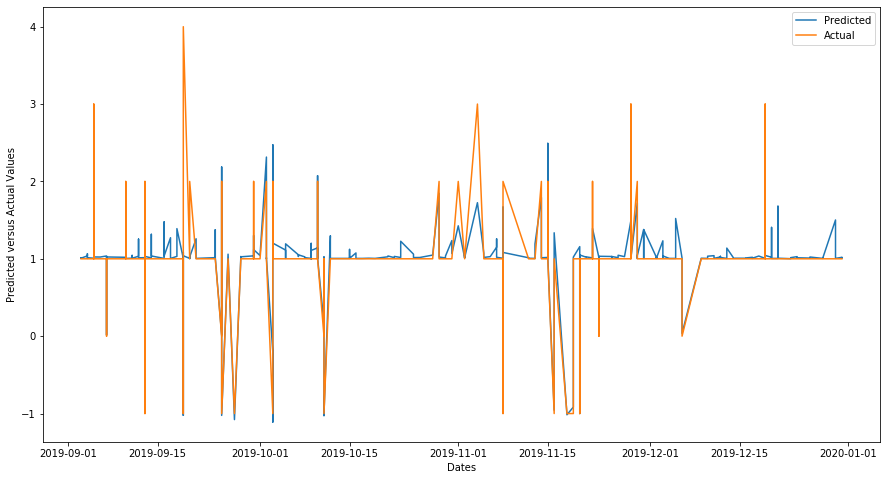

[20:32:35] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for olds department11= 0.184


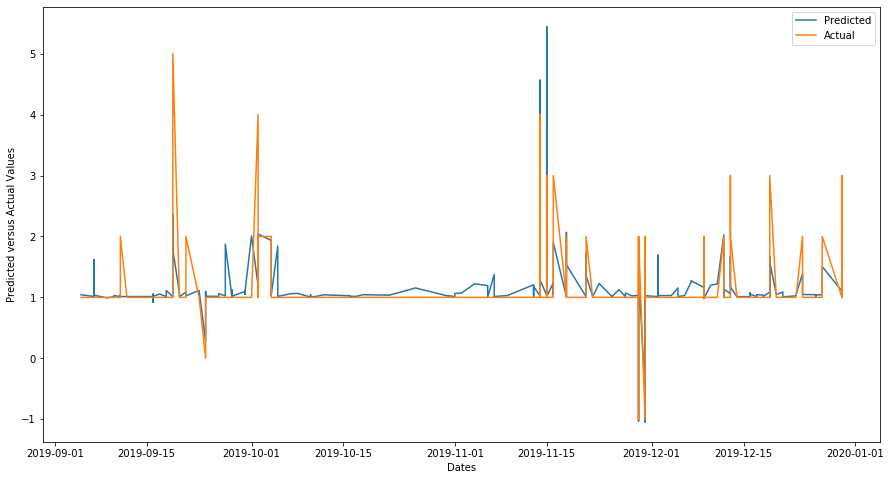

[20:33:00] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for olds department12= 0.042


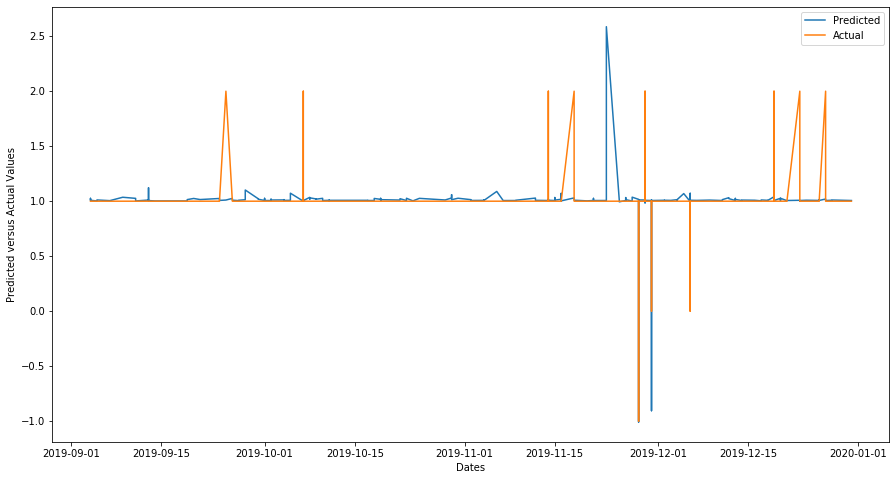

No records to test for olds city department13
No records to test for olds city department7
No records to test for olds city department8
No records to test for olds city department9
No records to test for olds city department10
[20:34:14] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for trail department3= 0.061


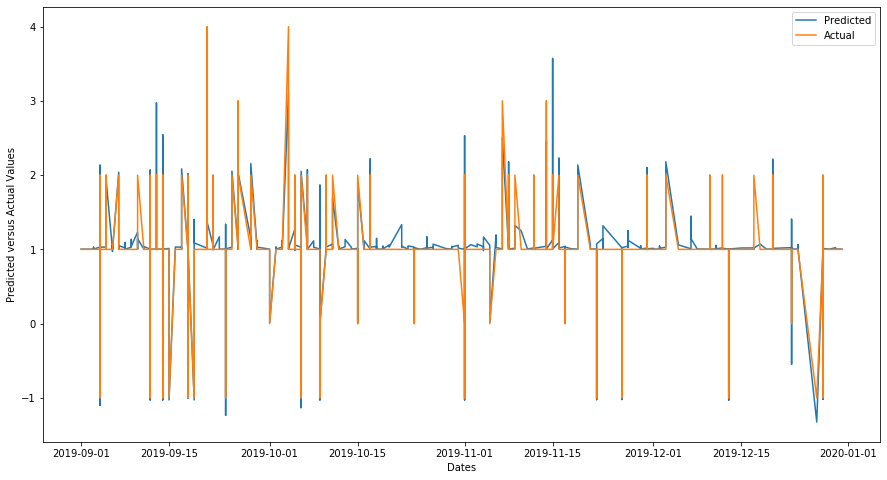

[20:37:09] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for trail department2= 0.095


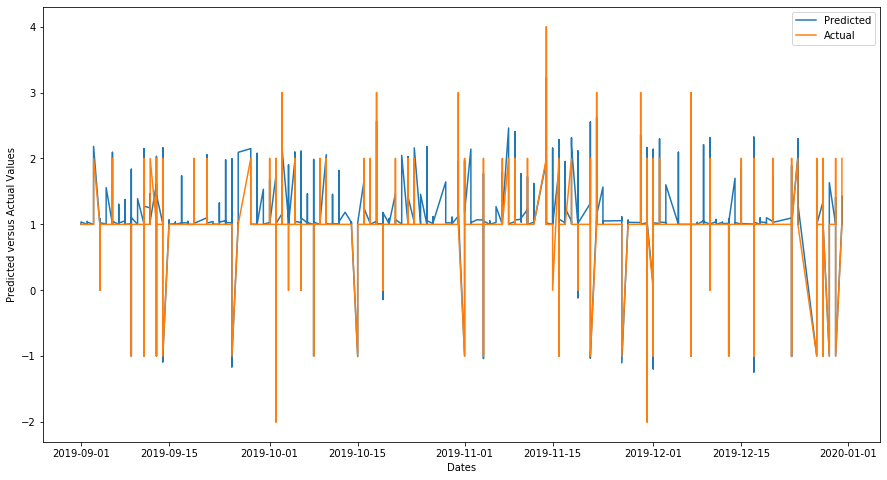

No records to test for trail city department5
[20:37:31] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for trail department4= 0.016


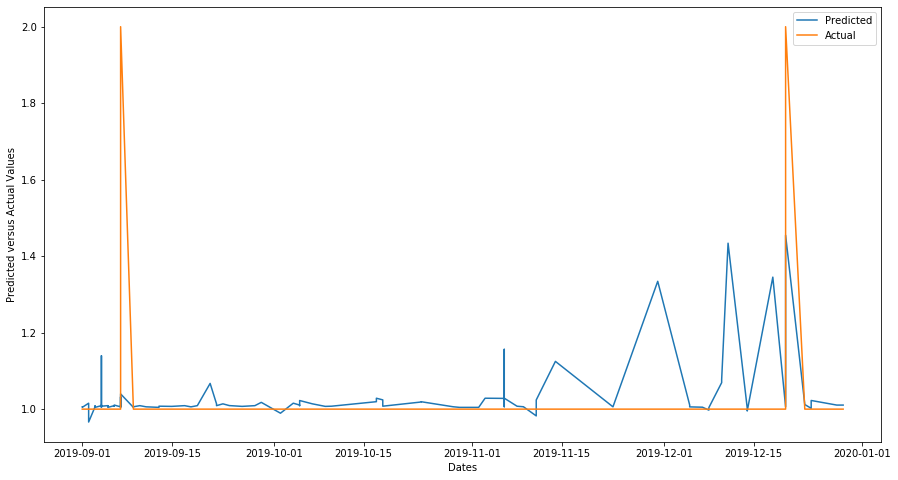

[20:38:10] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for trail department1= 0.062


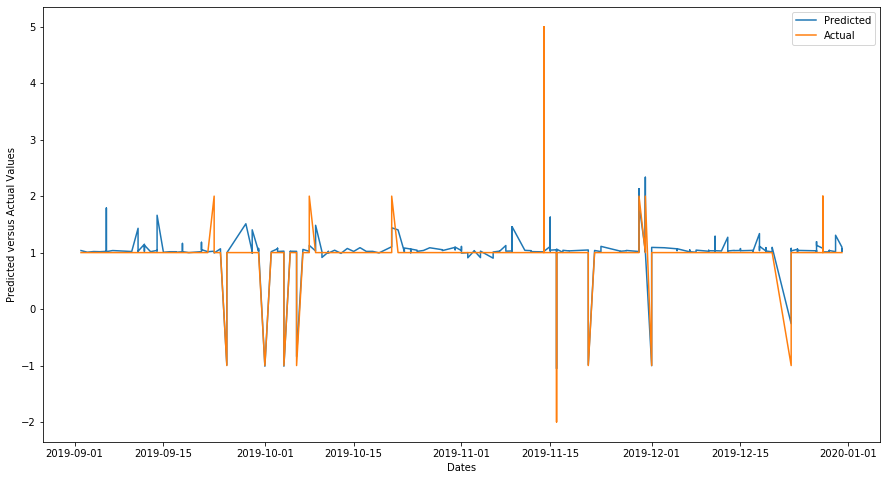

[20:38:24] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for trail department11= 0.195


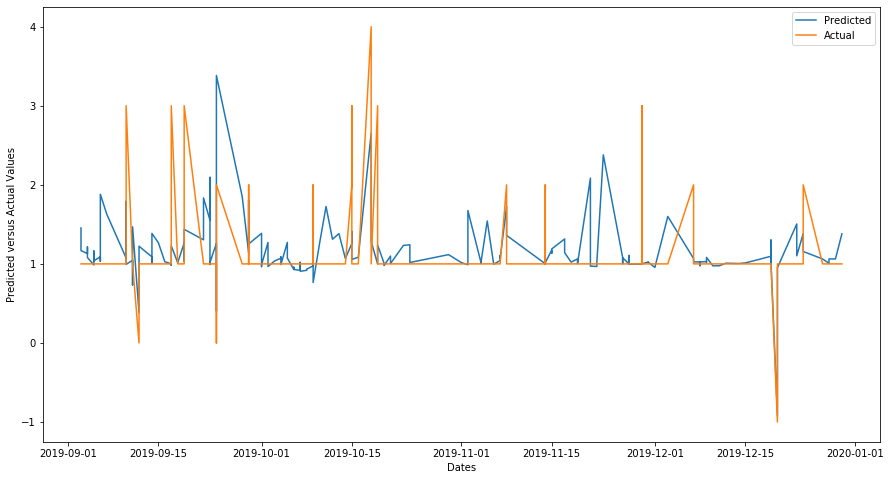

[20:38:46] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for trail department12= 0.009


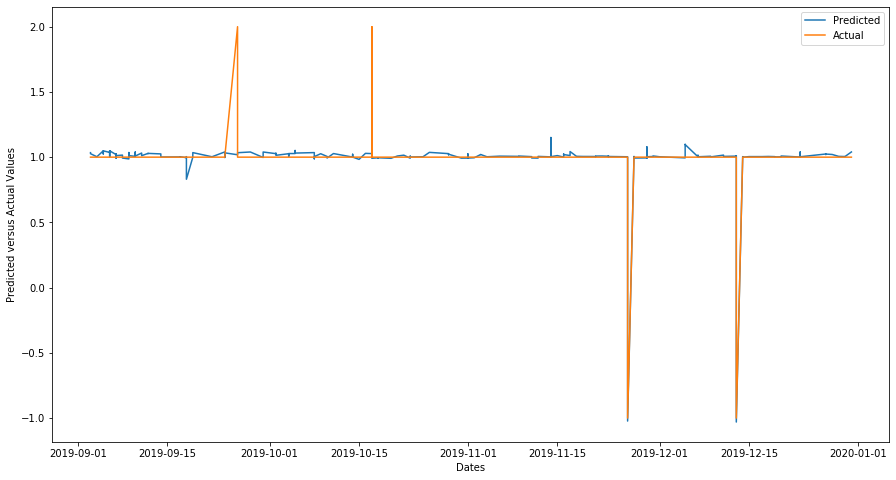

No records to test for trail city department13
No records to test for trail city department7
No records to test for trail city department8
No records to test for trail city department9
No records to test for trail city department10
[20:40:14] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for penticton department3= 0.075


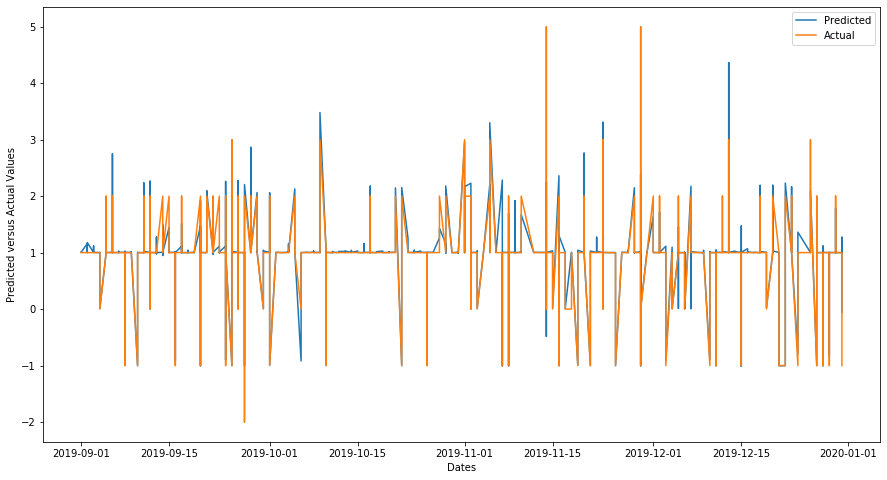

[20:44:12] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for penticton department2= 0.156


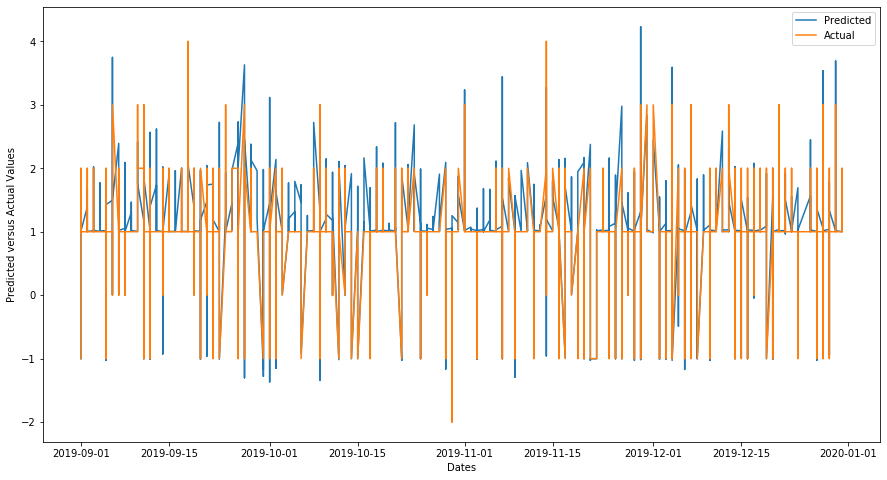

No records to test for penticton city department5
[20:44:55] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for penticton department4= 0.132


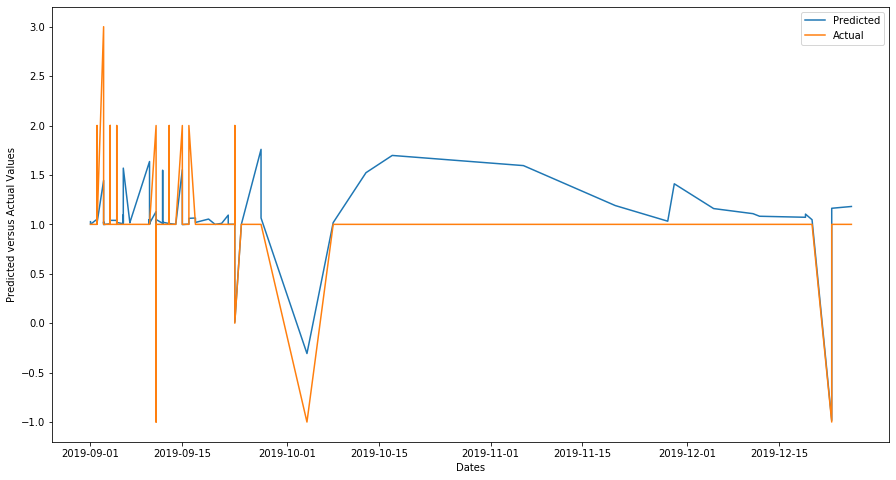

[20:45:40] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for penticton department1= 0.072


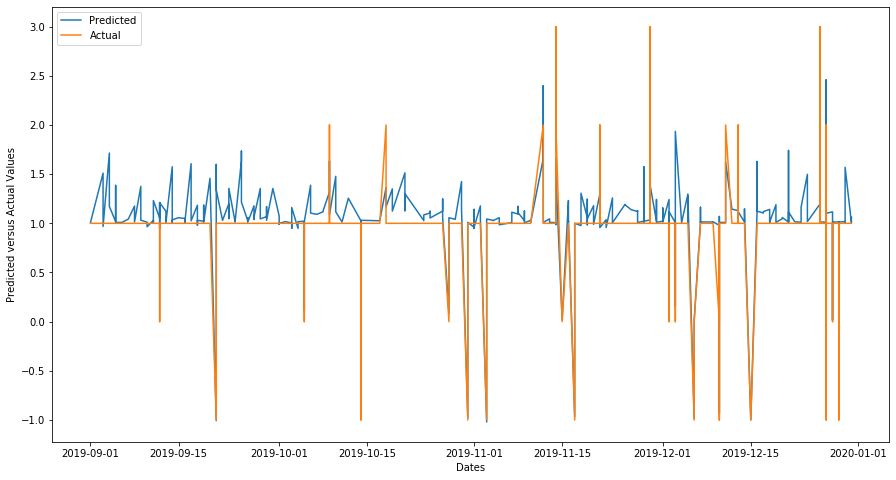

[20:46:02] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for penticton department11= 0.062


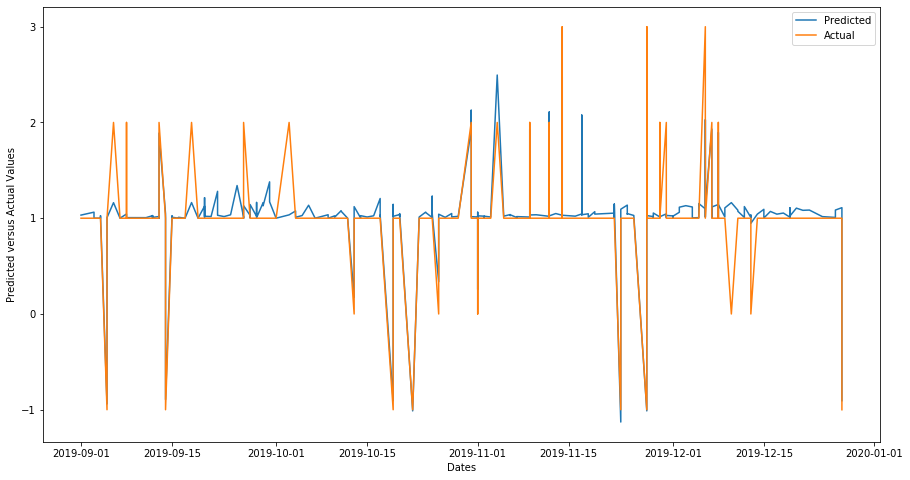

[20:46:29] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for penticton department12= 0.019


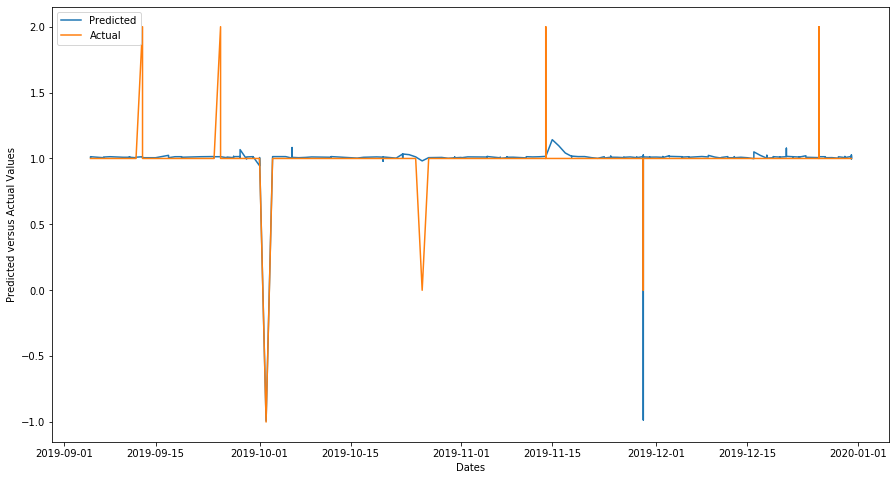

No records to test for penticton city department13
No records to test for penticton city department7
No records to test for penticton city department8
No records to test for penticton city department9
No records to test for penticton city department10
[20:47:07] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for swift current department3= 0.062


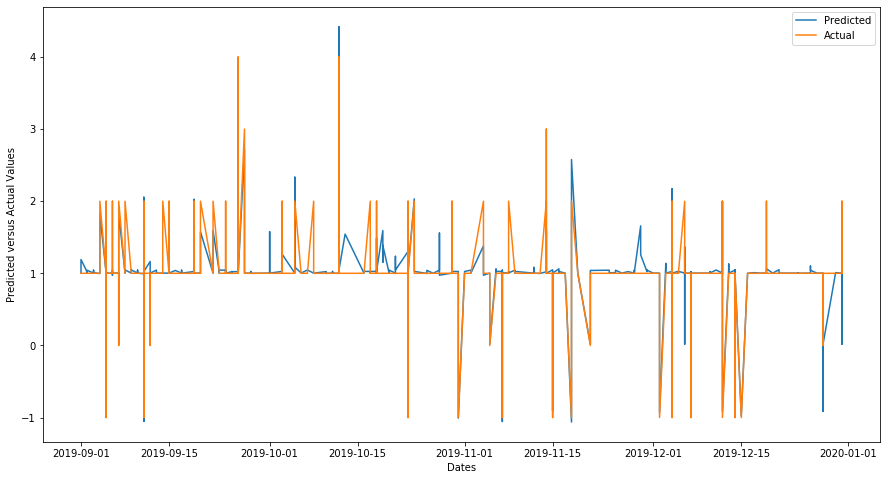

[20:49:03] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for swift current department2= 0.145


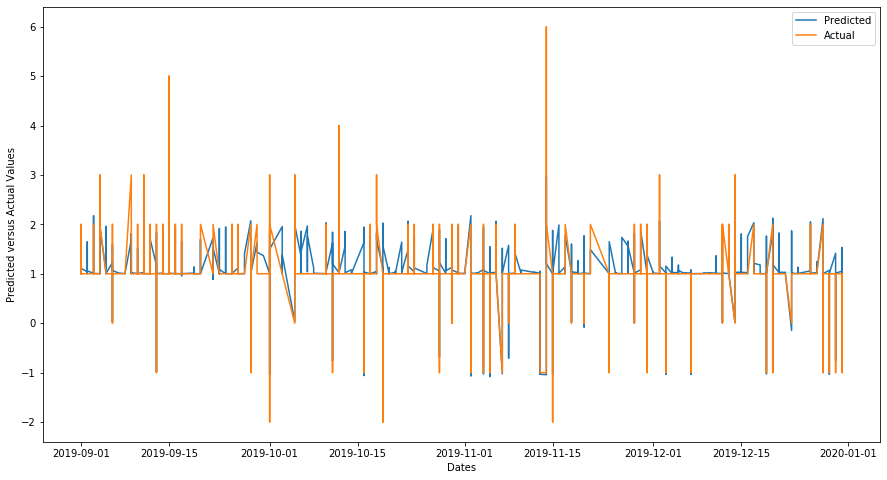

No records to test for swift current city department5
[20:49:20] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for swift current department4= 0.047


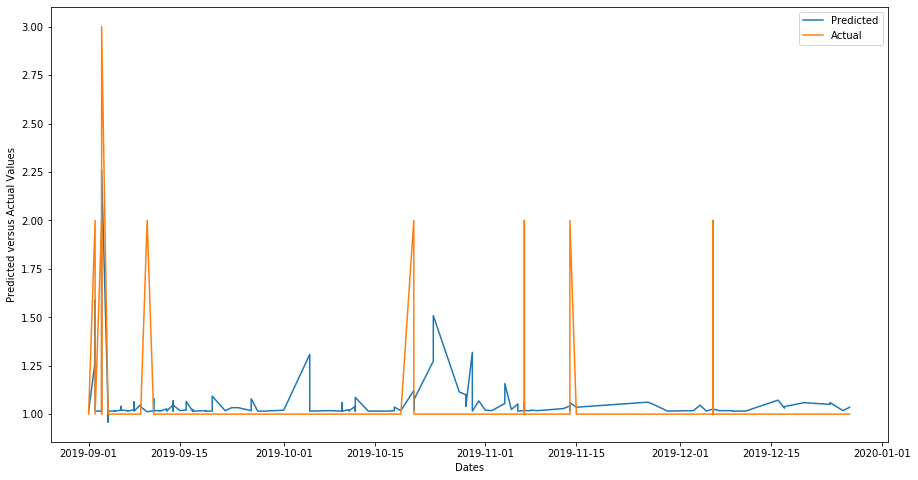

[20:49:43] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for swift current department1= 0.090


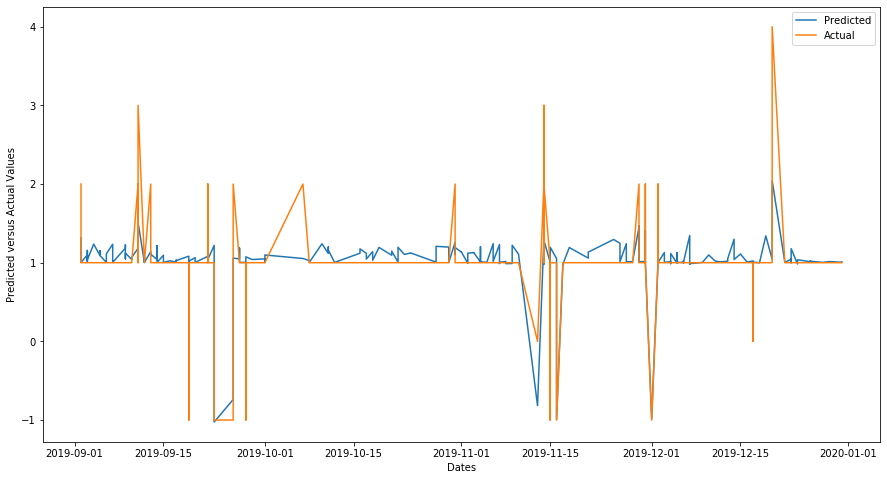

[20:49:56] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for swift current department11= 0.094


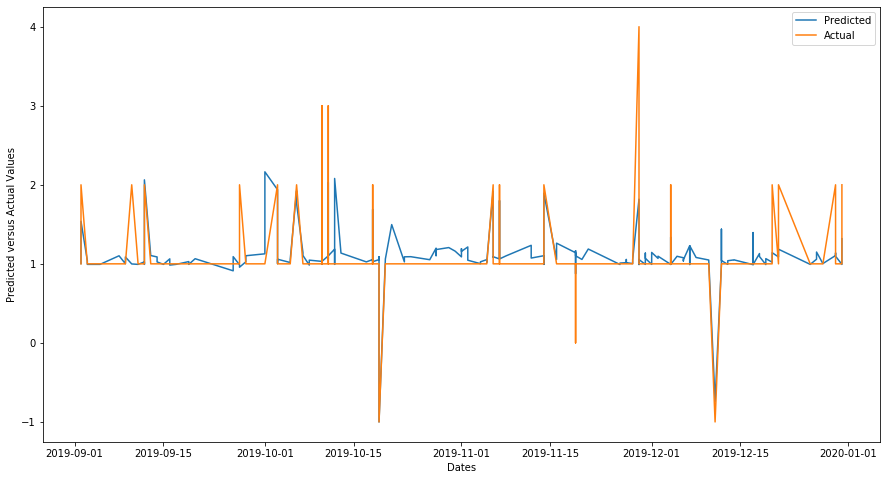

[20:50:15] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for swift current department12= 0.022


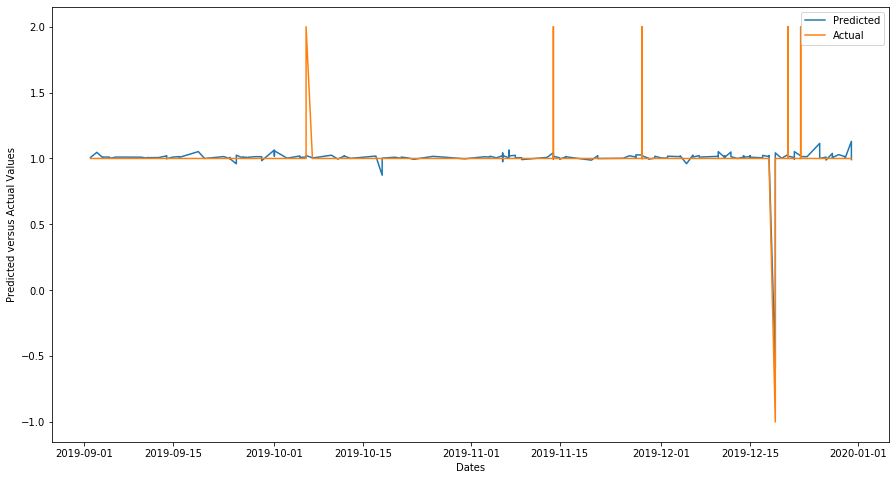

No records to test for swift current city department13
No records to test for swift current city department7
No records to test for swift current city department8
No records to test for swift current city department9
No records to test for swift current city department10
[20:52:02] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for vernon department3= 0.061


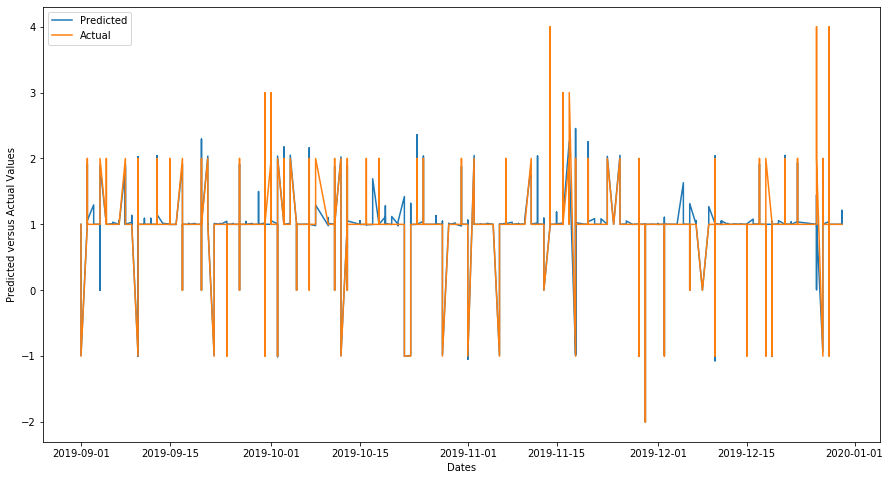

[20:56:45] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for vernon department2= 0.119


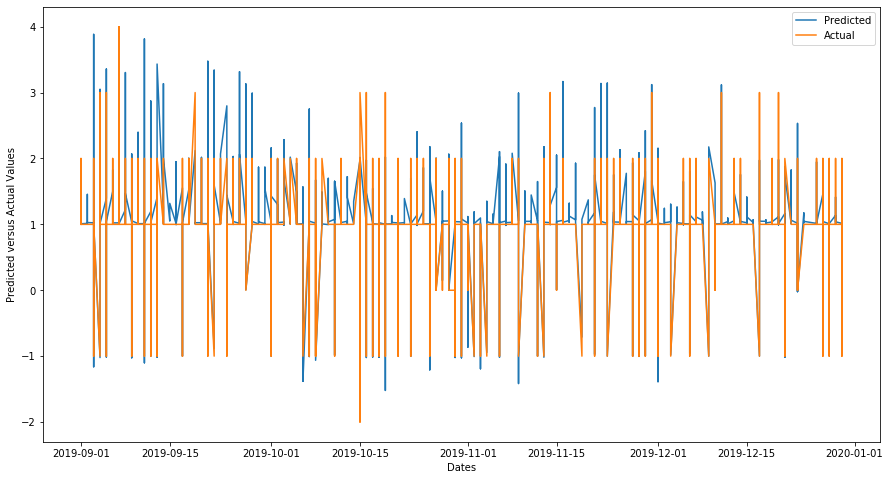

No records to test for vernon city department5
[20:57:16] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for vernon department4= 0.024


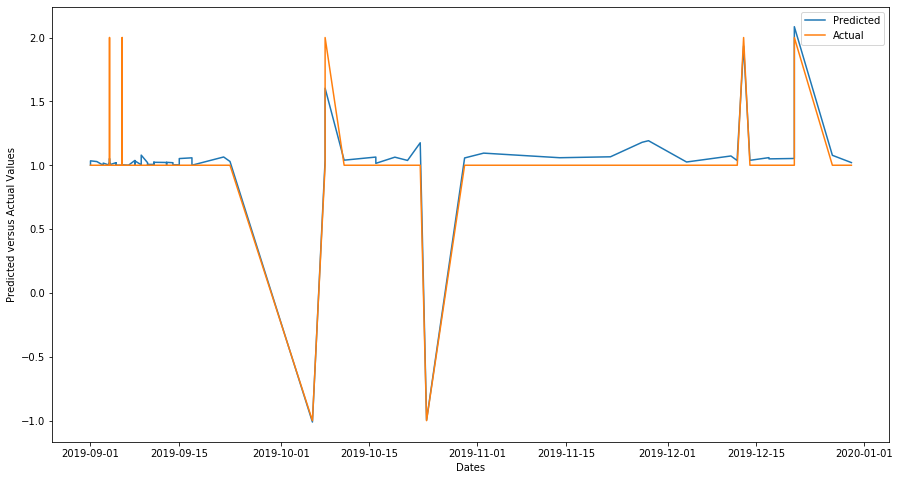

[20:58:11] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for vernon department1= 0.065


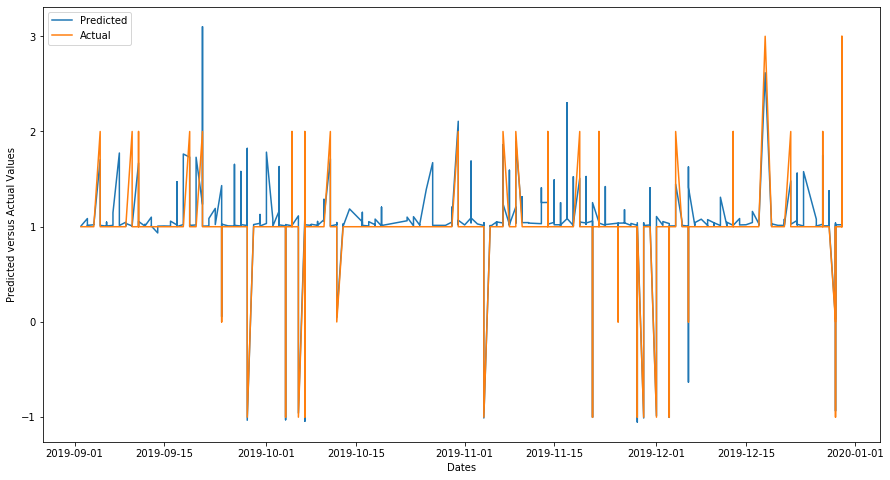

[20:58:32] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for vernon department11= 0.069


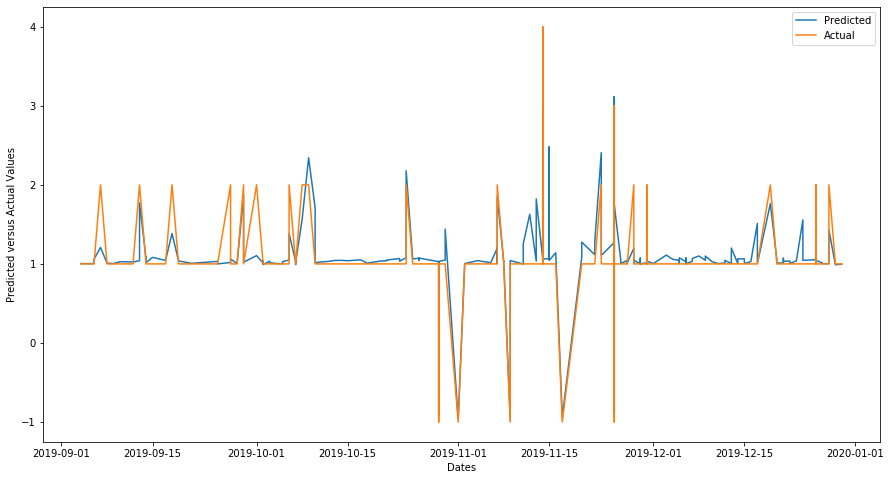

[20:58:59] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for vernon department12= 0.013


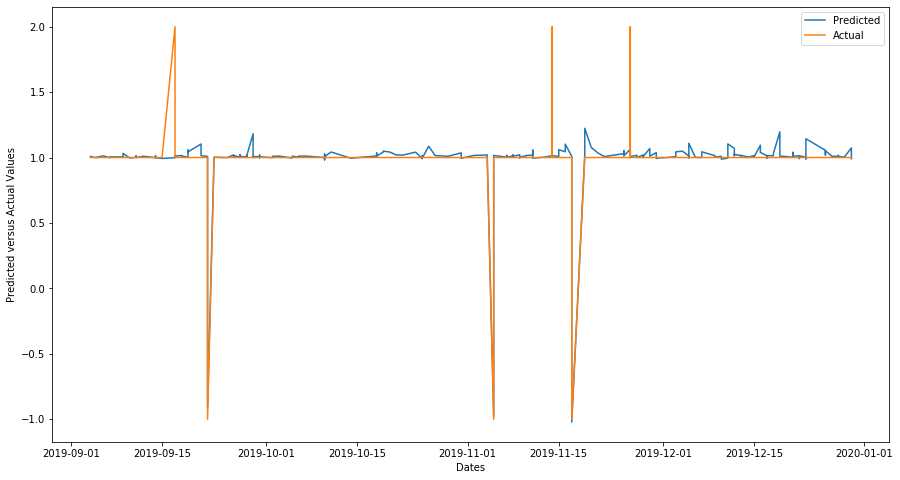

No records to test for vernon city department13
No records to test for vernon city department7
No records to test for vernon city department8
No records to test for vernon city department9
No records to test for vernon city department10
[20:59:20] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for terrace department3= 0.052


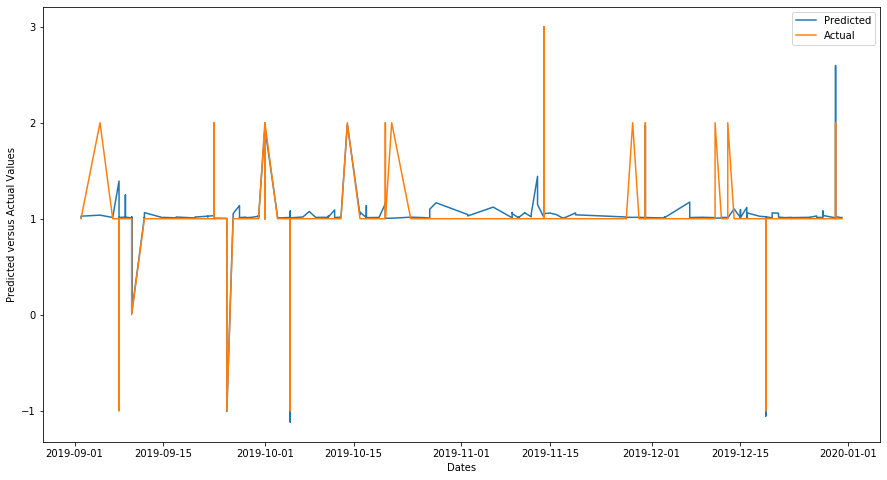

[21:00:36] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for terrace department2= 0.121


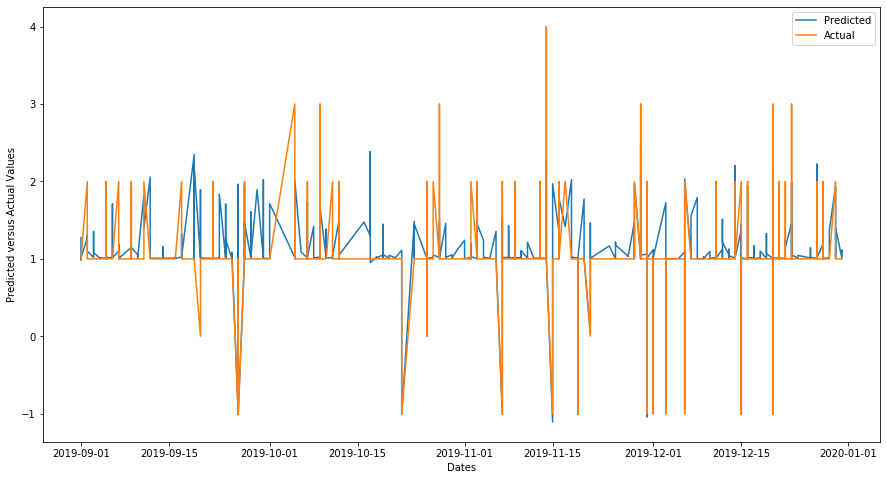

No records to test for terrace city department5
[21:00:51] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for terrace department4= 0.047


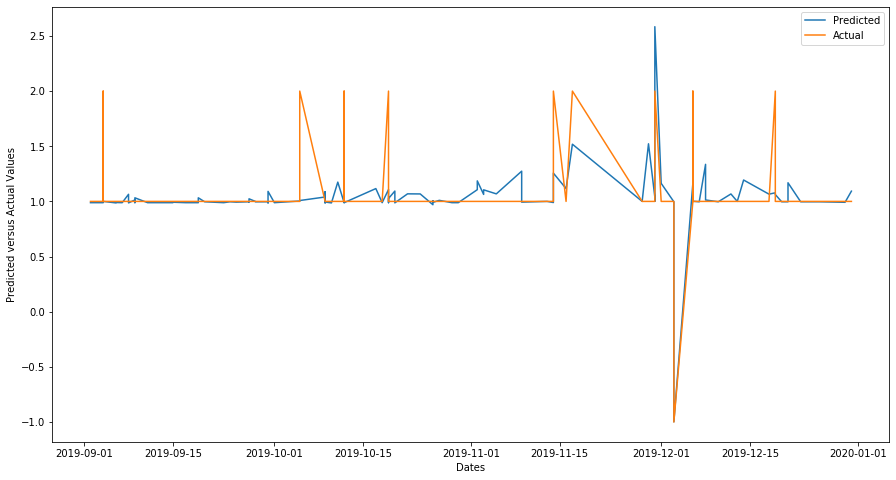

[21:01:06] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for terrace department1= 0.039


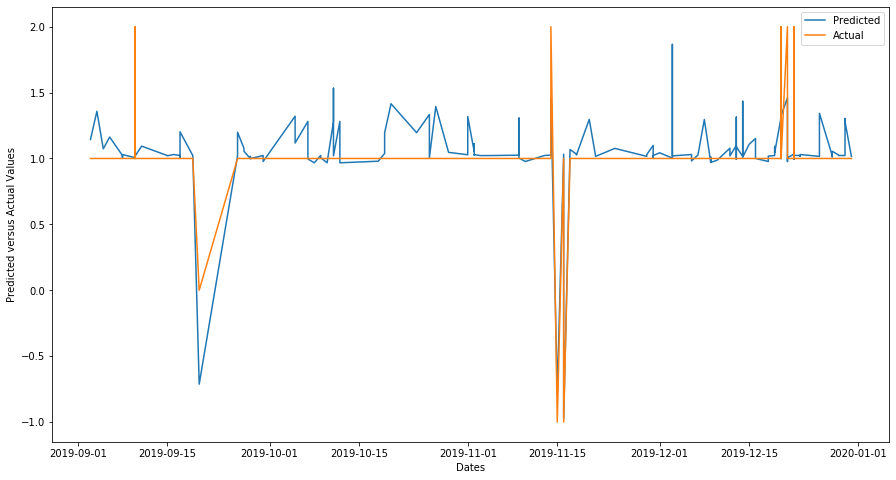

[21:01:13] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for terrace department11= 0.067


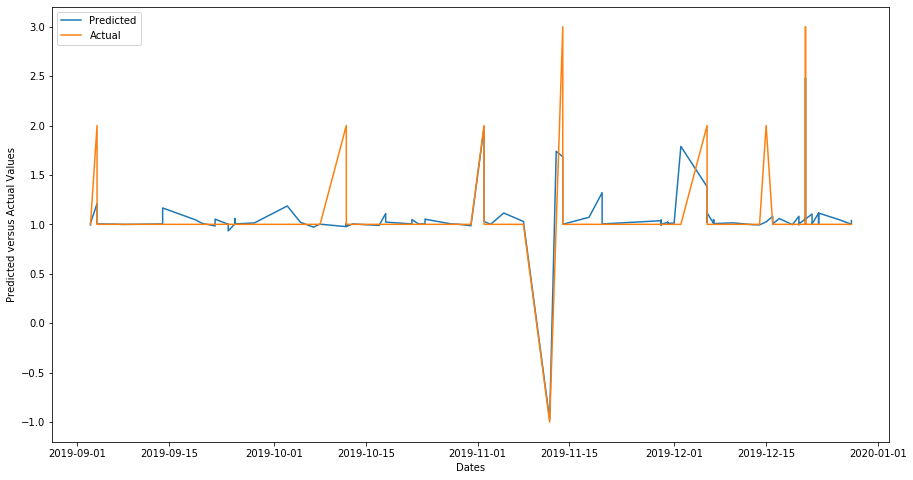

[21:01:22] WARNING: /workspace/src/objective/regression_obj.cu:167: reg:linear is now deprecated in favor of reg:squarederror.
RMSE loss for terrace department12= 0.001


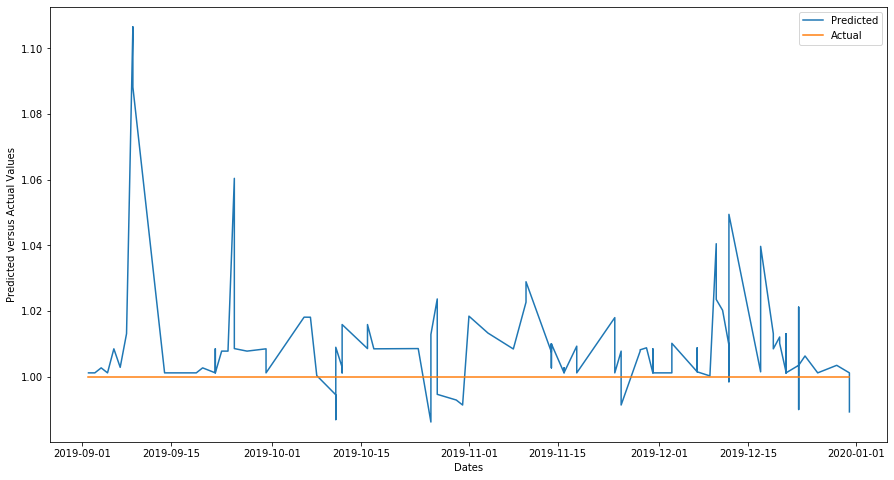

No records to test for terrace city department13
No records to test for terrace city department7
No records to test for terrace city department8
No records to test for terrace city department9
No records to test for terrace city department10


In [43]:
ST_W = make_city_dept_models(train,test,'st',True)

In [44]:
columns=['RMSE_st_w','MAE_st_w','R2_st_w','city','department','time_st_w']
df_st_w= pd.DataFrame(ST_W,columns=columns)

In [45]:
df_st_w[['RMSE_st_w','MAE_st_w','R2_st_w','time_st_w']].mean()

RMSE_st_w     0.085354
MAE_st_w      0.121357
R2_st_w       0.544971
time_st_w    99.577516
dtype: float64

# Results:

<img src='EDA/results_department_quantity_model.png' style="width:600px;height:600px"/>